# Importing Libraries

In [ ]:
# requirement for tensorflow
# !pip install setuptools

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import sklearn as sk
import time as tm
import matplotlib.pyplot as plt
import warnings
import shap

from scipy.stats import skew, kurtosis, loguniform
from scipy import stats

from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler, MinMaxScaler

# Linear regression
from sklearn.linear_model import LinearRegression
import statsmodels.formula.api as smf
import statsmodels.api as sm

# Regularization - Ridge and Lasso regression (linear regressions)
from sklearn.linear_model import Ridge, RidgeCV
from sklearn.linear_model import Lasso, LassoCV

# Polynomial regression
from sklearn.preprocessing import PolynomialFeatures

# Other non-linear regression (and tuning mechanism)
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, HistGradientBoostingRegressor
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
from catboost import CatBoostRegressor

# Regression metrics
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

# Deep Learning
from setuptools import distutils
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Input, Activation


warnings.simplefilter(action='ignore', category=FutureWarning)

# Parameters for all plots
sns.set_context("paper", rc={"font.size":15,
                             "axes.titlesize":15,
                             "axes.labelsize":15})
plt.rcParams['axes.labelsize']  = 14
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12


# IQR Outliers function
def iqr(df):
    Q1 = np.percentile(df, 25, method='midpoint')
    Q3 = np.percentile(df, 75, method='midpoint')
    IQR = Q3 - Q1
    lower = Q1 - 2*IQR
    upper = Q3 + 2*IQR
    upper_array = np.where(df >= upper)[0]
    lower_array = np.where(df <= lower)[0]
    return lower_array, upper_array

# Parameter for pandas dataframe prints - columns
pd.set_option('display.max_columns', 100)
pd.options.display.float_format = "{:.3f}".format

# Locking decimal point to 2
np.set_printoptions(precision=2, suppress=True)

warnings.filterwarnings('ignore')
%matplotlib inline

# Loading Data

In [ ]:
train = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')
print(train.shape)
train.head()

(1460, 81)


,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.000,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.000,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.000,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.000,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,NaN,0.000,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.000,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.000,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.000,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.000,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.000,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,NaN,0.000,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.000,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.000,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.000,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.000,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [ ]:
print(test.shape)
test.head()

(1459, 80)


,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,RH,80.000,11622,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Feedr,Norm,1Fam,1Story,5,6,1961,1961,Gable,CompShg,VinylSd,VinylSd,NaN,0.000,TA,TA,CBlock,TA,TA,No,Rec,468.000,LwQ,144.000,270.000,882.000,GasA,TA,Y,SBrkr,896,0,0,896,0.000,0.000,1,0,2,1,TA,5,Typ,0,NaN,Attchd,1961.000,Unf,1.000,730.000,TA,TA,Y,140,0,0,0,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal
1,1462,20,RL,81.000,14267,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,6,6,1958,1958,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,108.000,TA,TA,CBlock,TA,TA,No,ALQ,923.000,Unf,0.000,406.000,1329.000,GasA,TA,Y,SBrkr,1329,0,0,1329,0.000,0.000,1,1,3,1,Gd,6,Typ,0,NaN,Attchd,1958.000,Unf,1.000,312.000,TA,TA,Y,393,36,0,0,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal
2,1463,60,RL,74.000,13830,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,5,5,1997,1998,Gable,CompShg,VinylSd,VinylSd,NaN,0.000,TA,TA,PConc,Gd,TA,No,GLQ,791.000,Unf,0.000,137.000,928.000,GasA,Gd,Y,SBrkr,928,701,0,1629,0.000,0.000,2,1,3,1,TA,6,Typ,1,TA,Attchd,1997.000,Fin,2.000,482.000,TA,TA,Y,212,34,0,0,0,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal
3,1464,60,RL,78.000,9978,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,6,1998,1998,Gable,CompShg,VinylSd,VinylSd,BrkFace,20.000,TA,TA,PConc,TA,TA,No,GLQ,602.000,Unf,0.000,324.000,926.000,GasA,Ex,Y,SBrkr,926,678,0,1604,0.000,0.000,2,1,3,1,Gd,7,Typ,1,Gd,Attchd,1998.000,Fin,2.000,470.000,TA,TA,Y,360,36,0,0,0,0,NaN,NaN,NaN,0,6,2010,WD,Normal
4,1465,120,RL,43.000,5005,Pave,NaN,IR1,HLS,AllPub,Inside,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1992,1992,Gable,CompShg,HdBoard,HdBoard,NaN,0.000,Gd,TA,PConc,Gd,TA,No,ALQ,263.000,Unf,0.000,1017.000,1280.000,GasA,Ex,Y,SBrkr,1280,0,0,1280,0.000,0.000,2,0,2,1,Gd,5,Typ,0,NaN,Attchd,1992.000,RFn,2.000,506.000,TA,TA,Y,0,82,0,0,144,0,NaN,NaN,NaN,0,1,2010,WD,Normal


# Data Preprocessing

## Duplicates - Null Values - Categorical/Numerical Data Analysis

In [ ]:
train.drop(columns = 'Id', inplace = True)
test.drop(columns = 'Id', inplace = True)

In [ ]:
print(train.duplicated().sum())

0


The dataset has 0 duplicates

In [ ]:
print(train.isnull().sum())
print(f'\n Total number of null values: {train.isnull().sum().sum()}')

MSSubClass         0
MSZoning           0
LotFrontage      259
LotArea            0
Street             0
                ... 
MoSold             0
YrSold             0
SaleType           0
SaleCondition      0
SalePrice          0
Length: 80, dtype: int64

 Total number of null values: 7829


In [ ]:
null_cols = []

for i in train.columns.tolist():
    if train[i].isna().any():
        print(f'Column {i} has {train[i].isna().sum()} null values.')
        null_cols.append(i)

print(f'\n The {len(null_cols)} columns with null values are: {null_cols}')

Column LotFrontage has 259 null values.
Column Alley has 1369 null values.
Column MasVnrType has 872 null values.
Column MasVnrArea has 8 null values.
Column BsmtQual has 37 null values.
Column BsmtCond has 37 null values.
Column BsmtExposure has 38 null values.
Column BsmtFinType1 has 37 null values.
Column BsmtFinType2 has 38 null values.
Column Electrical has 1 null values.
Column FireplaceQu has 690 null values.
Column GarageType has 81 null values.
Column GarageYrBlt has 81 null values.
Column GarageFinish has 81 null values.
Column GarageQual has 81 null values.
Column GarageCond has 81 null values.
Column PoolQC has 1453 null values.
Column Fence has 1179 null values.
Column MiscFeature has 1406 null values.

 The 19 columns with null values are: ['LotFrontage', 'Alley', 'MasVnrType', 'MasVnrArea', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Electrical', 'FireplaceQu', 'GarageType', 'GarageYrBlt', 'GarageFinish', 'GarageQual', 'GarageCond', 'PoolQC',

In [ ]:
string_cols = []
object_cols = train.select_dtypes('object').columns.tolist()

for i in object_cols:
    if pd.to_numeric(train[i], errors='coerce').isna().all():
        print(f'Column {i} is not numeric.')
        string_cols.append(i)

print(f'\n The {len(string_cols)} non-numeric columns are: {string_cols}')

Column MSZoning is not numeric.
Column Street is not numeric.
Column Alley is not numeric.
Column LotShape is not numeric.
Column LandContour is not numeric.
Column Utilities is not numeric.
Column LotConfig is not numeric.
Column LandSlope is not numeric.
Column Neighborhood is not numeric.
Column Condition1 is not numeric.
Column Condition2 is not numeric.
Column BldgType is not numeric.
Column HouseStyle is not numeric.
Column RoofStyle is not numeric.
Column RoofMatl is not numeric.
Column Exterior1st is not numeric.
Column Exterior2nd is not numeric.
Column MasVnrType is not numeric.
Column ExterQual is not numeric.
Column ExterCond is not numeric.
Column Foundation is not numeric.
Column BsmtQual is not numeric.
Column BsmtCond is not numeric.
Column BsmtExposure is not numeric.
Column BsmtFinType1 is not numeric.
Column BsmtFinType2 is not numeric.
Column Heating is not numeric.
Column HeatingQC is not numeric.
Column CentralAir is not numeric.
Column Electrical is not numeric.



 1. MSZoning 
 ____________________________________________________________________________________________________
RL : Count: 1151 | Average Value: 191004.99 | Std: 80731.25 | Max: 755000 | Min: 39300 | Skewness: 1.94 | Kurtosis: 6.74
RM : Count: 218 | Average Value: 126316.83 | Std: 48410.27 | Max: 475000 | Min: 37900 | Skewness: 3.24 | Kurtosis: 17.0
FV : Count: 65 | Average Value: 214014.06 | Std: 51965.26 | Max: 370878 | Min: 144152 | Skewness: 0.96 | Kurtosis: 0.51
RH : Count: 16 | Average Value: 131558.38 | Std: 34580.05 | Max: 200000 | Min: 76000 | Skewness: 0.03 | Kurtosis: -0.66
C (all) : Count: 10 | Average Value: 74528.0 | Std: 32057.04 | Max: 133900 | Min: 34900 | Skewness: 0.3 | Kurtosis: -1.04


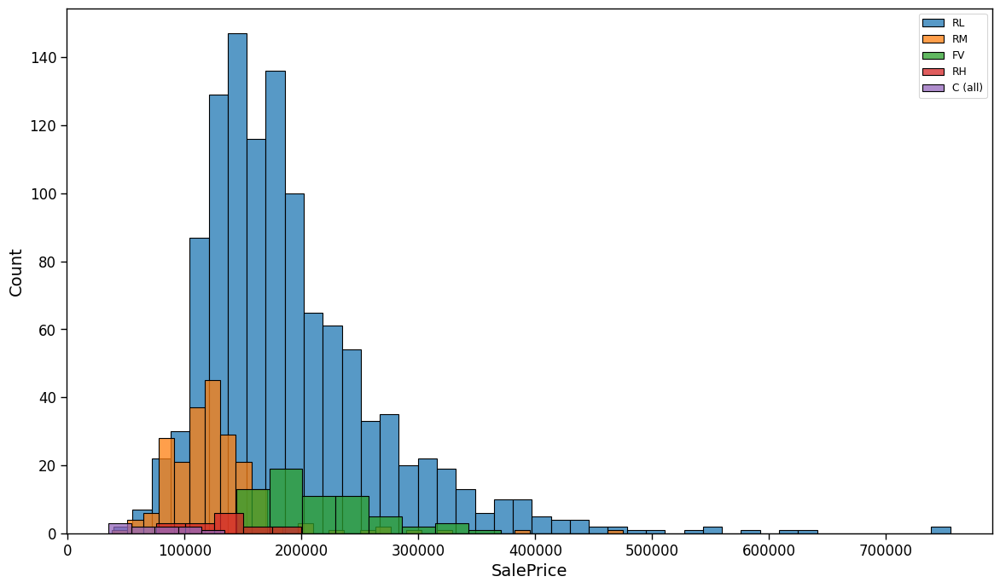

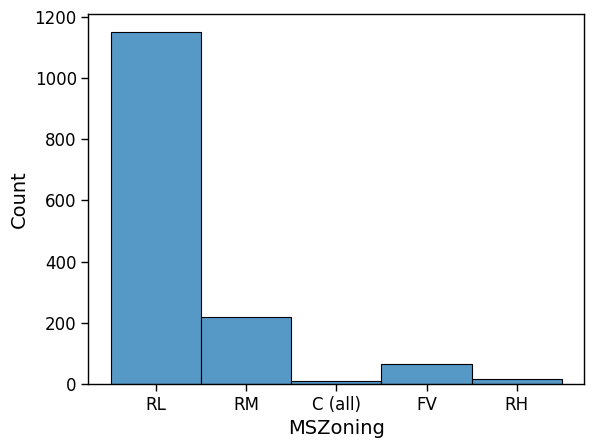


 2. Street 
 ____________________________________________________________________________________________________
Pave : Count: 1454 | Average Value: 181130.54 | Std: 79419.27 | Max: 755000 | Min: 34900 | Skewness: 1.89 | Kurtosis: 6.52
Grvl : Count: 6 | Average Value: 130190.5 | Std: 59743.98 | Max: 228950 | Min: 55993 | Skewness: 0.47 | Kurtosis: -1.15


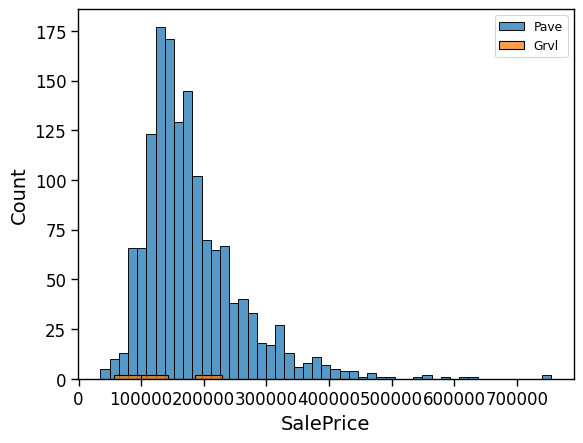

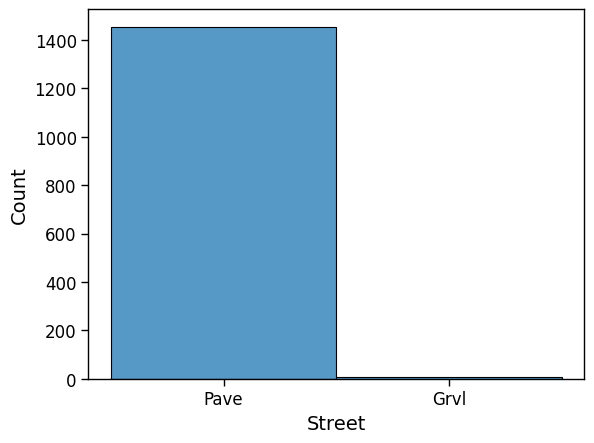


 3. Alley 
 ____________________________________________________________________________________________________
Grvl : Count: 50 | Average Value: 122219.08 | Std: 34431.22 | Max: 256000 | Min: 52500 | Skewness: 0.88 | Kurtosis: 3.0
Pave : Count: 41 | Average Value: 168000.59 | Std: 37899.56 | Max: 265979 | Min: 40000 | Skewness: -0.61 | Kurtosis: 2.41


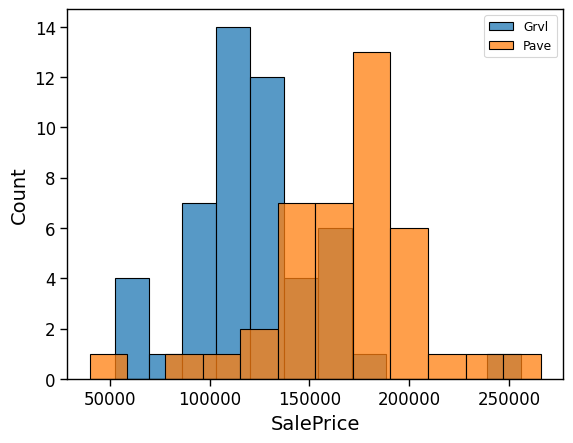

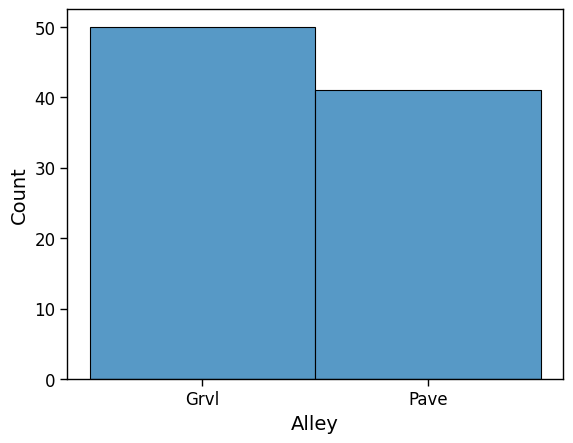


 4. LotShape 
 ____________________________________________________________________________________________________
Reg : Count: 925 | Average Value: 164754.82 | Std: 69635.76 | Max: 582933 | Min: 34900 | Skewness: 1.71 | Kurtosis: 4.39
IR1 : Count: 484 | Average Value: 206101.67 | Std: 85769.75 | Max: 755000 | Min: 52000 | Skewness: 2.11 | Kurtosis: 8.44
IR2 : Count: 41 | Average Value: 239833.37 | Std: 98446.44 | Max: 538000 | Min: 110000 | Skewness: 1.45 | Kurtosis: 1.34
IR3 : Count: 10 | Average Value: 216036.5 | Std: 78304.64 | Max: 375000 | Min: 73000 | Skewness: 0.23 | Kurtosis: -0.08


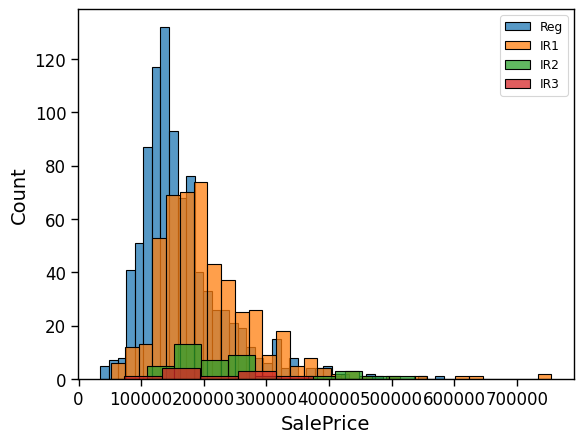

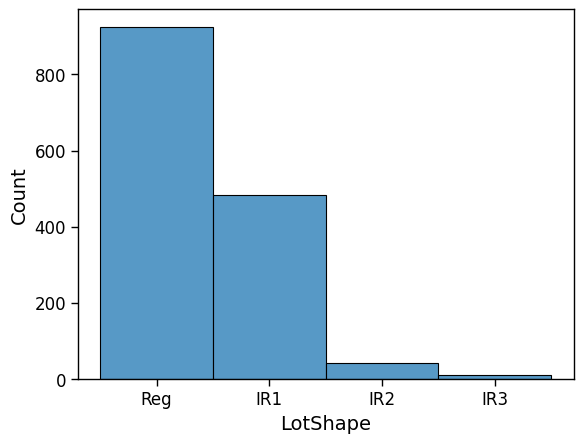


 5. LandContour 
 ____________________________________________________________________________________________________
Lvl : Count: 1311 | Average Value: 180183.75 | Std: 78433.64 | Max: 755000 | Min: 34900 | Skewness: 2.0 | Kurtosis: 7.39
Bnk : Count: 63 | Average Value: 143104.08 | Std: 48967.92 | Max: 315000 | Min: 52500 | Skewness: 0.68 | Kurtosis: 1.01
HLS : Count: 50 | Average Value: 231533.94 | Std: 100767.1 | Max: 538000 | Min: 82500 | Skewness: 0.81 | Kurtosis: 0.21
Low : Count: 36 | Average Value: 203661.11 | Std: 82761.37 | Max: 385000 | Min: 39300 | Skewness: 0.11 | Kurtosis: -0.53


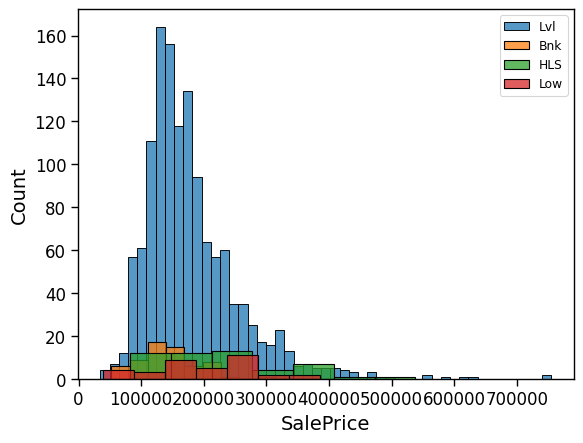

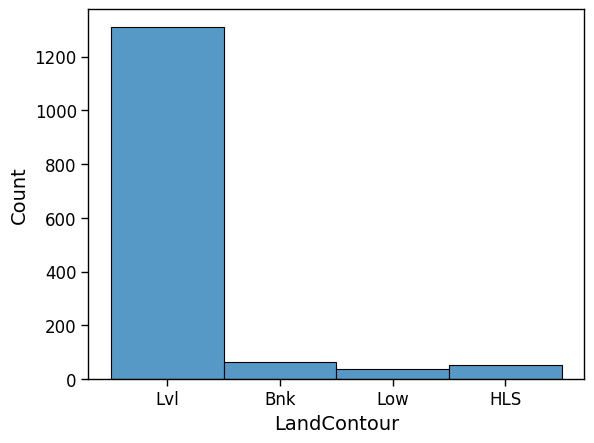


 6. Utilities 
 ____________________________________________________________________________________________________
AllPub : Count: 1459 | Average Value: 180950.96 | Std: 79434.36 | Max: 755000 | Min: 34900 | Skewness: 1.88 | Kurtosis: 6.5
NoSeWa : Count: 1 | Average Value: 137500.0 | Std: 0.0 | Max: 137500 | Min: 137500 | Skewness: nan | Kurtosis: nan


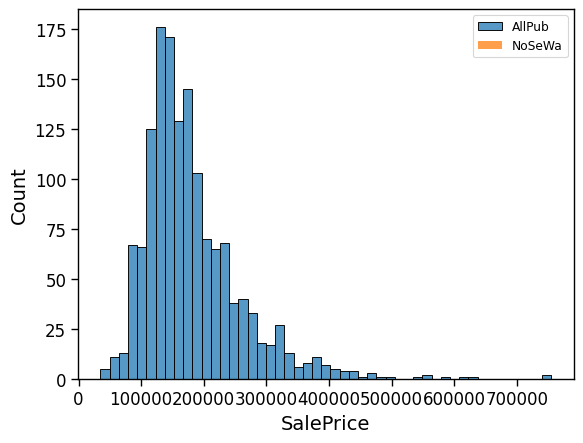

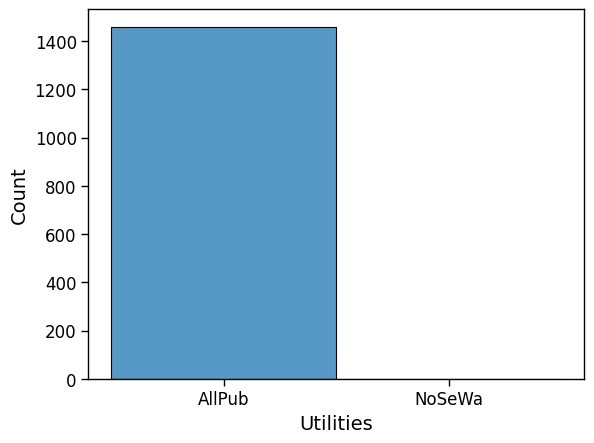


 7. LotConfig 
 ____________________________________________________________________________________________________
Inside : Count: 1052 | Average Value: 176938.05 | Std: 76390.47 | Max: 611657 | Min: 34900 | Skewness: 1.58 | Kurtosis: 3.83
Corner : Count: 263 | Average Value: 181623.43 | Std: 84305.31 | Max: 755000 | Min: 52500 | Skewness: 2.78 | Kurtosis: 14.38
CulDSac : Count: 94 | Average Value: 223854.62 | Std: 92620.92 | Max: 625000 | Min: 84000 | Skewness: 1.84 | Kurtosis: 4.24
FR2 : Count: 47 | Average Value: 177934.57 | Std: 62117.37 | Max: 394617 | Min: 81000 | Skewness: 1.34 | Kurtosis: 2.34
FR3 : Count: 4 | Average Value: 208475.0 | Std: 67878.4 | Max: 315000 | Min: 128000 | Skewness: 0.54 | Kurtosis: -0.99


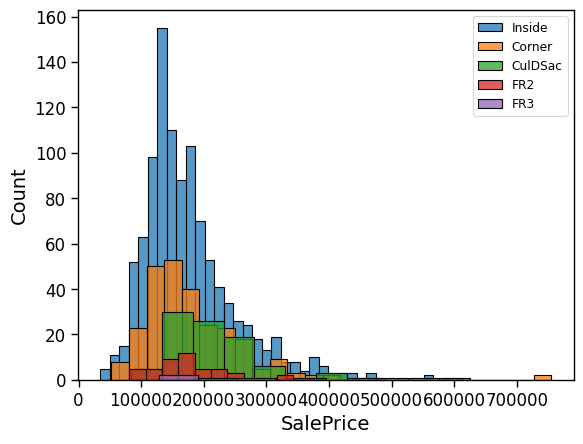

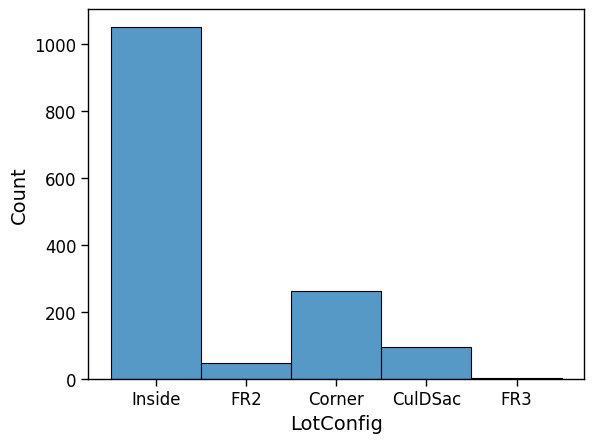


 8. LandSlope 
 ____________________________________________________________________________________________________
Gtl : Count: 1382 | Average Value: 179956.8 | Std: 78640.9 | Max: 755000 | Min: 34900 | Skewness: 1.96 | Kurtosis: 7.04
Mod : Count: 65 | Average Value: 196734.14 | Std: 91662.02 | Max: 538000 | Min: 39300 | Skewness: 0.97 | Kurtosis: 1.52
Sev : Count: 13 | Average Value: 204379.23 | Std: 83327.41 | Max: 375000 | Min: 61000 | Skewness: 0.27 | Kurtosis: -0.56


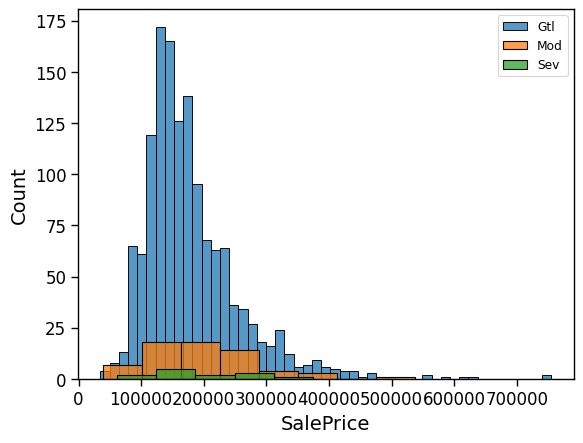

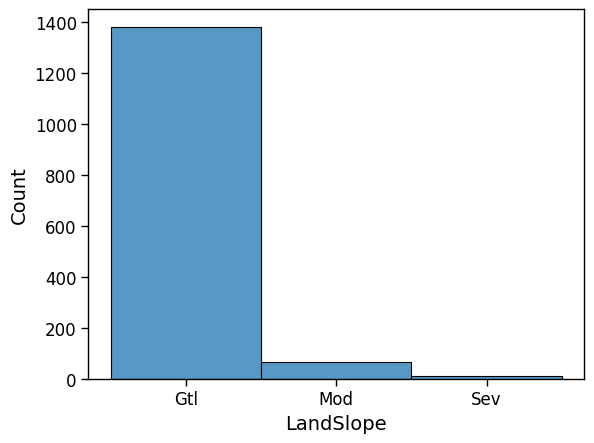


 9. Neighborhood 
 ____________________________________________________________________________________________________
NAmes : Count: 225 | Average Value: 145847.08 | Std: 33001.76 | Max: 345000 | Min: 87500 | Skewness: 1.82 | Kurtosis: 6.61
CollgCr : Count: 150 | Average Value: 197965.77 | Std: 51232.03 | Max: 424870 | Min: 110000 | Skewness: 0.92 | Kurtosis: 2.27
OldTown : Count: 113 | Average Value: 128225.3 | Std: 52417.1 | Max: 475000 | Min: 37900 | Skewness: 3.47 | Kurtosis: 17.63
Edwards : Count: 100 | Average Value: 128219.7 | Std: 42992.03 | Max: 320000 | Min: 58500 | Skewness: 1.59 | Kurtosis: 4.13
Somerst : Count: 86 | Average Value: 225379.84 | Std: 55849.99 | Max: 423000 | Min: 144152 | Skewness: 0.85 | Kurtosis: 0.82
Gilbert : Count: 79 | Average Value: 192854.51 | Std: 35758.29 | Max: 377500 | Min: 141000 | Skewness: 2.56 | Kurtosis: 8.91
NridgHt : Count: 77 | Average Value: 316270.62 | Std: 95764.57 | Max: 611657 | Min: 154000 | Skewness: 0.72 | Kurtosis: 0.54
Sawyer 

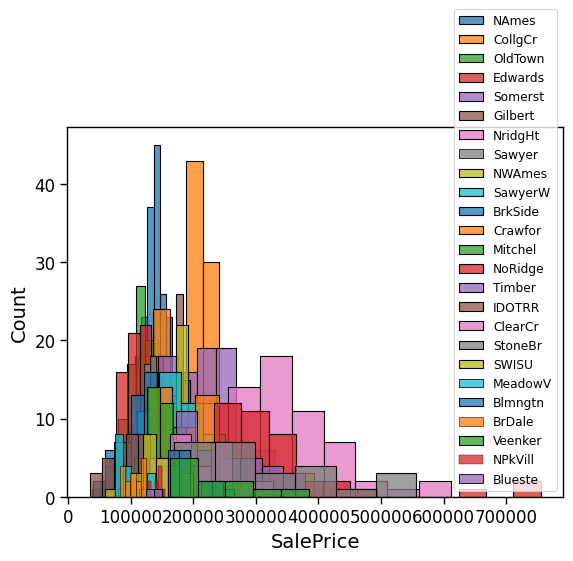

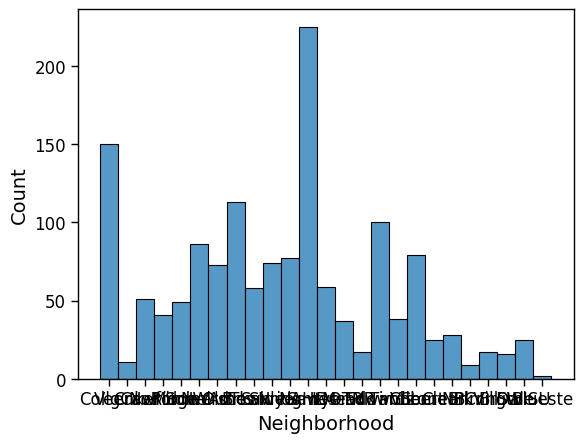


 10. Condition1 
 ____________________________________________________________________________________________________
Norm : Count: 1260 | Average Value: 184495.49 | Std: 81224.73 | Max: 755000 | Min: 34900 | Skewness: 1.86 | Kurtosis: 6.39
Feedr : Count: 81 | Average Value: 142475.48 | Std: 41896.25 | Max: 244600 | Min: 40000 | Skewness: 0.23 | Kurtosis: 0.25
Artery : Count: 48 | Average Value: 135091.67 | Std: 65533.17 | Max: 475000 | Min: 66500 | Skewness: 3.4 | Kurtosis: 13.78
RRAn : Count: 26 | Average Value: 184396.62 | Std: 64892.79 | Max: 423000 | Min: 79500 | Skewness: 1.9 | Kurtosis: 4.72
PosN : Count: 19 | Average Value: 215184.21 | Std: 63516.05 | Max: 385000 | Min: 109500 | Skewness: 0.89 | Kurtosis: 0.64
RRAe : Count: 11 | Average Value: 138400.0 | Std: 22912.48 | Max: 171000 | Min: 87000 | Skewness: -0.77 | Kurtosis: -0.02
PosA : Count: 8 | Average Value: 225875.0 | Std: 48967.94 | Max: 335000 | Min: 180000 | Skewness: 1.13 | Kurtosis: 0.32
RRNn : Count: 5 | Average Va

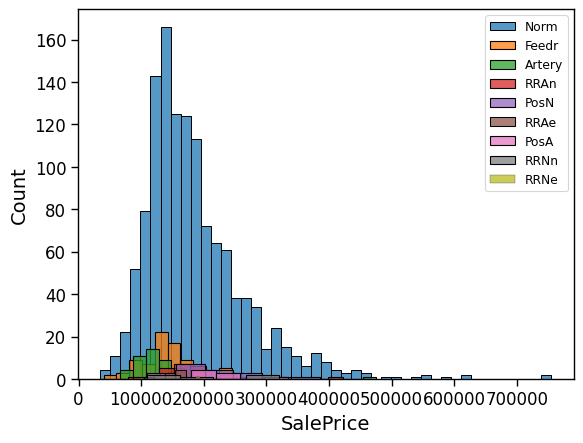

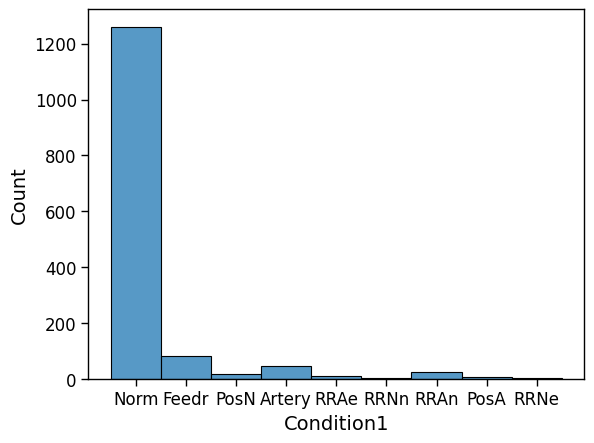


 11. Condition2 
 ____________________________________________________________________________________________________
Norm : Count: 1445 | Average Value: 181169.41 | Std: 79310.28 | Max: 755000 | Min: 34900 | Skewness: 1.89 | Kurtosis: 6.59
Feedr : Count: 6 | Average Value: 121166.67 | Std: 30622.25 | Max: 167500 | Min: 79500 | Skewness: -0.08 | Kurtosis: -1.21
Artery : Count: 2 | Average Value: 106500.0 | Std: 11500.0 | Max: 118000 | Min: 95000 | Skewness: 0.0 | Kurtosis: -2.0
RRNn : Count: 2 | Average Value: 96750.0 | Std: 28250.0 | Max: 125000 | Min: 68500 | Skewness: 0.0 | Kurtosis: -2.0
PosN : Count: 2 | Average Value: 284875.0 | Std: 100125.0 | Max: 385000 | Min: 184750 | Skewness: 0.0 | Kurtosis: -2.0
PosA : Count: 1 | Average Value: 325000.0 | Std: 0.0 | Max: 325000 | Min: 325000 | Skewness: nan | Kurtosis: nan
RRAn : Count: 1 | Average Value: 136905.0 | Std: 0.0 | Max: 136905 | Min: 136905 | Skewness: nan | Kurtosis: nan
RRAe : Count: 1 | Average Value: 190000.0 | Std: 0.0 |

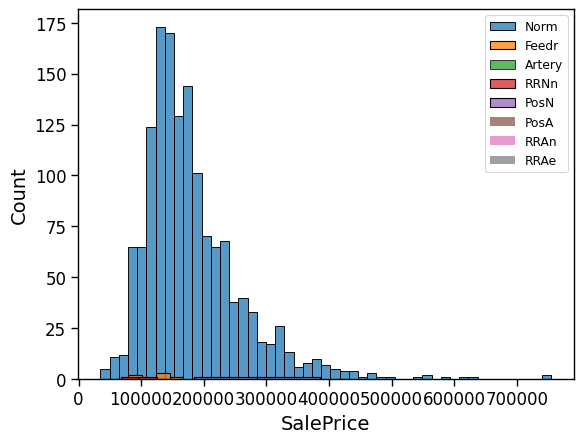

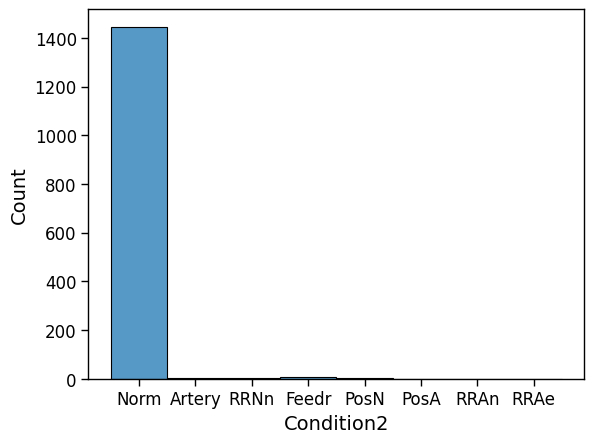


 12. BldgType 
 ____________________________________________________________________________________________________
1Fam : Count: 1220 | Average Value: 185763.81 | Std: 82614.62 | Max: 755000 | Min: 34900 | Skewness: 1.83 | Kurtosis: 6.11
TwnhsE : Count: 114 | Average Value: 181959.34 | Std: 60359.62 | Max: 392500 | Min: 75500 | Skewness: 1.0 | Kurtosis: 1.14
Duplex : Count: 52 | Average Value: 133541.08 | Std: 27564.32 | Max: 206300 | Min: 82000 | Skewness: 0.49 | Kurtosis: 0.37
Twnhs : Count: 43 | Average Value: 135911.63 | Std: 40533.52 | Max: 230000 | Min: 75000 | Skewness: 0.28 | Kurtosis: -0.91
2fmCon : Count: 31 | Average Value: 128432.26 | Std: 34881.95 | Max: 228950 | Min: 55000 | Skewness: 0.59 | Kurtosis: 0.93


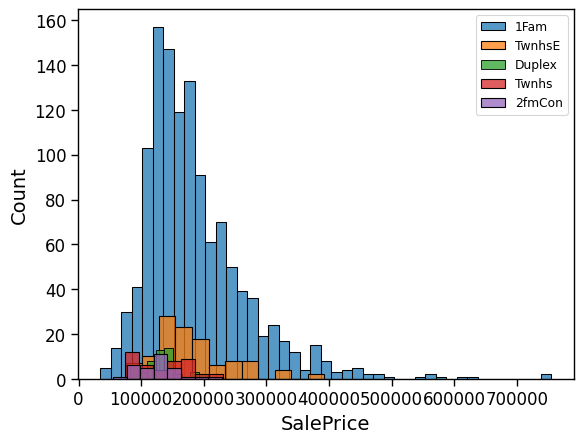

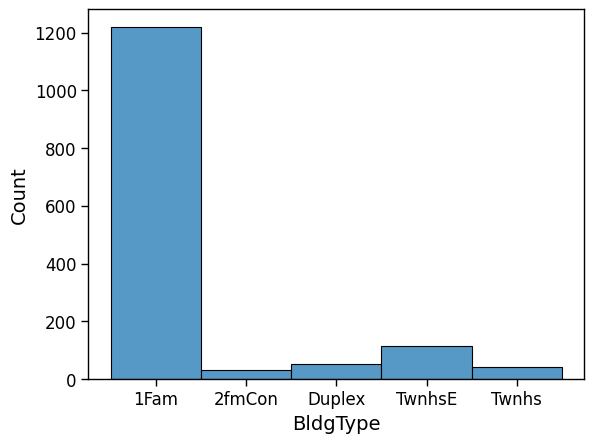


 13. HouseStyle 
 ____________________________________________________________________________________________________
1Story : Count: 726 | Average Value: 175985.48 | Std: 77002.63 | Max: 611657 | Min: 34900 | Skewness: 1.51 | Kurtosis: 3.32
2Story : Count: 445 | Average Value: 210051.76 | Std: 87241.02 | Max: 755000 | Min: 40000 | Skewness: 2.11 | Kurtosis: 8.28
1.5Fin : Count: 154 | Average Value: 143116.74 | Std: 54101.43 | Max: 410000 | Min: 37900 | Skewness: 2.05 | Kurtosis: 6.0
SLvl : Count: 65 | Average Value: 166703.38 | Std: 38009.36 | Max: 345000 | Min: 91000 | Skewness: 2.13 | Kurtosis: 7.2
SFoyer : Count: 37 | Average Value: 135074.49 | Std: 30066.17 | Max: 206300 | Min: 75500 | Skewness: -0.05 | Kurtosis: 0.19
1.5Unf : Count: 14 | Average Value: 110150.0 | Std: 18344.0 | Max: 139400 | Min: 76000 | Skewness: -0.17 | Kurtosis: -0.89
2.5Unf : Count: 11 | Average Value: 157354.55 | Std: 60958.8 | Max: 325000 | Min: 101000 | Skewness: 1.8 | Kurtosis: 2.4
2.5Fin : Count: 8 | A

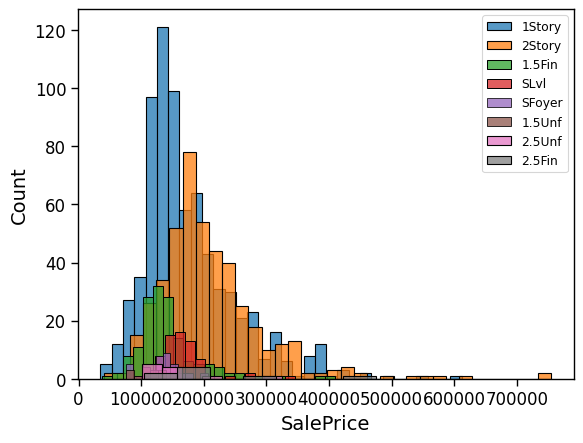

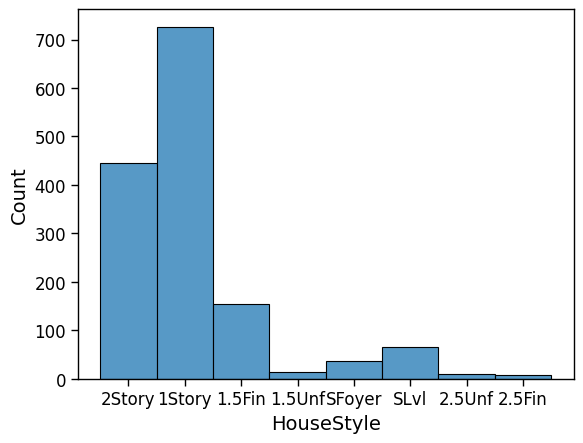


 14. RoofStyle 
 ____________________________________________________________________________________________________
Gable : Count: 1141 | Average Value: 171483.96 | Std: 66302.16 | Max: 755000 | Min: 34900 | Skewness: 1.62 | Kurtosis: 6.71
Hip : Count: 286 | Average Value: 218876.93 | Std: 111354.42 | Max: 745000 | Min: 55000 | Skewness: 1.43 | Kurtosis: 2.41
Flat : Count: 13 | Average Value: 194690.0 | Std: 60070.12 | Max: 274970 | Min: 82000 | Skewness: -0.27 | Kurtosis: -1.2
Gambrel : Count: 11 | Average Value: 148909.09 | Std: 63894.89 | Max: 259500 | Min: 40000 | Skewness: 0.14 | Kurtosis: -0.91
Mansard : Count: 7 | Average Value: 180568.43 | Std: 53750.92 | Max: 265979 | Min: 100000 | Skewness: 0.22 | Kurtosis: -1.06
Shed : Count: 2 | Average Value: 225000.0 | Std: 35000.0 | Max: 260000 | Min: 190000 | Skewness: 0.0 | Kurtosis: -2.0


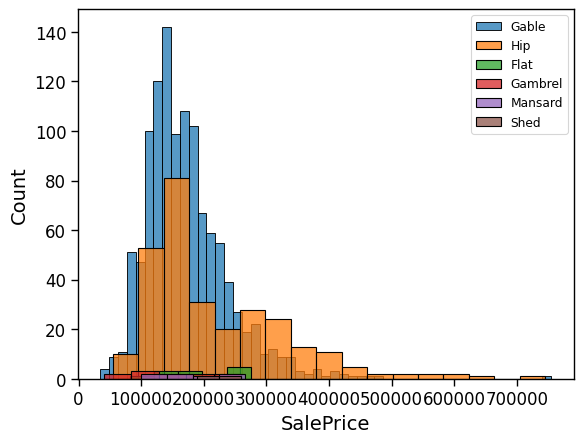

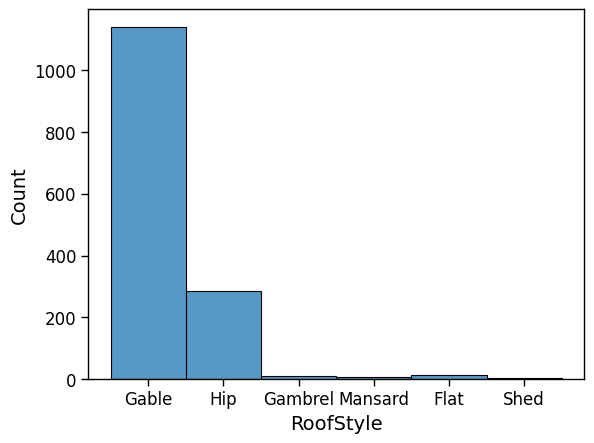


 15. RoofMatl 
 ____________________________________________________________________________________________________
CompShg : Count: 1434 | Average Value: 179803.68 | Std: 77695.28 | Max: 745000 | Min: 34900 | Skewness: 1.75 | Kurtosis: 5.4
Tar&Grv : Count: 11 | Average Value: 185406.36 | Std: 62385.19 | Max: 274970 | Min: 82000 | Skewness: 0.09 | Kurtosis: -1.29
WdShngl : Count: 6 | Average Value: 390250.0 | Std: 188936.0 | Max: 755000 | Min: 168500 | Skewness: 0.88 | Kurtosis: -0.32
WdShake : Count: 5 | Average Value: 241400.0 | Std: 32395.06 | Max: 287000 | Min: 190000 | Skewness: -0.22 | Kurtosis: -0.92
Metal : Count: 1 | Average Value: 180000.0 | Std: 0.0 | Max: 180000 | Min: 180000 | Skewness: nan | Kurtosis: nan
Membran : Count: 1 | Average Value: 241500.0 | Std: 0.0 | Max: 241500 | Min: 241500 | Skewness: nan | Kurtosis: nan
Roll : Count: 1 | Average Value: 137000.0 | Std: 0.0 | Max: 137000 | Min: 137000 | Skewness: nan | Kurtosis: nan
ClyTile : Count: 1 | Average Value: 1600

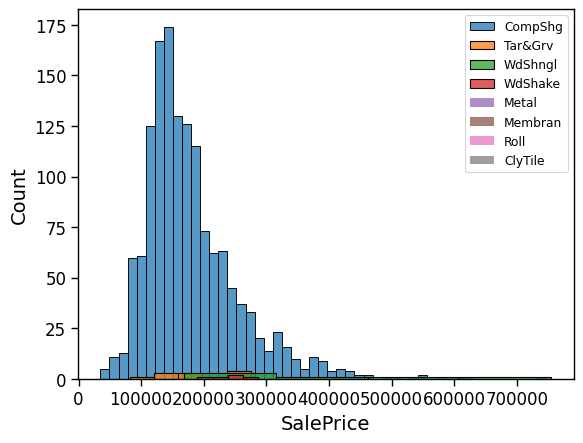

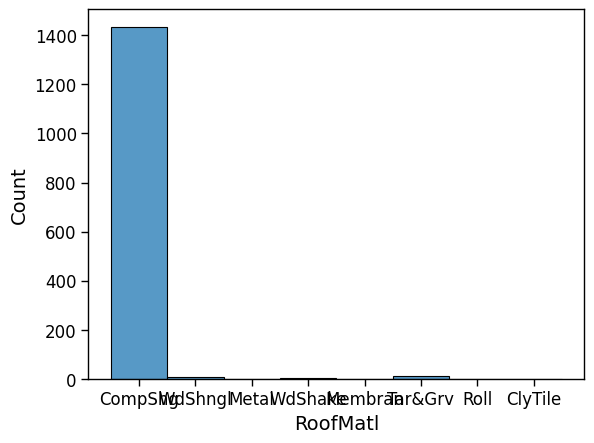


 16. Exterior1st 
 ____________________________________________________________________________________________________
VinylSd : Count: 515 | Average Value: 213732.9 | Std: 80568.64 | Max: 611657 | Min: 37900 | Skewness: 1.29 | Kurtosis: 2.82
HdBoard : Count: 222 | Average Value: 163077.45 | Std: 66156.21 | Max: 755000 | Min: 83000 | Skewness: 4.96 | Kurtosis: 37.28
MetalSd : Count: 220 | Average Value: 149422.18 | Std: 54651.78 | Max: 392000 | Min: 62383 | Skewness: 1.84 | Kurtosis: 4.26
Wd Sdng : Count: 206 | Average Value: 149841.65 | Std: 70957.59 | Max: 745000 | Min: 34900 | Skewness: 3.72 | Kurtosis: 24.62
Plywood : Count: 108 | Average Value: 175942.38 | Std: 49267.7 | Max: 345000 | Min: 82500 | Skewness: 0.99 | Kurtosis: 1.13
CemntBd : Count: 61 | Average Value: 231690.66 | Std: 119583.21 | Max: 556581 | Min: 75000 | Skewness: 0.57 | Kurtosis: -0.18
BrkFace : Count: 50 | Average Value: 194573.0 | Std: 82009.31 | Max: 430000 | Min: 40000 | Skewness: 0.79 | Kurtosis: 0.17
WdShi

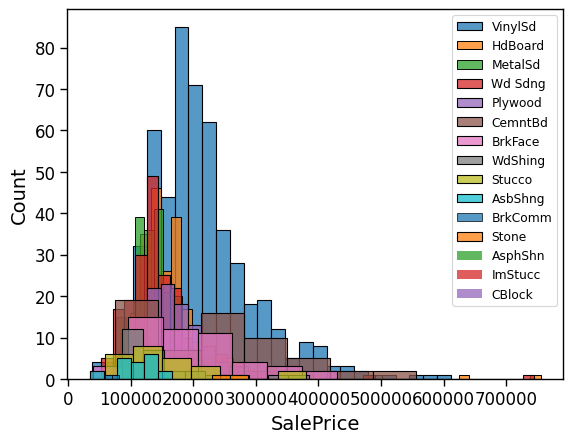

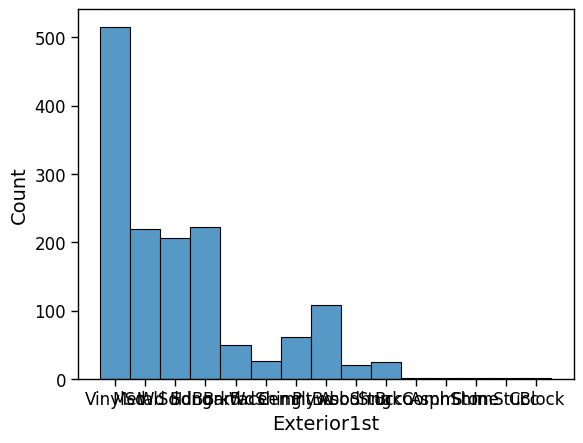


 17. Exterior2nd 
 ____________________________________________________________________________________________________
VinylSd : Count: 504 | Average Value: 214432.46 | Std: 80628.2 | Max: 611657 | Min: 37900 | Skewness: 1.3 | Kurtosis: 2.85
MetalSd : Count: 214 | Average Value: 149803.17 | Std: 54949.76 | Max: 392000 | Min: 62383 | Skewness: 1.85 | Kurtosis: 4.23
HdBoard : Count: 207 | Average Value: 167661.57 | Std: 69891.64 | Max: 755000 | Min: 83000 | Skewness: 4.45 | Kurtosis: 30.75
Wd Sdng : Count: 197 | Average Value: 148386.07 | Std: 59740.65 | Max: 475000 | Min: 34900 | Skewness: 1.85 | Kurtosis: 5.48
Plywood : Count: 142 | Average Value: 168112.39 | Std: 46790.12 | Max: 320000 | Min: 76500 | Skewness: 0.77 | Kurtosis: 0.62
CmentBd : Count: 60 | Average Value: 230093.83 | Std: 115168.49 | Max: 556581 | Min: 75000 | Skewness: 0.42 | Kurtosis: -0.44
Wd Shng : Count: 38 | Average Value: 161328.95 | Std: 87795.7 | Max: 538000 | Min: 55000 | Skewness: 2.64 | Kurtosis: 7.68
Stucco

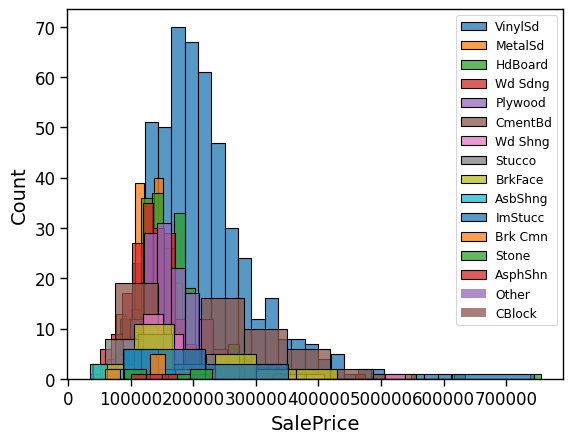

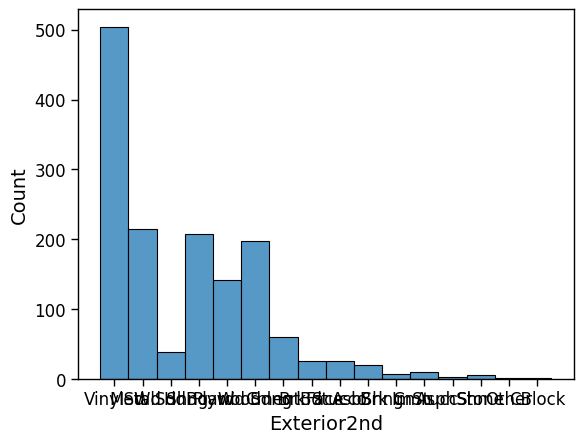


 18. MasVnrType 
 ____________________________________________________________________________________________________
BrkFace : Count: 445 | Average Value: 204691.87 | Std: 81122.99 | Max: 755000 | Min: 75000 | Skewness: 1.86 | Kurtosis: 6.45
Stone : Count: 128 | Average Value: 265583.62 | Std: 99549.0 | Max: 611657 | Min: 119000 | Skewness: 1.12 | Kurtosis: 1.39
BrkCmn : Count: 15 | Average Value: 146318.07 | Std: 44621.45 | Max: 277000 | Min: 89471 | Skewness: 1.43 | Kurtosis: 2.31


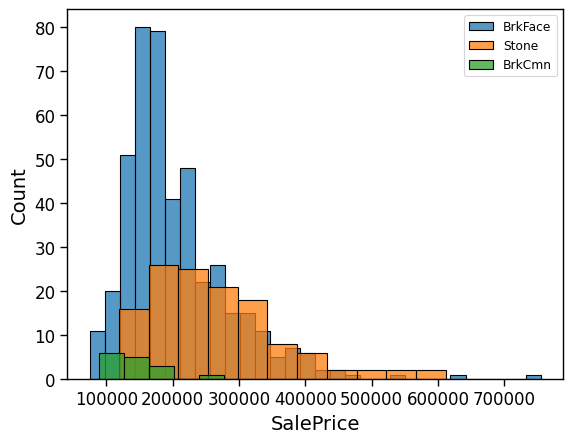

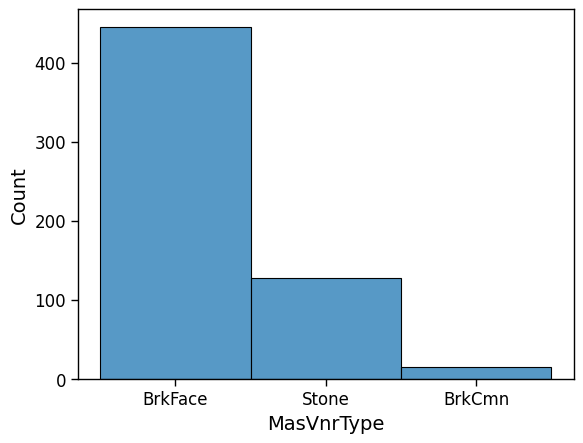


 19. ExterQual 
 ____________________________________________________________________________________________________
TA : Count: 906 | Average Value: 144341.31 | Std: 42448.37 | Max: 381000 | Min: 34900 | Skewness: 1.14 | Kurtosis: 3.59
Gd : Count: 488 | Average Value: 231633.51 | Std: 71115.9 | Max: 745000 | Min: 52000 | Skewness: 1.79 | Kurtosis: 7.7
Ex : Count: 52 | Average Value: 367360.96 | Std: 115276.59 | Max: 755000 | Min: 160000 | Skewness: 0.73 | Kurtosis: 1.24
Fa : Count: 14 | Average Value: 87985.21 | Std: 38378.18 | Max: 200000 | Min: 39300 | Skewness: 1.56 | Kurtosis: 2.53


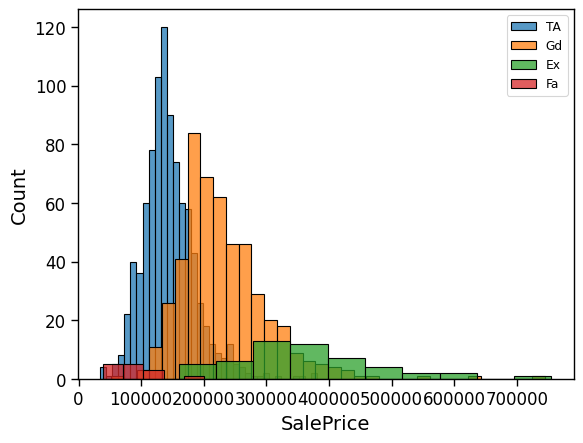

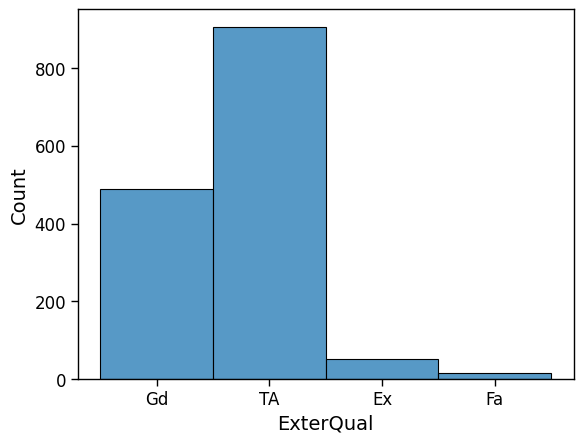


 20. ExterCond 
 ____________________________________________________________________________________________________
TA : Count: 1282 | Average Value: 184034.9 | Std: 79775.13 | Max: 755000 | Min: 34900 | Skewness: 1.84 | Kurtosis: 6.27
Gd : Count: 146 | Average Value: 168897.57 | Std: 72359.22 | Max: 625000 | Min: 68400 | Skewness: 2.71 | Kurtosis: 11.64
Fa : Count: 28 | Average Value: 102595.14 | Std: 39371.9 | Max: 169500 | Min: 39300 | Skewness: 0.08 | Kurtosis: -1.29
Ex : Count: 3 | Average Value: 201333.33 | Std: 89190.18 | Max: 325000 | Min: 118000 | Skewness: 0.59 | Kurtosis: -1.5
Po : Count: 1 | Average Value: 76500.0 | Std: 0.0 | Max: 76500 | Min: 76500 | Skewness: nan | Kurtosis: nan


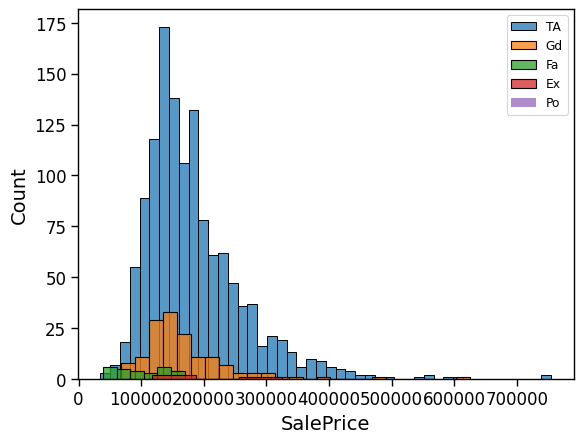

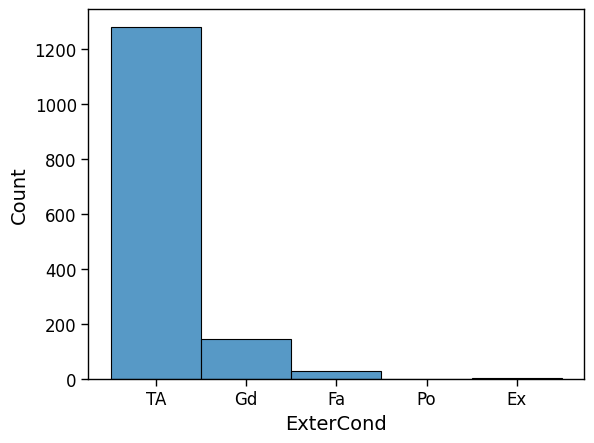


 21. Foundation 
 ____________________________________________________________________________________________________
PConc : Count: 647 | Average Value: 225230.44 | Std: 86798.82 | Max: 755000 | Min: 78000 | Skewness: 1.79 | Kurtosis: 5.76
CBlock : Count: 634 | Average Value: 149805.71 | Std: 48256.94 | Max: 402861 | Min: 34900 | Skewness: 1.52 | Kurtosis: 4.29
BrkTil : Count: 146 | Average Value: 132291.08 | Std: 54405.11 | Max: 475000 | Min: 37900 | Skewness: 2.34 | Kurtosis: 10.55
Slab : Count: 24 | Average Value: 107365.62 | Std: 33493.61 | Max: 198500 | Min: 39300 | Skewness: 0.65 | Kurtosis: 0.93
Stone : Count: 6 | Average Value: 165959.17 | Std: 71713.04 | Max: 266500 | Min: 102776 | Skewness: 0.64 | Kurtosis: -1.51
Wood : Count: 3 | Average Value: 185666.67 | Std: 46291.35 | Max: 250000 | Min: 143000 | Skewness: 0.6 | Kurtosis: -1.5


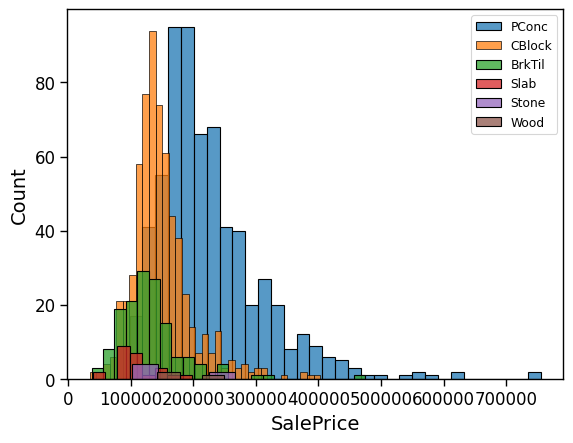

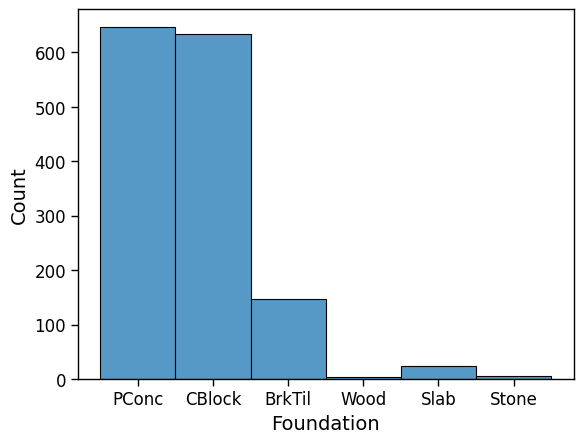


 22. BsmtQual 
 ____________________________________________________________________________________________________
TA : Count: 649 | Average Value: 140759.82 | Std: 43449.75 | Max: 475000 | Min: 34900 | Skewness: 1.75 | Kurtosis: 8.1
Gd : Count: 618 | Average Value: 202688.48 | Std: 58045.34 | Max: 538000 | Min: 75500 | Skewness: 1.01 | Kurtosis: 2.5
Ex : Count: 121 | Average Value: 327041.04 | Std: 113092.99 | Max: 755000 | Min: 123500 | Skewness: 1.09 | Kurtosis: 2.27
Fa : Count: 35 | Average Value: 115692.03 | Std: 33973.67 | Max: 206900 | Min: 61000 | Skewness: 0.84 | Kurtosis: 0.5


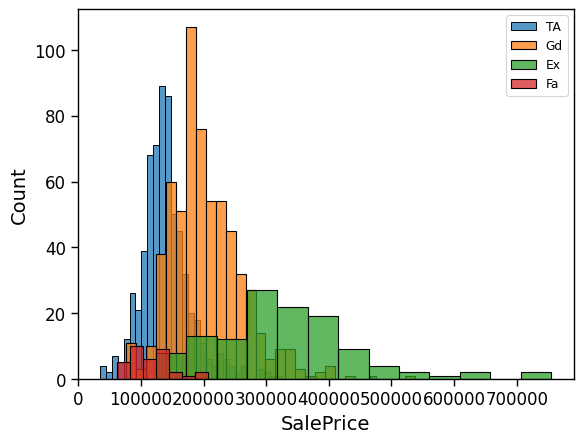

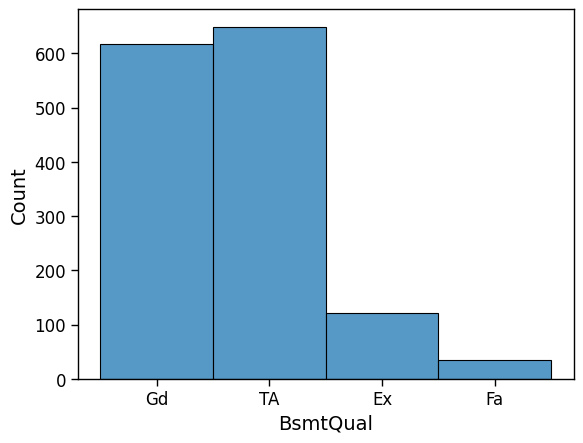


 23. BsmtCond 
 ____________________________________________________________________________________________________
TA : Count: 1311 | Average Value: 183632.62 | Std: 79485.06 | Max: 755000 | Min: 34900 | Skewness: 1.96 | Kurtosis: 6.94
Gd : Count: 65 | Average Value: 213599.91 | Std: 72102.04 | Max: 465000 | Min: 119000 | Skewness: 1.1 | Kurtosis: 1.14
Fa : Count: 45 | Average Value: 121809.53 | Std: 42982.11 | Max: 265979 | Min: 55000 | Skewness: 0.86 | Kurtosis: 1.17
Po : Count: 2 | Average Value: 64000.0 | Std: 3000.0 | Max: 67000 | Min: 61000 | Skewness: 0.0 | Kurtosis: -2.0


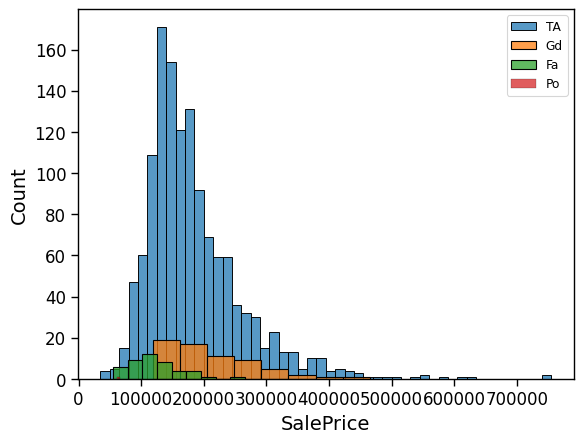

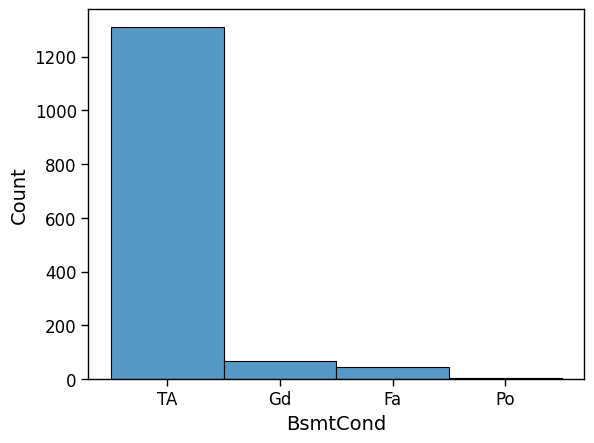


 24. BsmtExposure 
 ____________________________________________________________________________________________________
No : Count: 953 | Average Value: 165652.3 | Std: 60663.87 | Max: 501837 | Min: 34900 | Skewness: 1.3 | Kurtosis: 3.0
Av : Count: 221 | Average Value: 206643.42 | Std: 88454.7 | Max: 745000 | Min: 35311 | Skewness: 1.79 | Kurtosis: 6.29
Gd : Count: 134 | Average Value: 257689.81 | Std: 118479.1 | Max: 755000 | Min: 61000 | Skewness: 1.34 | Kurtosis: 2.32
Mn : Count: 114 | Average Value: 192789.66 | Std: 76995.5 | Max: 475000 | Min: 78000 | Skewness: 1.07 | Kurtosis: 1.24


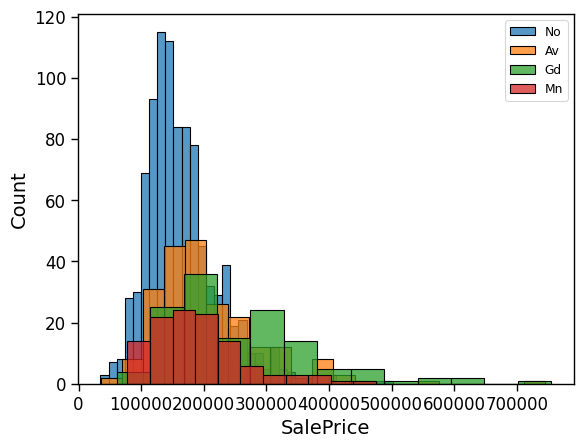

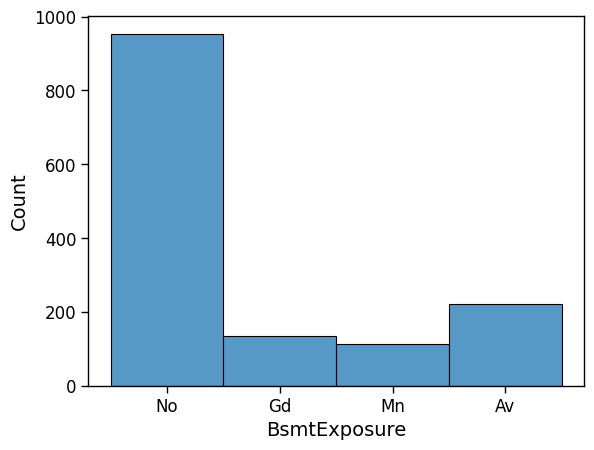


 25. BsmtFinType1 
 ____________________________________________________________________________________________________
Unf : Count: 430 | Average Value: 170670.58 | Std: 72492.64 | Max: 582933 | Min: 37900 | Skewness: 1.42 | Kurtosis: 3.81
GLQ : Count: 418 | Average Value: 235413.72 | Std: 93104.04 | Max: 755000 | Min: 80000 | Skewness: 1.7 | Kurtosis: 5.09
ALQ : Count: 220 | Average Value: 161573.07 | Std: 50705.64 | Max: 538000 | Min: 81000 | Skewness: 2.59 | Kurtosis: 13.84
BLQ : Count: 148 | Average Value: 149493.66 | Std: 47167.13 | Max: 359100 | Min: 35311 | Skewness: 1.2 | Kurtosis: 2.7
Rec : Count: 133 | Average Value: 146889.25 | Std: 45019.91 | Max: 381000 | Min: 34900 | Skewness: 1.58 | Kurtosis: 6.06
LwQ : Count: 74 | Average Value: 151852.7 | Std: 50452.6 | Max: 301000 | Min: 75500 | Skewness: 1.17 | Kurtosis: 1.09


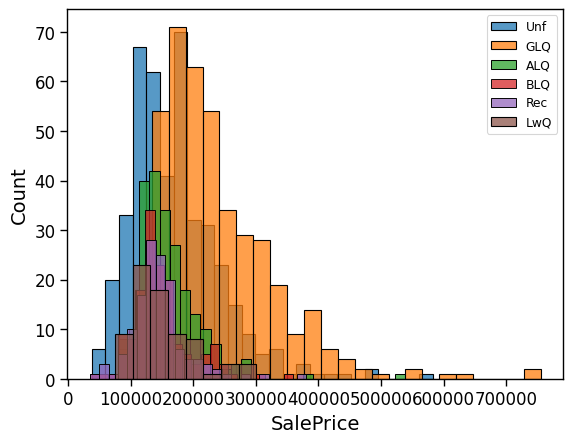

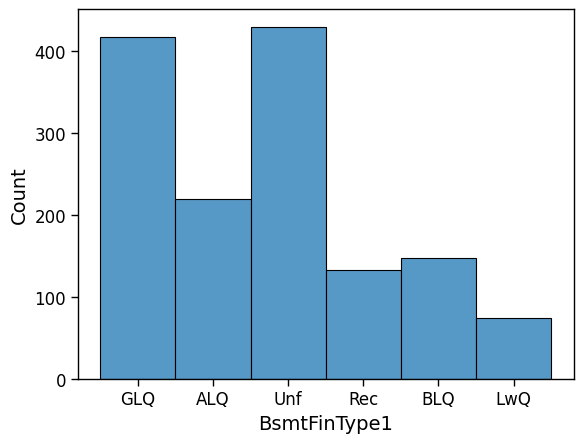


 26. BsmtFinType2 
 ____________________________________________________________________________________________________
Unf : Count: 1256 | Average Value: 184694.69 | Std: 81242.95 | Max: 755000 | Min: 34900 | Skewness: 1.84 | Kurtosis: 6.22
Rec : Count: 54 | Average Value: 164917.13 | Std: 58632.72 | Max: 402000 | Min: 85000 | Skewness: 2.17 | Kurtosis: 5.64
LwQ : Count: 46 | Average Value: 164364.13 | Std: 42782.29 | Max: 287000 | Min: 88000 | Skewness: 0.84 | Kurtosis: 0.35
BLQ : Count: 33 | Average Value: 151101.0 | Std: 40975.98 | Max: 271900 | Min: 62383 | Skewness: 0.64 | Kurtosis: 1.01
ALQ : Count: 19 | Average Value: 209942.11 | Std: 101970.51 | Max: 555000 | Min: 123500 | Skewness: 2.0 | Kurtosis: 4.14
GLQ : Count: 14 | Average Value: 180982.14 | Std: 62224.14 | Max: 270000 | Min: 75500 | Skewness: -0.35 | Kurtosis: -1.32


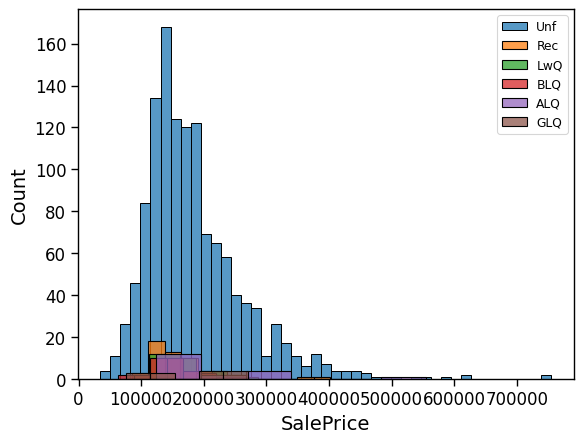

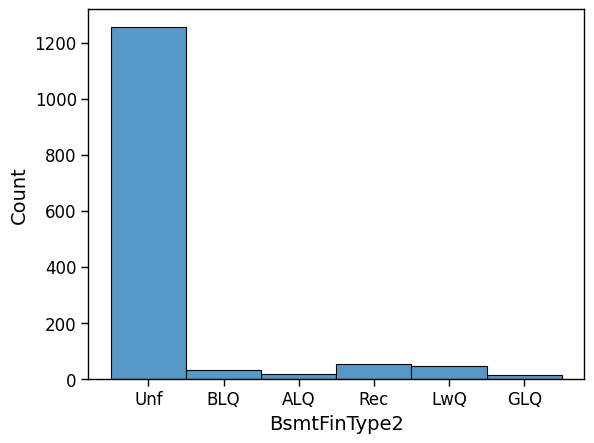


 27. Heating 
 ____________________________________________________________________________________________________
GasA : Count: 1428 | Average Value: 182021.2 | Std: 79235.12 | Max: 755000 | Min: 34900 | Skewness: 1.91 | Kurtosis: 6.64
GasW : Count: 18 | Average Value: 166632.17 | Std: 76334.52 | Max: 375000 | Min: 82000 | Skewness: 1.14 | Kurtosis: 0.68
Grav : Count: 7 | Average Value: 75271.43 | Std: 25984.6 | Max: 121000 | Min: 37900 | Skewness: 0.31 | Kurtosis: -0.85
Wall : Count: 4 | Average Value: 92100.0 | Std: 3905.76 | Max: 98000 | Min: 87500 | Skewness: 0.42 | Kurtosis: -1.2
OthW : Count: 2 | Average Value: 125750.0 | Std: 3750.0 | Max: 129500 | Min: 122000 | Skewness: 0.0 | Kurtosis: -2.0
Floor : Count: 1 | Average Value: 72500.0 | Std: 0.0 | Max: 72500 | Min: 72500 | Skewness: nan | Kurtosis: nan


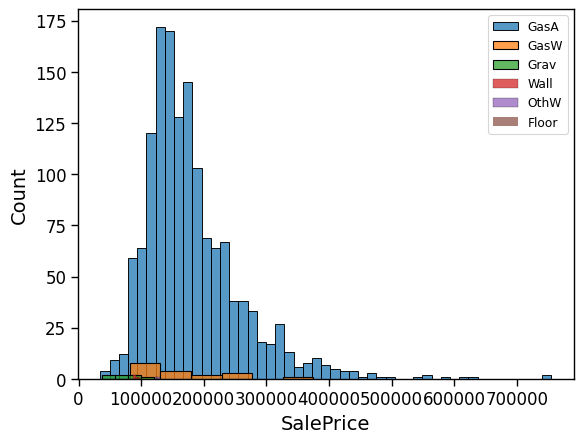

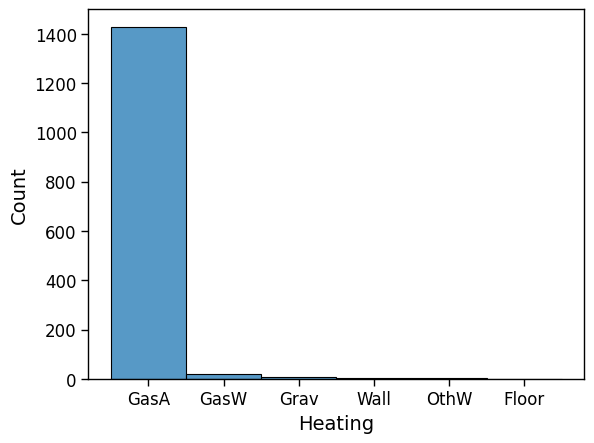


 28. HeatingQC 
 ____________________________________________________________________________________________________
Ex : Count: 741 | Average Value: 214914.43 | Std: 87410.66 | Max: 755000 | Min: 66500 | Skewness: 1.76 | Kurtosis: 5.48
TA : Count: 428 | Average Value: 142362.88 | Std: 47171.28 | Max: 375000 | Min: 34900 | Skewness: 1.47 | Kurtosis: 3.79
Gd : Count: 241 | Average Value: 156858.87 | Std: 52814.01 | Max: 395000 | Min: 52000 | Skewness: 1.31 | Kurtosis: 3.35
Fa : Count: 49 | Average Value: 123919.49 | Std: 49790.64 | Max: 235000 | Min: 37900 | Skewness: 0.32 | Kurtosis: -0.67
Po : Count: 1 | Average Value: 87000.0 | Std: 0.0 | Max: 87000 | Min: 87000 | Skewness: nan | Kurtosis: nan


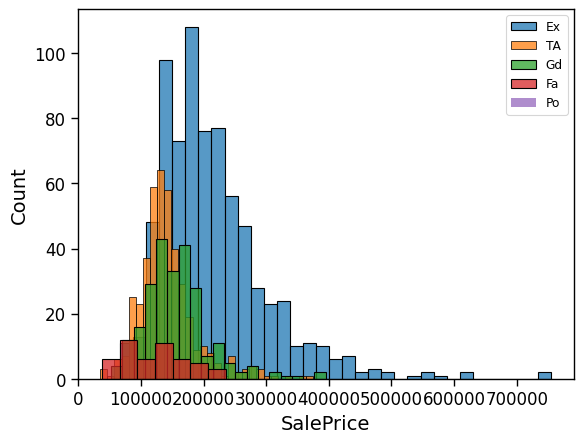

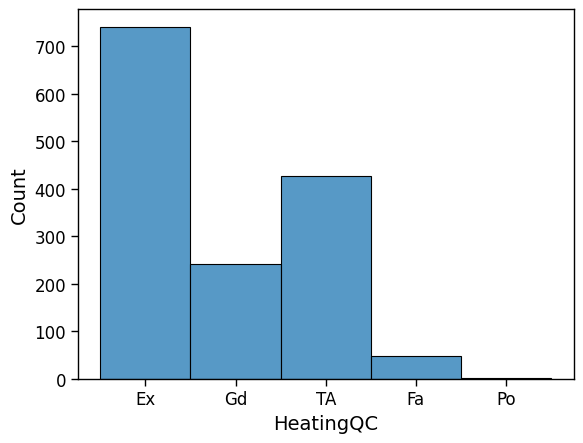


 29. CentralAir 
 ____________________________________________________________________________________________________
Y : Count: 1365 | Average Value: 186186.71 | Std: 78776.34 | Max: 755000 | Min: 52000 | Skewness: 1.96 | Kurtosis: 6.81
N : Count: 95 | Average Value: 105264.07 | Std: 40456.65 | Max: 265979 | Min: 34900 | Skewness: 1.17 | Kurtosis: 2.72


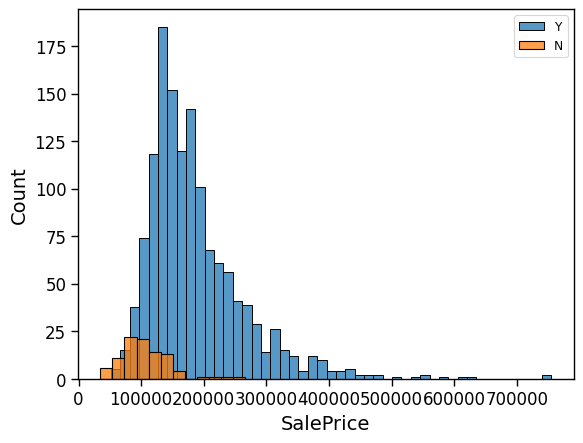

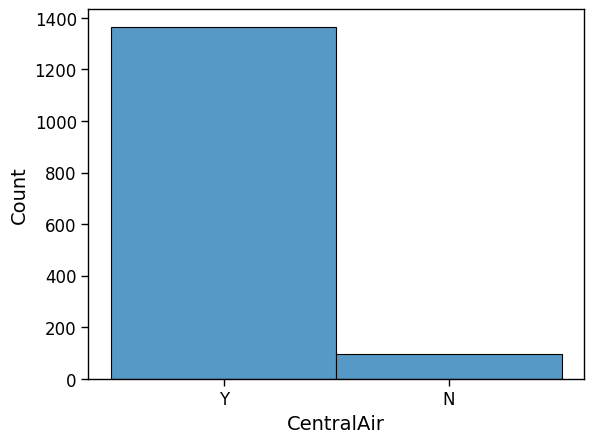


 30. Electrical 
 ____________________________________________________________________________________________________
SBrkr : Count: 1334 | Average Value: 186825.11 | Std: 79826.52 | Max: 755000 | Min: 37900 | Skewness: 1.89 | Kurtosis: 6.49
FuseA : Count: 94 | Average Value: 122196.89 | Std: 37311.31 | Max: 239000 | Min: 34900 | Skewness: 0.27 | Kurtosis: 0.65
FuseF : Count: 27 | Average Value: 107675.44 | Std: 30063.81 | Max: 169500 | Min: 39300 | Skewness: -0.34 | Kurtosis: -0.41
FuseP : Count: 3 | Average Value: 97333.33 | Std: 28288.2 | Max: 137000 | Min: 73000 | Skewness: 0.65 | Kurtosis: -1.5
Mix : Count: 1 | Average Value: 67000.0 | Std: 0.0 | Max: 67000 | Min: 67000 | Skewness: nan | Kurtosis: nan


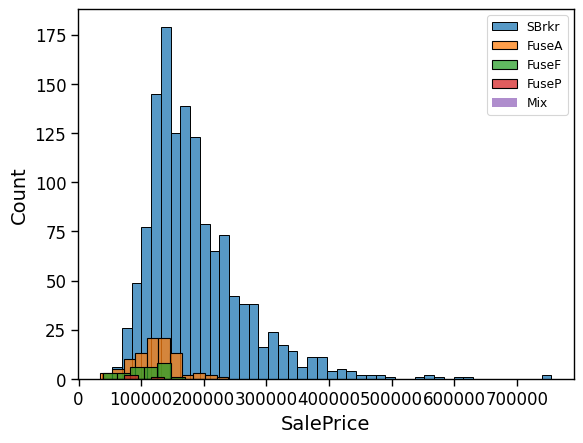

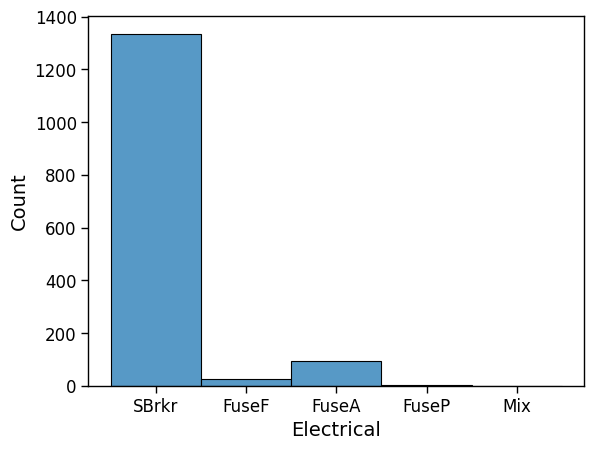


 31. KitchenQual 
 ____________________________________________________________________________________________________
TA : Count: 735 | Average Value: 139962.51 | Std: 38869.81 | Max: 375000 | Min: 34900 | Skewness: 1.0 | Kurtosis: 3.65
Gd : Count: 586 | Average Value: 212116.02 | Std: 63965.53 | Max: 625000 | Min: 79000 | Skewness: 1.19 | Kurtosis: 3.37
Ex : Count: 100 | Average Value: 328554.67 | Std: 120257.11 | Max: 755000 | Min: 86000 | Skewness: 0.92 | Kurtosis: 1.82
Fa : Count: 39 | Average Value: 105565.21 | Std: 35539.66 | Max: 200000 | Min: 39300 | Skewness: 0.23 | Kurtosis: -0.26


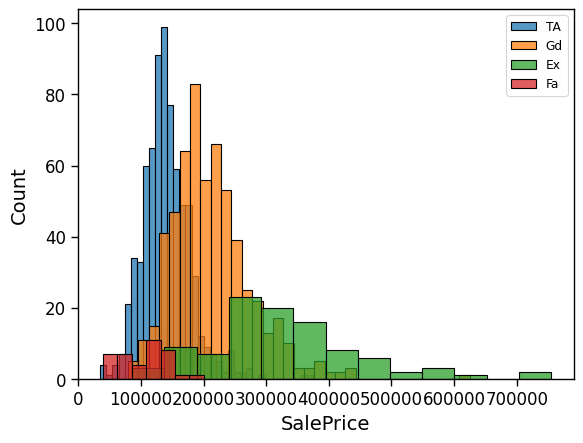

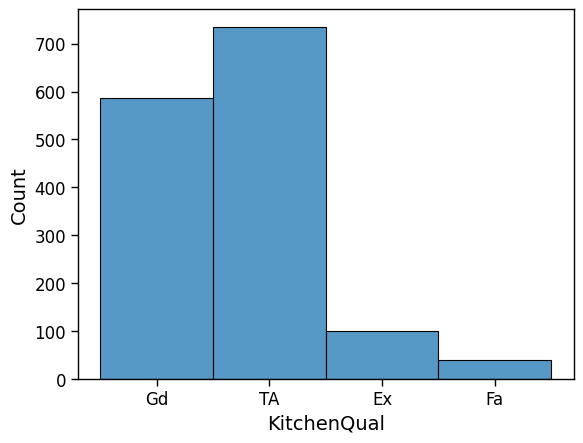


 32. Functional 
 ____________________________________________________________________________________________________
Typ : Count: 1360 | Average Value: 183429.15 | Std: 79988.54 | Max: 755000 | Min: 34900 | Skewness: 1.85 | Kurtosis: 6.33
Min2 : Count: 34 | Average Value: 144240.65 | Std: 40604.72 | Max: 316600 | Min: 87000 | Skewness: 1.99 | Kurtosis: 7.1
Min1 : Count: 31 | Average Value: 146385.48 | Std: 37470.19 | Max: 256000 | Min: 82000 | Skewness: 0.74 | Kurtosis: 0.68
Mod : Count: 15 | Average Value: 168393.33 | Std: 114905.67 | Max: 538000 | Min: 55000 | Skewness: 2.08 | Kurtosis: 4.33
Maj1 : Count: 14 | Average Value: 153948.14 | Std: 62157.39 | Max: 315000 | Min: 60000 | Skewness: 0.86 | Kurtosis: 1.06
Maj2 : Count: 5 | Average Value: 85800.0 | Std: 24227.26 | Max: 115000 | Min: 52000 | Skewness: -0.09 | Kurtosis: -1.55
Sev : Count: 1 | Average Value: 129000.0 | Std: 0.0 | Max: 129000 | Min: 129000 | Skewness: nan | Kurtosis: nan


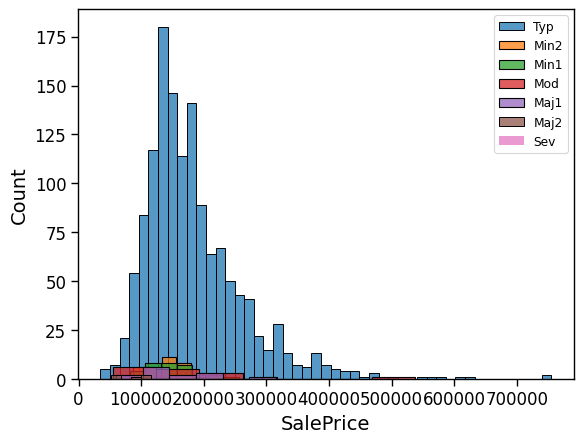

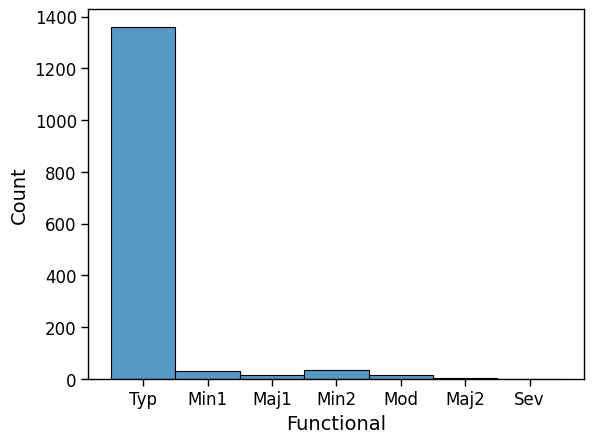


 33. FireplaceQu 
 ____________________________________________________________________________________________________
Gd : Count: 380 | Average Value: 226351.42 | Std: 91003.17 | Max: 611657 | Min: 90350 | Skewness: 1.2 | Kurtosis: 1.77
TA : Count: 313 | Average Value: 205723.49 | Std: 71252.93 | Max: 745000 | Min: 82500 | Skewness: 2.59 | Kurtosis: 13.58
Fa : Count: 33 | Average Value: 167298.48 | Std: 33764.21 | Max: 262000 | Min: 117000 | Skewness: 0.89 | Kurtosis: 0.37
Ex : Count: 24 | Average Value: 337712.5 | Std: 121008.83 | Max: 755000 | Min: 130500 | Skewness: 1.39 | Kurtosis: 3.55
Po : Count: 20 | Average Value: 129764.15 | Std: 30293.86 | Max: 172000 | Min: 60000 | Skewness: -0.83 | Kurtosis: 0.28


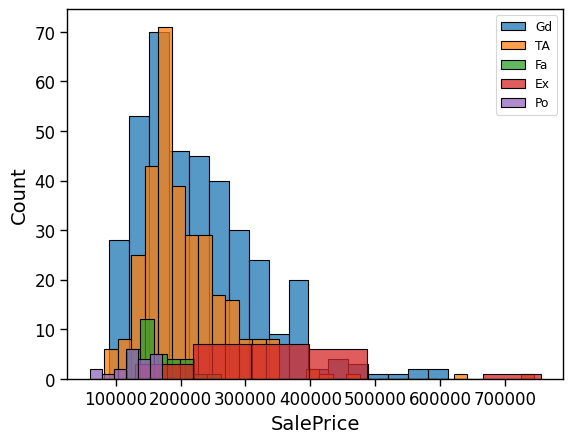

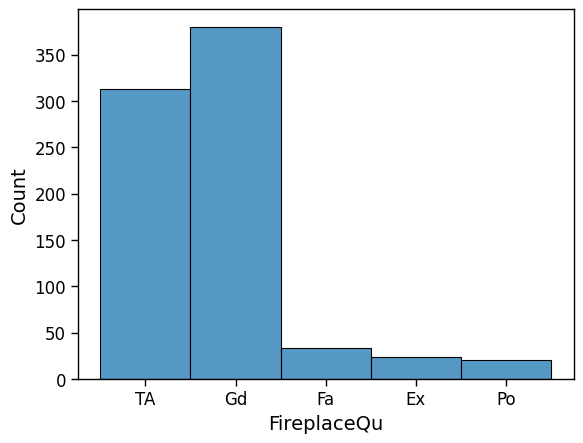


 34. GarageType 
 ____________________________________________________________________________________________________
Attchd : Count: 870 | Average Value: 202892.66 | Std: 77102.27 | Max: 755000 | Min: 60000 | Skewness: 2.03 | Kurtosis: 8.01
Detchd : Count: 387 | Average Value: 134091.16 | Std: 41338.04 | Max: 475000 | Min: 35311 | Skewness: 2.4 | Kurtosis: 13.71
BuiltIn : Count: 88 | Average Value: 254751.74 | Std: 101648.34 | Max: 582933 | Min: 91000 | Skewness: 1.13 | Kurtosis: 1.16
Basment : Count: 19 | Average Value: 160570.68 | Std: 62261.18 | Max: 359100 | Min: 55993 | Skewness: 1.44 | Kurtosis: 3.17
CarPort : Count: 9 | Average Value: 109962.11 | Std: 23229.1 | Max: 164900 | Min: 82000 | Skewness: 1.23 | Kurtosis: 0.84
2Types : Count: 6 | Average Value: 151283.33 | Std: 31874.78 | Max: 186700 | Min: 87000 | Skewness: -1.08 | Kurtosis: 0.05


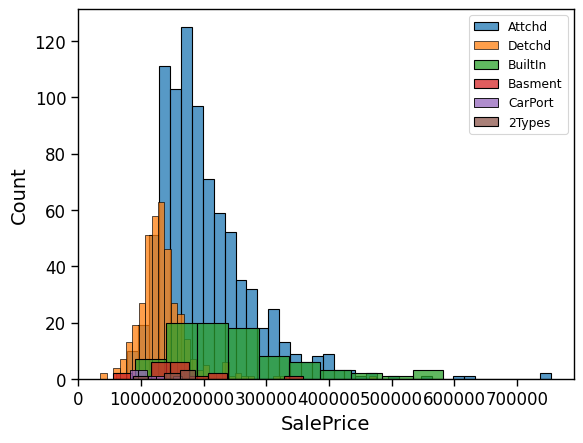

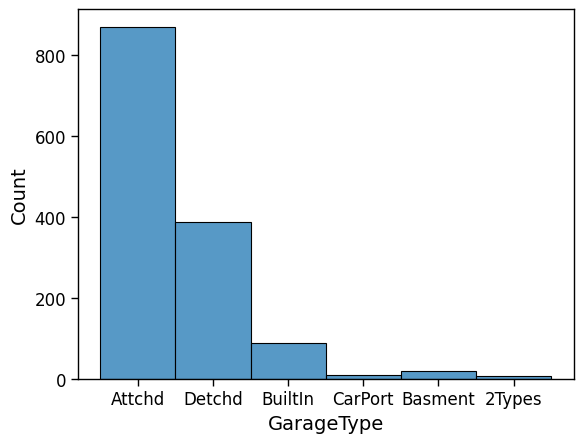


 35. GarageFinish 
 ____________________________________________________________________________________________________
Unf : Count: 605 | Average Value: 142156.42 | Std: 46460.08 | Max: 475000 | Min: 35311 | Skewness: 1.96 | Kurtosis: 7.47
RFn : Count: 422 | Average Value: 202068.87 | Std: 63460.9 | Max: 582933 | Min: 68400 | Skewness: 1.55 | Kurtosis: 4.58
Fin : Count: 352 | Average Value: 240052.69 | Std: 96822.77 | Max: 755000 | Min: 82500 | Skewness: 1.76 | Kurtosis: 4.91


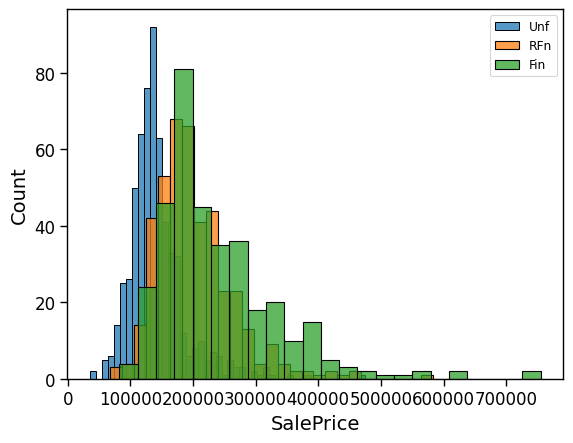

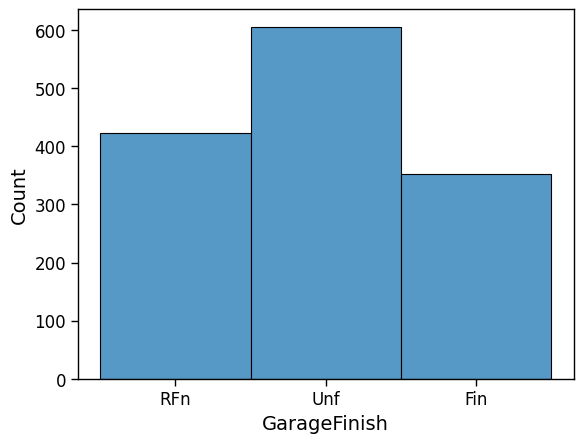


 36. GarageQual 
 ____________________________________________________________________________________________________
TA : Count: 1311 | Average Value: 187489.84 | Std: 78744.9 | Max: 755000 | Min: 35311 | Skewness: 1.97 | Kurtosis: 6.93
Fa : Count: 48 | Average Value: 123573.35 | Std: 42521.47 | Max: 256000 | Min: 64500 | Skewness: 1.55 | Kurtosis: 2.4
Gd : Count: 14 | Average Value: 215860.71 | Std: 71430.31 | Max: 325000 | Min: 90350 | Skewness: -0.02 | Kurtosis: -1.13
Ex : Count: 3 | Average Value: 241000.0 | Std: 165487.66 | Max: 475000 | Min: 120500 | Skewness: 0.71 | Kurtosis: -1.5
Po : Count: 3 | Average Value: 100166.67 | Std: 28694.75 | Max: 137000 | Min: 67000 | Skewness: 0.19 | Kurtosis: -1.5


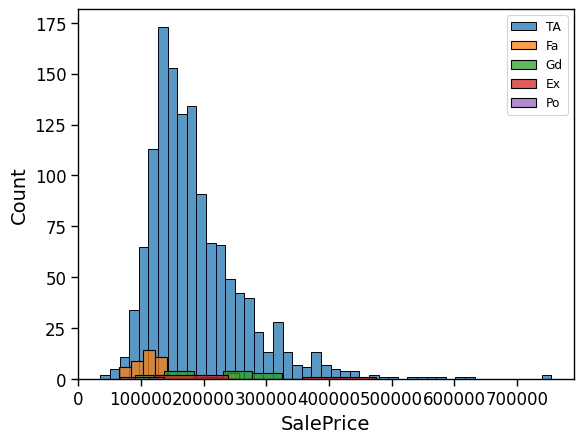

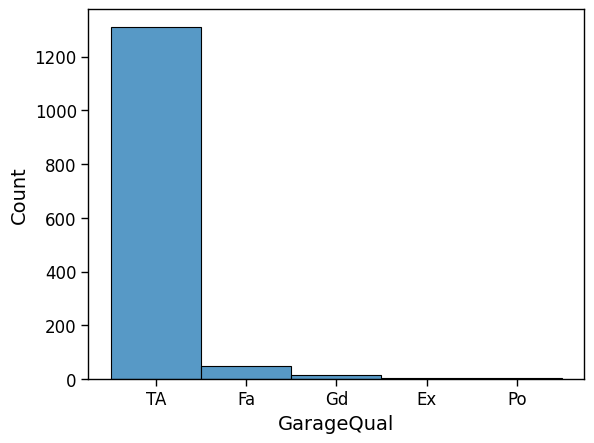


 37. GarageCond 
 ____________________________________________________________________________________________________
TA : Count: 1326 | Average Value: 187885.74 | Std: 79073.49 | Max: 755000 | Min: 35311 | Skewness: 1.95 | Kurtosis: 6.76
Fa : Count: 35 | Average Value: 114654.03 | Std: 35896.83 | Max: 220000 | Min: 40000 | Skewness: 0.43 | Kurtosis: 0.56
Gd : Count: 9 | Average Value: 179930.0 | Std: 61065.1 | Max: 302000 | Min: 118500 | Skewness: 1.08 | Kurtosis: -0.38
Po : Count: 7 | Average Value: 108500.0 | Std: 20981.28 | Max: 137000 | Min: 67000 | Skewness: -0.69 | Kurtosis: -0.25
Ex : Count: 2 | Average Value: 124000.0 | Std: 3500.0 | Max: 127500 | Min: 120500 | Skewness: 0.0 | Kurtosis: -2.0


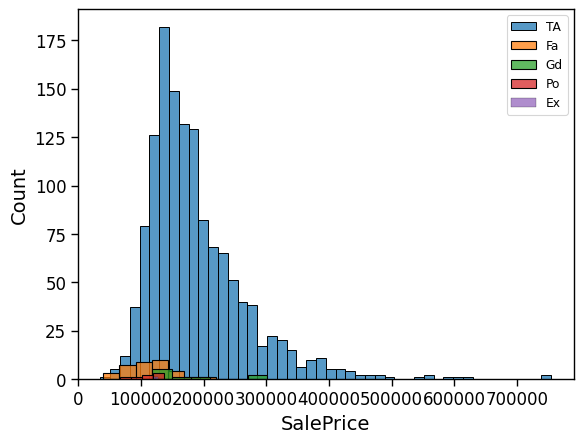

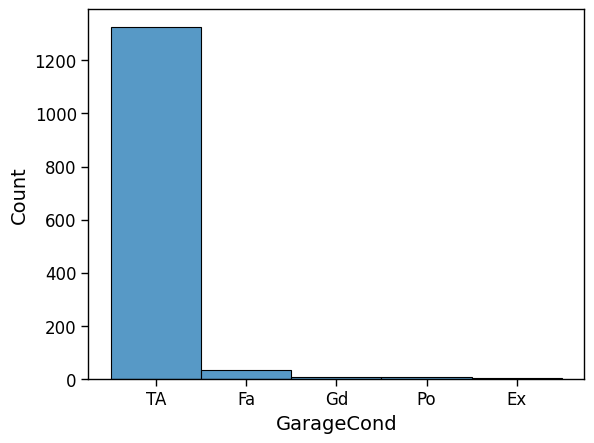


 38. PavedDrive 
 ____________________________________________________________________________________________________
Y : Count: 1340 | Average Value: 186433.97 | Std: 79635.77 | Max: 755000 | Min: 35311 | Skewness: 1.92 | Kurtosis: 6.57
N : Count: 90 | Average Value: 115039.12 | Std: 44105.43 | Max: 265979 | Min: 34900 | Skewness: 0.8 | Kurtosis: 0.86
P : Count: 30 | Average Value: 132330.0 | Std: 32939.91 | Max: 215000 | Min: 79500 | Skewness: 0.27 | Kurtosis: -0.57


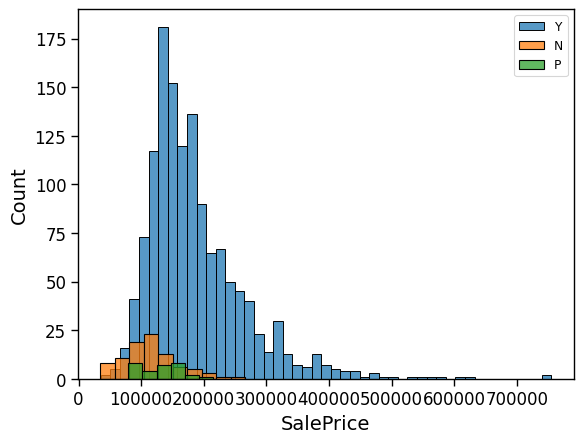

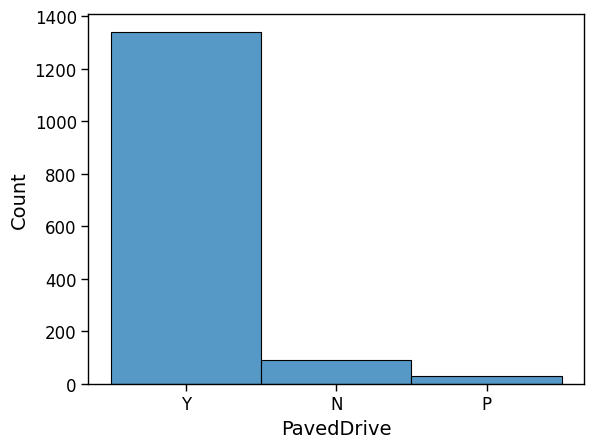


 39. PoolQC 
 ____________________________________________________________________________________________________
Gd : Count: 3 | Average Value: 201990.0 | Std: 51799.68 | Max: 274970 | Min: 160000 | Skewness: 0.68 | Kurtosis: -1.5
Ex : Count: 2 | Average Value: 490000.0 | Std: 255000.0 | Max: 745000 | Min: 235000 | Skewness: 0.0 | Kurtosis: -2.0
Fa : Count: 2 | Average Value: 215500.0 | Std: 34500.0 | Max: 250000 | Min: 181000 | Skewness: 0.0 | Kurtosis: -2.0


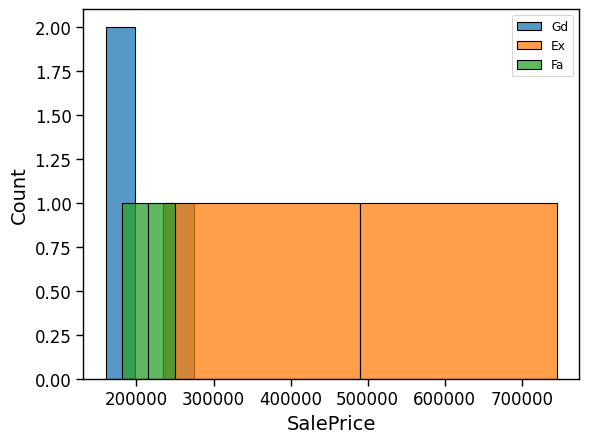

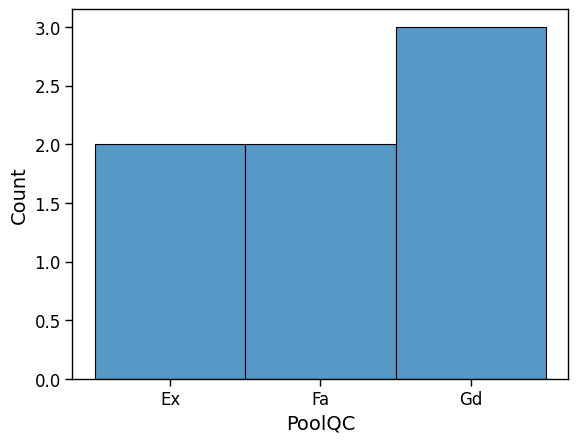


 40. Fence 
 ____________________________________________________________________________________________________
MnPrv : Count: 157 | Average Value: 148751.09 | Std: 65885.24 | Max: 745000 | Min: 40000 | Skewness: 5.14 | Kurtosis: 41.1
GdPrv : Count: 59 | Average Value: 178927.46 | Std: 56274.19 | Max: 475000 | Min: 108000 | Skewness: 2.64 | Kurtosis: 10.71
GdWo : Count: 54 | Average Value: 140379.31 | Std: 53094.04 | Max: 381000 | Min: 34900 | Skewness: 1.91 | Kurtosis: 7.14
MnWw : Count: 11 | Average Value: 134286.36 | Std: 20768.14 | Max: 187000 | Min: 110000 | Skewness: 1.22 | Kurtosis: 1.15


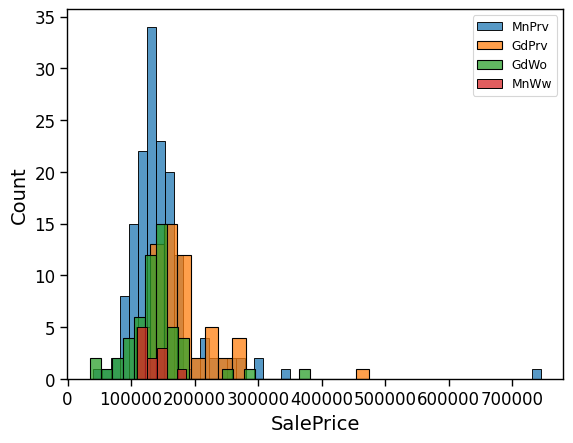

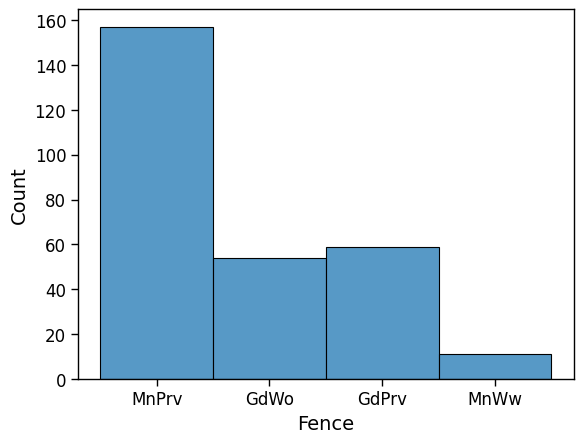


 41. MiscFeature 
 ____________________________________________________________________________________________________
Shed : Count: 49 | Average Value: 151187.61 | Std: 51113.05 | Max: 277000 | Min: 55993 | Skewness: 0.65 | Kurtosis: 0.18
Gar2 : Count: 2 | Average Value: 170750.0 | Std: 19250.0 | Max: 190000 | Min: 151500 | Skewness: 0.0 | Kurtosis: -2.0
Othr : Count: 2 | Average Value: 94000.0 | Std: 39000.0 | Max: 133000 | Min: 55000 | Skewness: 0.0 | Kurtosis: -2.0
TenC : Count: 1 | Average Value: 250000.0 | Std: 0.0 | Max: 250000 | Min: 250000 | Skewness: nan | Kurtosis: nan


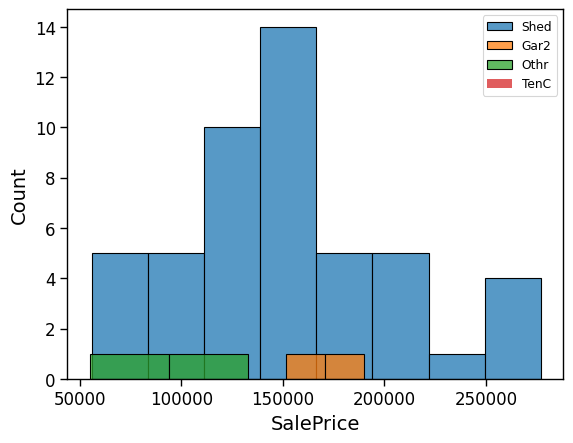

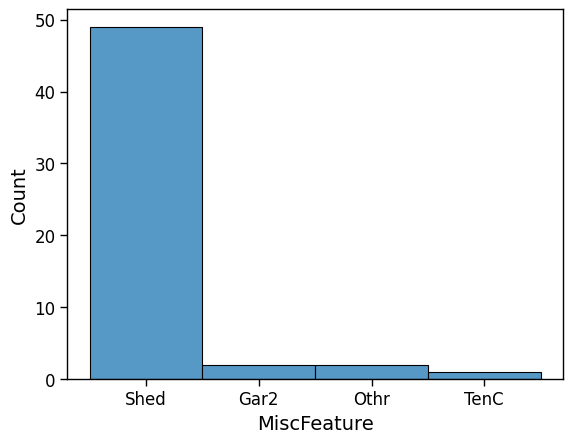


 42. SaleType 
 ____________________________________________________________________________________________________
WD : Count: 1267 | Average Value: 173401.84 | Std: 71101.61 | Max: 755000 | Min: 34900 | Skewness: 2.02 | Kurtosis: 9.32
New : Count: 122 | Average Value: 274945.42 | Std: 102815.6 | Max: 611657 | Min: 113000 | Skewness: 0.93 | Kurtosis: 0.4
COD : Count: 43 | Average Value: 143973.26 | Std: 46547.42 | Max: 287000 | Min: 60000 | Skewness: 0.99 | Kurtosis: 1.23
ConLD : Count: 9 | Average Value: 138780.89 | Std: 50795.31 | Max: 235128 | Min: 79900 | Skewness: 0.48 | Kurtosis: -0.82
ConLI : Count: 5 | Average Value: 200390.0 | Std: 129944.64 | Max: 451950 | Min: 110000 | Skewness: 1.29 | Kurtosis: -0.08
ConLw : Count: 5 | Average Value: 143700.0 | Std: 60187.71 | Max: 212000 | Min: 60000 | Skewness: -0.11 | Kurtosis: -1.58
CWD : Count: 4 | Average Value: 210600.0 | Std: 74843.2 | Max: 328900 | Min: 136000 | Skewness: 0.65 | Kurtosis: -1.13
Oth : Count: 3 | Average Value: 11

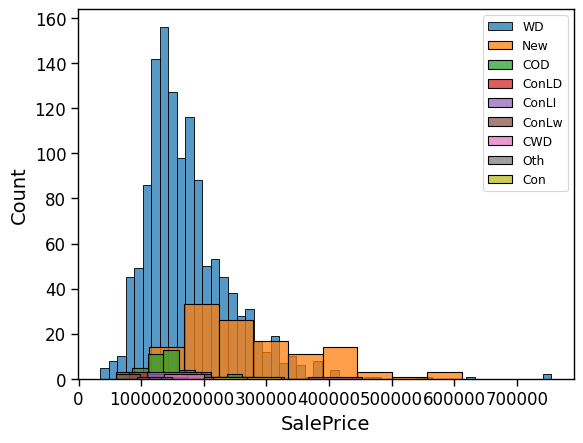

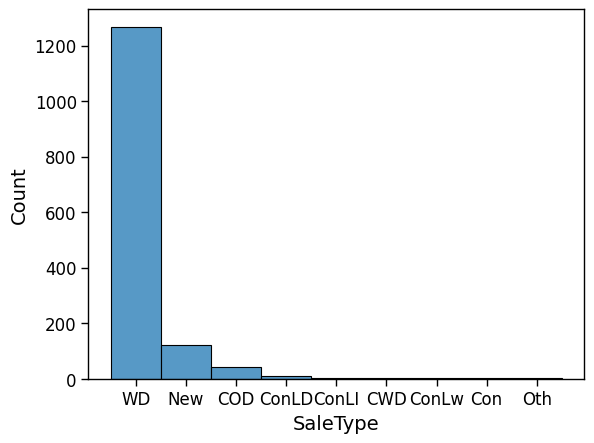


 43. SaleCondition 
 ____________________________________________________________________________________________________
Normal : Count: 1198 | Average Value: 175202.22 | Std: 69684.53 | Max: 755000 | Min: 39300 | Skewness: 1.82 | Kurtosis: 7.23
Partial : Count: 125 | Average Value: 272291.75 | Std: 103280.79 | Max: 611657 | Min: 113000 | Skewness: 0.93 | Kurtosis: 0.42
Abnorml : Count: 101 | Average Value: 146526.62 | Std: 82385.31 | Max: 745000 | Min: 34900 | Skewness: 4.02 | Kurtosis: 25.45
Family : Count: 20 | Average Value: 149600.0 | Std: 46609.17 | Max: 259000 | Min: 82500 | Skewness: 0.79 | Kurtosis: -0.06
Alloca : Count: 12 | Average Value: 167377.42 | Std: 80864.8 | Max: 359100 | Min: 55993 | Skewness: 0.96 | Kurtosis: 0.32
AdjLand : Count: 4 | Average Value: 104125.0 | Std: 22633.98 | Max: 127500 | Min: 81000 | Skewness: 0.0 | Kurtosis: -2.0


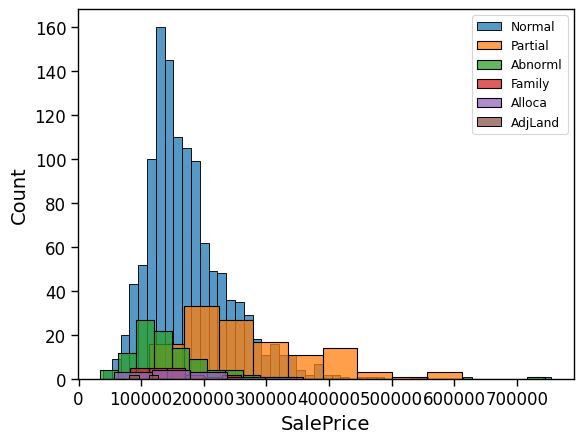

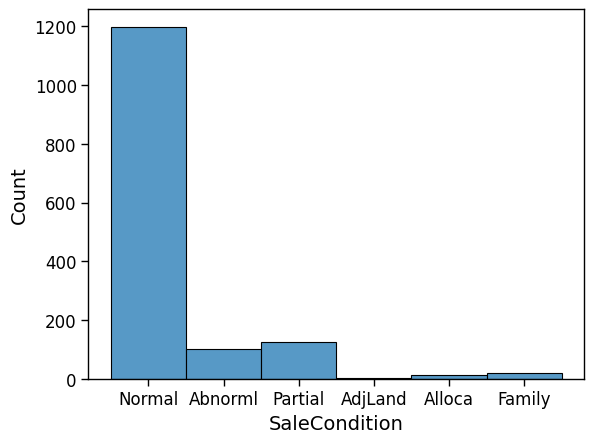

In [ ]:
# Looking at statistics for all non-numeric features
# to assist with decision to keep or drop certain features

plt.figure(figsize = (14,8))
for n, feature in enumerate(string_cols):
    print(f'\n {n+1}. {feature} \n', '_'*100)
    for type_of in train[feature].value_counts().keys():
        count = len(train[(train[feature] == type_of)])
        average = round(train[(train[feature] == type_of)]["SalePrice"].mean(), 2)
        std = round(np.std(train[(train[feature] == type_of)]["SalePrice"]), 2)
        max = round(train[(train[feature] == type_of)]["SalePrice"].max(), 2)
        min = round(train[(train[feature] == type_of)]["SalePrice"].min(), 2)
        skewness = round(skew(train[(train[feature] == type_of)]["SalePrice"]), 2)
        kurt = round(kurtosis(train[(train[feature] == type_of)]["SalePrice"]), 2)
        sns.histplot(data = train, x = train[(train[feature] == type_of)]["SalePrice"], label = type_of)
        if max - min > std*3 or std == 0 or count < 20:
            print(f'{type_of} : Count: {count} | Average Value: {average} | Std: {std} | Max: {max} | Min: {min} | Skewness: {skewness} | Kurtosis: {kurt}')
        else:
            print(f'{type_of} : Count: {count} | Average Value: {average} | Std: {std} | Max: {max} | Min: {min} | Skewness: {skewness} | Kurtosis: {kurt} ****')
    plt.legend()
    plt.show()
    sns.histplot(train[feature])
    plt.show()



 1. BsmtFullBath 
 ____________________________________________________________________________________________________
count   1460.000
mean       0.425
std        0.519
min        0.000
25%        0.000
50%        0.000
75%        1.000
max        3.000
Name: BsmtFullBath, dtype: float64


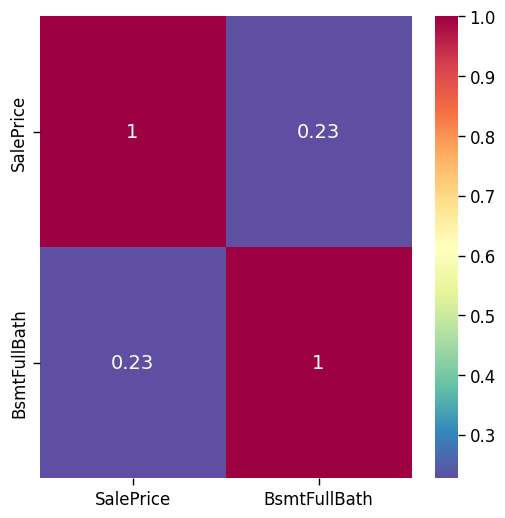

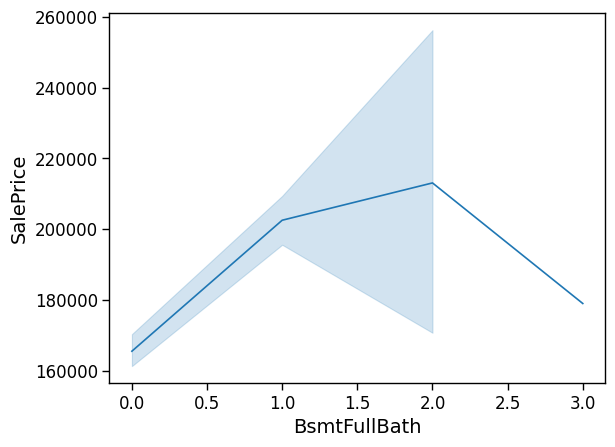

Z outliers - 16 | IQR outliers - 1


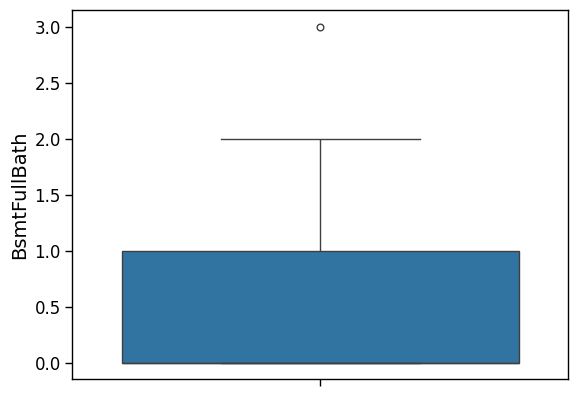

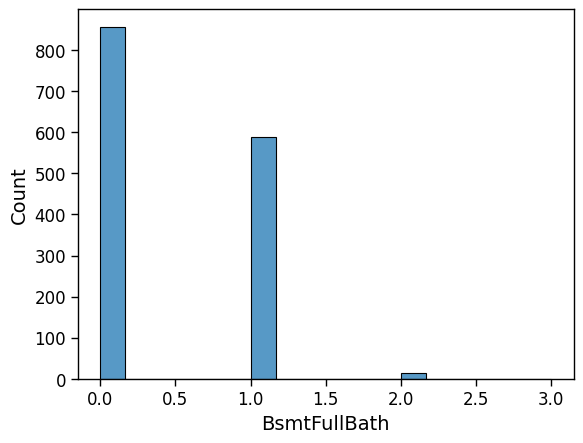




 2. Fireplaces 
 ____________________________________________________________________________________________________
count   1460.000
mean       0.613
std        0.645
min        0.000
25%        0.000
50%        1.000
75%        1.000
max        3.000
Name: Fireplaces, dtype: float64


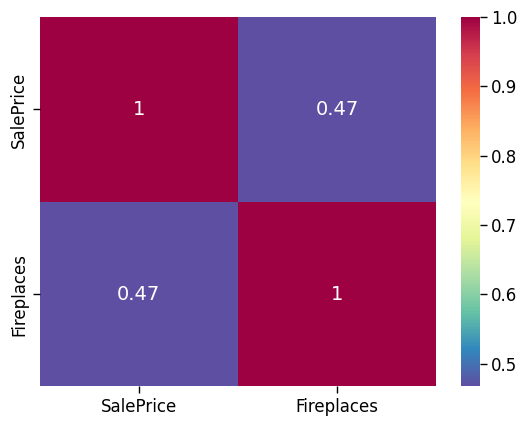

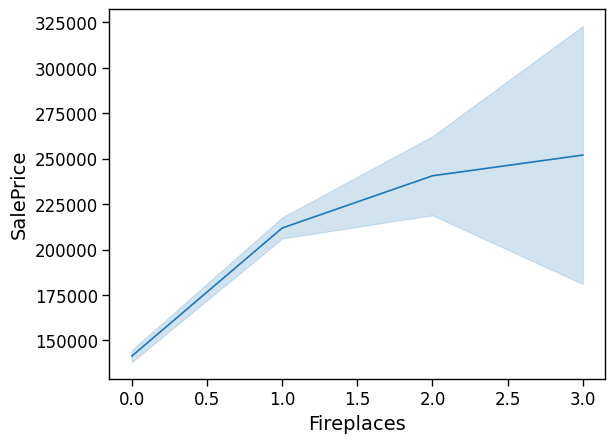

Z outliers - 5 | IQR outliers - 5


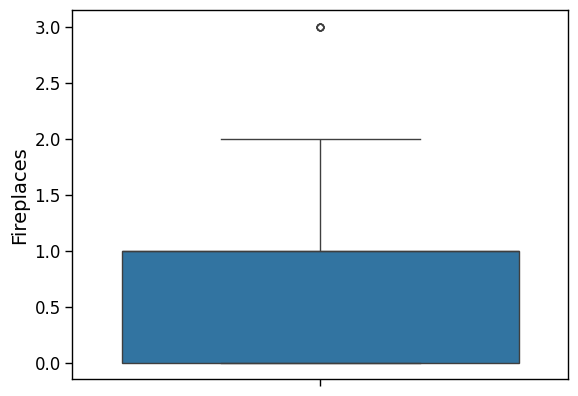

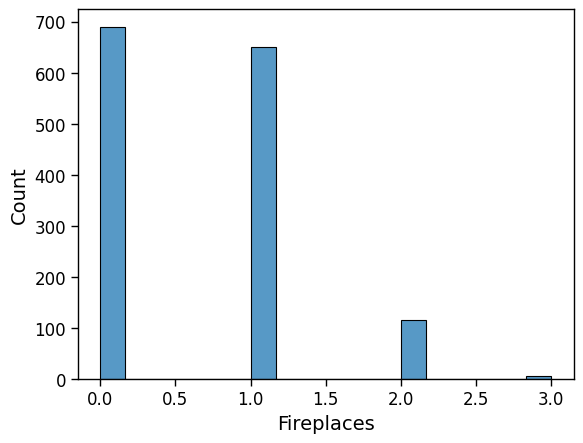




 3. YearRemodAdd 
 ____________________________________________________________________________________________________
count   1460.000
mean    1984.866
std       20.645
min     1950.000
25%     1967.000
50%     1994.000
75%     2004.000
max     2010.000
Name: YearRemodAdd, dtype: float64


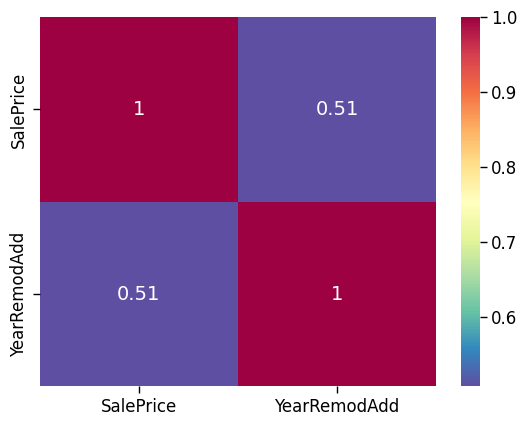

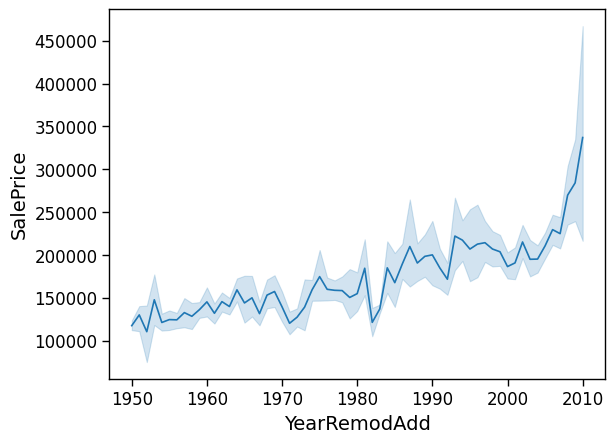

Z outliers - 0 | IQR outliers - 0


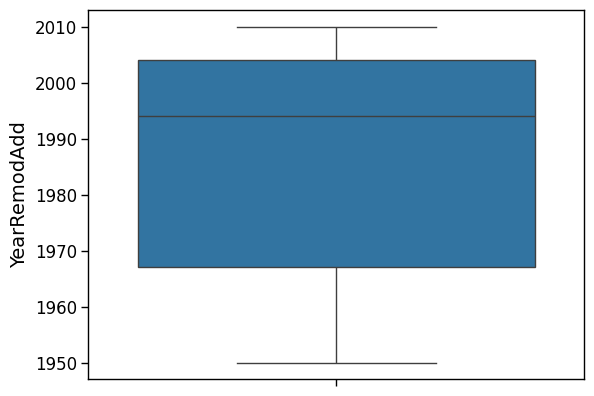

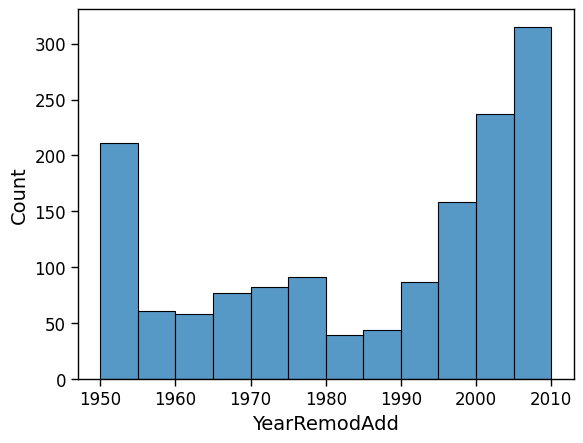




 4. GarageYrBlt 
 ____________________________________________________________________________________________________
count   1379.000
mean    1978.506
std       24.690
min     1900.000
25%     1961.000
50%     1980.000
75%     2002.000
max     2010.000
Name: GarageYrBlt, dtype: float64


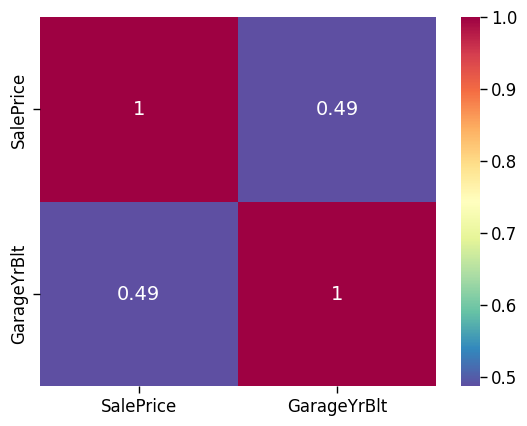

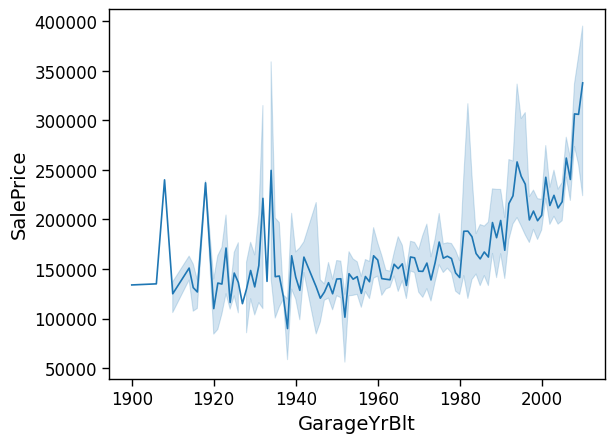

Z outliers - 0 | IQR outliers - 0


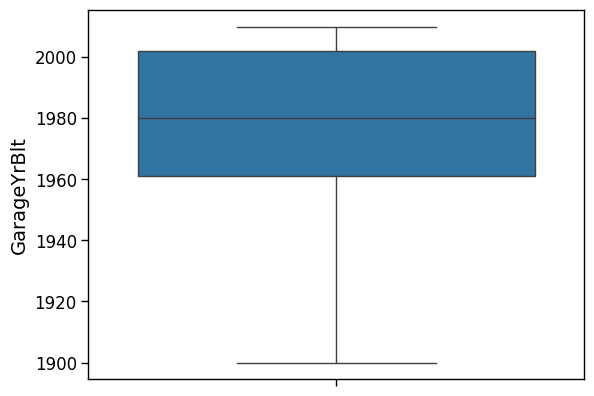

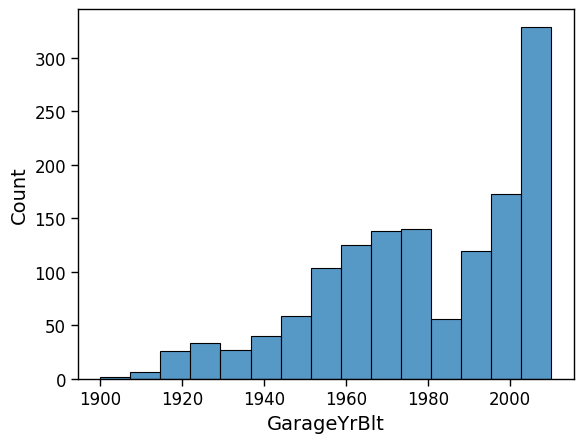




 5. GarageCars 
 ____________________________________________________________________________________________________
count   1460.000
mean       1.767
std        0.747
min        0.000
25%        1.000
50%        2.000
75%        2.000
max        4.000
Name: GarageCars, dtype: float64


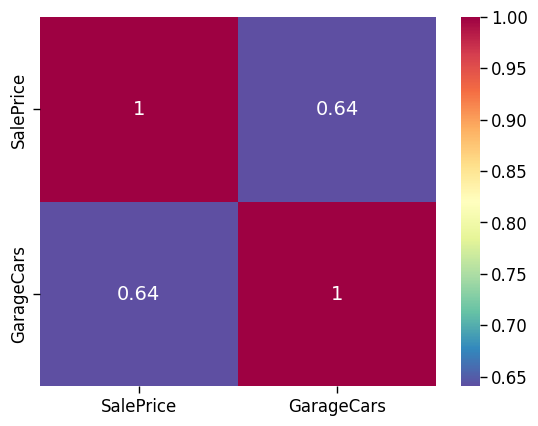

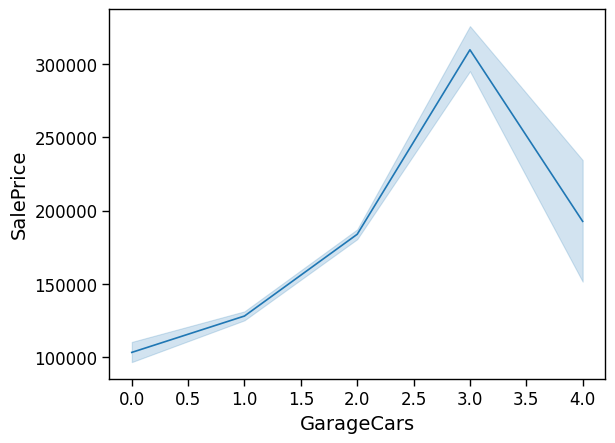

Z outliers - 0 | IQR outliers - 5


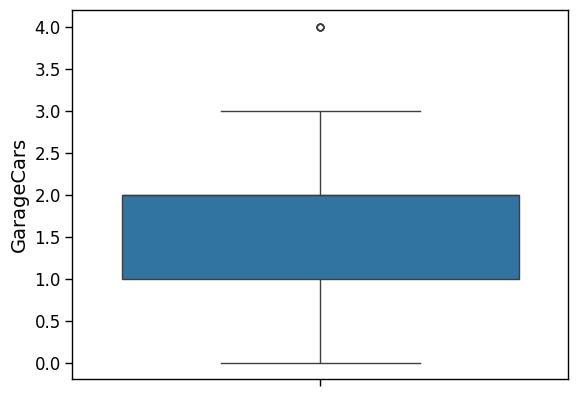

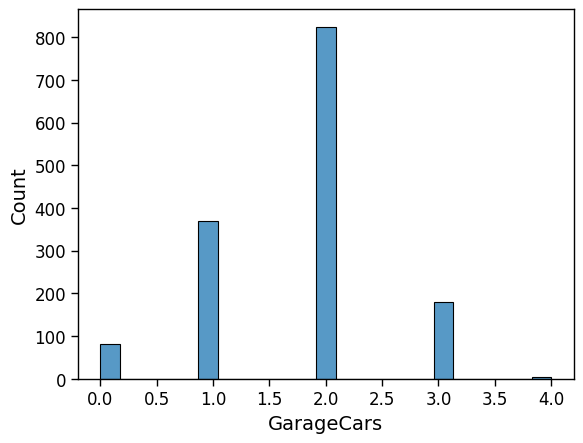




 6. KitchenAbvGr 
 ____________________________________________________________________________________________________
count   1460.000
mean       1.047
std        0.220
min        0.000
25%        1.000
50%        1.000
75%        1.000
max        3.000
Name: KitchenAbvGr, dtype: float64


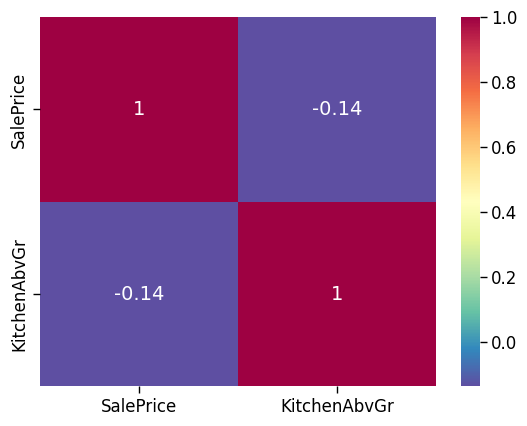

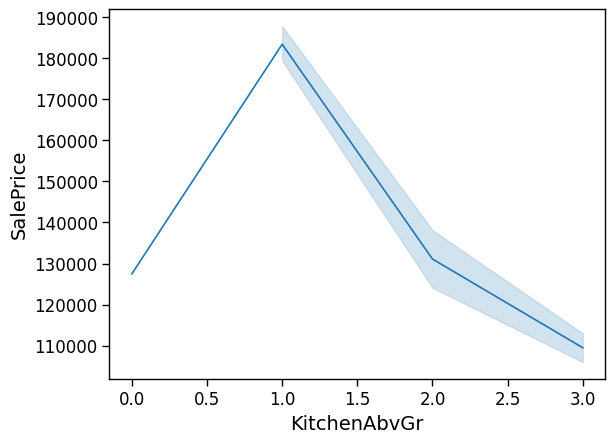

Z outliers - 68 | IQR outliers - 2852


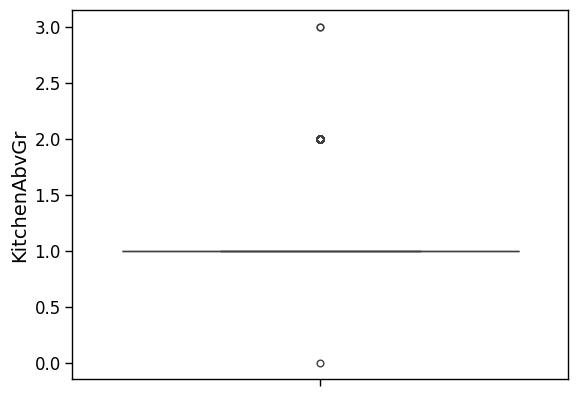

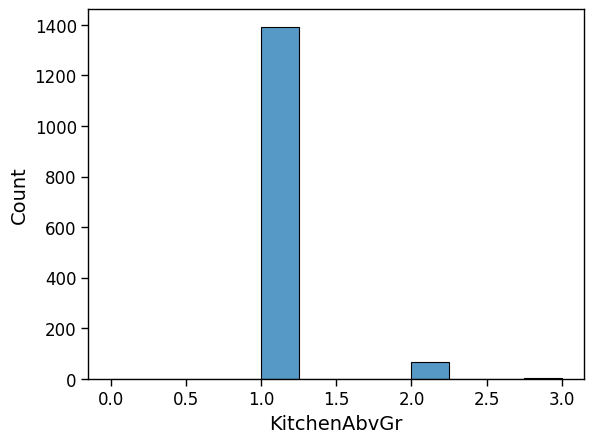




 7. MiscVal 
 ____________________________________________________________________________________________________
count    1460.000
mean       43.489
std       496.123
min         0.000
25%         0.000
50%         0.000
75%         0.000
max     15500.000
Name: MiscVal, dtype: float64


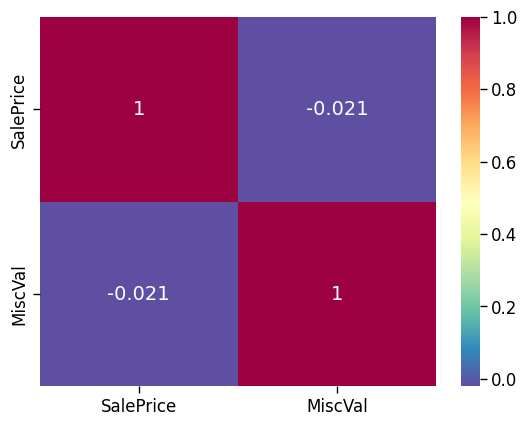

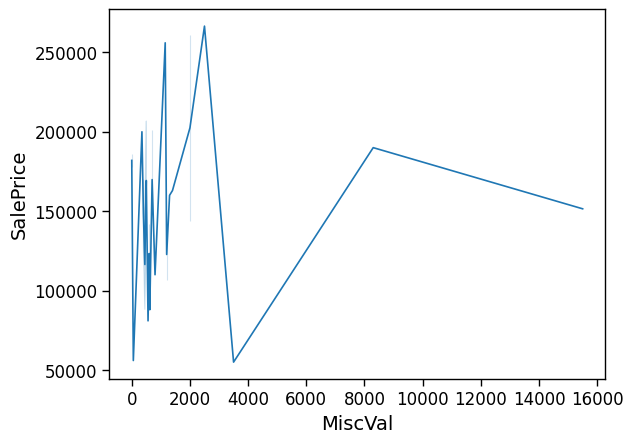

Z outliers - 8 | IQR outliers - 2868


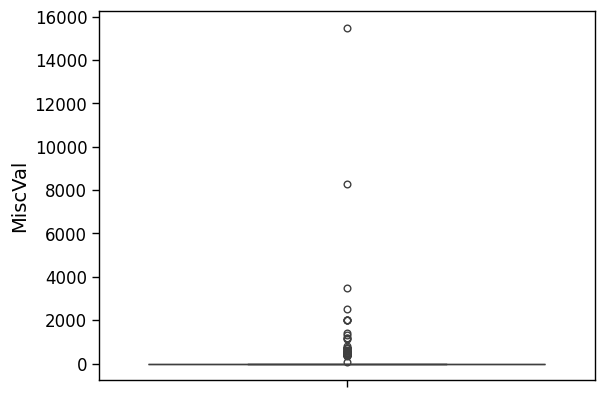

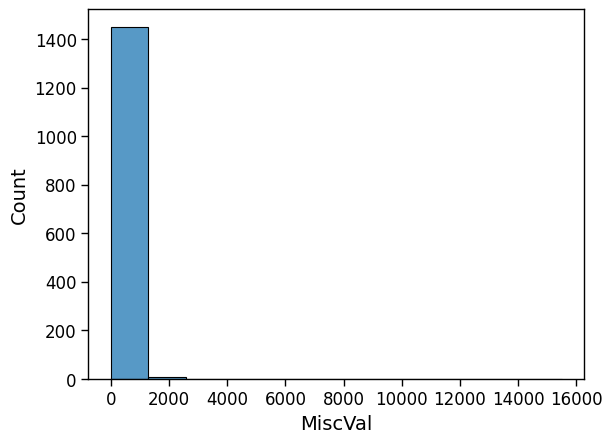




 8. OverallCond 
 ____________________________________________________________________________________________________
count   1460.000
mean       5.575
std        1.113
min        1.000
25%        5.000
50%        5.000
75%        6.000
max        9.000
Name: OverallCond, dtype: float64


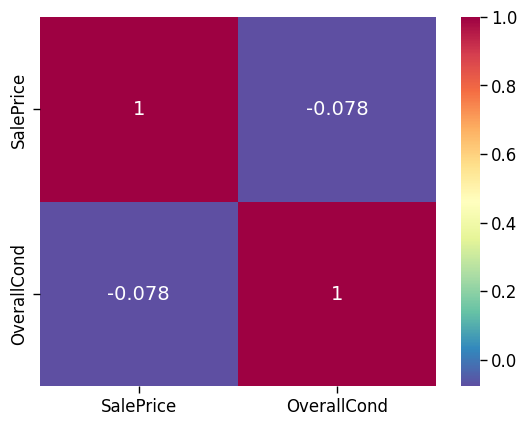

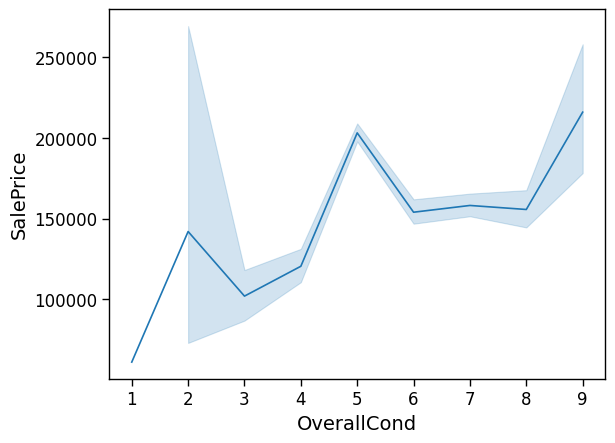

Z outliers - 28 | IQR outliers - 125


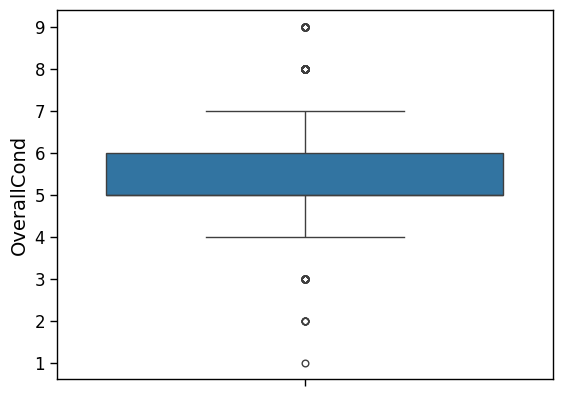

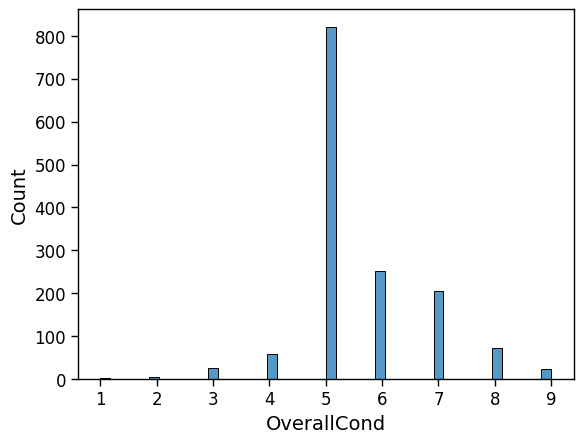




 9. MSSubClass 
 ____________________________________________________________________________________________________
count   1460.000
mean      56.897
std       42.301
min       20.000
25%       20.000
50%       50.000
75%       70.000
max      190.000
Name: MSSubClass, dtype: float64


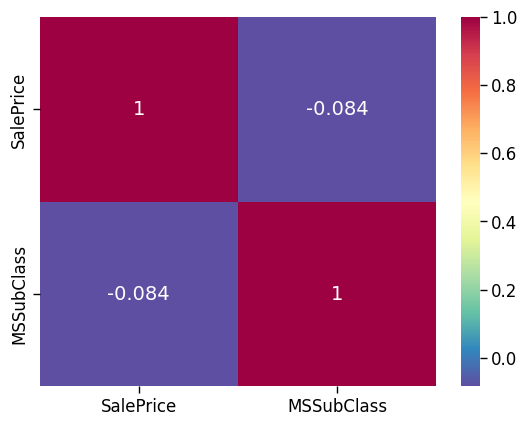

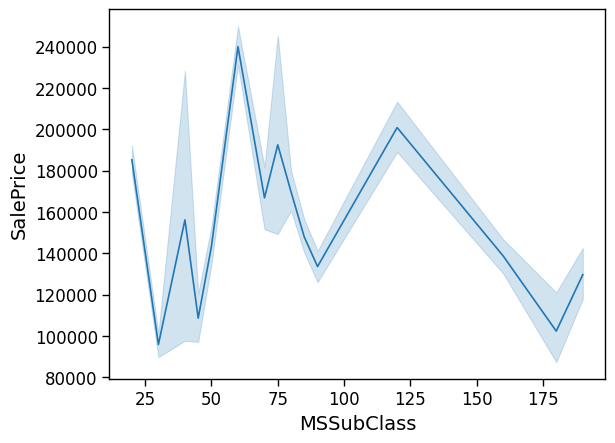

Z outliers - 30 | IQR outliers - 40


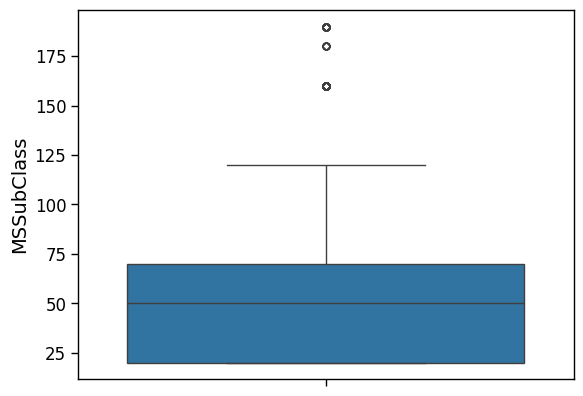

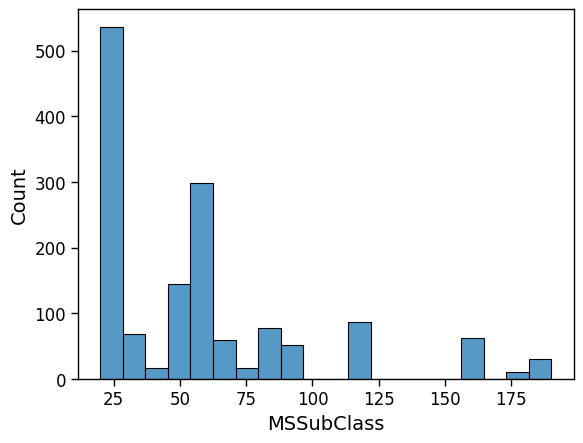




 10. WoodDeckSF 
 ____________________________________________________________________________________________________
count   1460.000
mean      94.245
std      125.339
min        0.000
25%        0.000
50%        0.000
75%      168.000
max      857.000
Name: WoodDeckSF, dtype: float64


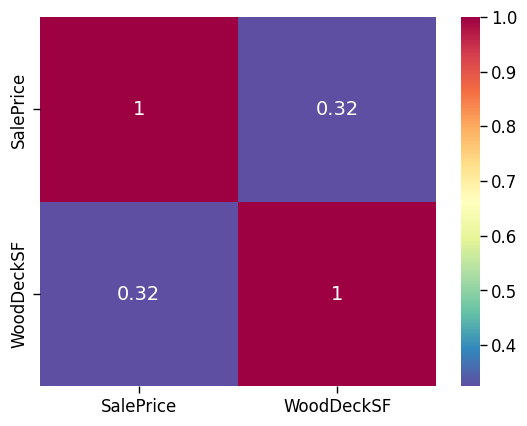

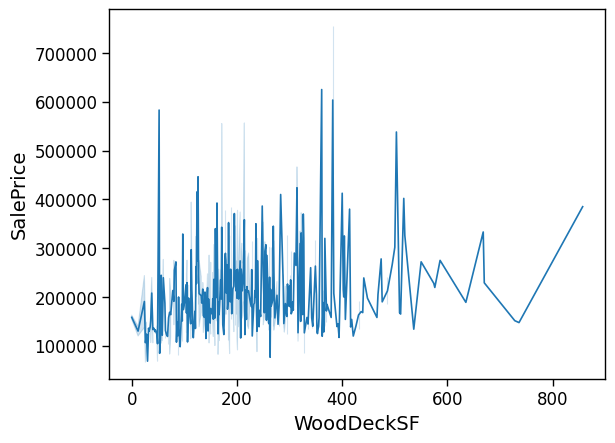

Z outliers - 22 | IQR outliers - 15


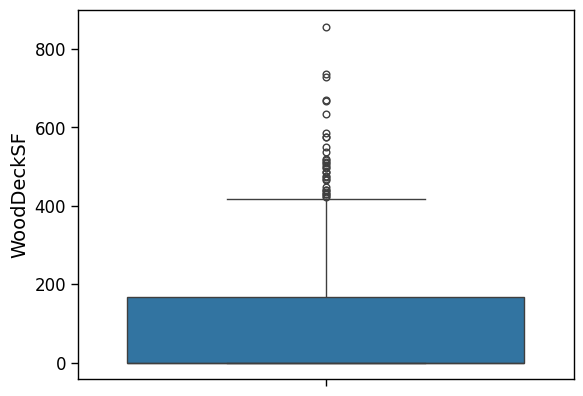

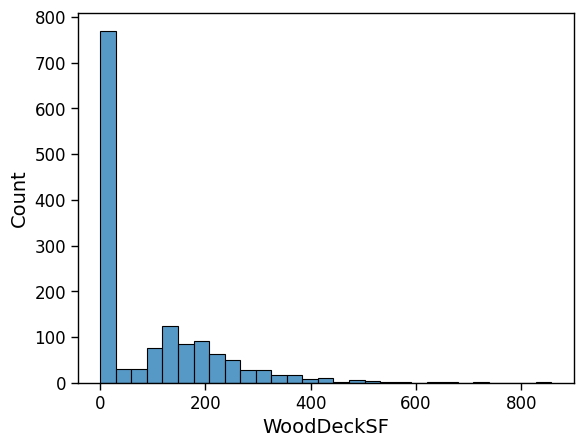




 11. BsmtFinSF1 
 ____________________________________________________________________________________________________
count   1460.000
mean     443.640
std      456.098
min        0.000
25%        0.000
50%      383.500
75%      712.250
max     5644.000
Name: BsmtFinSF1, dtype: float64


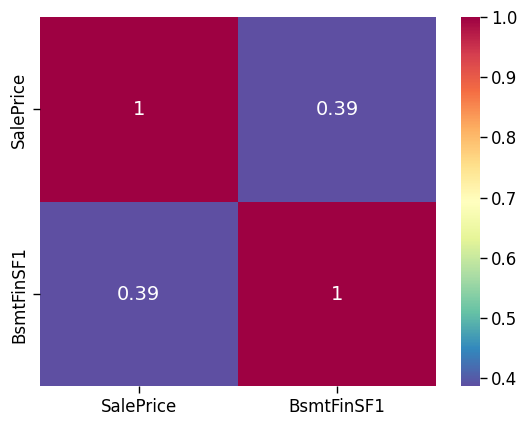

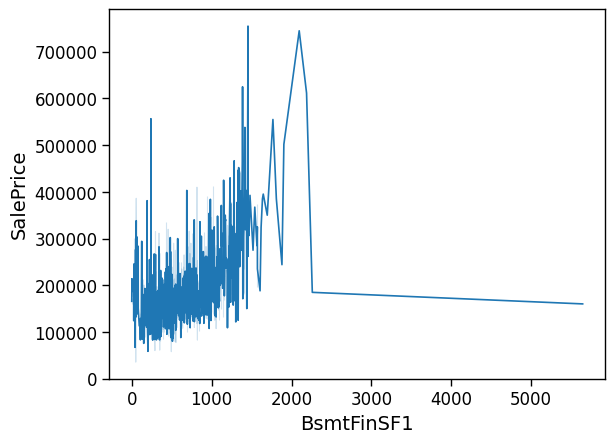

Z outliers - 6 | IQR outliers - 3


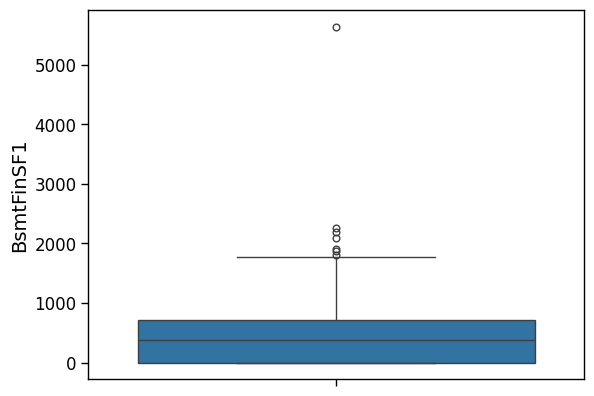

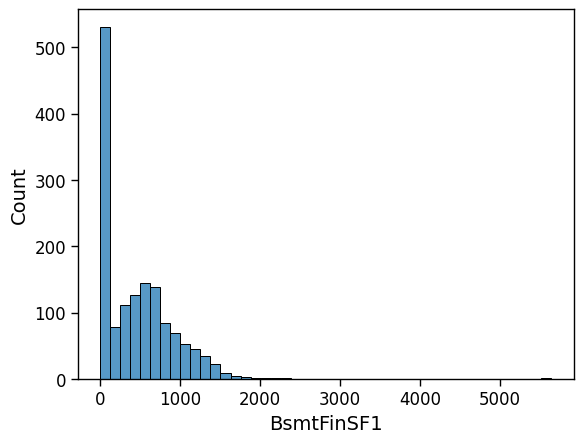




 12. ScreenPorch 
 ____________________________________________________________________________________________________
count   1460.000
mean      15.061
std       55.757
min        0.000
25%        0.000
50%        0.000
75%        0.000
max      480.000
Name: ScreenPorch, dtype: float64


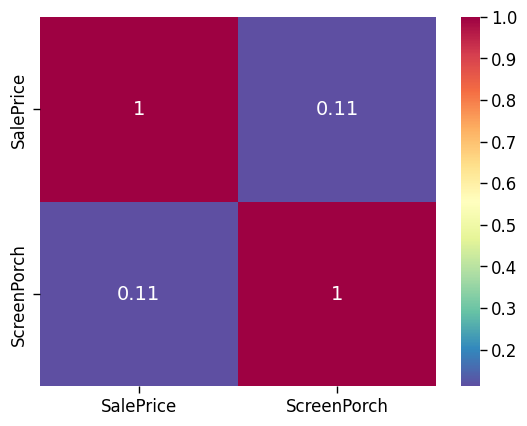

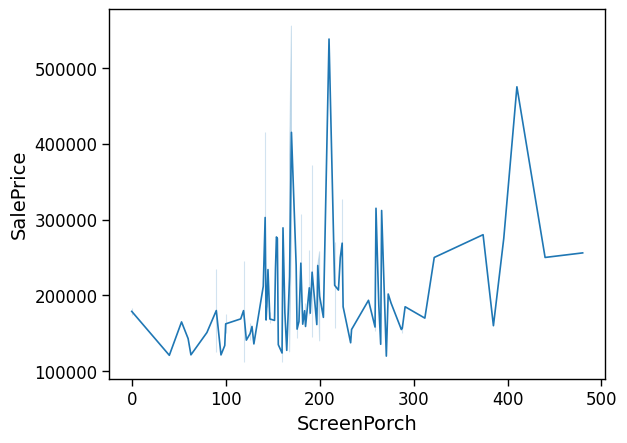

Z outliers - 55 | IQR outliers - 2804


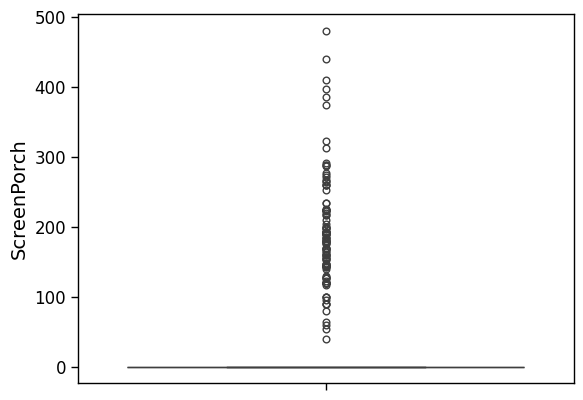

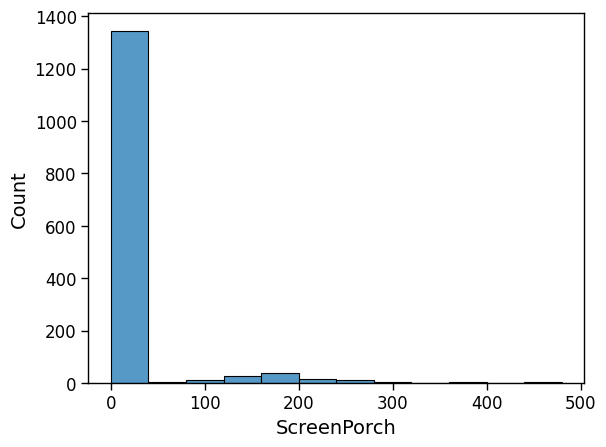




 13. YrSold 
 ____________________________________________________________________________________________________
count   1460.000
mean    2007.816
std        1.328
min     2006.000
25%     2007.000
50%     2008.000
75%     2009.000
max     2010.000
Name: YrSold, dtype: float64


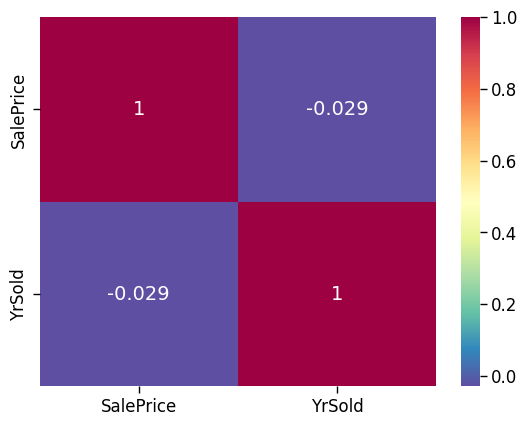

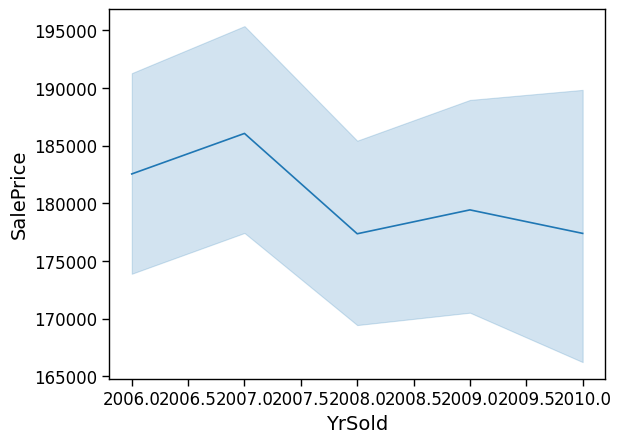

Z outliers - 0 | IQR outliers - 0


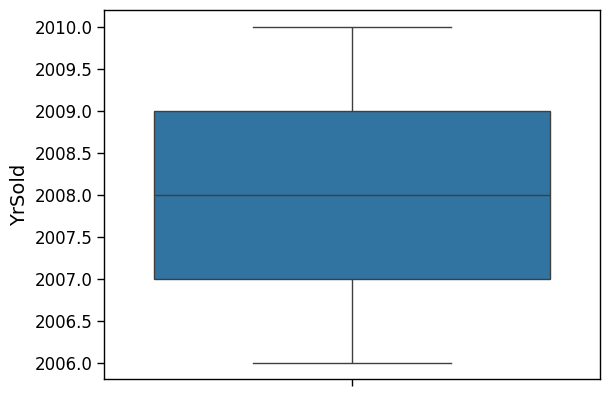

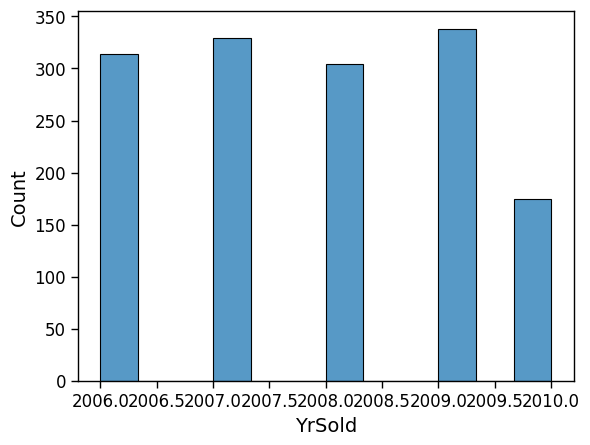




 14. LotFrontage 
 ____________________________________________________________________________________________________
count   1201.000
mean      70.050
std       24.285
min       21.000
25%       59.000
50%       69.000
75%       80.000
max      313.000
Name: LotFrontage, dtype: float64


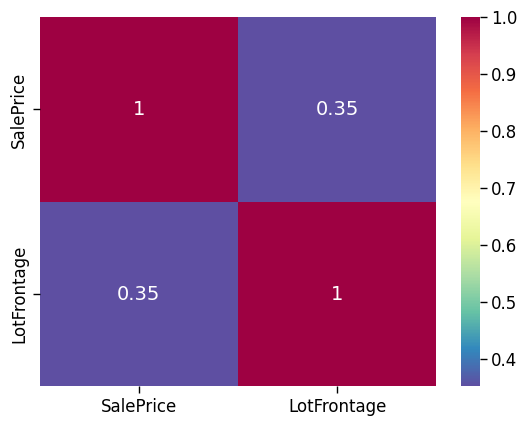

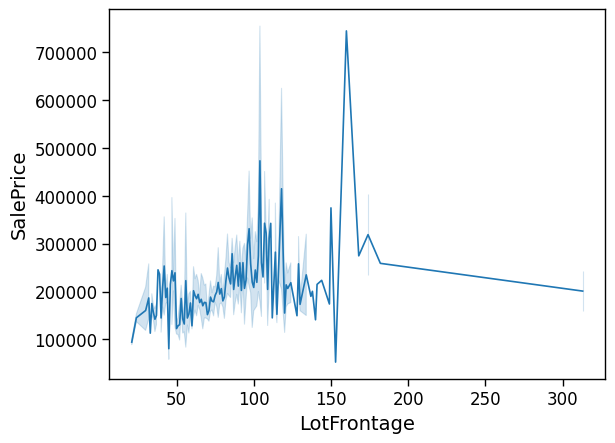

Z outliers - 0 | IQR outliers - 0


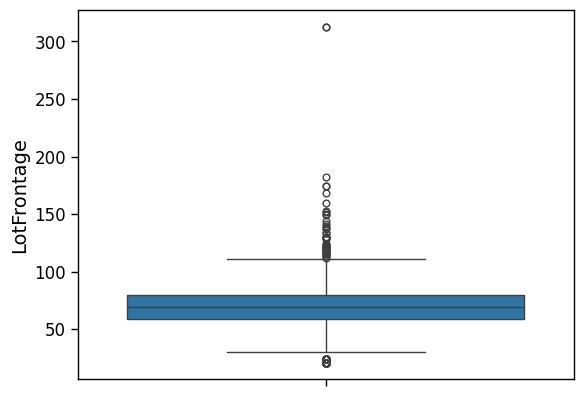

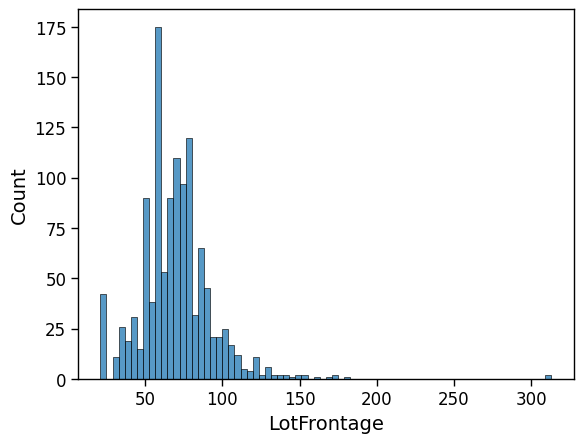




 15. 2ndFlrSF 
 ____________________________________________________________________________________________________
count   1460.000
mean     346.992
std      436.528
min        0.000
25%        0.000
50%        0.000
75%      728.000
max     2065.000
Name: 2ndFlrSF, dtype: float64


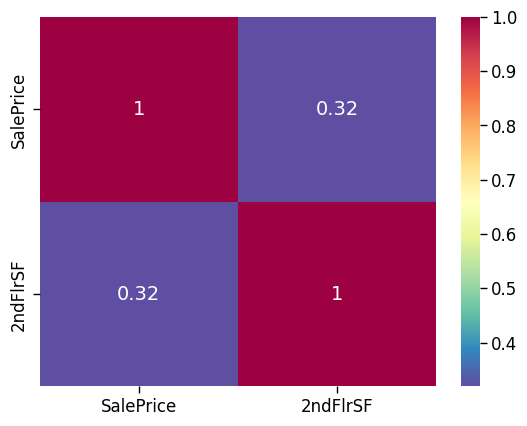

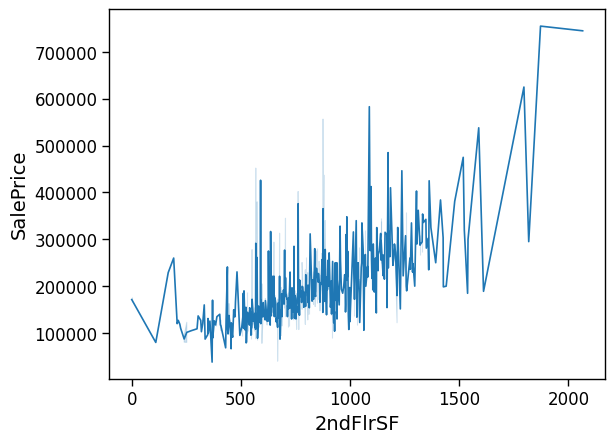

Z outliers - 4 | IQR outliers - 0


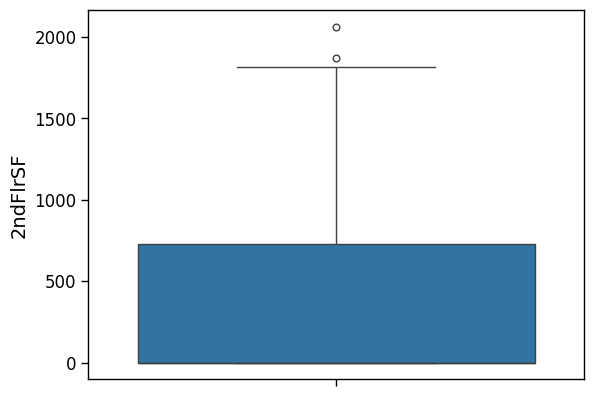

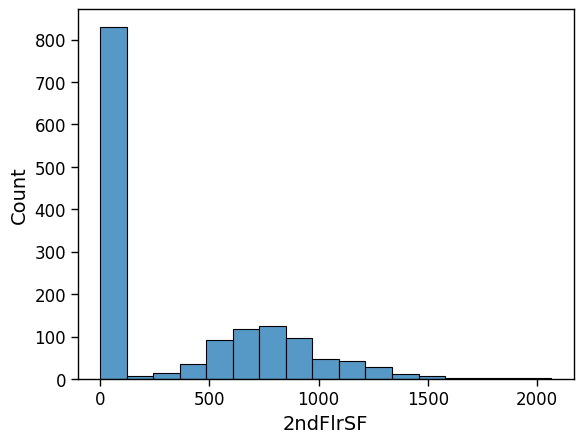




 16. TotalBsmtSF 
 ____________________________________________________________________________________________________
count   1460.000
mean    1057.429
std      438.705
min        0.000
25%      795.750
50%      991.500
75%     1298.250
max     6110.000
Name: TotalBsmtSF, dtype: float64


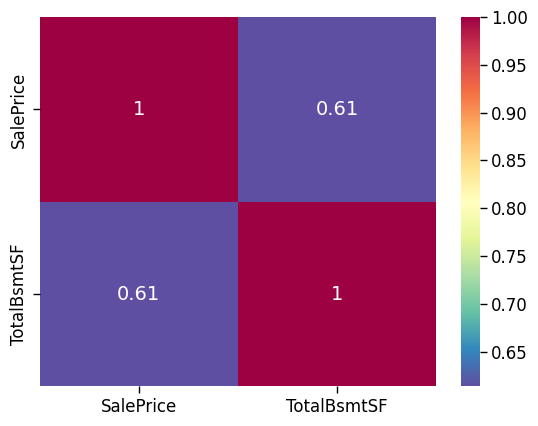

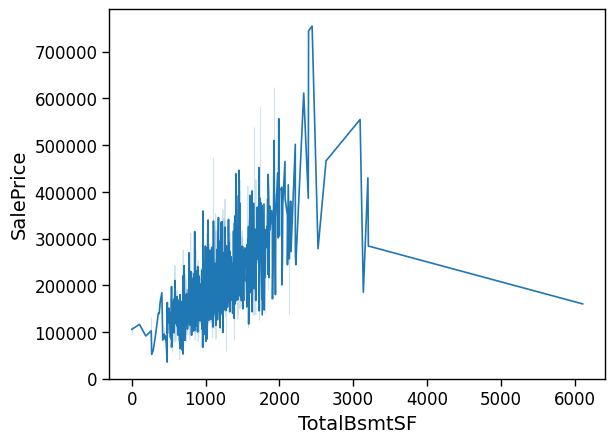

Z outliers - 10 | IQR outliers - 11


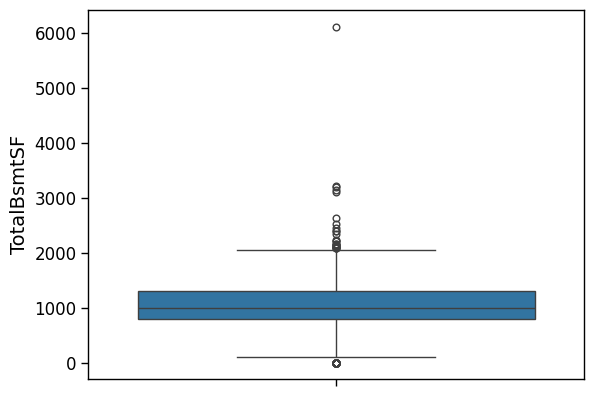

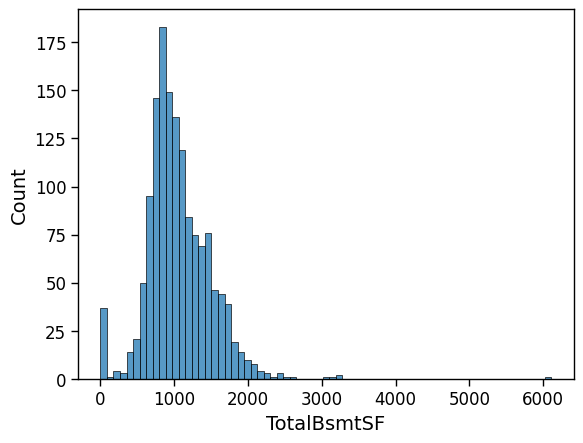




 17. GrLivArea 
 ____________________________________________________________________________________________________
count   1460.000
mean    1515.464
std      525.480
min      334.000
25%     1129.500
50%     1464.000
75%     1776.750
max     5642.000
Name: GrLivArea, dtype: float64


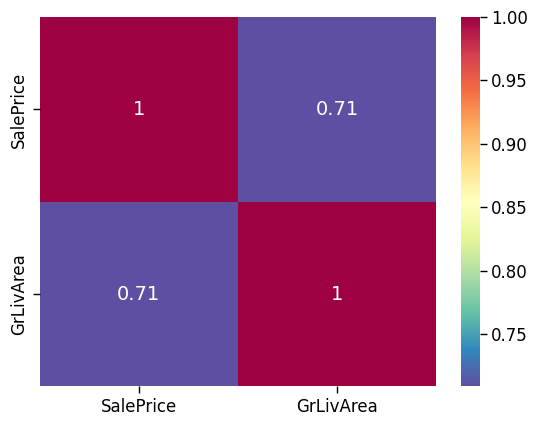

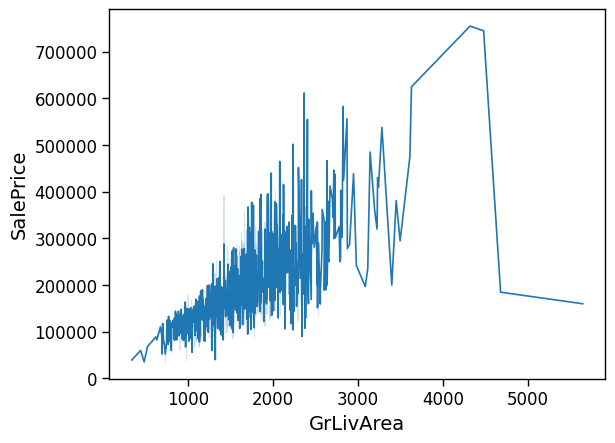

Z outliers - 16 | IQR outliers - 18


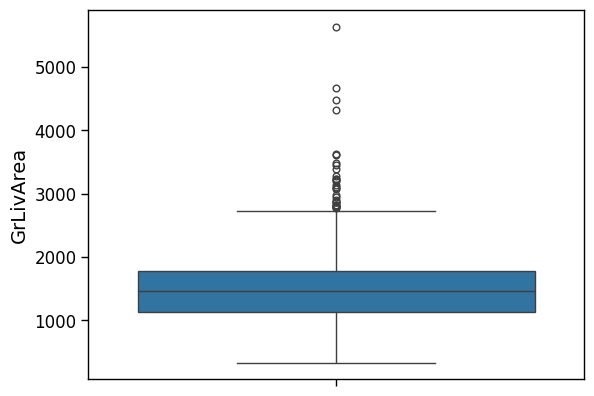

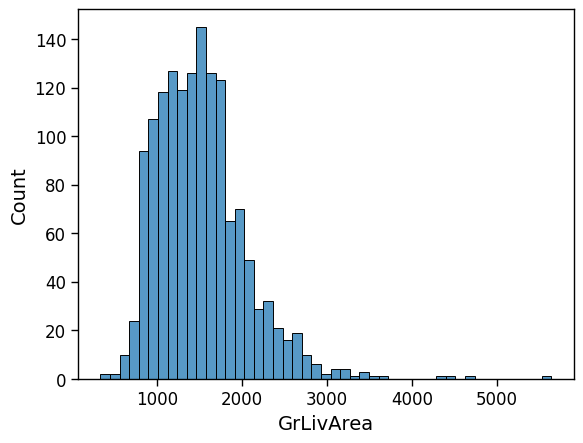




 18. LowQualFinSF 
 ____________________________________________________________________________________________________
count   1460.000
mean       5.845
std       48.623
min        0.000
25%        0.000
50%        0.000
75%        0.000
max      572.000
Name: LowQualFinSF, dtype: float64


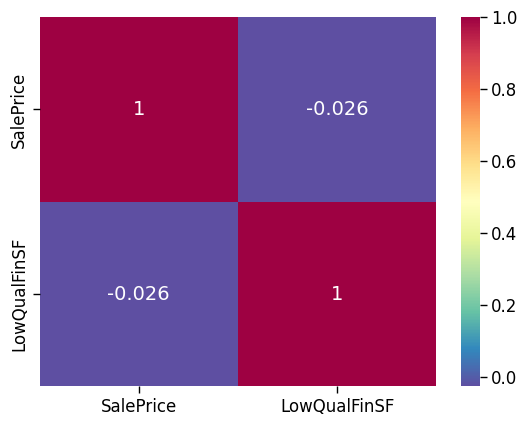

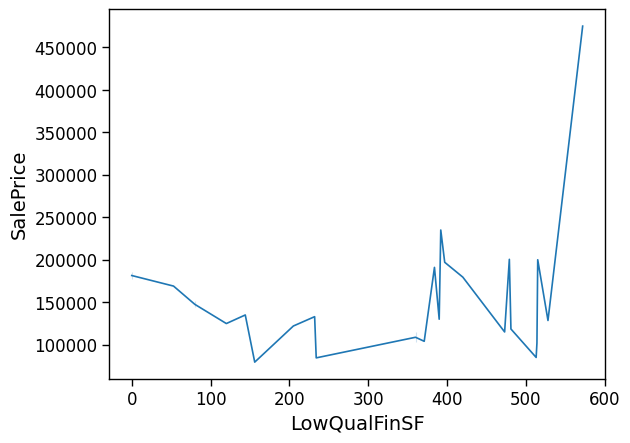

Z outliers - 20 | IQR outliers - 2894


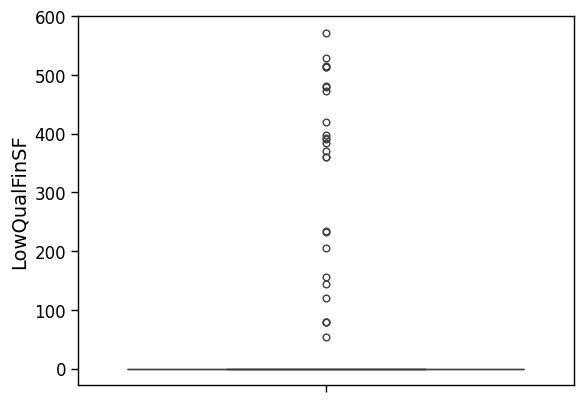

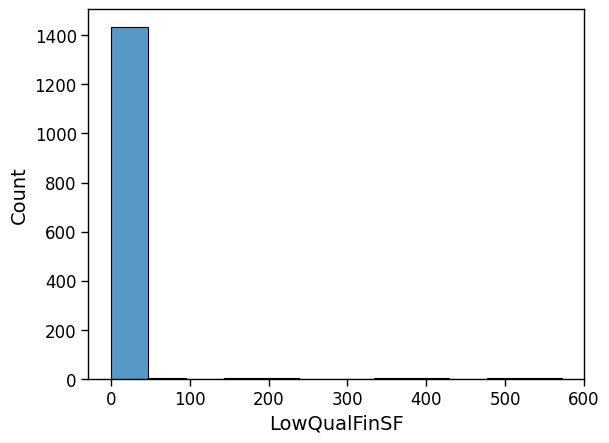




 19. SalePrice 
 ____________________________________________________________________________________________________
count     1460.000
mean    180921.196
std      79442.503
min      34900.000
25%     129975.000
50%     163000.000
75%     214000.000
max     755000.000
Name: SalePrice, dtype: float64


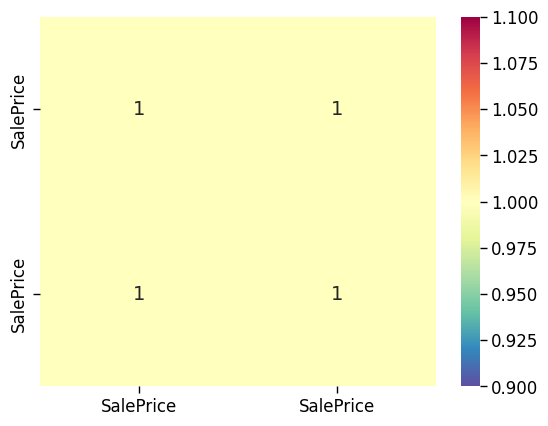

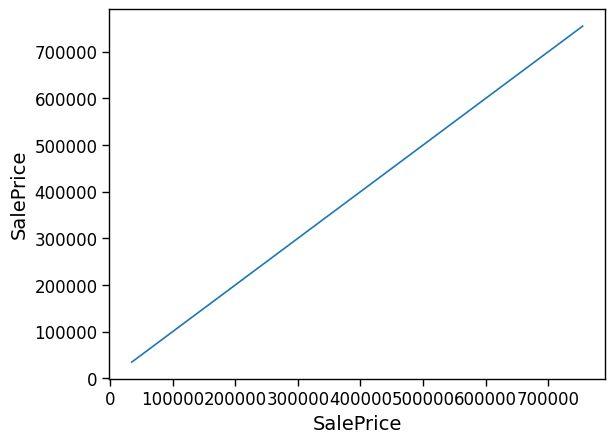

Z outliers - 22 | IQR outliers - 38


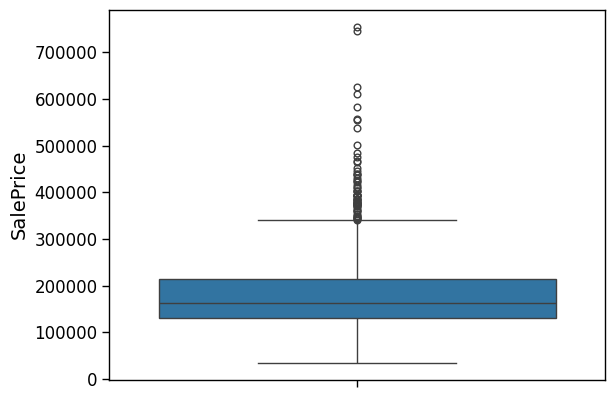

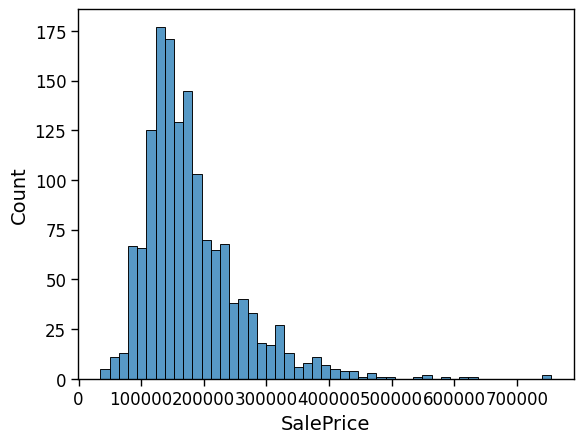




 20. YearBuilt 
 ____________________________________________________________________________________________________
count   1460.000
mean    1971.268
std       30.203
min     1872.000
25%     1954.000
50%     1973.000
75%     2000.000
max     2010.000
Name: YearBuilt, dtype: float64


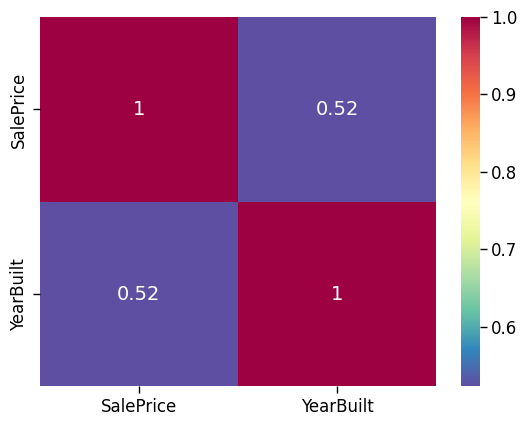

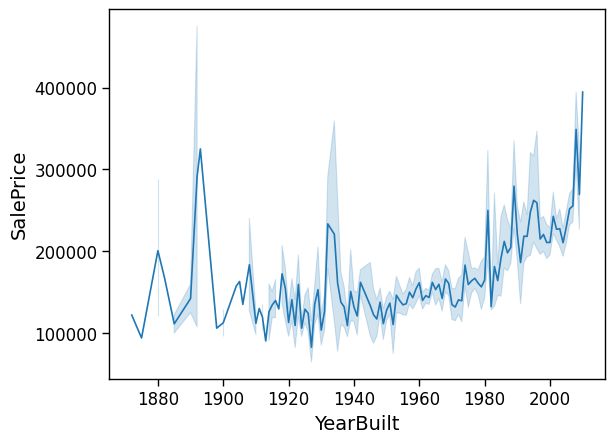

Z outliers - 6 | IQR outliers - 0


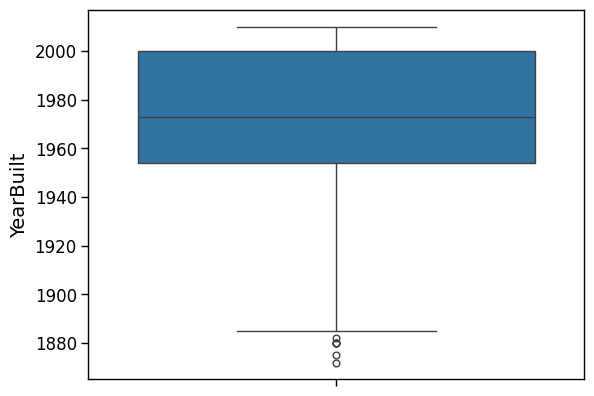

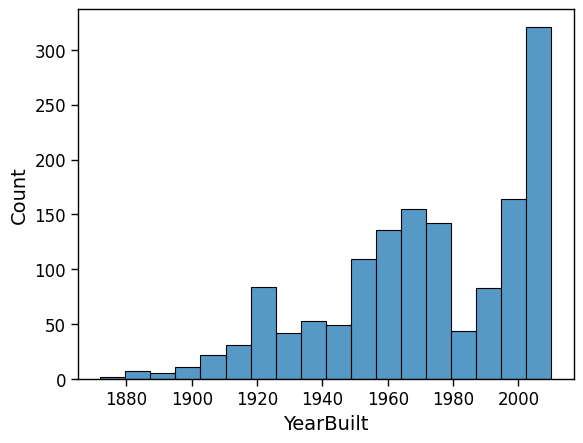




 21. PoolArea 
 ____________________________________________________________________________________________________
count   1460.000
mean       2.759
std       40.177
min        0.000
25%        0.000
50%        0.000
75%        0.000
max      738.000
Name: PoolArea, dtype: float64


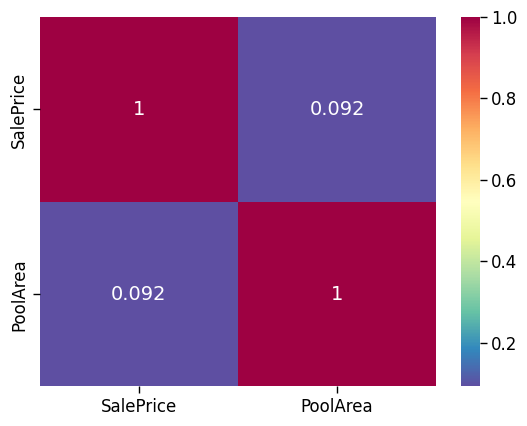

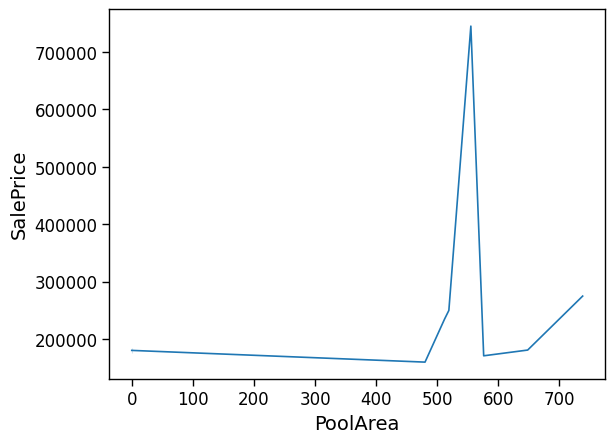

Z outliers - 7 | IQR outliers - 2913


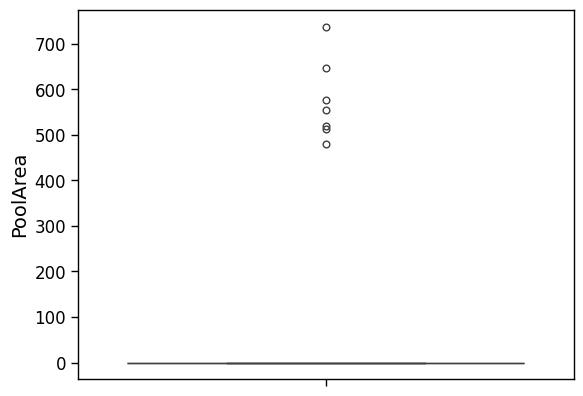

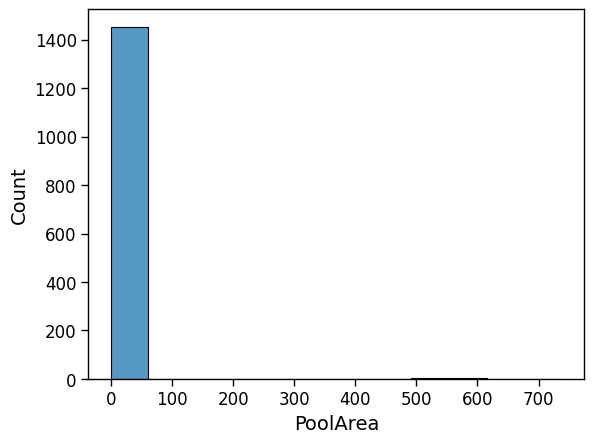




 22. MoSold 
 ____________________________________________________________________________________________________
count   1460.000
mean       6.322
std        2.704
min        1.000
25%        5.000
50%        6.000
75%        8.000
max       12.000
Name: MoSold, dtype: float64


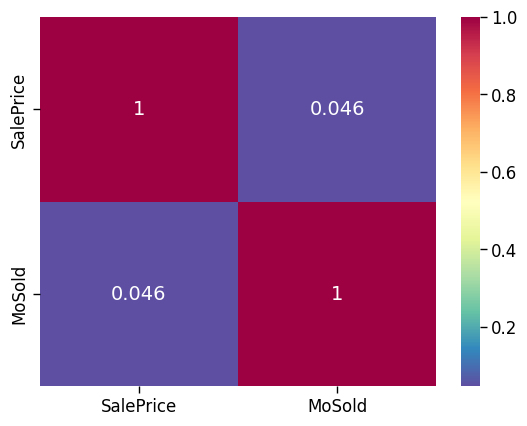

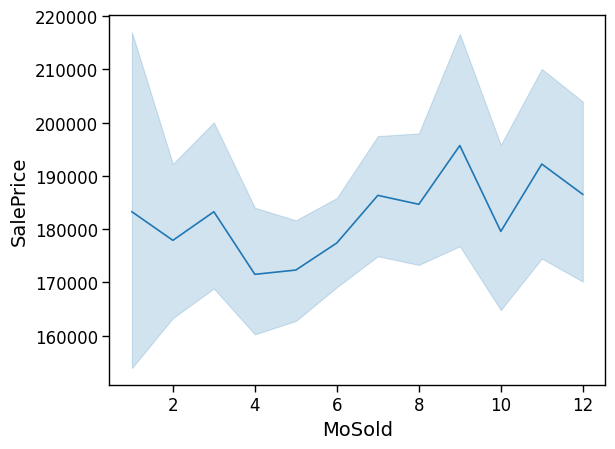

Z outliers - 0 | IQR outliers - 0


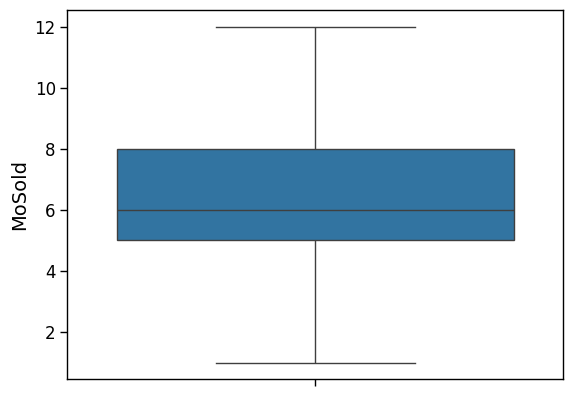

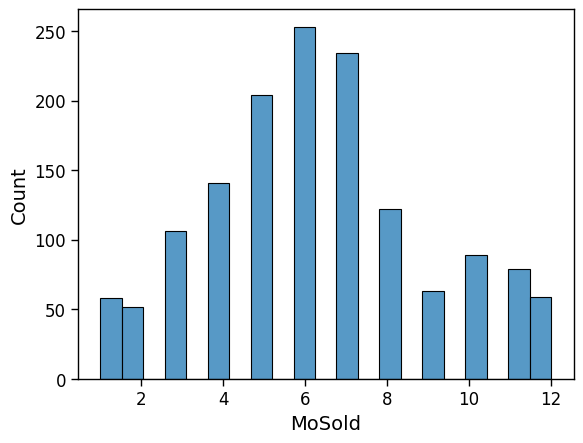




 23. 3SsnPorch 
 ____________________________________________________________________________________________________
count   1460.000
mean       3.410
std       29.317
min        0.000
25%        0.000
50%        0.000
75%        0.000
max      508.000
Name: 3SsnPorch, dtype: float64


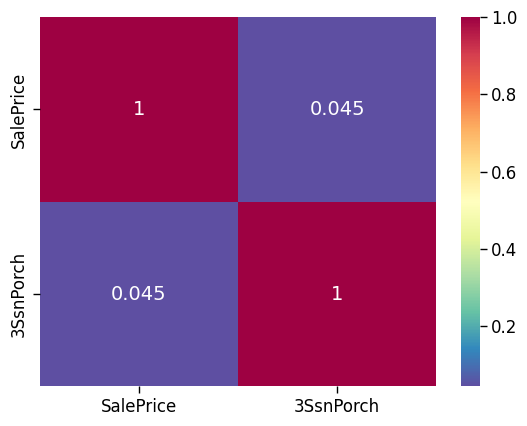

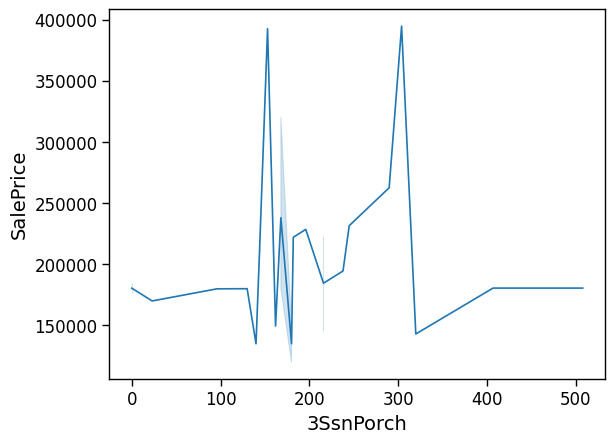

Z outliers - 23 | IQR outliers - 2896


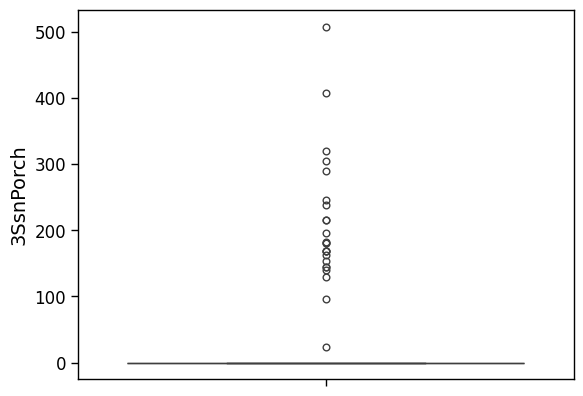

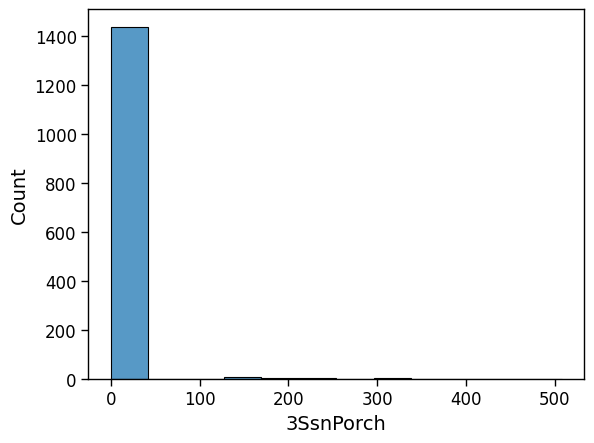




 24. LotArea 
 ____________________________________________________________________________________________________
count     1460.000
mean     10516.828
std       9981.265
min       1300.000
25%       7553.500
50%       9478.500
75%      11601.500
max     215245.000
Name: LotArea, dtype: float64


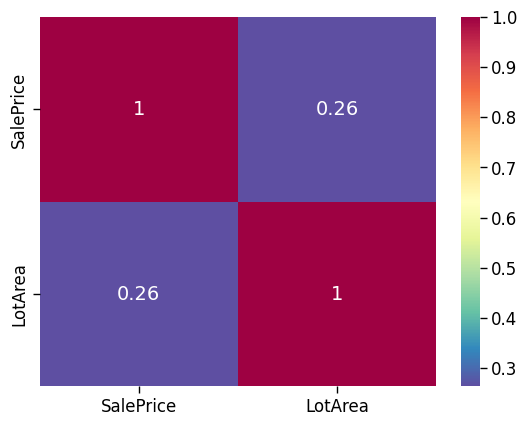

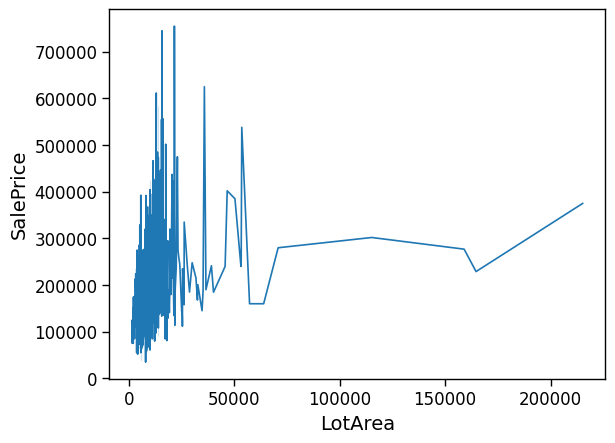

Z outliers - 13 | IQR outliers - 54


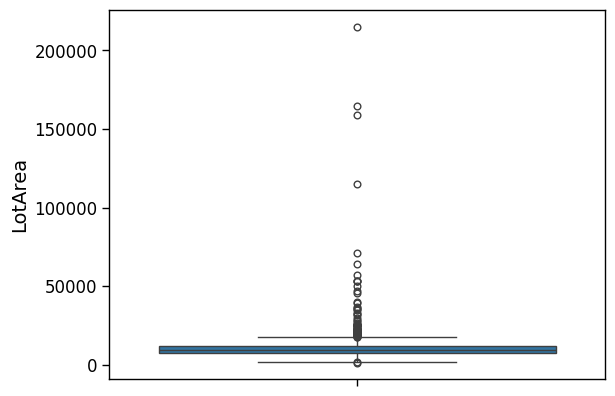

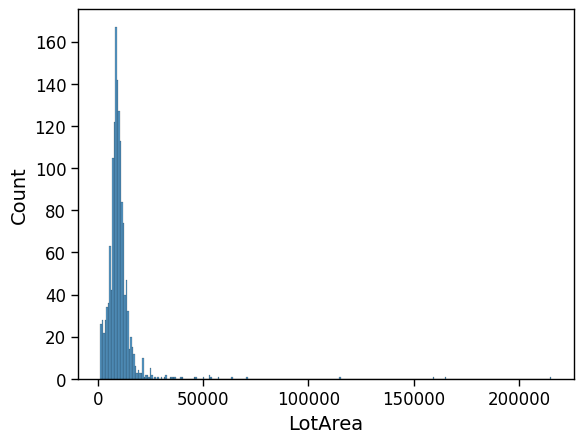




 25. TotRmsAbvGrd 
 ____________________________________________________________________________________________________
count   1460.000
mean       6.518
std        1.625
min        2.000
25%        5.000
50%        6.000
75%        7.000
max       14.000
Name: TotRmsAbvGrd, dtype: float64


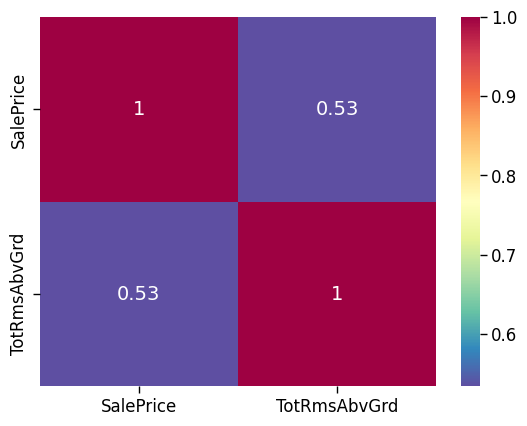

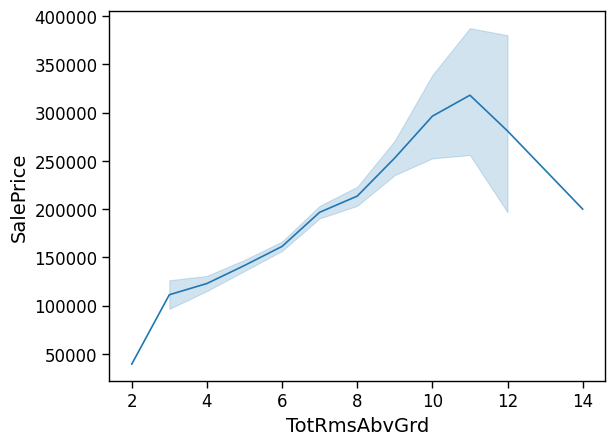

Z outliers - 12 | IQR outliers - 30


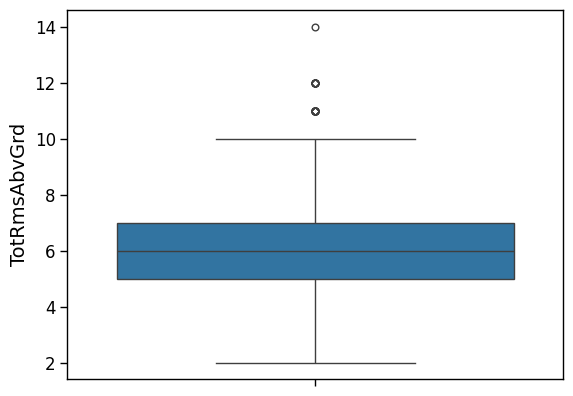

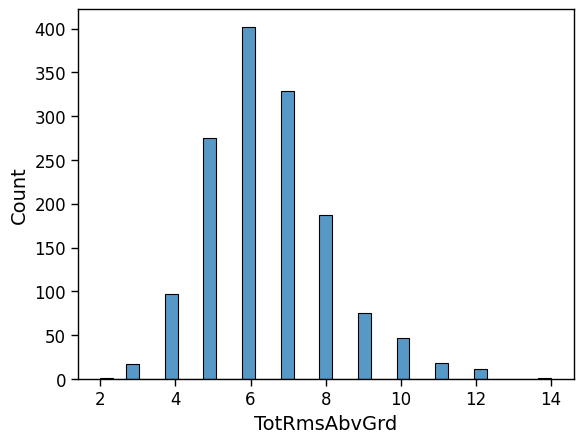




 26. GarageArea 
 ____________________________________________________________________________________________________
count   1460.000
mean     472.980
std      213.805
min        0.000
25%      334.500
50%      480.000
75%      576.000
max     1418.000
Name: GarageArea, dtype: float64


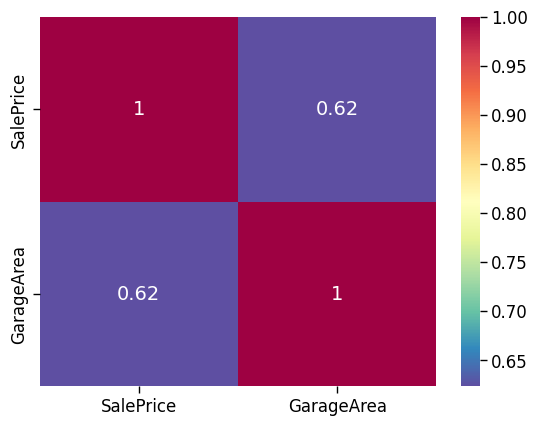

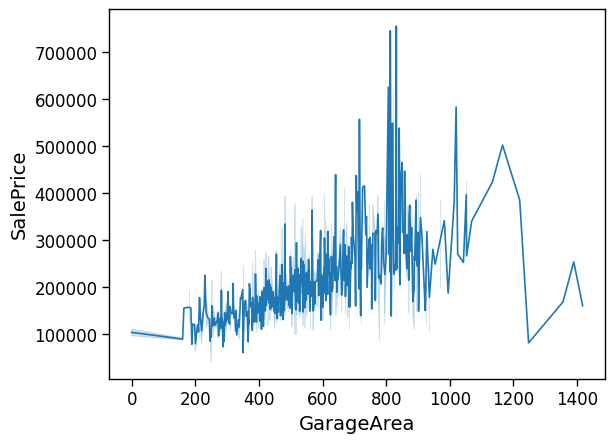

Z outliers - 7 | IQR outliers - 8


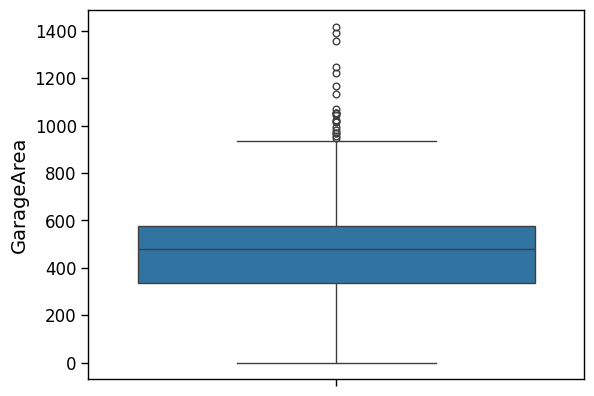

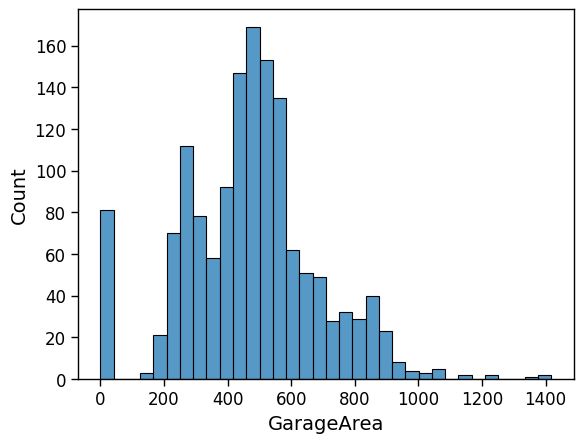




 27. EnclosedPorch 
 ____________________________________________________________________________________________________
count   1460.000
mean      21.954
std       61.119
min        0.000
25%        0.000
50%        0.000
75%        0.000
max      552.000
Name: EnclosedPorch, dtype: float64


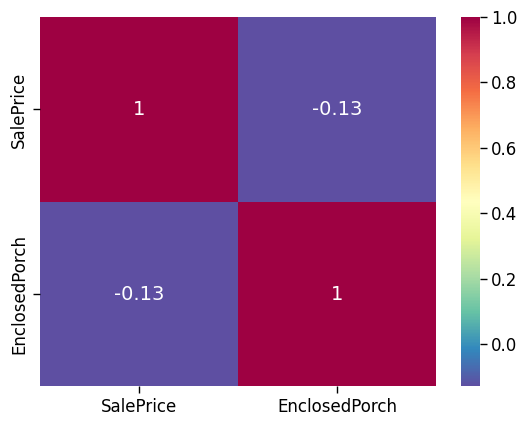

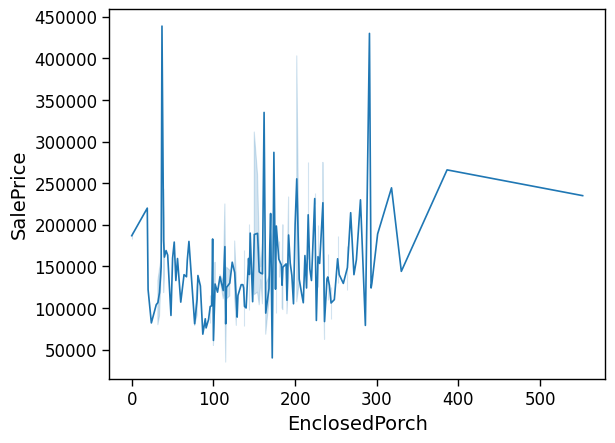

Z outliers - 51 | IQR outliers - 2712


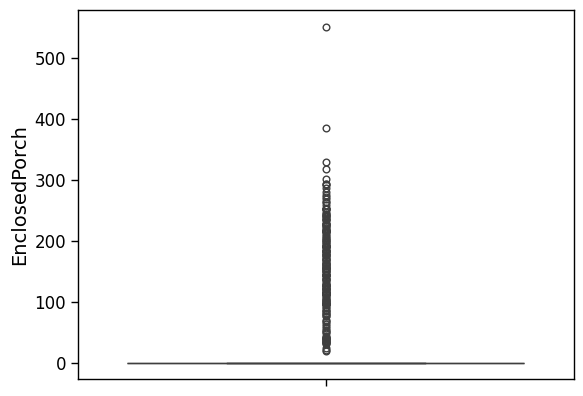

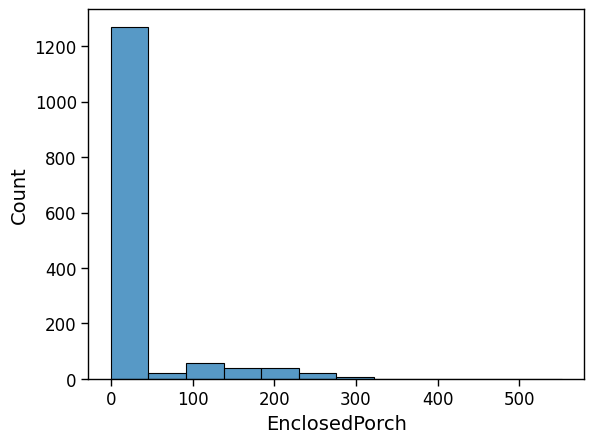




 28. MasVnrArea 
 ____________________________________________________________________________________________________
count   1452.000
mean     103.685
std      181.066
min        0.000
25%        0.000
50%        0.000
75%      166.000
max     1600.000
Name: MasVnrArea, dtype: float64


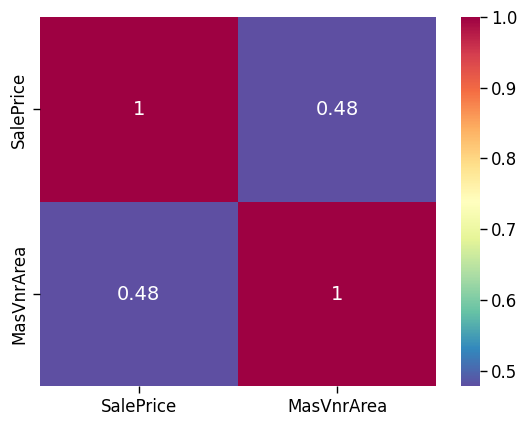

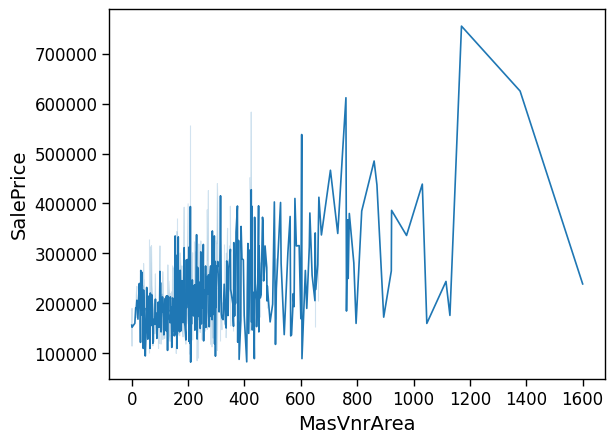

Z outliers - 0 | IQR outliers - 0


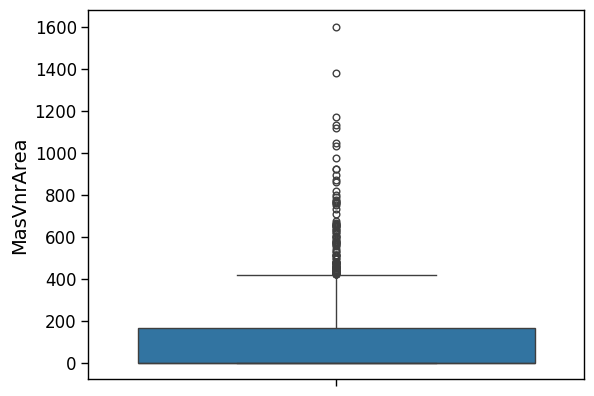

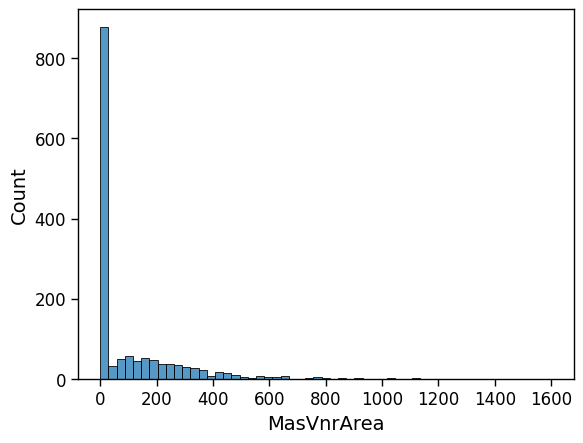




 29. BedroomAbvGr 
 ____________________________________________________________________________________________________
count   1460.000
mean       2.866
std        0.816
min        0.000
25%        2.000
50%        3.000
75%        3.000
max        8.000
Name: BedroomAbvGr, dtype: float64


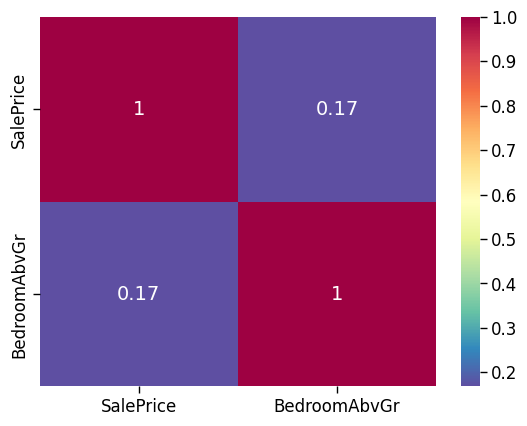

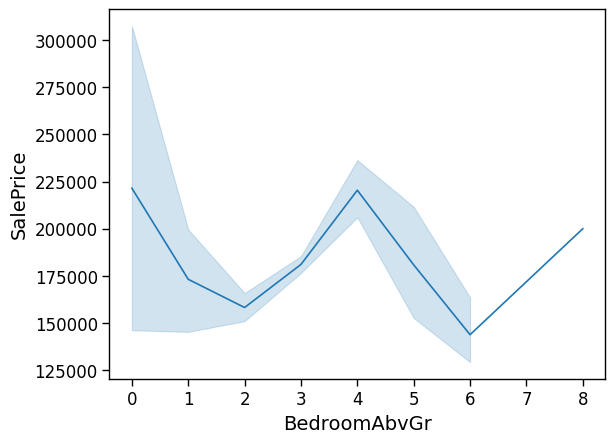

Z outliers - 14 | IQR outliers - 35


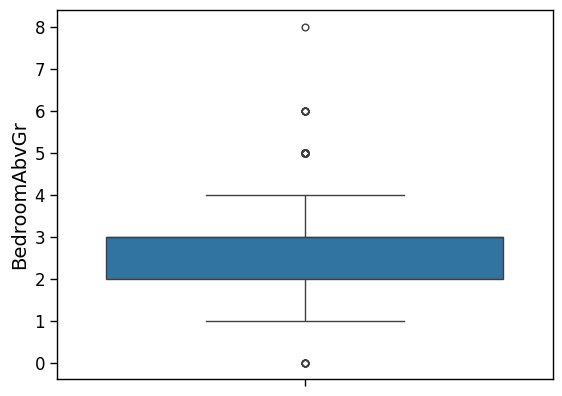

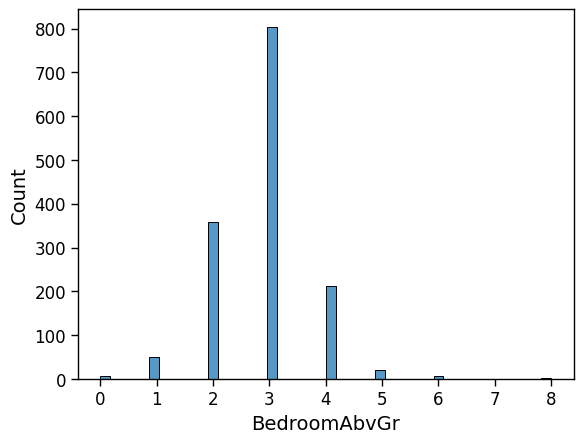




 30. FullBath 
 ____________________________________________________________________________________________________
count   1460.000
mean       1.565
std        0.551
min        0.000
25%        1.000
50%        2.000
75%        2.000
max        3.000
Name: FullBath, dtype: float64


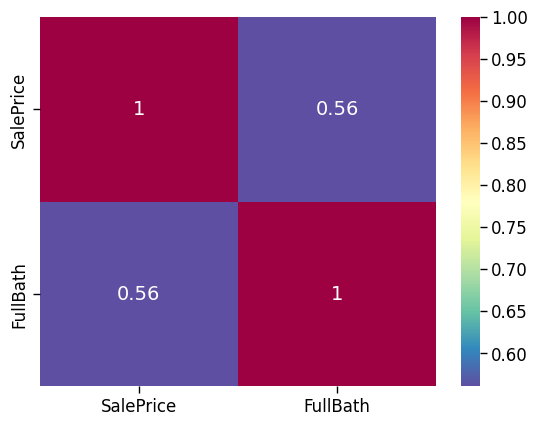

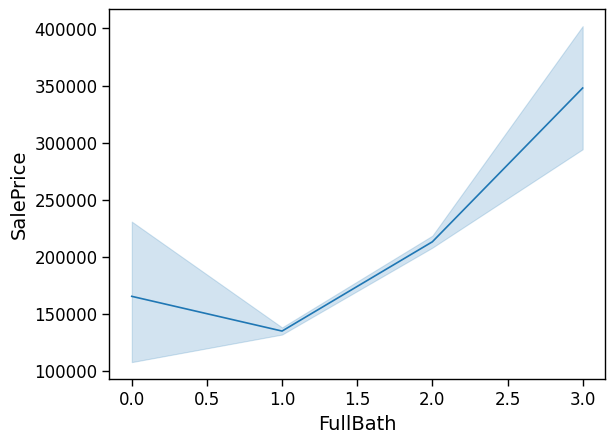

Z outliers - 0 | IQR outliers - 0


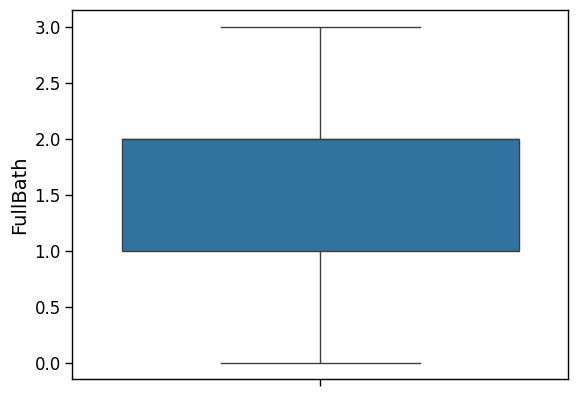

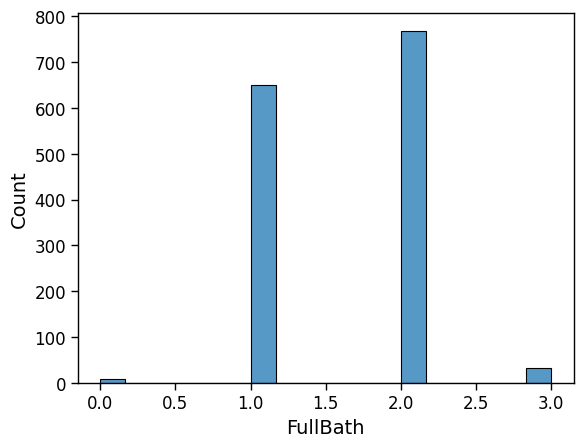




 31. 1stFlrSF 
 ____________________________________________________________________________________________________
count   1460.000
mean    1162.627
std      386.588
min      334.000
25%      882.000
50%     1087.000
75%     1391.250
max     4692.000
Name: 1stFlrSF, dtype: float64


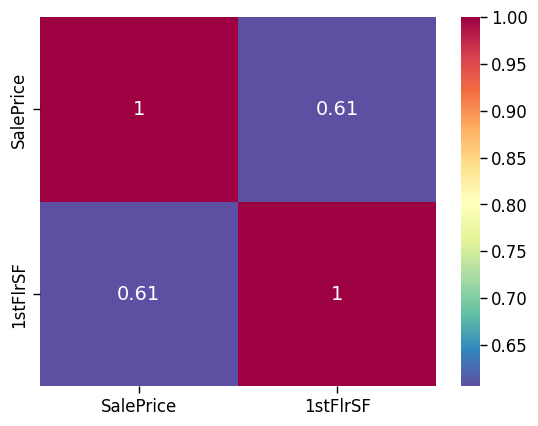

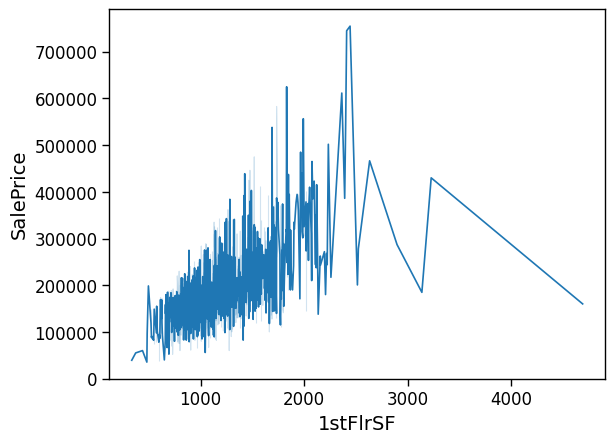

Z outliers - 12 | IQR outliers - 9


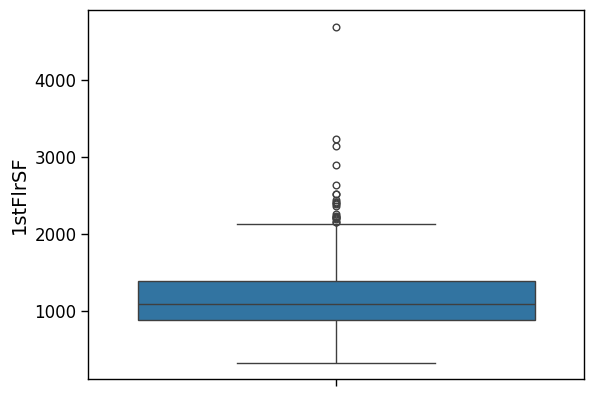

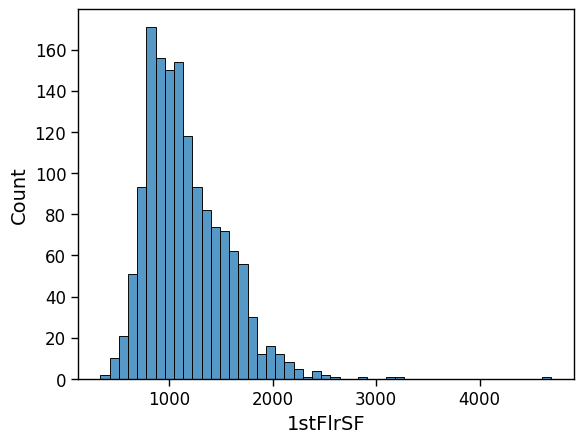




 32. BsmtHalfBath 
 ____________________________________________________________________________________________________
count   1460.000
mean       0.058
std        0.239
min        0.000
25%        0.000
50%        0.000
75%        0.000
max        2.000
Name: BsmtHalfBath, dtype: float64


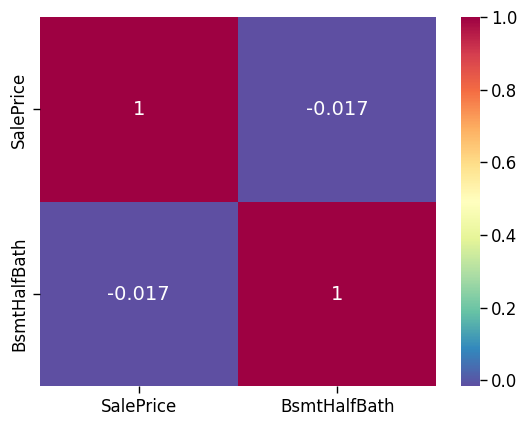

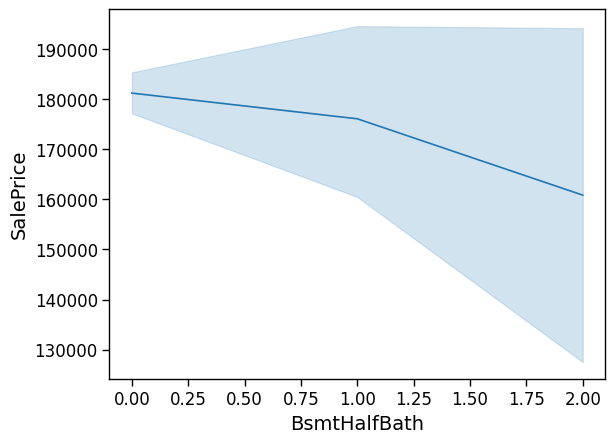

Z outliers - 82 | IQR outliers - 2838


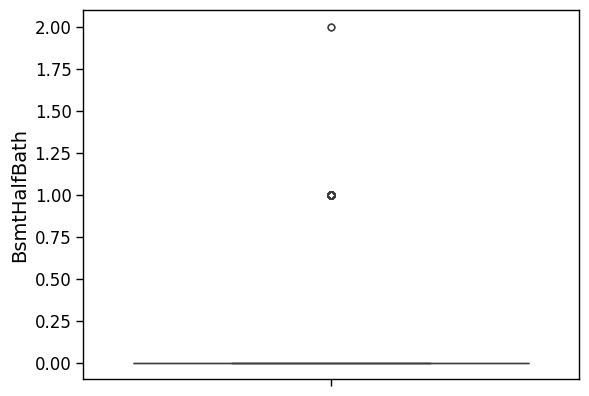

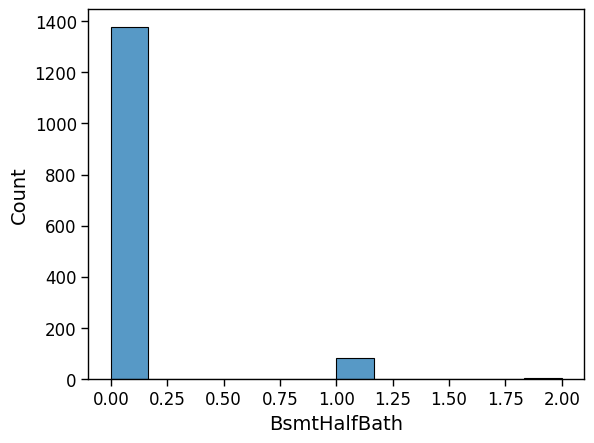




 33. OverallQual 
 ____________________________________________________________________________________________________
count   1460.000
mean       6.099
std        1.383
min        1.000
25%        5.000
50%        6.000
75%        7.000
max       10.000
Name: OverallQual, dtype: float64


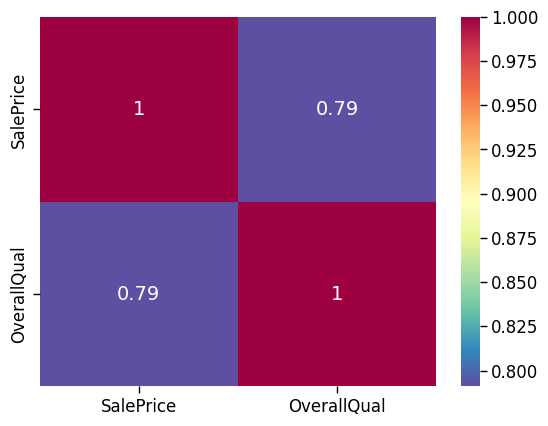

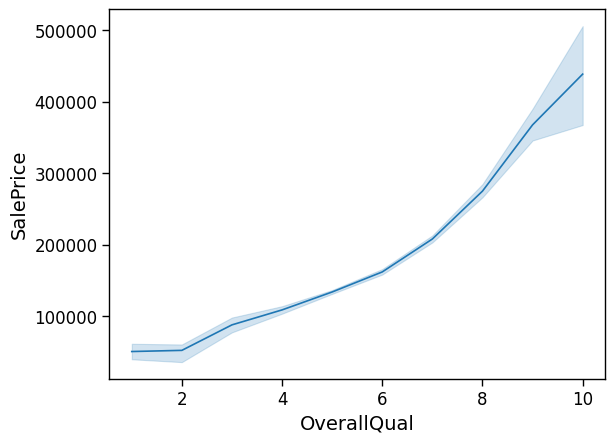

Z outliers - 2 | IQR outliers - 2


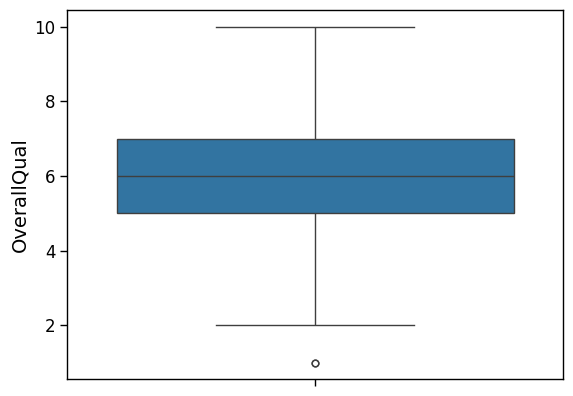

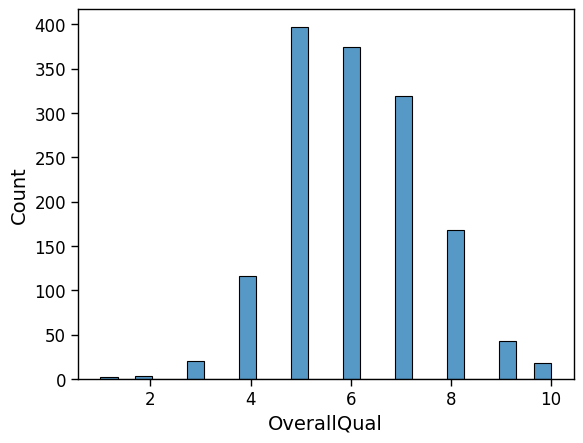




 34. OpenPorchSF 
 ____________________________________________________________________________________________________
count   1460.000
mean      46.660
std       66.256
min        0.000
25%        0.000
50%       25.000
75%       68.000
max      547.000
Name: OpenPorchSF, dtype: float64


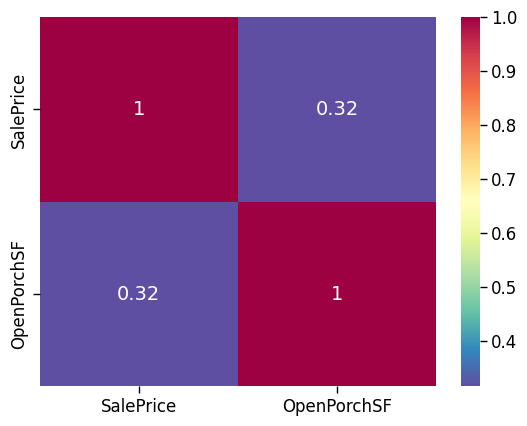

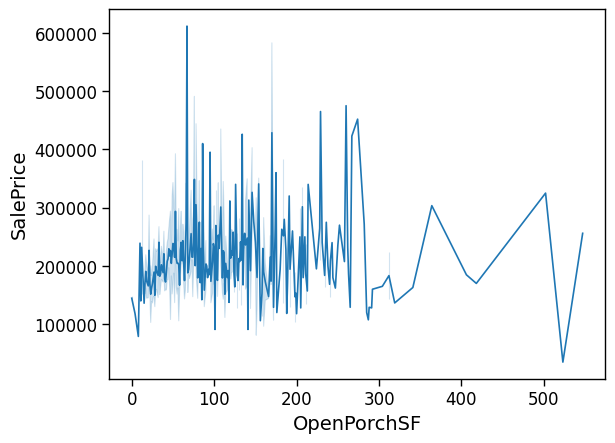

Z outliers - 27 | IQR outliers - 54


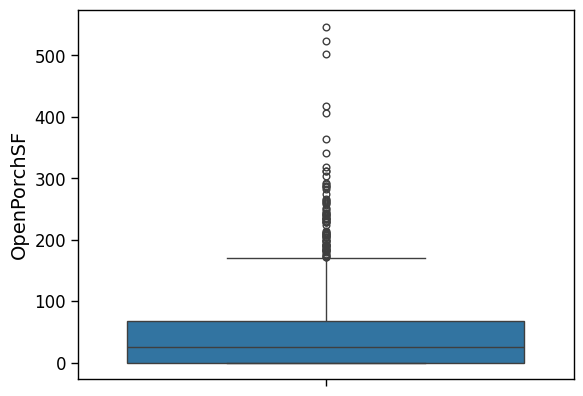

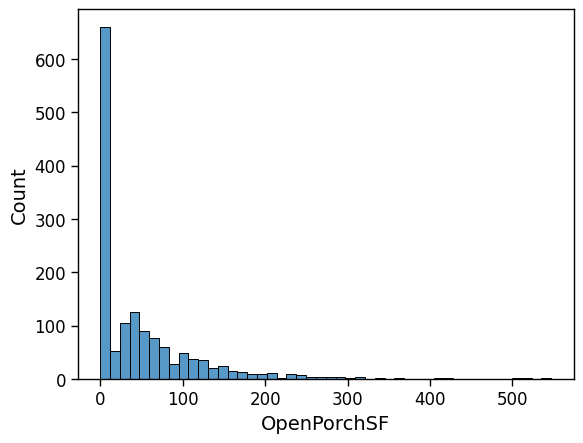




 35. HalfBath 
 ____________________________________________________________________________________________________
count   1460.000
mean       0.383
std        0.503
min        0.000
25%        0.000
50%        0.000
75%        1.000
max        2.000
Name: HalfBath, dtype: float64


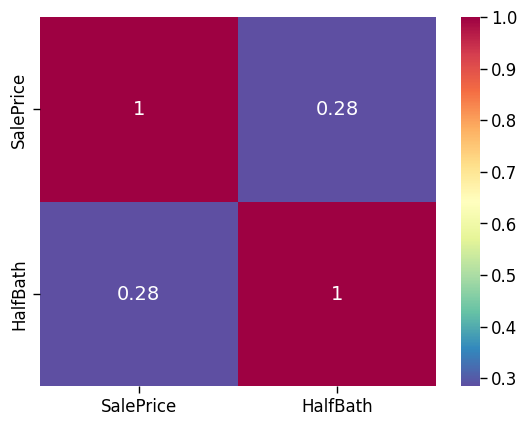

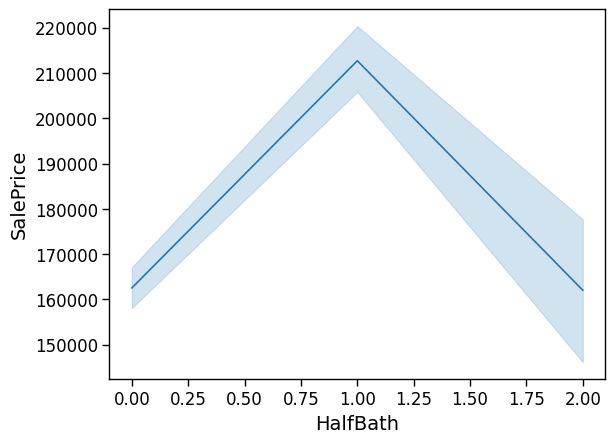

Z outliers - 12 | IQR outliers - 0


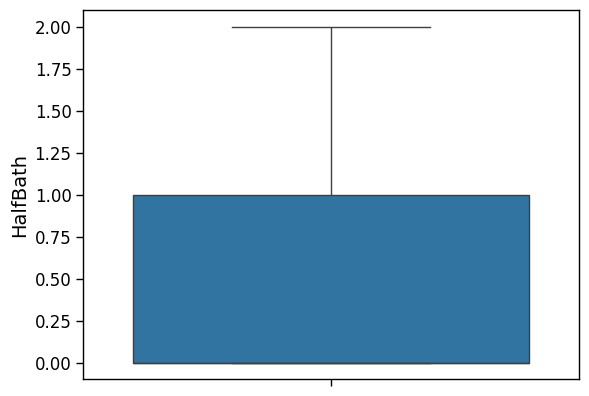

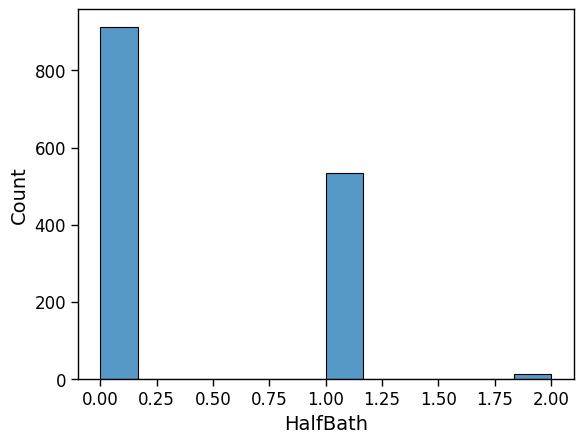




 36. BsmtFinSF2 
 ____________________________________________________________________________________________________
count   1460.000
mean      46.549
std      161.319
min        0.000
25%        0.000
50%        0.000
75%        0.000
max     1474.000
Name: BsmtFinSF2, dtype: float64


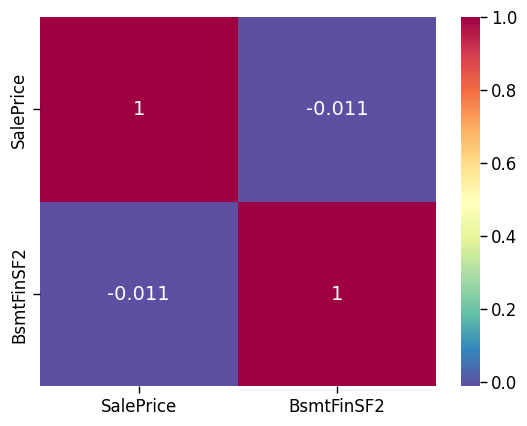

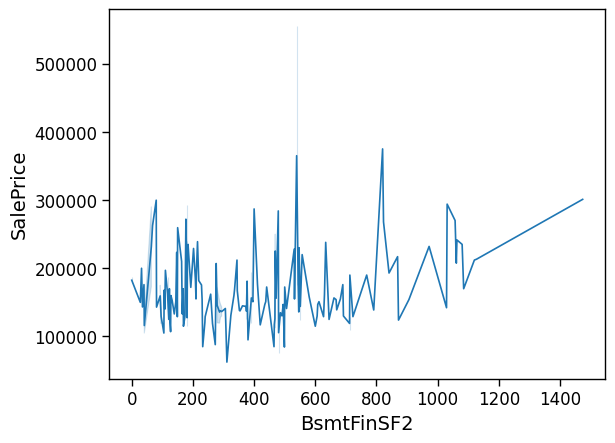

Z outliers - 50 | IQR outliers - 2753


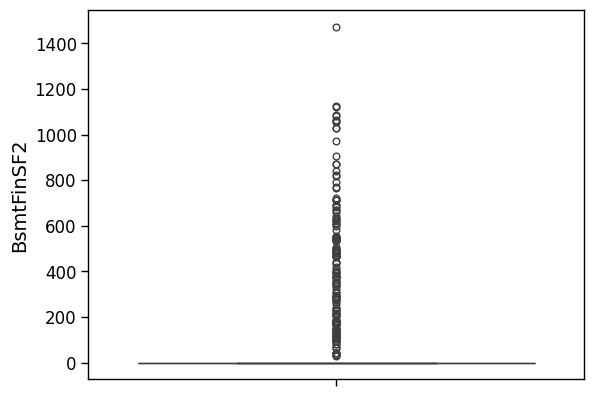

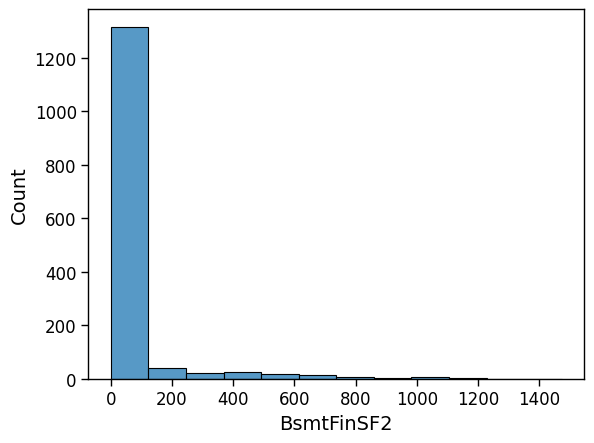




 37. BsmtUnfSF 
 ____________________________________________________________________________________________________
count   1460.000
mean     567.240
std      441.867
min        0.000
25%      223.000
50%      477.500
75%      808.000
max     2336.000
Name: BsmtUnfSF, dtype: float64


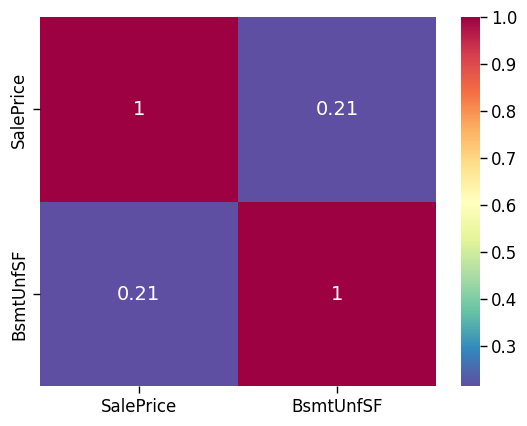

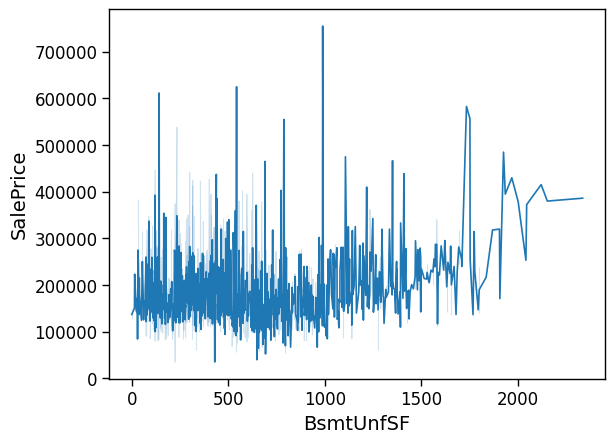

Z outliers - 11 | IQR outliers - 6


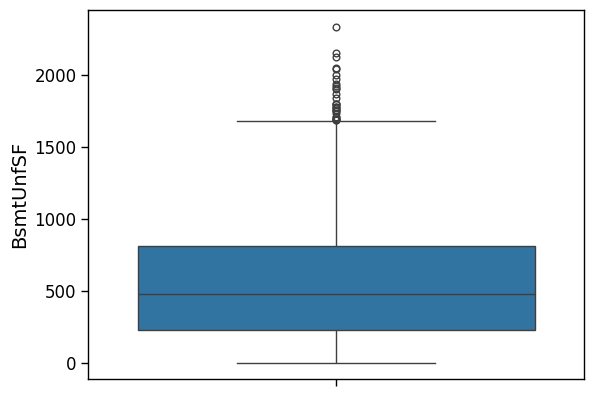

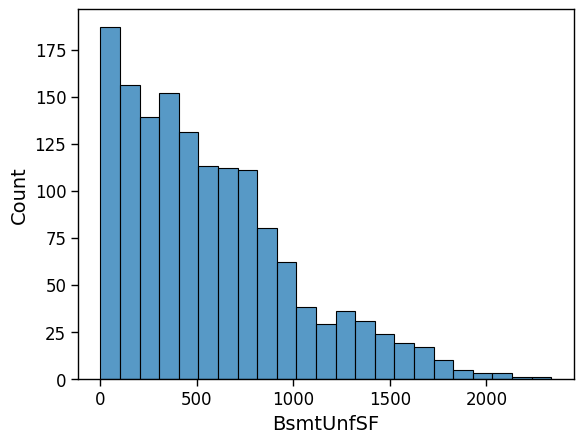

In [ ]:
# Looking at statistics, correlations and outliers for all numeric features
# to assist with decision to keep or drop certain features

threshold_z = 3
plt.figure(figsize = (6,6))


for n, feature in enumerate(set(train.columns).difference(set(string_cols))):
    print(f'\n {n+1}. {feature} \n', '_'*100)
    print(train[feature].describe())
    sns.heatmap(data= train[['SalePrice', feature]].corr(), annot=True, annot_kws={'size': 14}, cmap="Spectral_r")
    plt.show()
    sns.lineplot(data = train, x = feature, y = 'SalePrice')
    plt.show()
    n_outliers_z = (np.abs(stats.zscore(train[feature])) > threshold_z).sum()
    n_outliers_IQR = len(iqr(train[feature])[0]) + len(iqr(train[feature])[1])
    print(f'Z outliers - {n_outliers_z} | IQR outliers - {n_outliers_IQR}')
    sns.boxplot((train[feature]))
    plt.show()
    sns.histplot((train[feature]))
    plt.show()
    print('\n')


In [ ]:
# Every numeric feature

print(set(train.columns).difference(set(string_cols)))

{'BsmtFullBath', 'Fireplaces', 'YearRemodAdd', 'GarageYrBlt', 'GarageCars', 'KitchenAbvGr', 'MiscVal', 'OverallCond', 'MSSubClass', 'WoodDeckSF', 'BsmtFinSF1', 'ScreenPorch', 'YrSold', 'LotFrontage', '2ndFlrSF', 'TotalBsmtSF', 'GrLivArea', 'LowQualFinSF', 'SalePrice', 'YearBuilt', 'PoolArea', 'MoSold', '3SsnPorch', 'LotArea', 'TotRmsAbvGrd', 'GarageArea', 'EnclosedPorch', 'MasVnrArea', 'BedroomAbvGr', 'FullBath', '1stFlrSF', 'BsmtHalfBath', 'OverallQual', 'OpenPorchSF', 'HalfBath', 'BsmtFinSF2', 'BsmtUnfSF'}


### Cleaning Numerical Features - Looking for Outliers

#### Areas in Square Feet - '1stFlrSF', '2ndFlrSF', '3SsnPorch', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'EnclosedPorch', 'GarageArea', 'GrLivArea', 'LotArea', 'LotFrontage', 'LowQualFinSF', 'OpenPorchSF', 'PoolArea', 'ScreenPorch', 'TotalBsmtSF', 'WoodDeckSF'

In [ ]:
sqft = ['1stFlrSF', '2ndFlrSF', '3SsnPorch', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'EnclosedPorch', 'GarageArea', 'GrLivArea', 'LotArea', 'LotFrontage', 'LowQualFinSF', 'OpenPorchSF', 'PoolArea', 'ScreenPorch', 'TotalBsmtSF', 'WoodDeckSF']

In [ ]:
print(sqft)

['1stFlrSF', '2ndFlrSF', '3SsnPorch', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'EnclosedPorch', 'GarageArea', 'GrLivArea', 'LotArea', 'LotFrontage', 'LowQualFinSF', 'OpenPorchSF', 'PoolArea', 'ScreenPorch', 'TotalBsmtSF', 'WoodDeckSF']


In [ ]:
### Checking for wrong values

for feature in sqft:
    if len(train[((train['LotArea'] < train[feature]))]) > 0:
        print(feature)

In [ ]:
### Checking for wrong values

print(len(train[(train['LotArea'] < (train['GrLivArea'] + train['EnclosedPorch'] + train['GarageArea'] + train['OpenPorchSF'] + train['PoolArea']))]))
train[(train['LotArea'] < (train['GrLivArea'] + train['EnclosedPorch'] + train['GarageArea'] + train['OpenPorchSF'] + train['PoolArea']))]

2


,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
599,160,RM,24.000,1950,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Blueste,Norm,Norm,Twnhs,2Story,6,6,1980,1980,Gable,CompShg,MetalSd,MetalSd,NaN,0.000,TA,Gd,CBlock,Gd,TA,No,LwQ,81,GLQ,612,23,716,GasA,TA,Y,SBrkr,716,840,0,1556,1,0,2,1,3,1,TA,6,Typ,1,TA,Attchd,1980.000,Fin,2,452,TA,TA,Y,161,0,0,0,0,0,NaN,GdPrv,NaN,0,7,2008,COD,Normal,151000
956,160,RM,24.000,1300,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Blueste,Norm,Norm,TwnhsE,2Story,6,6,1980,1980,Gable,CompShg,MetalSd,MetalSd,NaN,0.000,TA,TA,CBlock,Gd,TA,No,ALQ,285,Unf,0,276,561,GasA,TA,Y,SBrkr,561,668,0,1229,0,0,1,1,2,1,TA,5,Typ,1,TA,Attchd,1980.000,Fin,2,462,TA,TA,Y,150,0,0,0,0,0,NaN,GdPrv,NaN,0,5,2009,WD,Normal,124000


In [ ]:
### Checking for wrong values

print(len(train[(train['LotArea'] < (train['GrLivArea'] + train['WoodDeckSF'] + train['EnclosedPorch'] + train['OpenPorchSF'] + train['PoolArea'])) & (train['GarageType'] == 'Attchd')]))
train[(train['LotArea'] < (train['GrLivArea'] + train['WoodDeckSF'] + train['EnclosedPorch'] + train['OpenPorchSF'] + train['PoolArea'])) & (train['GarageType'] == 'Attchd')]

1


,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
956,160,RM,24.000,1300,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Blueste,Norm,Norm,TwnhsE,2Story,6,6,1980,1980,Gable,CompShg,MetalSd,MetalSd,NaN,0.000,TA,TA,CBlock,Gd,TA,No,ALQ,285,Unf,0,276,561,GasA,TA,Y,SBrkr,561,668,0,1229,0,0,1,1,2,1,TA,5,Typ,1,TA,Attchd,1980.000,Fin,2,462,TA,TA,Y,150,0,0,0,0,0,NaN,GdPrv,NaN,0,5,2009,WD,Normal,124000


In [ ]:
#### Something is wrong with the LotArea feature

##### 1stFlrSF: First Floor square feet

<Axes: xlabel='1stFlrSF', ylabel='Count'>

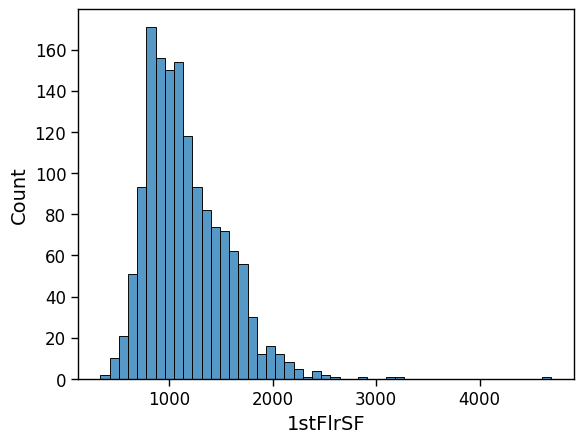

In [ ]:
sns.histplot(train['1stFlrSF'])

<Axes: xlabel='1stFlrSF', ylabel='Count'>

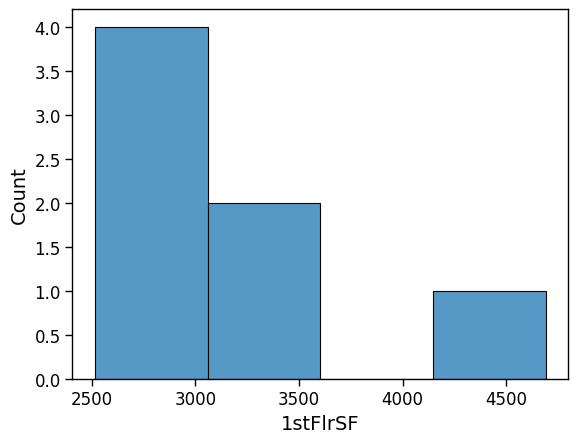

In [ ]:
# Histogram of extreme values
sns.histplot(train[(train['1stFlrSF'] > 2500)]['1stFlrSF'])

In [ ]:
# Features of rows with extreme values
print(train[(train['1stFlrSF'] > 2500)][['LotArea', '1stFlrSF']])

      LotArea  1stFlrSF
496     12692      3228
523     40094      3138
529     32668      2515
1024    15498      2898
1044     9600      2524
1298    63887      4692
1373    11400      2633


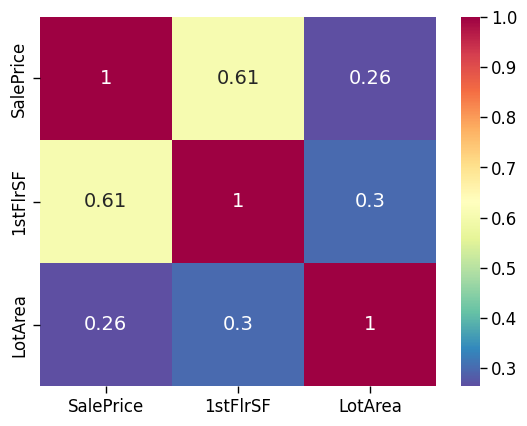

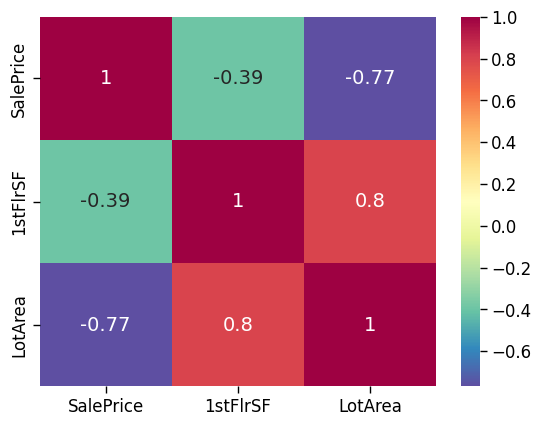

In [ ]:
# Correlation with similar features and correlation with similar features for only extreme samples
sns.heatmap(data= train[['SalePrice', '1stFlrSF', 'LotArea']].corr(), annot=True, annot_kws={'size': 14}, cmap="Spectral_r")
plt.show()
sns.heatmap(data= train[(train['1stFlrSF'] > 2500)][['SalePrice', '1stFlrSF', 'LotArea']].corr(), annot=True, annot_kws={'size': 14}, cmap="Spectral_r")
plt.show()

##### Lot Area

<Axes: xlabel='LotArea', ylabel='Count'>

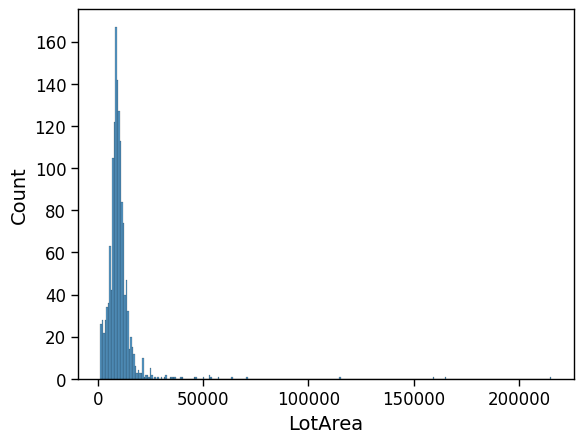

In [ ]:
sns.histplot(train['LotArea'])

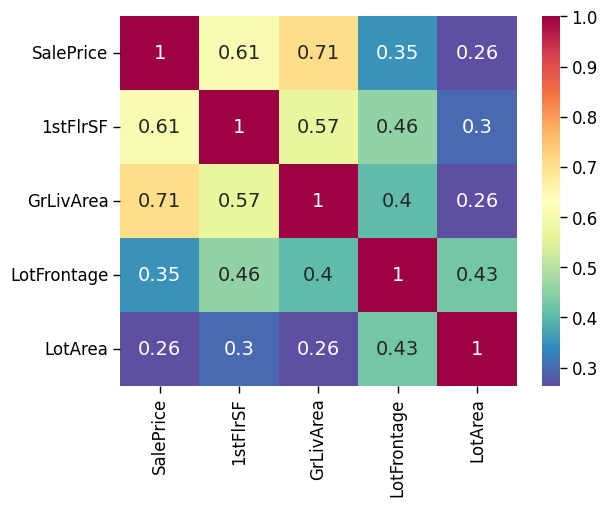

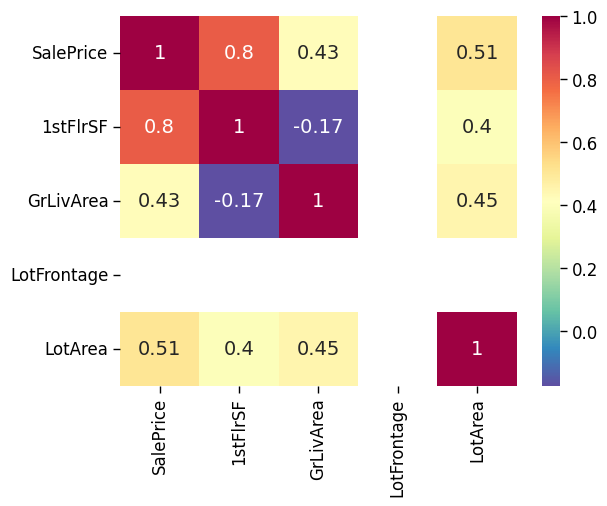

In [ ]:
# Correlation with similar features and correlation with similar features for only extreme samples
sns.heatmap(data= train[['SalePrice', '1stFlrSF', 'GrLivArea', 'LotFrontage', 'LotArea']].corr(), annot=True, annot_kws={'size': 14}, cmap="Spectral_r")
plt.show()
sns.heatmap(data= train[(train['LotArea'] > 100000)][['SalePrice', '1stFlrSF', 'GrLivArea', 'LotFrontage', 'LotArea']].corr(), annot=True, annot_kws={'size': 14}, cmap="Spectral_r")
plt.show()

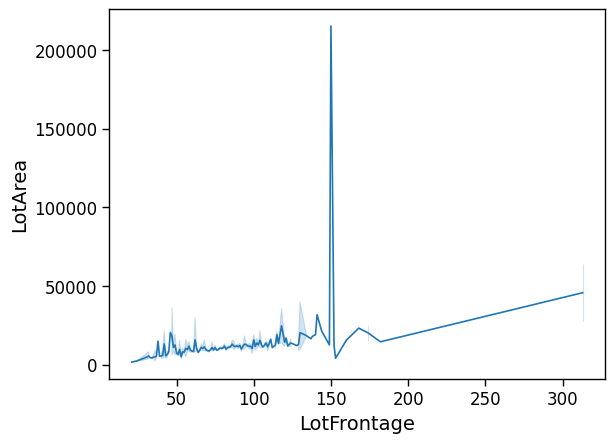

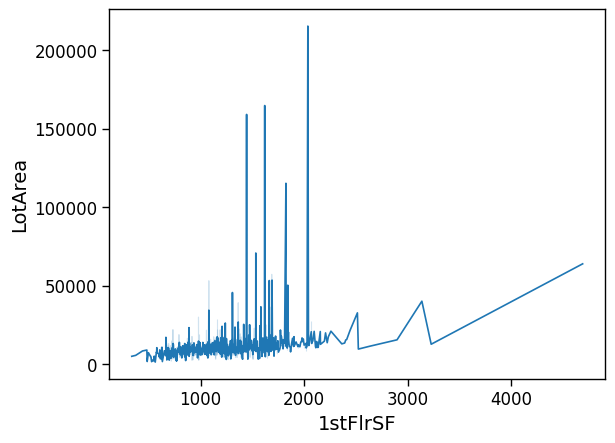

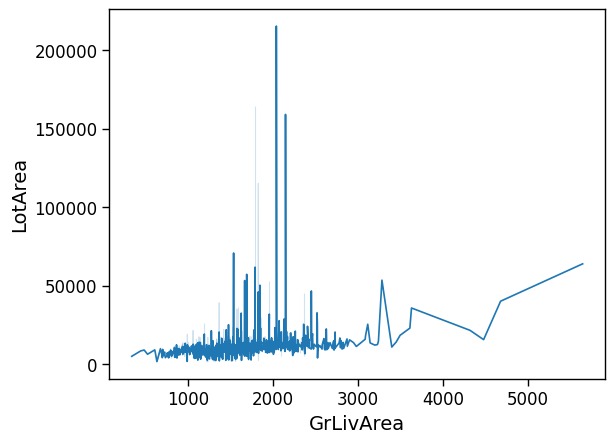

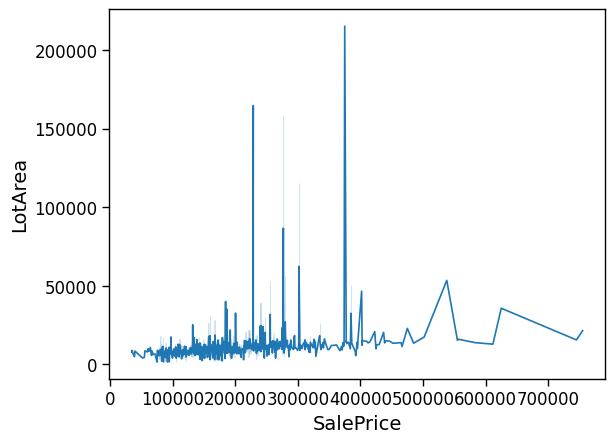

In [ ]:
# Lineplots with similar features and Lineplots with similar features for only extreme samples
# Looking for trends
sns.lineplot(data = train, x = 'LotFrontage', y = 'LotArea')
plt.show()
sns.lineplot(data = train, x = '1stFlrSF', y = 'LotArea')
plt.show()
sns.lineplot(data = train, x = 'GrLivArea', y = 'LotArea')
plt.show()
sns.lineplot(data = train, x = 'SalePrice', y = 'LotArea')
plt.show()

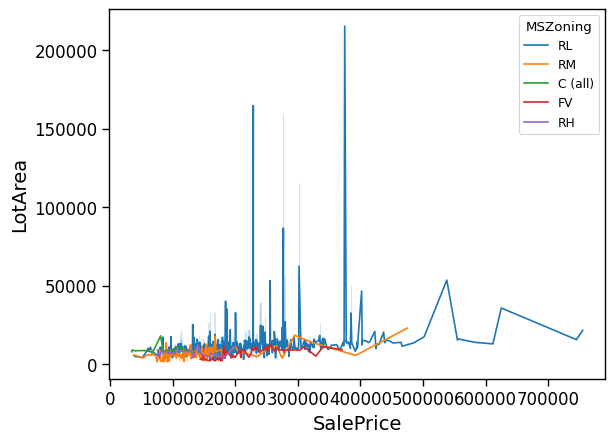

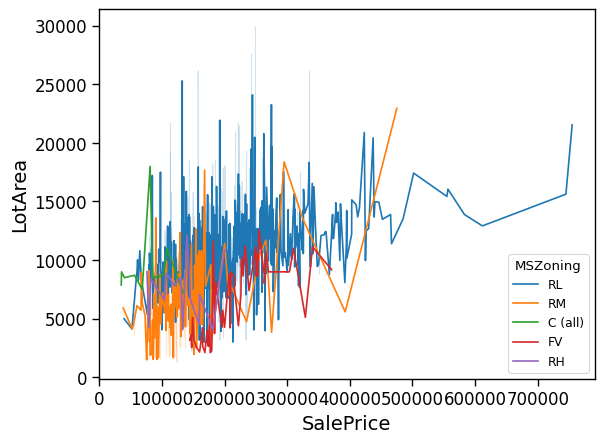

In [ ]:
# Lineplots with similar features and Lineplots with similar features for only extreme samples
# Breakdown with other feature
# Looking for trends on different zones
sns.lineplot(data = train, x = 'SalePrice', y = 'LotArea', hue = 'MSZoning')
plt.show()
sns.lineplot(data = train[(train['LotArea'] < 30000)], x = 'SalePrice', y = 'LotArea', hue = 'MSZoning')
plt.show()

In [ ]:
# Isolating the 'exteme' rows to check if valid
train[(train['LotArea'] > 50000)]

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
53,20,RL,68.000,50271,Pave,NaN,IR1,Low,AllPub,Inside,Gtl,Veenker,Norm,Norm,1Fam,1Story,9,5,1981,1987,Gable,WdShngl,WdShing,Wd Shng,NaN,0.000,Gd,TA,CBlock,Ex,TA,Gd,GLQ,1810,Unf,0,32,1842,GasA,Gd,Y,SBrkr,1842,0,0,1842,2,0,0,1,0,1,Gd,5,Typ,1,Gd,Attchd,1981.000,Fin,3,894,TA,TA,Y,857,72,0,0,0,0,NaN,NaN,NaN,0,11,2006,WD,Normal,385000
249,50,RL,NaN,159000,Pave,NaN,IR2,Low,AllPub,CulDSac,Sev,ClearCr,Norm,Norm,1Fam,1.5Fin,6,7,1958,2006,Gable,CompShg,Wd Sdng,HdBoard,BrkCmn,472.000,Gd,TA,CBlock,Gd,TA,Gd,Rec,697,Unf,0,747,1444,GasA,Gd,Y,SBrkr,1444,700,0,2144,0,1,2,0,4,1,Gd,7,Typ,2,TA,Attchd,1958.000,Fin,2,389,TA,TA,Y,0,98,0,0,0,0,NaN,NaN,Shed,500,6,2007,WD,Normal,277000
313,20,RL,150.000,215245,Pave,NaN,IR3,Low,AllPub,Inside,Sev,Timber,Norm,Norm,1Fam,1Story,7,5,1965,1965,Hip,CompShg,BrkFace,BrkFace,NaN,0.000,TA,TA,CBlock,Gd,TA,Gd,ALQ,1236,Rec,820,80,2136,GasW,TA,Y,SBrkr,2036,0,0,2036,2,0,2,0,3,1,TA,8,Typ,2,Gd,Attchd,1965.000,RFn,2,513,TA,TA,Y,0,0,0,0,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal,375000
335,190,RL,NaN,164660,Grvl,NaN,IR1,HLS,AllPub,Corner,Sev,Timber,Norm,Norm,2fmCon,1.5Fin,5,6,1965,1965,Gable,CompShg,Plywood,Plywood,NaN,0.000,TA,TA,CBlock,TA,TA,Gd,ALQ,1249,BLQ,147,103,1499,GasA,Ex,Y,SBrkr,1619,167,0,1786,2,0,2,0,3,1,TA,7,Typ,2,Gd,Attchd,1965.000,Fin,2,529,TA,TA,Y,670,0,0,0,0,0,NaN,NaN,Shed,700,8,2008,WD,Normal,228950
384,60,RL,NaN,53107,Pave,NaN,IR2,Low,AllPub,Corner,Mod,ClearCr,Feedr,Norm,1Fam,2Story,6,5,1992,1992,Gable,CompShg,HdBoard,HdBoard,NaN,0.000,Gd,TA,PConc,Gd,TA,Av,GLQ,985,Unf,0,595,1580,GasA,Ex,Y,SBrkr,1079,874,0,1953,1,0,2,1,3,1,Gd,9,Typ,2,Fa,Attchd,1992.000,Fin,2,501,TA,TA,Y,216,231,0,0,0,0,NaN,NaN,NaN,0,6,2007,WD,Normal,240000
451,20,RL,62.000,70761,Pave,NaN,IR1,Low,AllPub,Inside,Mod,ClearCr,Norm,Norm,1Fam,1Story,7,5,1975,1975,Gable,WdShngl,Plywood,Plywood,NaN,0.000,TA,TA,CBlock,Gd,TA,Gd,ALQ,655,Unf,0,878,1533,GasA,TA,Y,SBrkr,1533,0,0,1533,1,0,2,0,2,1,Gd,5,Typ,2,TA,Attchd,1975.000,Unf,2,576,TA,TA,Y,200,54,0,0,0,0,NaN,NaN,NaN,0,12,2006,WD,Normal,280000
457,20,RL,NaN,53227,Pave,NaN,IR1,Low,AllPub,CulDSac,Mod,ClearCr,Norm,Norm,1Fam,1Story,4,6,1954,1994,Flat,Tar&Grv,Plywood,Plywood,NaN,0.000,TA,TA,CBlock,Gd,TA,Gd,BLQ,1116,Unf,0,248,1364,GasA,Ex,Y,SBrkr,1663,0,0,1663,1,0,1,0,2,1,Gd,6,Min1,2,Gd,Attchd,1954.000,Fin,2,529,TA,TA,Y,224,137,0,0,0,0,NaN,NaN,NaN,0,3,2008,WD,Normal,256000
706,20,RL,NaN,115149,Pave,NaN,IR2,Low,AllPub,CulDSac,Sev,ClearCr,Norm,Norm,1Fam,1Story,7,5,1971,2002,Gable,CompShg,Plywood,Plywood,Stone,351.000,TA,TA,CBlock,Gd,TA,Gd,GLQ,1219,Unf,0,424,1643,GasA,TA,Y,SBrkr,1824,0,0,1824,1,0,2,0,2,1,Gd,5,Typ,2,TA,Attchd,1971.000,Unf,2,739,TA,TA,Y,380,48,0,0,0,0,NaN,NaN,NaN,0,6,2007,WD,Normal,302000
769,60,RL,47.000,53504,Pave,NaN,IR2,HLS,AllPub,CulDSac,Mod,StoneBr,Norm,Norm,1Fam,2Story,8,5,2003,2003,Hip,CompShg,CemntBd,Wd Shng,BrkFace,603.000,Ex,TA,PConc,Gd,TA,Gd,ALQ,1416,Unf,0,234,1650,GasA,Ex,Y,SBrkr,1690,1589,0,3279,1,0,3,1,4,1,Ex,12,Mod,1,Gd,BuiltIn,2003.000,Fin,3,841,TA,TA,Y,503,36,0,0,210,0,NaN,NaN,NaN,0,6,2010,WD,Normal,538000
1298,60,RL,313.000,63887,Pave,NaN,IR3,Bnk,AllPub,Corner,Gtl,Edwards,Feedr,Norm,1Fam,2Story,10,5,2008,2008,Hip,ClyTile,Stucco,Stucco,Stone,796.000,Ex

In [ ]:
# Isolating the 'exteme' rows to check if valid
# Checking statistics
features = ['LotFrontage', '1stFlrSF', 'GrLivArea', 'SalePrice']
comparison = pd.DataFrame([])

for n,feature in enumerate(features):
    print(f'{n+1}. {feature}')
    print(f'Mean values | over 50,000 Lot Area: {np.round(train[(train["LotArea"] > 50000)][feature].mean(), 2)} | under 50,000 Lot Area: {np.round(train[(train["LotArea"] < 50000)][feature].mean(), 2)}')
    print('\n')
    comparison = pd.concat([comparison, pd.json_normalize({'Feature': feature,
                                                         'Side': 'Over',
                                                         'Mean': np.round(train[(train["LotArea"] > 50000)][feature].mean(), 2),
                                                         'Std': np.round(train[(train["LotArea"] > 50000)][feature].std(), 2),
                                                         'Min': np.round(train[(train["LotArea"] > 50000)][feature].min(), 2),
                                                         'Max': np.round(train[(train["LotArea"] > 50000)][feature].max(), 2)})])
    comparison = pd.concat([comparison, pd.json_normalize({'Feature': feature,
                                                         'Side': 'Under',
                                                         'Mean': np.round(train[(train["LotArea"] < 50000)][feature].mean(), 2),
                                                         'Std': np.round(train[(train["LotArea"] < 50000)][feature].std(), 2),
                                                         'Min': np.round(train[(train["LotArea"] < 50000)][feature].min(), 2),
                                                         'Max': np.round(train[(train["LotArea"] < 50000)][feature].max(), 2)})])

1. LotFrontage
Mean values | over 50,000 Lot Area: 128.0 | under 50,000 Lot Area: 69.81


2. 1stFlrSF
Mean values | over 50,000 Lot Area: 1919.0 | under 50,000 Lot Area: 1156.88


3. GrLivArea
Mean values | over 50,000 Lot Area: 2308.09 | under 50,000 Lot Area: 1509.45


4. SalePrice
Mean values | over 50,000 Lot Area: 291086.36 | under 50,000 Lot Area: 180084.88




In [ ]:
# Isolating the 'exteme' rows to check if valid
# Checking statistics
comparison

,Feature,Side,Mean,Std,Min,Max
0,LotFrontage,Over,128.000,110.930,47.000,313.000
0,LotFrontage,Under,69.810,23.170,21.000,313.000
0,1stFlrSF,Over,1919.000,951.850,1079.000,4692.000
0,1stFlrSF,Under,1156.880,374.100,334.000,3228.000
0,GrLivArea,Over,2308.090,1200.480,1533.000,5642.000
0,GrLivArea,Under,1509.450,513.290,334.000,4676.000
0,SalePrice,Over,291086.360,109241.530,160000.000,538000.000
0,SalePrice,Under,180084.880,78636.780,34900.000,755000.000


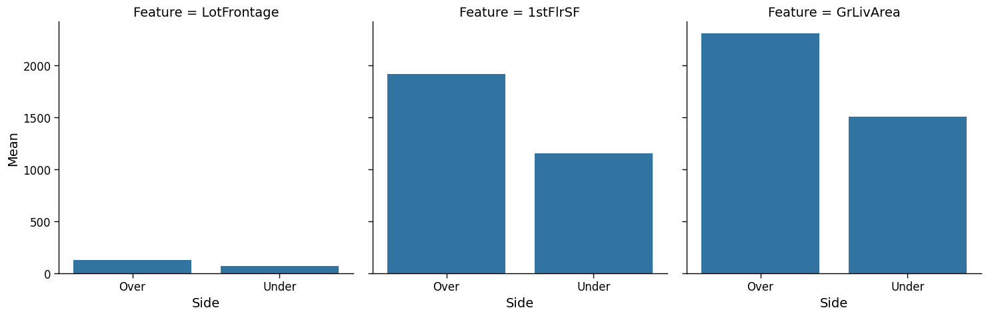

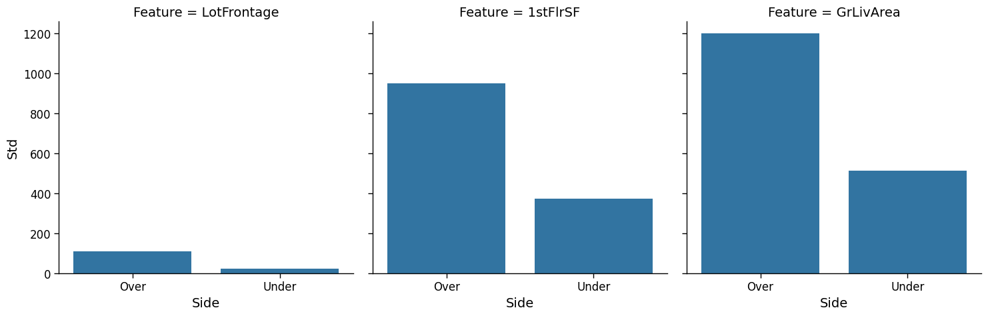

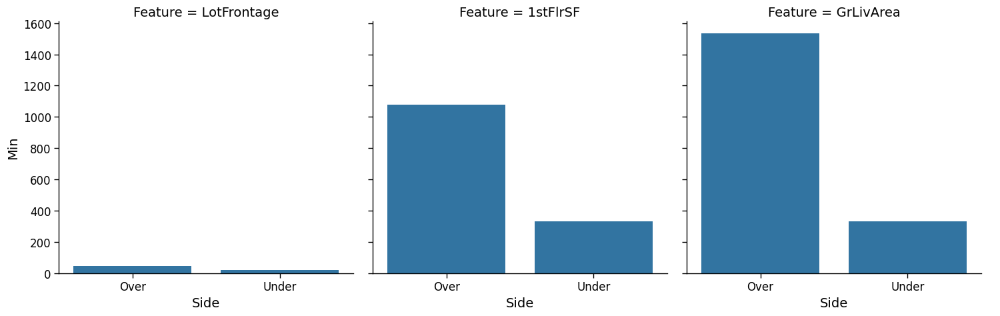

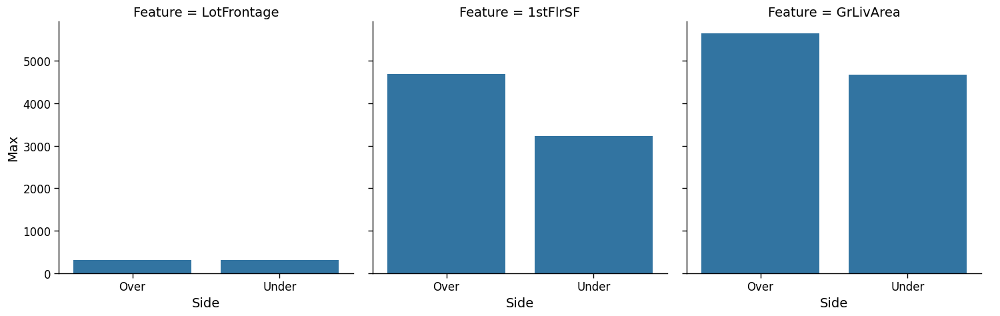

In [ ]:
sns.catplot(comparison[(comparison.Feature != 'SalePrice')], kind = 'bar', x = 'Side', y = 'Mean', col = 'Feature')
sns.catplot(comparison[(comparison.Feature != 'SalePrice')], kind = 'bar', x = 'Side', y = 'Std', col = 'Feature')
sns.catplot(comparison[(comparison.Feature != 'SalePrice')], kind = 'bar', x = 'Side', y = 'Min', col = 'Feature')
sns.catplot(comparison[(comparison.Feature != 'SalePrice')], kind = 'bar', x = 'Side', y = 'Max', col = 'Feature')

##### BsmtFinSF1: Type 1 finished square feet | Basement Features

<Axes: xlabel='BsmtFinSF1', ylabel='Count'>

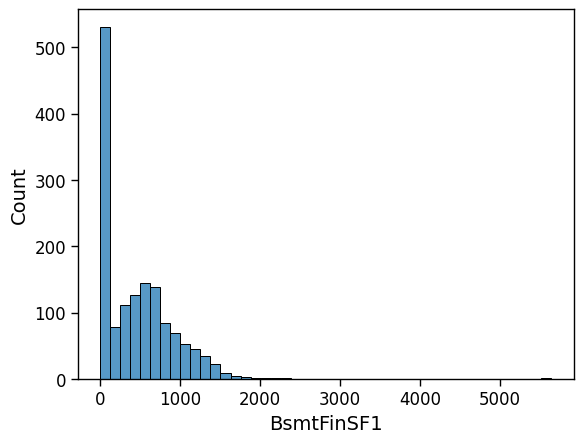

In [ ]:
sns.histplot(train['BsmtFinSF1'])

<Axes: xlabel='BsmtFinSF1', ylabel='Count'>

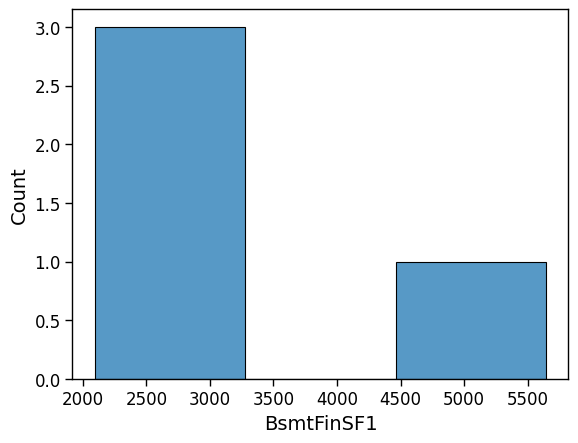

In [ ]:
# Isolating extreme values
sns.histplot(train[(train['BsmtFinSF1'] > 2000)]['BsmtFinSF1'])

In [ ]:
# Isolating extreme values
# checking similar features
train[(train['BsmtFinSF1'] > 2000)][['LotArea', 'BsmtFinSF1']]

,LotArea,BsmtFinSF1
523,40094,2260
898,12919,2188
1182,15623,2096
1298,63887,5644


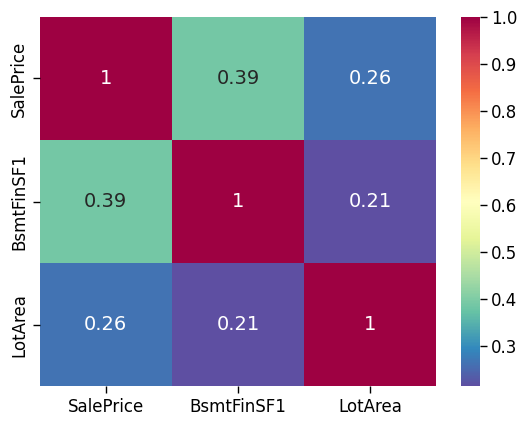

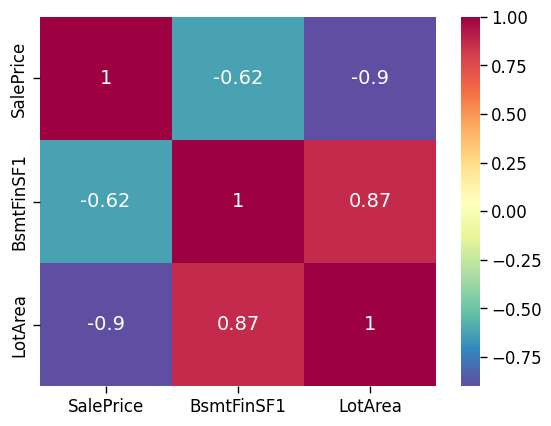

In [ ]:
# Isolating extreme values
# checking correlation with similar features
sns.heatmap(data= train[['SalePrice', 'BsmtFinSF1', 'LotArea']].corr(), annot=True, annot_kws={'size': 14}, cmap="Spectral_r")
plt.show()
sns.heatmap(data= train[(train['BsmtFinSF1'] > 2000)][['SalePrice', 'BsmtFinSF1', 'LotArea']].corr(), annot=True, annot_kws={'size': 14}, cmap="Spectral_r")
plt.show()

In [ ]:
### Checking for wrong values on the Basement features

len(train[((train['BsmtFinSF1'] + train['BsmtFinSF2'] + train['BsmtUnfSF']) != train['TotalBsmtSF'])])

0

#### Fireplaces

<Axes: xlabel='Fireplaces', ylabel='Count'>

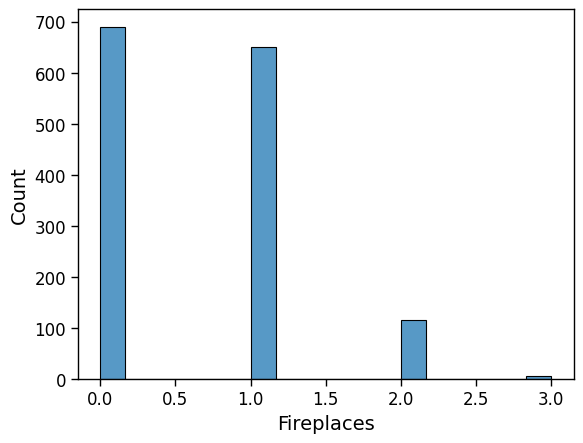

In [ ]:
sns.histplot(train['Fireplaces'])

In [ ]:
### Checking for wrong values

for key in train['Fireplaces'].value_counts().keys():
    print(f'For *{key}* fireplaces the quality is: \n{train[(train["Fireplaces"] == key)]["FireplaceQu"].value_counts()} \n')

For *0* fireplaces the quality is: 
Series([], Name: count, dtype: int64) 

For *1* fireplaces the quality is: 
FireplaceQu
Gd    324
TA    259
Fa     28
Po     20
Ex     19
Name: count, dtype: int64 

For *2* fireplaces the quality is: 
FireplaceQu
Gd    54
TA    53
Fa     4
Ex     4
Name: count, dtype: int64 

For *3* fireplaces the quality is: 
FireplaceQu
Gd    2
Ex    1
Fa    1
TA    1
Name: count, dtype: int64 



#### Year Built

<Axes: xlabel='GarageYrBlt', ylabel='Count'>

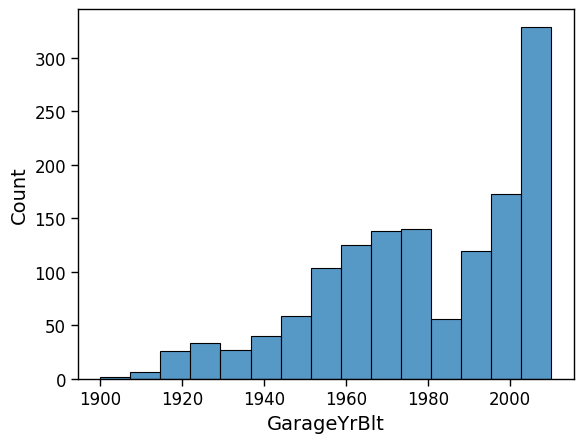

In [ ]:
sns.histplot(train['GarageYrBlt'])

In [ ]:
# Looking for null values

print(train['GarageYrBlt'].isna().sum())
print(train['YrSold'].isna().sum())
print(train['YearBuilt'].isna().sum())
print(train['YearRemodAdd'].isna().sum())

81
0
0
0


In [ ]:
# Checking for wrong values
train[train['GarageYrBlt'].isna()]['GarageArea'].sum()

0

Samples without garage do not have a built year for it

In [ ]:
# Checking for wrong values
print(train[(train['GarageYrBlt'] > train['YrSold'])]['GarageYrBlt'].count())
print(train[(train['YearBuilt'] > train['YrSold'])]['GarageYrBlt'].count())
print(train[(train['YearRemodAdd'] > train['YrSold'])]['GarageYrBlt'].count())
print(train[(train['YearBuilt'] > train['YearRemodAdd'])]['GarageYrBlt'].count())

0
0
1
0


There is 1 sample with remodeling year after sale

In [ ]:
train[(train['YearRemodAdd'] > train['YrSold'])][['GarageYrBlt', 'YrSold']].value_counts()

GarageYrBlt  YrSold
2007.000     2007      1
Name: count, dtype: int64

#### MiscVal: $Value of miscellaneous feature

<Axes: xlabel='MiscVal', ylabel='Count'>

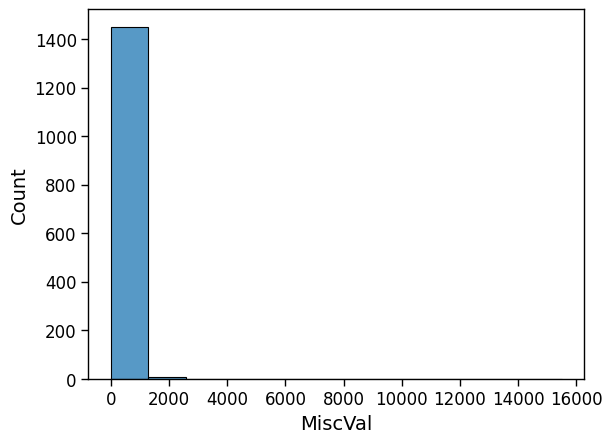

In [ ]:
sns.histplot(train['MiscVal'])

In [ ]:
# Checking for sample that have miscellaneous value greater than sale price
train[(train['MiscVal'] > train['SalePrice'])]['MiscVal'].count()

0

#### MasVnrArea: Masonry veneer area in square feet

In [ ]:
train[(train['MasVnrArea'] == 0)]['MasVnrType'].value_counts()

MasVnrType
BrkFace    1
Stone      1
Name: count, dtype: int64

In [ ]:
## Not possible to have a veneer type on samples with no veneer area
# To be dealt with on the Null Values Part

#### Garage Area

<Axes: xlabel='GarageArea', ylabel='Count'>

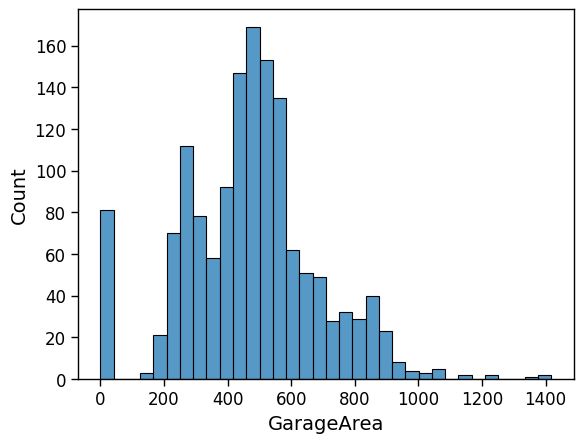

In [ ]:
sns.histplot(train['GarageArea'])

<Axes: xlabel='GarageArea', ylabel='Percent'>

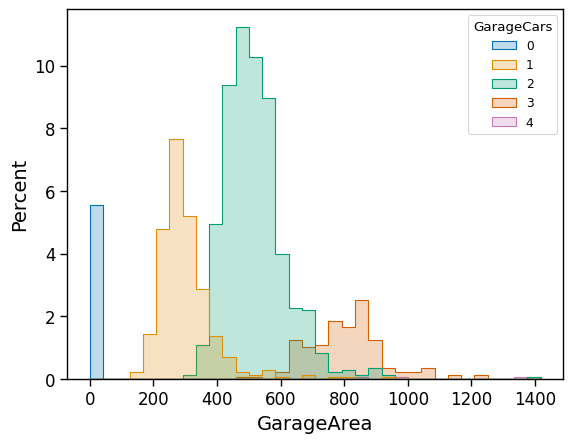

In [ ]:
# Checking for irregularities
sns.histplot(data = train, x = 'GarageArea', hue = 'GarageCars', element= 'step', stat = 'percent', palette = 'colorblind', shrink = 1)

In [ ]:
# Checking for wrong values
print(train[(train['GarageCars'] == 0)]['GarageCars'].count())
print(train[(train['GarageCars'] == 0)]['GarageArea'].sum())
print(train[(train['GarageCars'] == 0)]['GarageYrBlt'].count())
print(train[(train['GarageCars'] == 0)]['GarageType'].count())
print(train[(train['GarageCars'] == 0)]['GarageFinish'].count())
print(train[(train['GarageCars'] == 0)]['GarageQual'].count())
print(train[(train['GarageCars'] == 0)]['GarageCond'].count())

81
0
0
0
0
0
0


#### Kitchen

In [ ]:
train[(train['KitchenAbvGr'] == 0)]['KitchenAbvGr'].count()

1

In [ ]:
train[(train['KitchenAbvGr'] == 0)]['KitchenQual']

954    TA
Name: KitchenQual, dtype: object

In [ ]:
train[(train['KitchenAbvGr'] == 0)]

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
954,90,RL,35.000,9400,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,Edwards,Norm,Norm,Duplex,SFoyer,6,5,1975,1975,Flat,Tar&Grv,WdShing,Plywood,BrkFace,250.000,TA,TA,CBlock,Gd,Gd,Gd,GLQ,945,Unf,0,0,945,GasA,TA,Y,SBrkr,980,0,0,980,0,2,2,0,4,0,TA,4,Typ,0,NaN,NaN,NaN,NaN,0,0,NaN,NaN,Y,0,0,0,0,0,0,NaN,NaN,NaN,0,10,2006,WD,AdjLand,127500


In [ ]:
# Removing sample with no kitchen (probably missing value)
train = train[(train['KitchenAbvGr'] != 0)]
print(train[(train['KitchenAbvGr'] == 0)].count().sum())

0


#### Total Rooms - Bedrooms - Bathrooms

In [ ]:
# Checking for samples with no rooms
train[(train['TotRmsAbvGrd'] < 1)]['TotRmsAbvGrd'].count()

0

In [ ]:
# Checking for samples with wrong totals
train[(train['TotRmsAbvGrd'] < (train['BedroomAbvGr']))]['TotRmsAbvGrd'].count()

0

### Cleaning Categorical Data

In [ ]:
# Looking for categorical features that have very small variations
small_cat_features = []

for feature in string_cols:
    for value in train[feature].value_counts():
        if value/1459 > 0.97:
            small_cat_features.append(feature)
            print(f'{feature} : {np.round((value/1459)*100, 2)}%')

Street : 99.59%
Utilities : 99.93%
Condition2 : 98.97%
RoofMatl : 98.29%
Heating : 97.81%


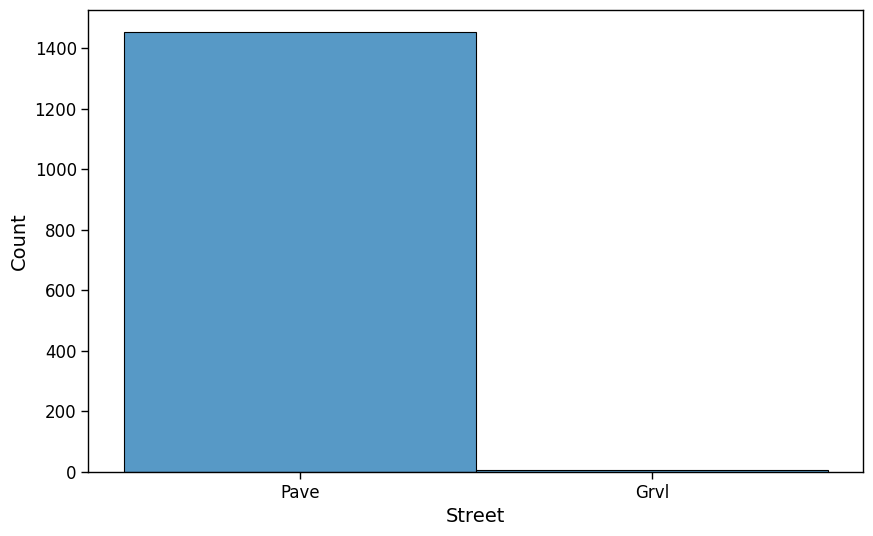

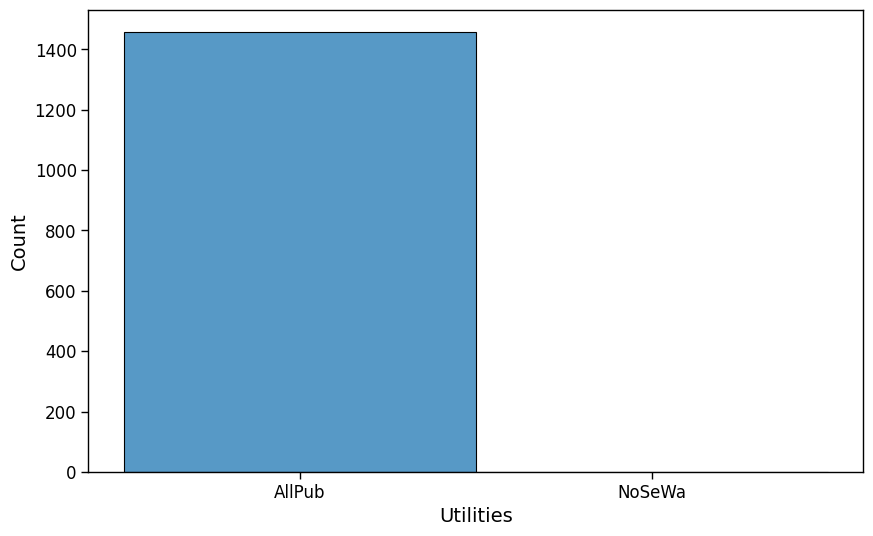

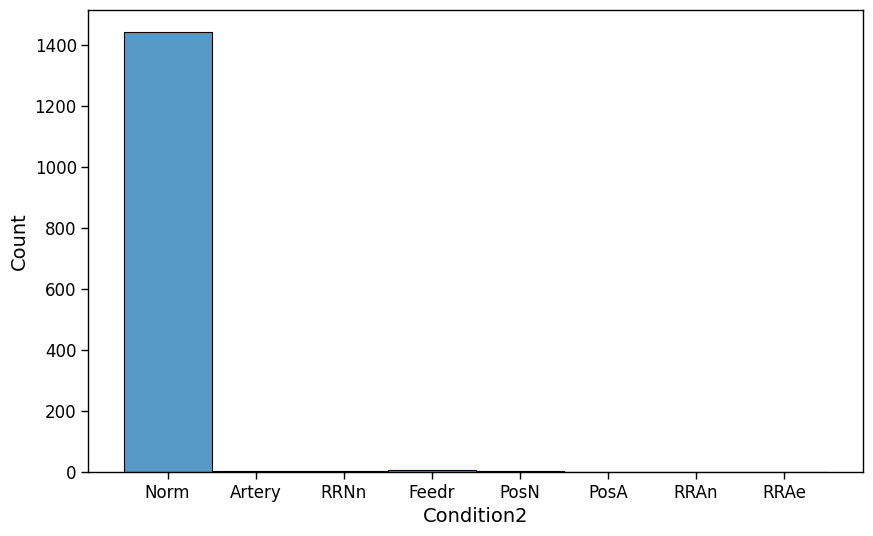

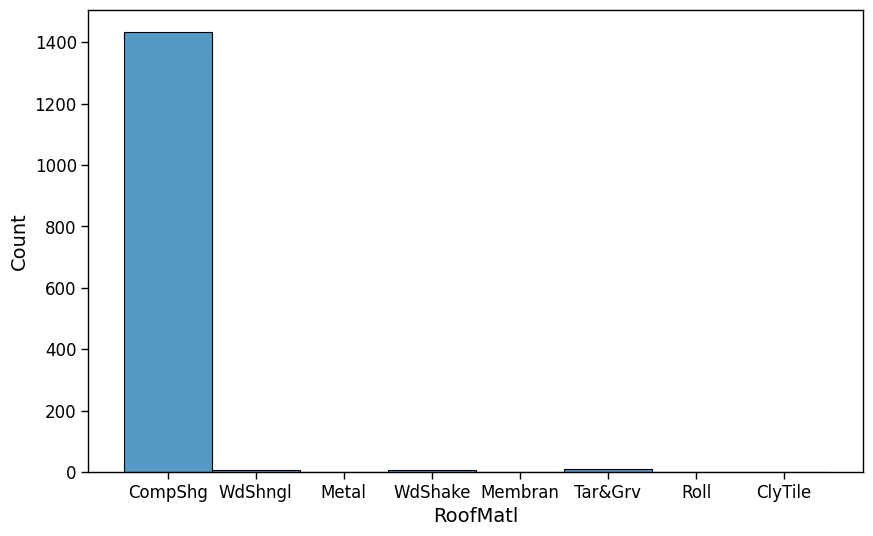

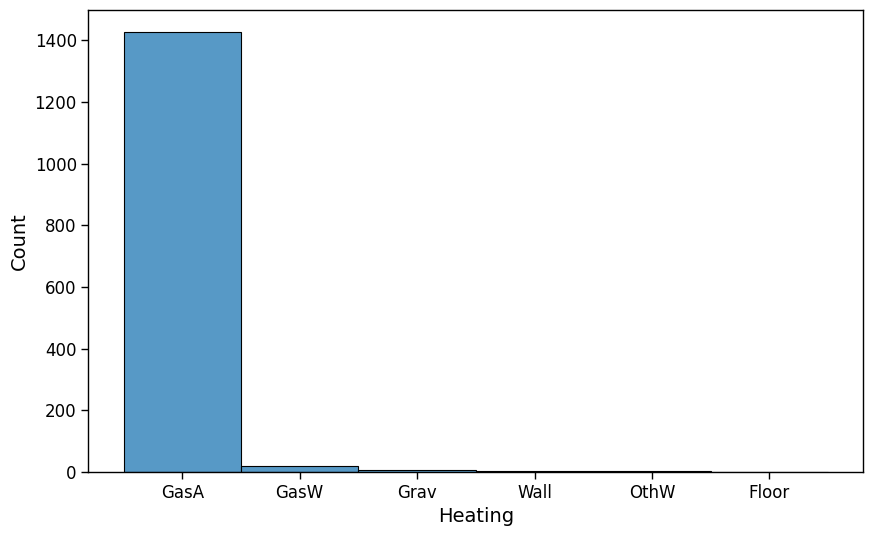

In [ ]:
for feature in small_cat_features:
    plt.figure(figsize = (10,6))
    sns.histplot(train[feature])
    plt.show()

#### House Style

In [ ]:
train['HouseStyle'].value_counts()

HouseStyle
1Story    726
2Story    445
1.5Fin    154
SLvl       65
SFoyer     36
1.5Unf     14
2.5Unf     11
2.5Fin      8
Name: count, dtype: int64

MSSubClass: Identifies the type of dwelling involved in the sale.

        20	1-STORY 1946 & NEWER ALL STYLES
        30	1-STORY 1945 & OLDER
        40	1-STORY W/FINISHED ATTIC ALL AGES
        45	1-1/2 STORY - UNFINISHED ALL AGES
        50	1-1/2 STORY FINISHED ALL AGES
        60	2-STORY 1946 & NEWER
        70	2-STORY 1945 & OLDER
        75	2-1/2 STORY ALL AGES
        80	SPLIT OR MULTI-LEVEL
        85	SPLIT FOYER
        90	DUPLEX - ALL STYLES AND AGES
       120	1-STORY PUD (Planned Unit Development) - 1946 & NEWER
       150	1-1/2 STORY PUD - ALL AGES
       160	2-STORY PUD - 1946 & NEWER
       180	PUD - MULTILEVEL - INCL SPLIT LEV/FOYER
       190	2 FAMILY CONVERSION - ALL STYLES AND AGES

In [ ]:
# Looking at the value counts of SubClass for every house style
# to check for irregularities
for n, key in enumerate(train['HouseStyle'].value_counts().keys()):
    print(f'{n+1}) {key}: \n{train[(train["HouseStyle"] == key)]["MSSubClass"].value_counts()}\n')

1) 1Story: 
MSSubClass
20     534
120     86
30      67
90      29
190      6
40       4
Name: count, dtype: int64

2) 2Story: 
MSSubClass
60     298
160     63
70      59
190     11
90       9
50       3
75       1
20       1
Name: count, dtype: int64

3) 1.5Fin: 
MSSubClass
50     141
190      8
90       4
30       1
Name: count, dtype: int64

4) SLvl: 
MSSubClass
80     58
180     3
20      1
190     1
90      1
60      1
Name: count, dtype: int64

5) SFoyer: 
MSSubClass
85     20
90      8
180     7
120     1
Name: count, dtype: int64

6) 1.5Unf: 
MSSubClass
45     12
190     1
30      1
Name: count, dtype: int64

7) 2.5Unf: 
MSSubClass
75     9
190    2
Name: count, dtype: int64

8) 2.5Fin: 
MSSubClass
75     6
190    1
70     1
Name: count, dtype: int64



#### Small categorical feature values

In [ ]:
# Checking for categorical feature values that provide very small variation
small_cat_feature_values = []

for feature in string_cols:
    if feature not in small_cat_features:
        for value in train[feature].value_counts():
            if value/1459 < 0.01:
                small_cat_feature_values.append(feature)
                print(f'{feature} : {np.round((value/1459)*100, 2)}%')

MSZoning : 0.69%
LotShape : 0.69%
LotConfig : 0.27%
LandSlope : 0.89%
Neighborhood : 0.75%
Neighborhood : 0.62%
Neighborhood : 0.14%
Condition1 : 0.75%
Condition1 : 0.55%
Condition1 : 0.34%
Condition1 : 0.14%
HouseStyle : 0.96%
HouseStyle : 0.75%
HouseStyle : 0.55%
RoofStyle : 0.82%
RoofStyle : 0.75%
RoofStyle : 0.48%
RoofStyle : 0.14%
Exterior1st : 0.14%
Exterior1st : 0.14%
Exterior1st : 0.07%
Exterior1st : 0.07%
Exterior1st : 0.07%
Exterior2nd : 0.69%
Exterior2nd : 0.48%
Exterior2nd : 0.34%
Exterior2nd : 0.21%
Exterior2nd : 0.07%
Exterior2nd : 0.07%
ExterQual : 0.96%
ExterCond : 0.21%
ExterCond : 0.07%
Foundation : 0.41%
Foundation : 0.21%
BsmtCond : 0.14%
BsmtFinType2 : 0.96%
HeatingQC : 0.07%
Electrical : 0.21%
Electrical : 0.07%
Functional : 0.96%
Functional : 0.34%
Functional : 0.07%
GarageType : 0.62%
GarageType : 0.41%
GarageQual : 0.96%
GarageQual : 0.21%
GarageQual : 0.21%
GarageCond : 0.62%
GarageCond : 0.48%
GarageCond : 0.14%
PoolQC : 0.21%
PoolQC : 0.14%
PoolQC : 0.14%
Fe

In [ ]:
len(small_cat_feature_values)

65

## Null Values

In [ ]:
print(train.isnull().sum())
print(f'\n Total number of null values: {train.isnull().sum().sum()}')

MSSubClass         0
MSZoning           0
LotFrontage      259
LotArea            0
Street             0
                ... 
MoSold             0
YrSold             0
SaleType           0
SaleCondition      0
SalePrice          0
Length: 80, dtype: int64

 Total number of null values: 7819


In [ ]:
null_cols = []

for i in train.columns.tolist():
    if train[i].isna().any():
        print(f'Column {i} has {train[i].isna().sum()} null values.')
        null_cols.append(i)

print(f'\n The {len(null_cols)} columns with null values are: {null_cols}')

Column LotFrontage has 259 null values.
Column Alley has 1368 null values.
Column MasVnrType has 872 null values.
Column MasVnrArea has 8 null values.
Column BsmtQual has 37 null values.
Column BsmtCond has 37 null values.
Column BsmtExposure has 38 null values.
Column BsmtFinType1 has 37 null values.
Column BsmtFinType2 has 38 null values.
Column Electrical has 1 null values.
Column FireplaceQu has 689 null values.
Column GarageType has 80 null values.
Column GarageYrBlt has 80 null values.
Column GarageFinish has 80 null values.
Column GarageQual has 80 null values.
Column GarageCond has 80 null values.
Column PoolQC has 1452 null values.
Column Fence has 1178 null values.
Column MiscFeature has 1405 null values.

 The 19 columns with null values are: ['LotFrontage', 'Alley', 'MasVnrType', 'MasVnrArea', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Electrical', 'FireplaceQu', 'GarageType', 'GarageYrBlt', 'GarageFinish', 'GarageQual', 'GarageCond', 'PoolQC',

In [ ]:
small_null_cols = []

for i in train.columns.tolist():
    if train[i].isna().any():
        if train[i].isna().sum() < 10:
            print(f'Column {i} only has {train[i].isna().sum()} null values.')
            small_null_cols.append(i)

print(f'\n The {len(small_null_cols)} columns with only a few null values are: {small_null_cols}')

Column MasVnrArea only has 8 null values.
Column Electrical only has 1 null values.

 The 2 columns with only a few null values are: ['MasVnrArea', 'Electrical']


### Electrical

In [ ]:
print(train['Electrical'].value_counts())
print(f'Number of null values on the Electrical column: {train["Electrical"].isna().sum()}')

Electrical
SBrkr    1333
FuseA      94
FuseF      27
FuseP       3
Mix         1
Name: count, dtype: int64
Number of null values on the Electrical column: 1


In [ ]:
# Since it is impossible to provide a value for the missing one and it is just 1, the sample is removed
train.dropna(subset = 'Electrical', inplace = True)

print(f'Number of null values on the Electrical column: {train["Electrical"].isna().sum()}')

Number of null values on the Electrical column: 0


### Masonery Veneer Area/Type (MasVnrArea, MasVnrType)

<Axes: xlabel='MasVnrArea', ylabel='Count'>

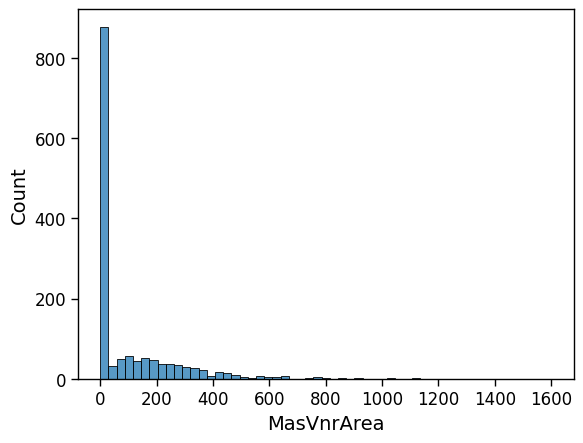

In [ ]:
sns.histplot(train['MasVnrArea'])

MasVnrType
BrkFace    444
Stone      128
BrkCmn      15
Name: count, dtype: int64


<Axes: ylabel='MasVnrType'>

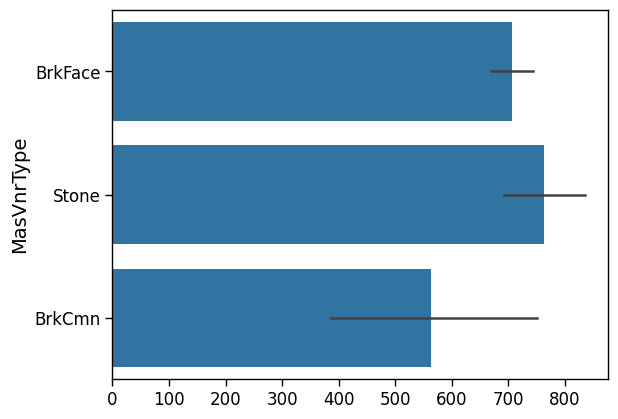

In [ ]:
print(train['MasVnrType'].value_counts())
sns.barplot(train['MasVnrType'])

In [ ]:
# Checking for veneer type when veneer area is null
train[(train['MasVnrArea'].isna())]['MasVnrType'].value_counts()

Series([], Name: count, dtype: int64)

In [ ]:
# Checking for veneer type when veneer area is 0
train[(train['MasVnrArea'] == 0)]['MasVnrType'].value_counts()

MasVnrType
BrkFace    1
Stone      1
Name: count, dtype: int64

In [ ]:
# Changing Veneer type to none when:
# Veneer area is 0
mask = (train['MasVnrType'] == 'BrkFace') & (train['MasVnrArea'] == 0)
train.loc[mask, 'MasVnrType'] = 'None'
mask = (train['MasVnrType'] == 'Stone') & (train['MasVnrArea'] == 0)
train.loc[mask, 'MasVnrType'] = 'None'
print(train[(train['MasVnrArea'] == 0)]['MasVnrType'].value_counts())
print(train['MasVnrType'].isna().sum())

MasVnrType
None    2
Name: count, dtype: int64
871


In [ ]:
### The null values of veneer type that have veneer area null should be 'none'

train['MasVnrType'].fillna('None', inplace = True)
print(train['MasVnrType'].isna().sum())

0


In [ ]:
print(train['MasVnrArea'].isna().sum())

8


In [ ]:
# Veneer area null should be 0
train['MasVnrArea'].fillna(0, inplace = True)
print(train['MasVnrArea'].isna().sum())

0


In [ ]:
null_cols = []

for i in train.columns.tolist():
    if train[i].isna().any():
        print(f'Column {i} has {train[i].isna().sum()} null values.')
        null_cols.append(i)

print(f'\n The {len(null_cols)} columns with null values are: {null_cols}')

Column LotFrontage has 259 null values.
Column Alley has 1367 null values.
Column BsmtQual has 37 null values.
Column BsmtCond has 37 null values.
Column BsmtExposure has 38 null values.
Column BsmtFinType1 has 37 null values.
Column BsmtFinType2 has 38 null values.
Column FireplaceQu has 688 null values.
Column GarageType has 80 null values.
Column GarageYrBlt has 80 null values.
Column GarageFinish has 80 null values.
Column GarageQual has 80 null values.
Column GarageCond has 80 null values.
Column PoolQC has 1451 null values.
Column Fence has 1177 null values.
Column MiscFeature has 1404 null values.

 The 16 columns with null values are: ['LotFrontage', 'Alley', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'FireplaceQu', 'GarageType', 'GarageYrBlt', 'GarageFinish', 'GarageQual', 'GarageCond', 'PoolQC', 'Fence', 'MiscFeature']


### Linear feet of street connected to property (LotFrontage)

In [ ]:
# Categorical features with null values
print(len(set(null_cols) & set(string_cols)))
# Numerical features with null values
set(null_cols).difference(set(string_cols))

14


{'GarageYrBlt', 'LotFrontage'}

In [ ]:
print([train[i].describe() for i in set(null_cols).difference(set(string_cols))])

[count   1378.000
mean    1978.485
std       24.687
min     1900.000
25%     1961.000
50%     1980.000
75%     2002.000
max     2010.000
Name: GarageYrBlt, dtype: float64, count   1199.000
mean      70.077
std       24.284
min       21.000
25%       59.000
50%       69.000
75%       80.000
max      313.000
Name: LotFrontage, dtype: float64]


In [ ]:
print(train['LotFrontage'].isna().sum())
print(len(train[(train['LotFrontage'] == 0)]))

259
0


Lot frontage being 0 would be strange.
Need to find an appropriate number to replace nulls

In [ ]:
# Mason sub class values for null lot frontage
print(train[(train['LotFrontage'].isna())]['MSSubClass'].value_counts())
print(train['MSSubClass'].value_counts())

MSSubClass
20     99
60     69
80     20
120    20
50     16
160     8
85      6
30      6
90      5
70      5
190     3
75      1
40      1
Name: count, dtype: int64
MSSubClass
20     536
60     299
50     144
120     87
30      69
160     63
70      60
80      57
90      51
190     30
85      20
75      16
45      12
180     10
40       4
Name: count, dtype: int64


In [ ]:
# Zoning values for null lot frontage
print(train[(train['LotFrontage'].isna())]['MSZoning'].value_counts())
print(train['MSZoning'].value_counts())

MSZoning
RL    229
RM     19
FV      8
RH      3
Name: count, dtype: int64
MSZoning
RL         1149
RM          218
FV           65
RH           16
C (all)      10
Name: count, dtype: int64


<Axes: >

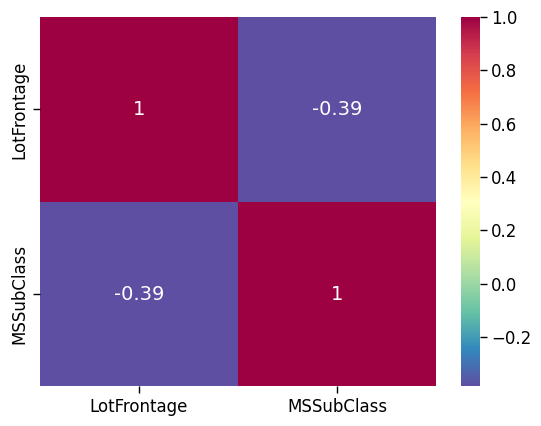

In [ ]:
sns.heatmap(data= train[['LotFrontage', 'MSSubClass']].corr(), annot=True, annot_kws={'size': 14}, cmap="Spectral_r")


 LotFrontage 
 ____________________________________________________________________________________________________
Average Value: 70.08 | Std: 24.27 | Max: 313.0 | Min: 21.0 | Skewness: nan | Kurtosis: nan
RL : Count: 1149 | Average Value: 74.72 | Std: 23.21 | Max: 313.0 | Min: 24.0 | Skewness: nan | Kurtosis: nan
RM : Count: 218 | Average Value: 52.37 | Std: 20.45 | Max: 153.0 | Min: 21.0 | Skewness: nan | Kurtosis: nan
FV : Count: 65 | Average Value: 59.49 | Std: 22.84 | Max: 102.0 | Min: 24.0 | Skewness: nan | Kurtosis: nan
RH : Count: 16 | Average Value: 58.92 | Std: 13.84 | Max: 82.0 | Min: 34.0 | Skewness: nan | Kurtosis: nan
C (all) : Count: 10 | Average Value: 69.7 | Std: 22.26 | Max: 120.0 | Min: 50.0 | Skewness: 1.38 | Kurtosis: 0.38


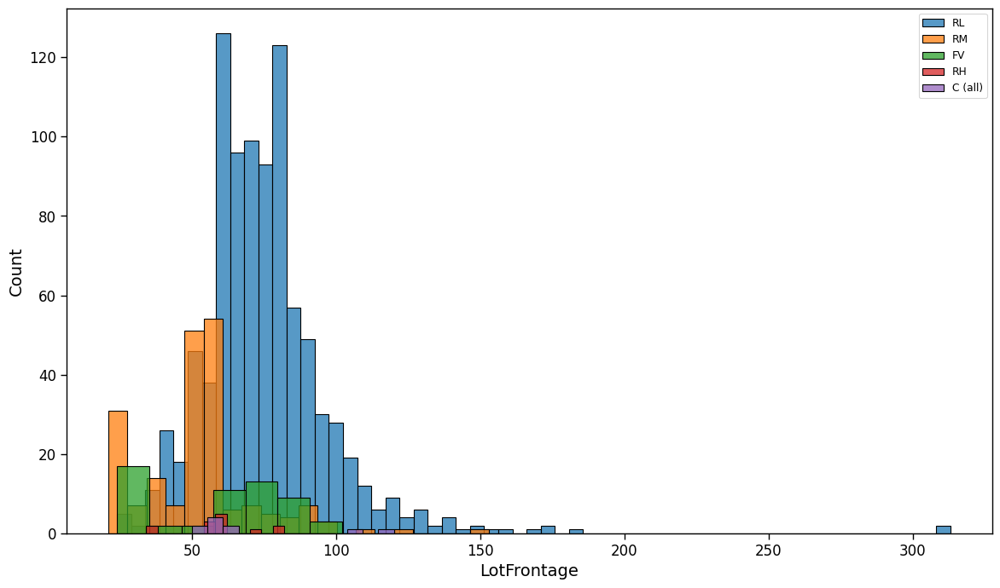

In [ ]:
plt.figure(figsize = (14,8))
average = round(train["LotFrontage"].mean(), 2)
std = round(np.std(train["LotFrontage"]), 2)
max = round(train["LotFrontage"].max(), 2)
min = round(train["LotFrontage"].min(), 2)
skewness = round(skew(train["LotFrontage"]), 2)
kurt = round(kurtosis(train["LotFrontage"]), 2)
print(f'\n LotFrontage \n', '_'*100)
print(f'Average Value: {average} | Std: {std} | Max: {max} | Min: {min} | Skewness: {skewness} | Kurtosis: {kurt}')
for type_of in train['MSZoning'].value_counts().keys():
    count = len(train[(train['MSZoning'] == type_of)])
    average = round(train[(train['MSZoning'] == type_of)]["LotFrontage"].mean(), 2)
    std = round(np.std(train[(train['MSZoning'] == type_of)]["LotFrontage"]), 2)
    max = round(train[(train['MSZoning'] == type_of)]["LotFrontage"].max(), 2)
    min = round(train[(train['MSZoning'] == type_of)]["LotFrontage"].min(), 2)
    skewness = round(skew(train[(train['MSZoning'] == type_of)]["LotFrontage"]), 2)
    kurt = round(kurtosis(train[(train['MSZoning'] == type_of)]["LotFrontage"]), 2)
    sns.histplot(data = train, x = train[(train['MSZoning'] == type_of)]["LotFrontage"], label = type_of)
    print(f'{type_of} : Count: {count} | Average Value: {average} | Std: {std} | Max: {max} | Min: {min} | Skewness: {skewness} | Kurtosis: {kurt}')
plt.legend()
plt.show()

Trying to find a pattern for lot frontage, to replace null values.

<Axes: >

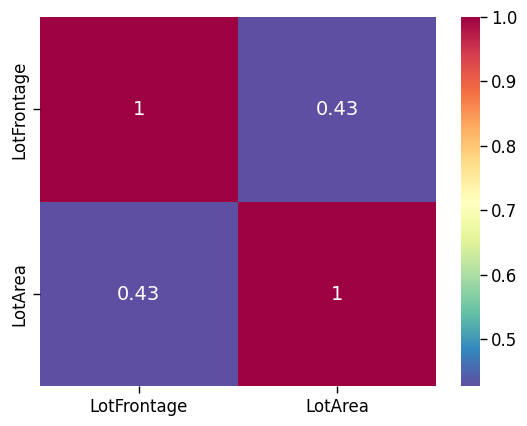

In [ ]:
sns.heatmap(data= train[['LotFrontage', 'LotArea']].corr(), annot=True, annot_kws={'size': 14}, cmap="Spectral_r")

<Axes: xlabel='LotFrontage', ylabel='LotArea'>

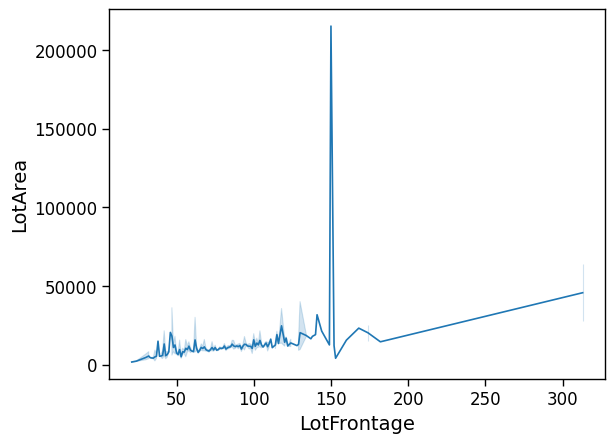

In [ ]:
# Checking for trends
sns.lineplot(data = train, x = 'LotFrontage', y = 'LotArea')

<Axes: xlabel='LotFrontage', ylabel='LotArea'>

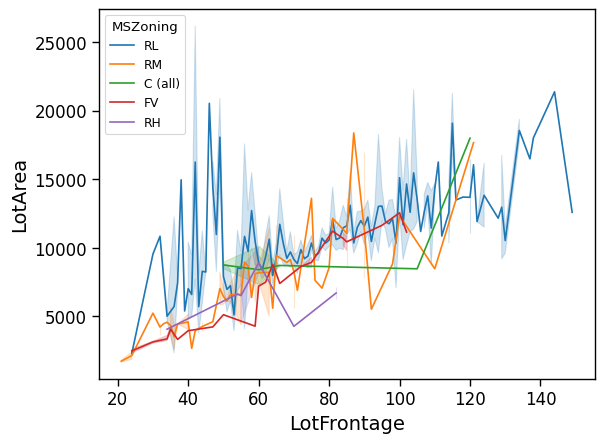

In [ ]:
# Checking for trends
sns.lineplot(data = train[(train['LotArea'] < 30000) & (train['LotFrontage'] < 150)], x = 'LotFrontage', y = 'LotArea', hue = 'MSZoning')

<Axes: >

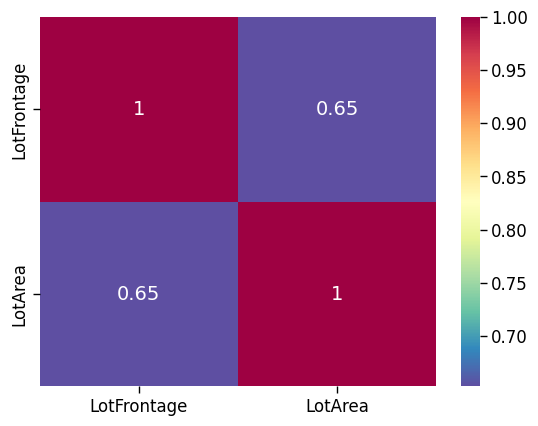

In [ ]:
sns.heatmap(data= train[(train['LotArea'] < 30000) & (train['LotFrontage'] < 150)][['LotFrontage', 'LotArea']].corr(), annot=True, annot_kws={'size': 14}, cmap="Spectral_r")

<Axes: >

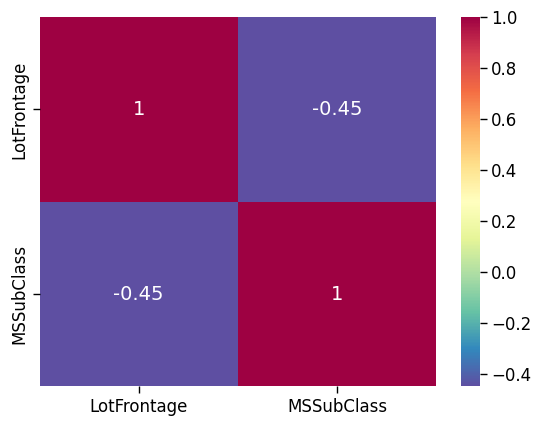

In [ ]:
sns.heatmap(data= train[(train['LotArea'] < 30000) & (train['LotFrontage'] < 150)][['LotFrontage', 'MSSubClass']].corr(), annot=True, annot_kws={'size': 14}, cmap="Spectral_r")

In [ ]:
# Lot frontage nulls are replaced with the mean of the dataset of their particular samples zone
for key in train[train['LotFrontage'].isna()]['MSZoning'].value_counts().keys():
    value = train[(train['MSZoning'] == key)]['LotFrontage'].mean()
    mask = (train['MSZoning'] == key) & (train['LotFrontage'].isna())
    train.loc[mask, 'LotFrontage'] = value

In [ ]:
train['LotFrontage'].isna().sum()

0

### Alley, BsmtQual, BsmtCond, BsmtExposure, BsmtFinType1, BsmtFinType2, FireplaceQu, GarageFinish, GarageQual, GarageCond, PoolQC

In [ ]:
null_cols_str = ['Alley', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'FireplaceQu', 'GarageFinish', 'GarageQual', 'GarageCond', 'PoolQC']

In [ ]:
tot_len = len(train)

for col in null_cols_str:
    nulls = train[col].isna().sum()
    print(f'{col} null rows: {nulls}/{tot_len} - {np.round((nulls/tot_len)*100, 1)}%')

Alley null rows: 1367/1458 - 93.8%
BsmtQual null rows: 37/1458 - 2.5%
BsmtCond null rows: 37/1458 - 2.5%
BsmtExposure null rows: 38/1458 - 2.6%
BsmtFinType1 null rows: 37/1458 - 2.5%
BsmtFinType2 null rows: 38/1458 - 2.6%
FireplaceQu null rows: 688/1458 - 47.2%
GarageFinish null rows: 80/1458 - 5.5%
GarageQual null rows: 80/1458 - 5.5%
GarageCond null rows: 80/1458 - 5.5%
PoolQC null rows: 1451/1458 - 99.5%


In [ ]:
# Replacing null values for categorical features that their null means non-existance of the feature

train['Alley'].fillna(0, inplace = True)
train['BsmtQual'].fillna(0, inplace = True)
train['BsmtCond'].fillna(0, inplace = True)
train['BsmtExposure'].fillna(0, inplace = True)
train['BsmtFinType1'].fillna(0, inplace = True)
train['BsmtFinType2'].fillna(0, inplace = True)
train['FireplaceQu'].fillna(0, inplace = True)
train['GarageFinish'].fillna(0, inplace = True)
train['GarageQual'].fillna(0, inplace = True)
train['GarageCond'].fillna(0, inplace = True)
train['PoolQC'].fillna(0, inplace = True)

### GarageType, GarageYrBlt, Fence, MiscFeature

In [ ]:
null_cols = []

for i in train.columns.tolist():
    if train[i].isna().any():
        nulls = train[i].isna().sum()
        print(f'{i} null rows: {nulls}/{tot_len} - {np.round((nulls/tot_len)*100, 1)}%')
        null_cols.append(i)

print(f'\n The {len(null_cols)} columns with null values are: {null_cols}')

GarageType null rows: 80/1458 - 5.5%
GarageYrBlt null rows: 80/1458 - 5.5%
Fence null rows: 1177/1458 - 80.7%
MiscFeature null rows: 1404/1458 - 96.3%

 The 4 columns with null values are: ['GarageType', 'GarageYrBlt', 'Fence', 'MiscFeature']


In [ ]:
# Filling nulls with appropriate value
train['GarageType'].fillna('No Garage', inplace = True)
train['Fence'].fillna('No Fence', inplace = True)
train['MiscFeature'].fillna('No MiscFeature', inplace = True)

In [ ]:
train[(train['GarageYrBlt'].isna())]['GarageType'].value_counts()


GarageType
No Garage    80
Name: count, dtype: int64

In [ ]:
train[(train['GarageYrBlt'] == train['YearBuilt'])]['YearBuilt'].count()

1089

In [ ]:
# Since most garages on the dataset have been built on the sane year as the house
# I will replace the nulls (that actually mean no garage was built)
# with the house built year
# to keep dataset variance from increasing
train.loc[train['GarageYrBlt'].isna(), 'GarageYrBlt'] = train['YearBuilt']
train[(train['GarageYrBlt'] == train['YearBuilt'])]['YearBuilt'].count()

1169

In [ ]:
null_cols = []

for i in train.columns.tolist():
    if train[i].isna().any():
        print(f'Column {i} has {train[i].isna().sum()} null values.')
        null_cols.append(i)

print(f'\n The {len(null_cols)} columns with null values are: {null_cols}')


 The 0 columns with null values are: []


## Splitting Data

In [ ]:
X = train.drop(columns = 'SalePrice')
y = train['SalePrice']

print(X.shape)
print(y.shape)

(1458, 79)
(1458,)


In [ ]:
# Splitting 80% train - 20% test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=1)

In [ ]:
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(1166, 79)
(292, 79)
(1166,)
(292,)


## Encoding Categorical Data

Encoding categorical features with values that can be objectively ranked

In [ ]:
X_train.Alley.replace({'Pave':5, 'Grvl':3, 'No Alley': 0}, inplace=True)
X_train.BsmtQual.replace({'Ex':5, 'Gd':4, 'TA':3, 'Fa':2, 'Po':1}, inplace=True)
X_train.BsmtCond.replace({'Ex':5, 'Gd':4, 'TA':3, 'Fa':2, 'Po':1}, inplace=True)
X_train.BsmtExposure.replace({'Gd':4, 'Av':3, 'Mn':2, 'No':1}, inplace=True)
X_train.BsmtFinType1.replace({'GLQ':6, 'ALQ':5, 'BLQ':4, 'Rec':3, 'LwQ':2, 'Unf':1}, inplace=True)
X_train.BsmtFinType2.replace({'GLQ':6, 'ALQ':5, 'BLQ':4, 'Rec':3, 'LwQ':2, 'Unf':1}, inplace=True)
X_train.FireplaceQu.replace({'Ex':5, 'Gd':4, 'TA':3, 'Fa':2, 'Po':1}, inplace=True)
X_train.GarageFinish.replace({'Fin':5, 'RFn':3, 'Unf':1}, inplace=True)
X_train.GarageQual.replace({'Ex':5, 'Gd':4, 'TA':3, 'Fa':2, 'Po':1}, inplace=True)
X_train.GarageCond.replace({'Ex':5, 'Gd':4, 'TA':3, 'Fa':2, 'Po':1}, inplace=True)
X_train.PoolQC.replace({'Ex':5, 'Gd':4, 'TA':3, 'Fa':2, 'Po':1}, inplace=True)
X_train.Street.replace({'Grvl':5, 'Pave':3}, inplace=True)
X_train.Utilities.replace({'AllPub':4, 'NoSewr':3, 'NoSeWa':2, 'ELO':1}, inplace=True)
X_train.LandSlope.replace({'Gtl':3, 'Mod':2, 'Sev':1}, inplace=True)
X_train.ExterQual.replace({'Ex':5, 'Gd':4, 'TA':3, 'Fa':2, 'Po':1}, inplace=True)
X_train.ExterCond.replace({'Ex':5, 'Gd':4, 'TA':3, 'Fa':2, 'Po':1}, inplace=True)
X_train.HeatingQC.replace({'Ex':5, 'Gd':4, 'TA':3, 'Fa':2, 'Po':1}, inplace=True)
X_train.CentralAir.replace({'Y':1, 'N':0}, inplace=True)
X_train.KitchenQual.replace({'Ex':5, 'Gd':4, 'TA':3, 'Fa':2, 'Po':1}, inplace=True)
X_train.Functional.replace({'Typ':8, 'Min1':7, 'Min2':6, 'Mod':5, 'Maj1':4, 'Maj2':3, 'Sev':2, 'Sal':1}, inplace=True)
X_train.PavedDrive.replace({'Y':2, 'P':1, 'N':0}, inplace=True)
X_train.LotShape.replace({'Reg':3, 'IR1':2, 'IR2':1, 'IR3':0}, inplace=True)
X_train.LandContour.replace({'Lvl':3, 'Bnk':2, 'HLS':1, 'Low':0}, inplace=True)
X_train.BldgType.replace({'1Fam':5, '2FmCon':4, '2fmCon':4, 'Duplx':3, 'Duplex':3, 'TwnhsE':2, 'Twnhs':1, 'TwnhsI':1}, inplace=True)
X_train.Foundation.replace({'PConc':6, 'Stone':5, 'BrkTil':4, 'CBlock':3, 'Wood':2, 'Slab':1}, inplace=True)
X_train.Heating.replace({'GasW':6, 'GasA':5, 'OthW':4, 'Wall':3, 'Grav':2, 'Floor':1}, inplace=True)
X_train.Electrical.replace({'SBrkr':5, 'FuseA':4, 'FuseF':3, 'FuseP':2, 'Mix':1}, inplace=True)
X_train.RoofMatl.replace({'ClyTile':7, 'Metal':6, 'WdShngl':5, 'WdShake':4, 'CompShg':3, 'Tar&Grv':2, 'Roll':1, 'Membran':0}, inplace=True)
X_train.MasVnrType.replace({'Stone':5, 'BrkFace':4, 'BrkCmn':3, 'CBlock':2, 'None':1}, inplace=True)
X_train.Fence.replace({'GdPrv':5, 'GdWo':4, 'MnPrv':3, 'MnWw':2, 'No Fence':1}, inplace=True)

In [ ]:
X_test.Alley.replace({'Pave':5, 'Grvl':3, 'No Alley': 0}, inplace=True)
X_test.BsmtQual.replace({'Ex':5, 'Gd':4, 'TA':3, 'Fa':2, 'Po':1}, inplace=True)
X_test.BsmtCond.replace({'Ex':5, 'Gd':4, 'TA':3, 'Fa':2, 'Po':1}, inplace=True)
X_test.BsmtExposure.replace({'Gd':4, 'Av':3, 'Mn':2, 'No':1}, inplace=True)
X_test.BsmtFinType1.replace({'GLQ':6, 'ALQ':5, 'BLQ':4, 'Rec':3, 'LwQ':2, 'Unf':1}, inplace=True)
X_test.BsmtFinType2.replace({'GLQ':6, 'ALQ':5, 'BLQ':4, 'Rec':3, 'LwQ':2, 'Unf':1}, inplace=True)
X_test.FireplaceQu.replace({'Ex':5, 'Gd':4, 'TA':3, 'Fa':2, 'Po':1}, inplace=True)
X_test.GarageFinish.replace({'Fin':5, 'RFn':3, 'Unf':1}, inplace=True)
X_test.GarageQual.replace({'Ex':5, 'Gd':4, 'TA':3, 'Fa':2, 'Po':1}, inplace=True)
X_test.GarageCond.replace({'Ex':5, 'Gd':4, 'TA':3, 'Fa':2, 'Po':1}, inplace=True)
X_test.PoolQC.replace({'Ex':5, 'Gd':4, 'TA':3, 'Fa':2, 'Po':1}, inplace=True)
X_test.Street.replace({'Grvl':5, 'Pave':3}, inplace=True)
X_test.Utilities.replace({'AllPub':4, 'NoSewr':3, 'NoSeWa':2, 'ELO':1}, inplace=True)
X_test.LandSlope.replace({'Gtl':3, 'Mod':2, 'Sev':1}, inplace=True)
X_test.ExterQual.replace({'Ex':5, 'Gd':4, 'TA':3, 'Fa':2, 'Po':1}, inplace=True)
X_test.ExterCond.replace({'Ex':5, 'Gd':4, 'TA':3, 'Fa':2, 'Po':1}, inplace=True)
X_test.HeatingQC.replace({'Ex':5, 'Gd':4, 'TA':3, 'Fa':2, 'Po':1}, inplace=True)
X_test.CentralAir.replace({'Y':1, 'N':0}, inplace=True)
X_test.KitchenQual.replace({'Ex':5, 'Gd':4, 'TA':3, 'Fa':2, 'Po':1}, inplace=True)
X_test.Functional.replace({'Typ':8, 'Min1':7, 'Min2':6, 'Mod':5, 'Maj1':4, 'Maj2':3, 'Sev':2, 'Sal':1}, inplace=True)
X_test.PavedDrive.replace({'Y':2, 'P':1, 'N':0}, inplace=True)
X_test.LotShape.replace({'Reg':3, 'IR1':2, 'IR2':1, 'IR3':0}, inplace=True)
X_test.LandContour.replace({'Lvl':3, 'Bnk':2, 'HLS':1, 'Low':0}, inplace=True)
X_test.BldgType.replace({'1Fam':5, '2FmCon':4, '2fmCon':4, 'Duplx':3, 'Duplex':3, 'TwnhsE':2, 'Twnhs':1, 'TwnhsI':1}, inplace=True)
X_test.Foundation.replace({'PConc':6, 'Stone':5, 'BrkTil':4, 'CBlock':3, 'Wood':2, 'Slab':1}, inplace=True)
X_test.Heating.replace({'GasW':6, 'GasA':5, 'OthW':4, 'Wall':3, 'Grav':2, 'Floor':1}, inplace=True)
X_test.Electrical.replace({'SBrkr':5, 'FuseA':4, 'FuseF':3, 'FuseP':2, 'Mix':1}, inplace=True)
X_test.RoofMatl.replace({'ClyTile':7, 'Metal':6, 'WdShngl':5, 'WdShake':4, 'CompShg':3, 'Tar&Grv':2, 'Roll':1, 'Membran':0}, inplace=True)
X_test.MasVnrType.replace({'Stone':5, 'BrkFace':4, 'BrkCmn':3, 'CBlock':2, 'None':1}, inplace=True)
X_test.Fence.replace({'GdPrv':5, 'GdWo':4, 'MnPrv':3, 'MnWw':2, 'No Fence':1}, inplace=True)

In [ ]:
string_cols = []
object_cols = X_train.select_dtypes('object').columns.tolist()

for i in object_cols:
    if pd.to_numeric(X_train[i], errors='coerce').isna().all():
        print(f'Column {i} is not numeric.')
        string_cols.append(i)

print(f'\n The {len(string_cols)} non-numeric columns are: {string_cols}')

Column MSZoning is not numeric.
Column LotConfig is not numeric.
Column Neighborhood is not numeric.
Column Condition1 is not numeric.
Column Condition2 is not numeric.
Column HouseStyle is not numeric.
Column RoofStyle is not numeric.
Column Exterior1st is not numeric.
Column Exterior2nd is not numeric.
Column GarageType is not numeric.
Column MiscFeature is not numeric.
Column SaleType is not numeric.
Column SaleCondition is not numeric.

 The 13 non-numeric columns are: ['MSZoning', 'LotConfig', 'Neighborhood', 'Condition1', 'Condition2', 'HouseStyle', 'RoofStyle', 'Exterior1st', 'Exterior2nd', 'GarageType', 'MiscFeature', 'SaleType', 'SaleCondition']


In [ ]:
### 'MSZoning', 'LotConfig', 'Neighborhood', 'Condition1', 'Condition2', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st',
### 'Exterior2nd', 'MasVnrType', 'CentralAir', 'GarageType', 'Fence', 'MiscFeature', 'SaleType', 'SaleCondition'
# Categorical features for which their values cannot be objectively ranked

for col in string_cols:
    print(X_train[col].value_counts(), '\n')

MSZoning
RL         917
RM         179
FV          53
RH          10
C (all)      7
Name: count, dtype: int64 

LotConfig
Inside     827
Corner     216
CulDSac     86
FR2         34
FR3          3
Name: count, dtype: int64 

Neighborhood
NAmes      173
CollgCr    123
OldTown     87
Edwards     79
Somerst     72
Gilbert     62
NWAmes      59
NridgHt     58
Sawyer      56
BrkSide     49
SawyerW     43
Crawfor     40
Mitchel     38
NoRidge     34
Timber      32
IDOTRR      30
ClearCr     25
StoneBr     24
SWISU       21
MeadowV     15
Blmngtn     14
BrDale      14
Veenker     10
NPkVill      6
Blueste      2
Name: count, dtype: int64 

Condition1
Norm      1011
Feedr       56
Artery      38
RRAn        22
PosN        16
RRAe         8
PosA         8
RRNn         5
RRNe         2
Name: count, dtype: int64 

Condition2
Norm      1155
Feedr        5
RRNn         2
Artery       1
PosN         1
PosA         1
RRAn         1
Name: count, dtype: int64 

HouseStyle
1Story    587
2Story    360
1.

Condition2 : 99.06%


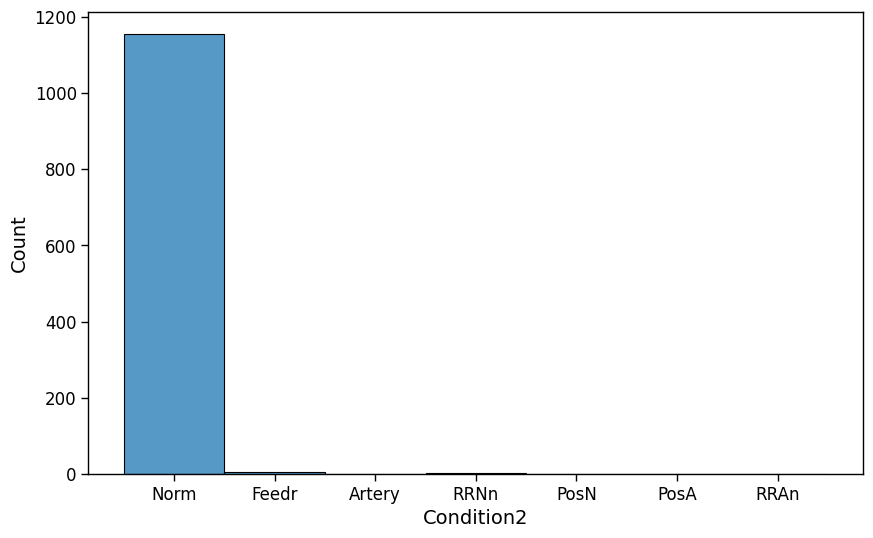

In [ ]:
# Checking again for features that provide little variation to the dataset
# before OHE

small_cat_features = []

for feature in string_cols:
    for value in X_train[feature].value_counts():
        if value/X_train.shape[0] > 0.97:
            small_cat_features.append(feature)
            print(f'{feature} : {np.round((value/X_train.shape[0])*100, 2)}%')

for feature in small_cat_features:
    plt.figure(figsize = (10,6))
    sns.histplot(X_train[feature])
    plt.show()

Condition2 : 98.63%


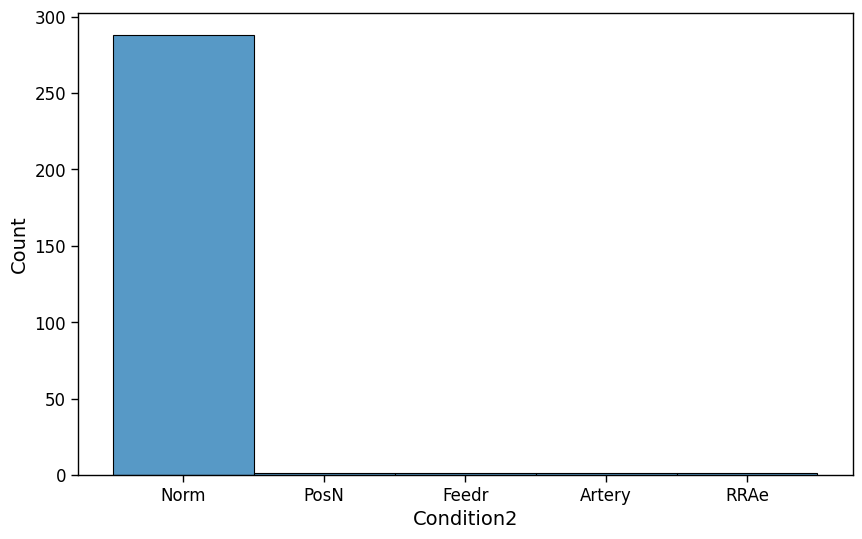

In [ ]:
small_cat_features = []

for feature in string_cols:
    for value in X_test[feature].value_counts():
        if value/X_test.shape[0] > 0.97:
            small_cat_features.append(feature)
            print(f'{feature} : {np.round((value/X_test.shape[0])*100, 2)}%')

for feature in small_cat_features:
    plt.figure(figsize = (10,6))
    sns.histplot(X_test[feature])
    plt.show()

Decided to drop Condition2 since it provides little variations and would create 5 features after OHE

In [ ]:
X_train.drop(columns = 'Condition2', inplace = True)
X_test.drop(columns = 'Condition2', inplace = True)

In [ ]:
string_cols = []
object_cols = X_train.select_dtypes('object').columns.tolist()

for i in object_cols:
    if pd.to_numeric(X_train[i], errors='coerce').isna().all():
        string_cols.append(i)

small_cat_features = []

for feature in string_cols:
    for value in X_train[feature].value_counts():
        if value/X_train.shape[0] > 0.97:
            small_cat_features.append(feature)
            print(f'{feature} : {np.round((value/X_train.shape[0])*100, 2)}%')

for feature in small_cat_features:
    plt.figure(figsize = (10,6))
    sns.histplot(X_train[feature])
    plt.show()

small_cat_features = []

for feature in string_cols:
    for value in X_test[feature].value_counts():
        if value/X_test.shape[0] > 0.97:
            small_cat_features.append(feature)
            print(f'{feature} : {np.round((value/X_test.shape[0])*100, 2)}%')

for feature in small_cat_features:
    plt.figure(figsize = (10,6))
    sns.histplot(X_test[feature])
    plt.show()

In [ ]:
string_cols

['MSZoning',
 'LotConfig',
 'Neighborhood',
 'Condition1',
 'HouseStyle',
 'RoofStyle',
 'Exterior1st',
 'Exterior2nd',
 'GarageType',
 'MiscFeature',
 'SaleType',
 'SaleCondition']

<Axes: >

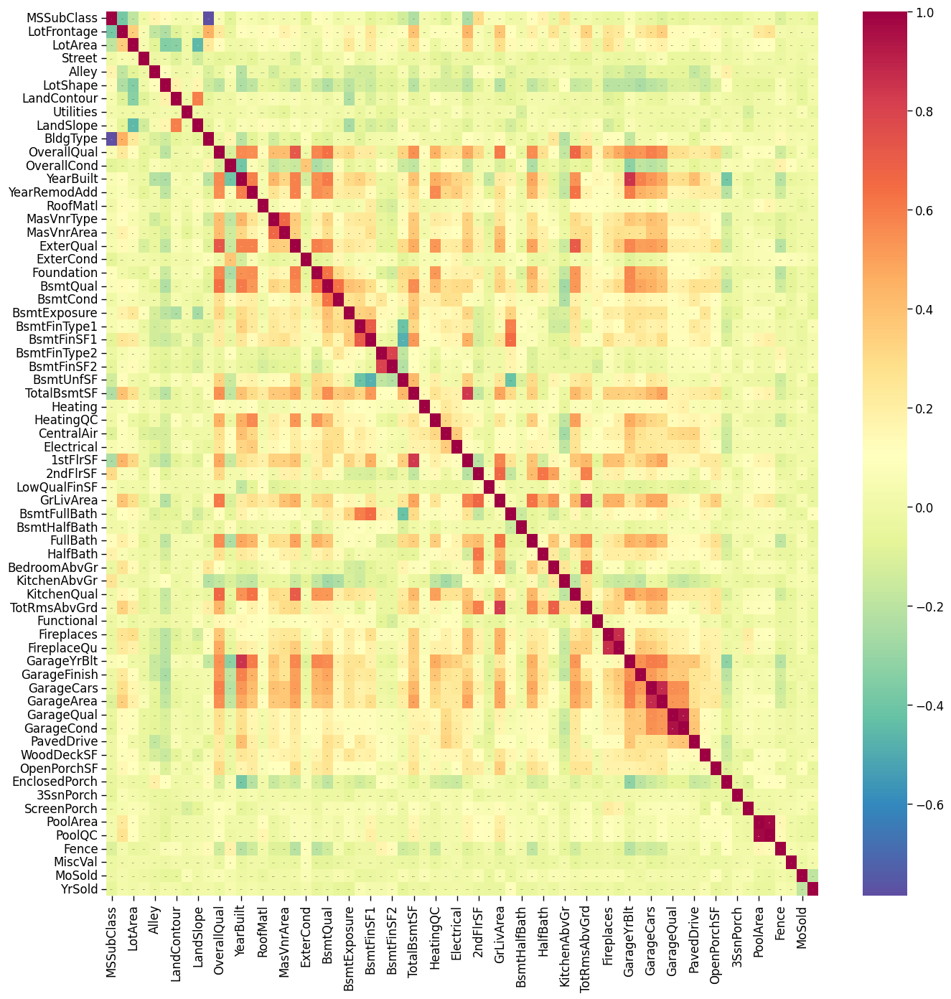

In [ ]:
corr_matrix = X_train.corr(numeric_only=True)
plt.figure(figsize = (16,16))
sns.heatmap(data=corr_matrix, annot=True, annot_kws={'size': 1}, cmap="Spectral_r")

The 8 collums with the highest correlation are: ['Fireplaces', 'FireplaceQu', 'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond', 'PoolArea', 'PoolQC']


<Axes: >

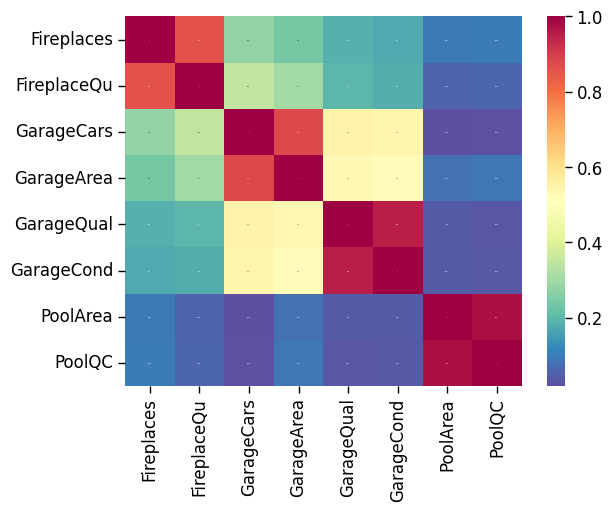

In [ ]:
high_corr = []

for i in corr_matrix.columns:
    if corr_matrix[i].nlargest(2).sum() > 1.85:
        high_corr.append(i)
    if corr_matrix[i].min() < -0.85:
        high_corr.append(i)

print(f'The {len(high_corr)} collums with the highest correlation are: {high_corr}')
sns.heatmap(data=X_train[high_corr].corr(), annot=True, annot_kws={'size': 1}, cmap="Spectral_r")

The 10 collums with the highest correlation are: ['LotArea', 'Street', 'Fireplaces', 'FireplaceQu', 'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond', 'PoolArea', 'PoolQC']


<Axes: >

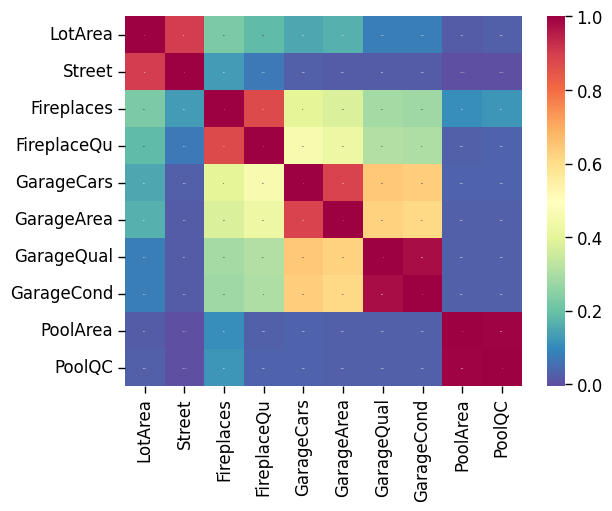

In [ ]:
high_corr = []
corr_matrix_test = X_test.corr(numeric_only=True)

for i in corr_matrix_test.columns:
    if corr_matrix_test[i].nlargest(2).sum() > 1.85:
        high_corr.append(i)
    if corr_matrix_test[i].min() < -0.85:
        high_corr.append(i)

print(f'The {len(high_corr)} collums with the highest correlation are: {high_corr}')
sns.heatmap(data=X_test[high_corr].corr(), annot=True, annot_kws={'size': 1}, cmap="Spectral_r")

OHE

In [ ]:
X_train_ohe = X_train[string_cols]
X_train_ohe = pd.get_dummies(X_train_ohe, dtype=int)

X_train = X_train.drop(string_cols, axis = 1)
X_train = X_train.join(X_train_ohe)

X_test_ohe = X_test[string_cols]
X_test_ohe = pd.get_dummies(X_test_ohe, dtype=int)

X_test = X_test.drop(string_cols, axis = 1)
X_test = X_test.join(X_test_ohe)

In [ ]:
string_cols = []
object_cols = X_train.select_dtypes('object').columns.tolist()

for i in object_cols:
    if pd.to_numeric(X_train[i], errors='coerce').isna().all():
        string_cols.append(i)

string_cols

[]

## Scaling Data

In [ ]:
for column in X_train.columns:
    for value in X_train[column].value_counts().values:
        if value is str:
            print(column, ":", value)

In [ ]:
# Checking for missing columns on the test
set(X_train.columns) - set(X_test.columns)

{'Condition1_PosA',
 'Condition1_RRNe',
 'Condition1_RRNn',
 'Exterior1st_BrkComm',
 'Exterior1st_CBlock',
 'Exterior1st_ImStucc',
 'Exterior1st_Stone',
 'Exterior2nd_CBlock',
 'Exterior2nd_Other',
 'GarageType_2Types',
 'MiscFeature_Othr',
 'Neighborhood_Blueste',
 'RoofStyle_Mansard',
 'SaleType_Con'}

In [ ]:
# Checking for missing columns on the train
set(X_test.columns) - set(X_train.columns)

{'Exterior1st_AsphShn', 'MiscFeature_TenC'}

In [ ]:
print(X_test.shape)
print(X_train.shape)

(292, 168)
(1166, 180)


Train and Test need to have the same columns on the same place before using scalers

In [ ]:
X_test_missing = list(set(X_train.columns) - set(X_test.columns))
X_train_missing = list(set(X_test.columns) - set(X_train.columns))

X_train_temp = X_train[X_test_missing]
X_train = X_train.drop(X_test_missing, axis = 1)
X_train = X_train.join(X_train_temp)
X_test_temp = X_test[X_train_missing]
X_test = X_test.drop(X_train_missing, axis = 1)

In [ ]:
for column in X_test_missing:
    X_test.insert(X_test.shape[1], column, np.zeros(X_test.shape[0]))

In [ ]:
for column in X_train_missing:
    X_train.insert(X_train.shape[1], column, np.zeros(X_train.shape[0]))

In [ ]:
X_test = X_test.join(X_test_temp)

Scaling the data

In [ ]:
scaler_MMS = MinMaxScaler()
X_train_MMS = pd.DataFrame(scaler_MMS.fit_transform(X_train), columns=X_train.columns)
X_test_MMS  = pd.DataFrame(scaler_MMS.transform(X_test), columns=X_test.columns)
scaler_SS = StandardScaler()
X_train_SS = pd.DataFrame(scaler_SS.fit_transform(X_train), columns=X_train.columns)
X_test_SS  = pd.DataFrame(scaler_SS.transform(X_test), columns=X_test.columns)

# Creating some copies to be used fresh on the DNN
X_train_tf = X_train.copy()
X_test_tf = X_test.copy()
X_train_MMS_tf = X_train_MMS.copy()
X_test_MMS_tf = X_test_MMS.copy()
X_train_SS_tf = X_train_SS.copy()
X_test_SS_tf = X_test_SS.copy()

# Regression Models

In [ ]:
# Creating some variables to keep important information
reg_results = pd.DataFrame([])
feature_importances_all = []

# Setting a global level of iterations for tuning
n_iters = 60

In [ ]:
# Defining a function to run models, save information and print statistics and plots

def model_run(start, alg, X_train, X_test, y_train, y_test, model, params, scaler):
    alg_model = alg
    alg_model.fit(X_train, y_train)
    y_pred = alg_model.predict(X_test)
    total = tm.time() - start
    model_results = pd.DataFrame(pd.json_normalize({'Model': model,
                                                            'Parameters': params,
                                                            'Scaler': scaler,
                                                            'Time': total,
                                                            'r2':   np.round(r2_score(y_test, y_pred),3),
                                                            'RMSE': int(np.sqrt(mean_squared_error(y_test, y_pred))),
                                                            'MAE':  int(mean_absolute_error(y_test, y_pred))}))
    print(f'r2 score : {round(r2_score(y_test, y_pred),3)}')
    print(f'RMSE : {int(np.sqrt(mean_squared_error(y_test, y_pred)))}')
    print(f'MAE : {int(mean_absolute_error(y_test, y_pred))}')

    plt.figure(figsize=(10,5))
    sns.regplot(x= y_pred, y = y_test,
                scatter_kws={'color':'red',
                            'edgecolor':'blue',
                            'linewidths':0.7},
                line_kws={'color':'black','alpha':0.5}
            )
    plt.xlabel('Predictions')
    plt.ylabel('Overall')
    plt.title(f"{model} Prediction")
    plt.show()

    return model_results

## Linear Regression

r2 score : 0.884
RMSE : 26225
MAE : 18938


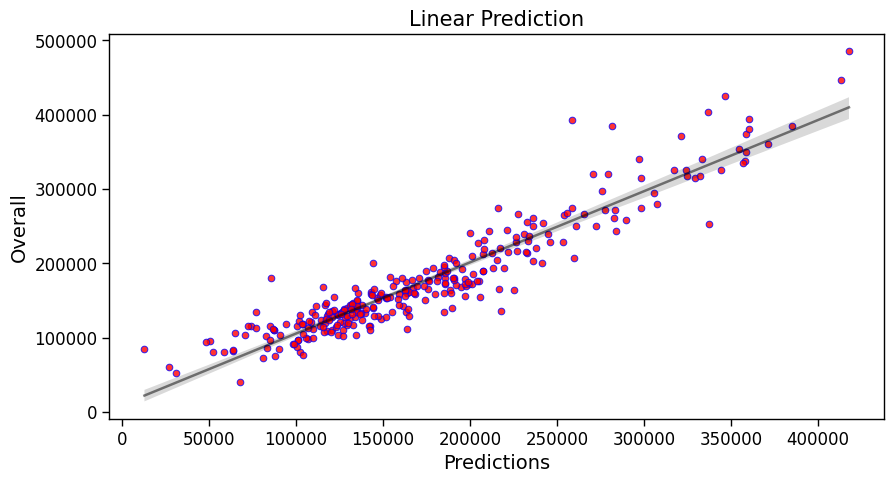

In [ ]:
start = tm.time()
results = model_run(start, LinearRegression(), X_train, X_test, y_train, y_test, 'Linear', 'Default', 'None')
reg_results = pd.concat([reg_results, results])

r2 score : -5.167100172957328e+19
RMSE : 553889658233911
MAE : 38989406874064


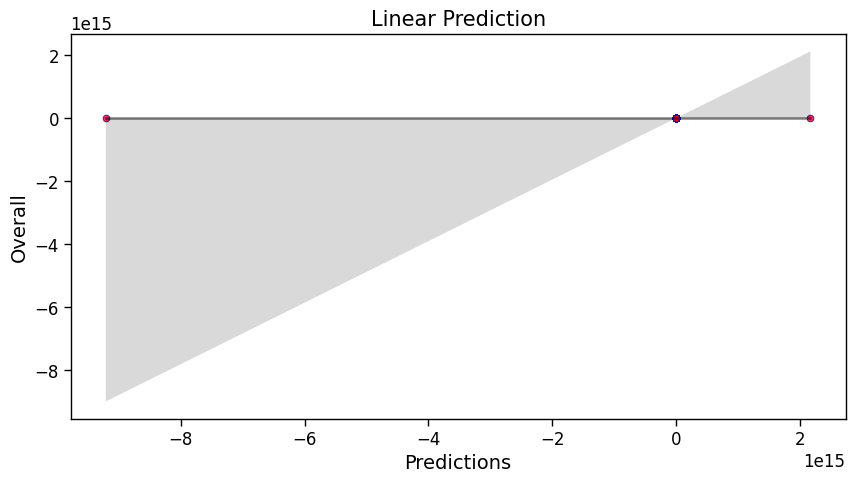

In [ ]:
start = tm.time()
results = model_run(start, LinearRegression(), X_train_MMS, X_test_MMS, y_train, y_test, 'Linear', 'Default', 'MinMax')
reg_results = pd.concat([reg_results, results])

r2 score : -6.816372012996061e+21
RMSE : 6361747944754036
MAE : 505351658468521


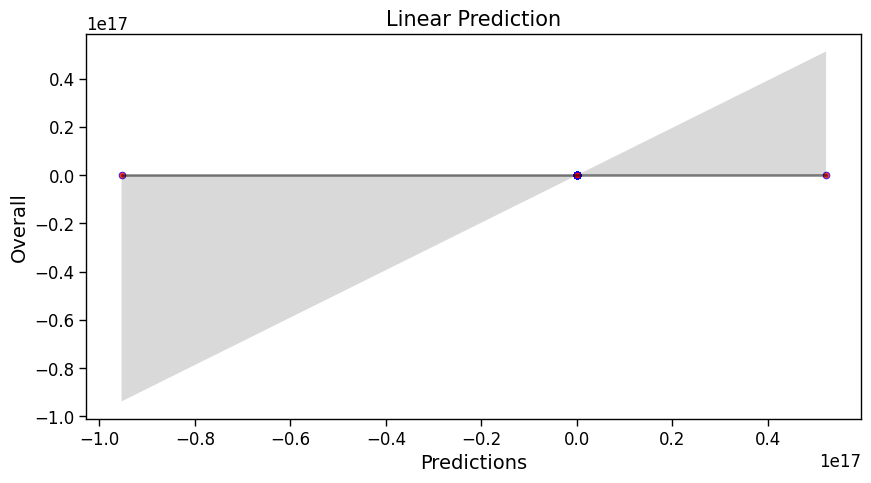

In [ ]:
start = tm.time()
results = model_run(start, LinearRegression(), X_train_SS, X_test_SS, y_train, y_test, 'Linear', 'Default', 'Standard')
reg_results = pd.concat([reg_results, results])

In [ ]:
reg_results

,Model,Parameters,Scaler,Time,r2,RMSE,MAE
0,Linear,Default,None,0.140,0.884,26225,18938
0,Linear,Default,MinMax,0.094,-51671001729573281792.000,553889658233911,38989406874064
0,Linear,Default,Standard,0.111,-6816372012996061298688.000,6361747944754036,505351658468521


## Ridge Regression

### Default Parameters

r2 score : 0.885
RMSE : 26159
MAE : 18898


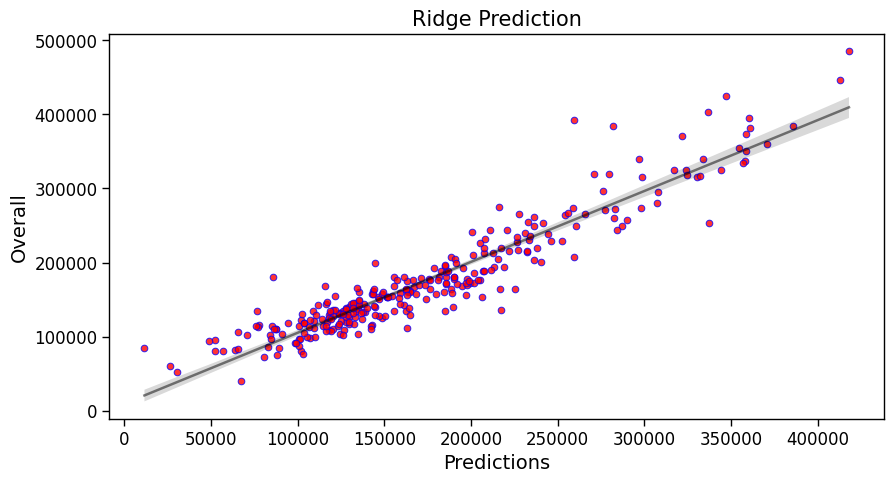

In [ ]:
start = tm.time()
results = model_run(start, Ridge(alpha=0.1), X_train, X_test, y_train, y_test, 'Ridge', 'Default', 'None')
reg_results = pd.concat([reg_results, results])

r2 score : 0.887
RMSE : 25882
MAE : 18705


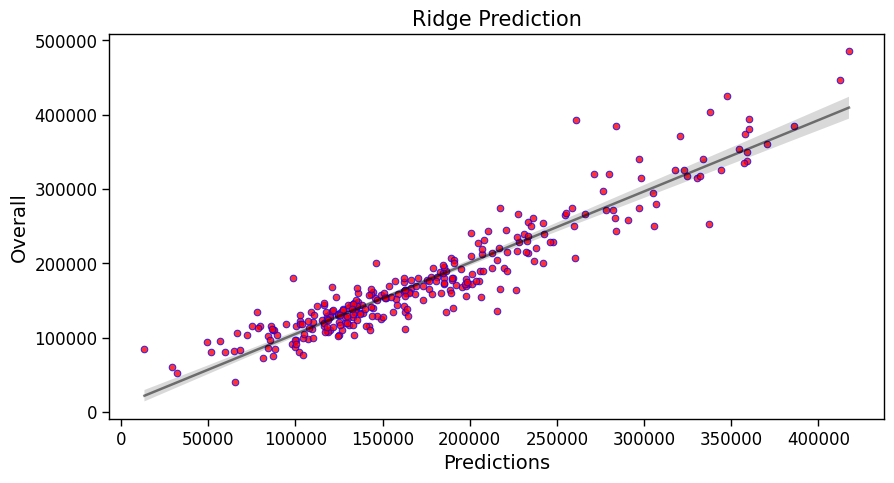

In [ ]:
start = tm.time()
results = model_run(start, Ridge(alpha=0.1), X_train_MMS, X_test_MMS, y_train, y_test, 'Ridge', 'Default', 'MinMax')
reg_results = pd.concat([reg_results, results])

r2 score : 0.883
RMSE : 26379
MAE : 19045


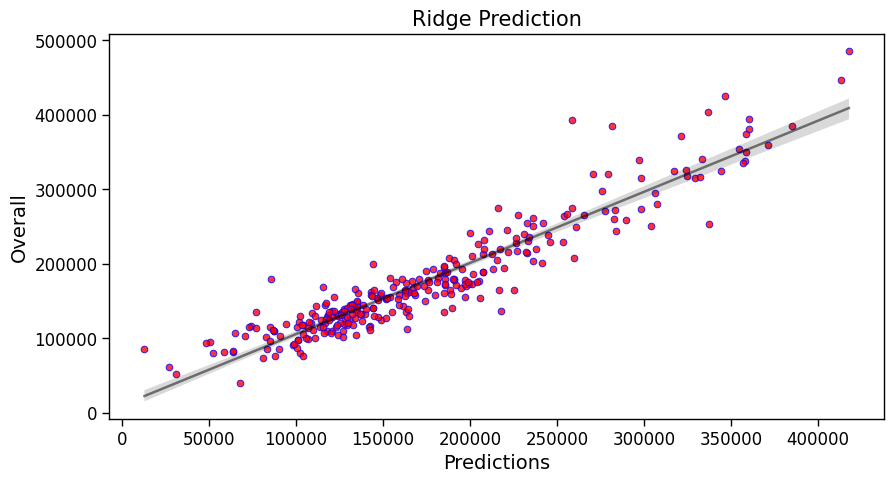

In [ ]:
start = tm.time()
results = model_run(start, Ridge(alpha=0.1), X_train_SS, X_test_SS, y_train, y_test, 'Ridge', 'Default', 'Standard')
reg_results = pd.concat([reg_results, results])

In [ ]:
reg_results

,Model,Parameters,Scaler,Time,r2,RMSE,MAE
0,Linear,Default,None,0.140,0.884,26225,18938
0,Linear,Default,MinMax,0.094,-51671001729573281792.000,553889658233911,38989406874064
0,Linear,Default,Standard,0.111,-6816372012996061298688.000,6361747944754036,505351658468521
0,Ridge,Default,None,0.028,0.885,26159,18898
0,Ridge,Default,MinMax,0.011,0.887,25882,18705
0,Ridge,Default,Standard,0.022,0.883,26379,19045


### Optimized Parameters

In [ ]:
ridge_alphas = []

<Axes: >

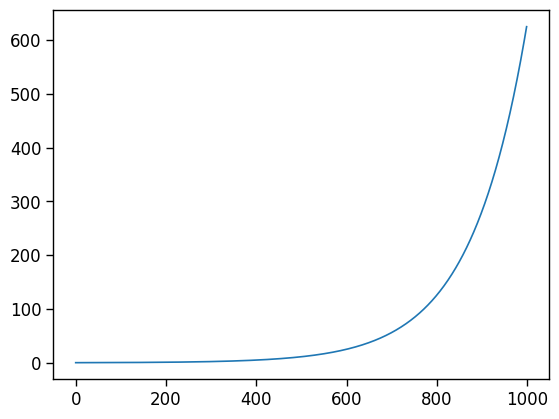

In [ ]:
# Checking for the best "a" searching zone
sns.lineplot(np.logspace(-1, 4, num = 1000, base = 5))

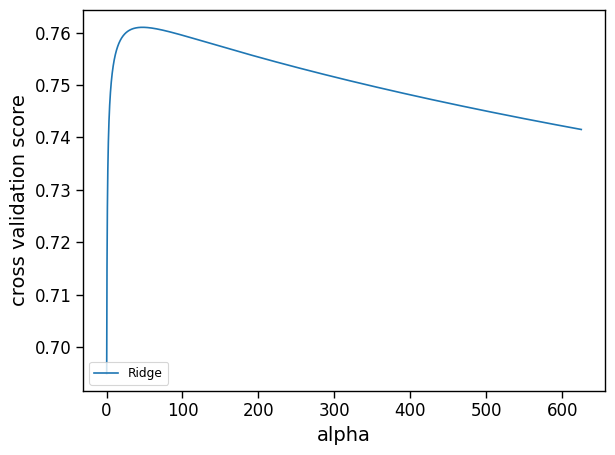

In [ ]:
# Checking for the best "a" searching zone
scores = [cross_val_score(Ridge(alpha), X_train, y_train, cv=10).mean() for alpha in np.logspace(-1, 4, num = 1000, base = 5)]
plt.plot(np.logspace(-1, 4, num = 1000, base = 5), scores, label='Ridge')
plt.legend(loc='lower left')
plt.xlabel('alpha')
plt.ylabel('cross validation score')
plt.tight_layout()
plt.show()

r2 score : 0.897
RMSE : 24711
MAE : 18324


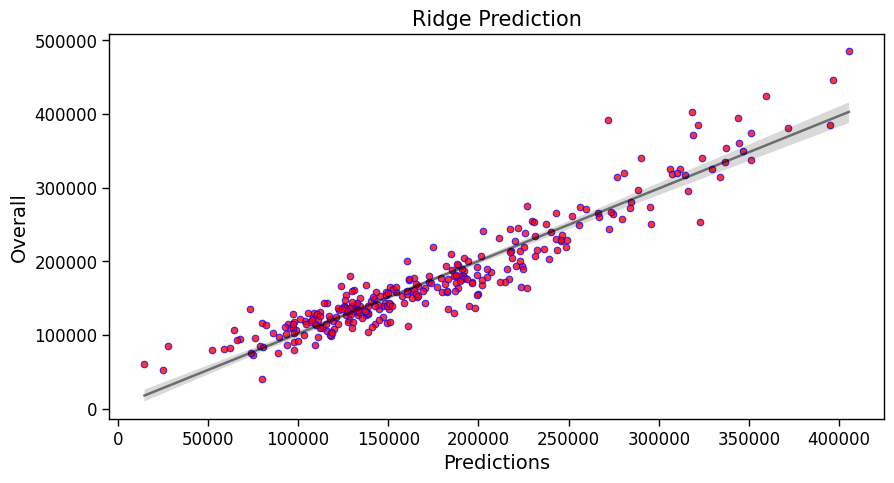

In [ ]:
start = tm.time()
ridgeCV_model = RidgeCV(alphas=np.logspace(-1, 4, num = 1000, base = 5), scoring='r2', cv=10)
ridgeCV_model.fit(X_train, y_train)

optimal_alpha = ridgeCV_model.alpha_
ridge_alphas.append(['No scaler', optimal_alpha])

results = model_run(start, Ridge(alpha=optimal_alpha), X_train, X_test, y_train, y_test, 'Ridge', 'Optimized', 'None')
reg_results = pd.concat([reg_results, results])

r2 score : 0.899
RMSE : 24511
MAE : 17354


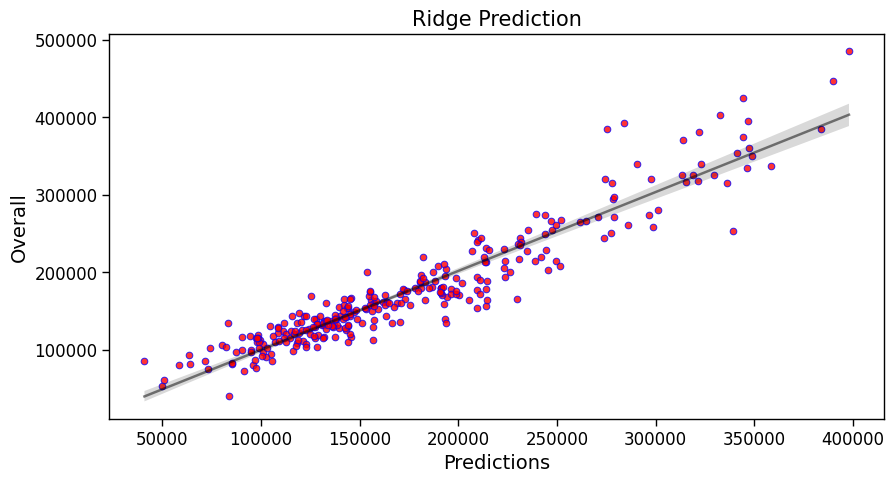

In [ ]:
start = tm.time()
ridgeCV_model = RidgeCV(alphas = np.logspace(-1, 4, num = 1000, base = 5), scoring='r2', cv=10)
ridgeCV_model.fit(X_train_MMS, y_train)

optimal_alpha = ridgeCV_model.alpha_
ridge_alphas.append(['MinMax', optimal_alpha])

results = model_run(start, Ridge(alpha=optimal_alpha), X_train_MMS, X_test_MMS, y_train, y_test, 'Ridge', 'Optimized', 'MinMax')
reg_results = pd.concat([reg_results, results])

r2 score : 0.897
RMSE : 24764
MAE : 17436


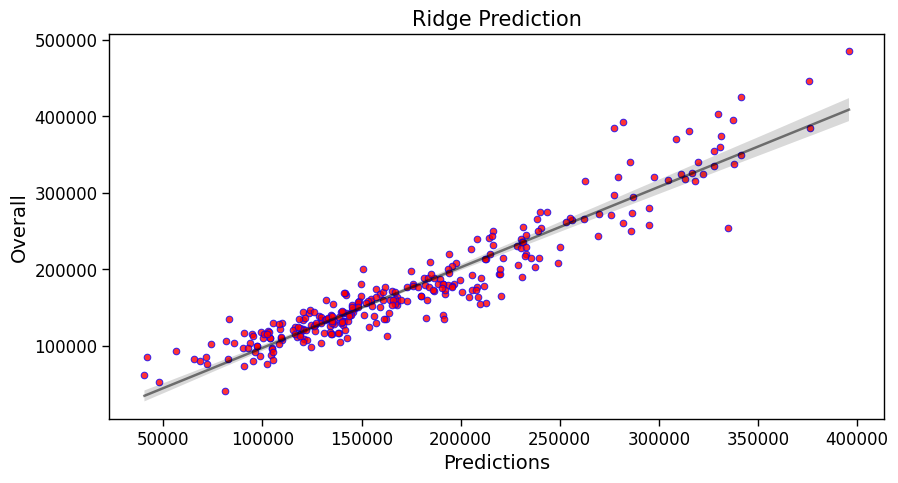

In [ ]:
start = tm.time()
ridgeCV_model = RidgeCV(alphas = np.logspace(-1, 4, num = 1000, base = 5), scoring='r2', cv=10)
ridgeCV_model.fit(X_train_SS, y_train)

optimal_alpha = ridgeCV_model.alpha_
ridge_alphas.append(['Standard', optimal_alpha])

results = model_run(start, Ridge(alpha=optimal_alpha), X_train_SS, X_test_SS, y_train, y_test, 'Ridge', 'Optimized', 'Standard')
reg_results = pd.concat([reg_results, results])

In [ ]:
ridge_alphas

[['No scaler', 47.46883125268788],
 ['MinMax', 11.316249887449752],
 ['Standard', 625.0]]

In [ ]:
reg_results

,Model,Parameters,Scaler,Time,r2,RMSE,MAE
0,Linear,Default,None,0.140,0.884,26225,18938
0,Linear,Default,MinMax,0.094,-51671001729573281792.000,553889658233911,38989406874064
0,Linear,Default,Standard,0.111,-6816372012996061298688.000,6361747944754036,505351658468521
0,Ridge,Default,None,0.028,0.885,26159,18898
0,Ridge,Default,MinMax,0.011,0.887,25882,18705
0,Ridge,Default,Standard,0.022,0.883,26379,19045
0,Ridge,Optimized,None,117.712,0.897,24711,18324
0,Ridge,Optimized,MinMax,115.945,0.899,24511,17354
0,Ridge,Optimized,Standard,115.310,0.897,24764,17436


## Lasso Regression

### Default Parameters

r2 score : 0.883
RMSE : 26357
MAE : 19030


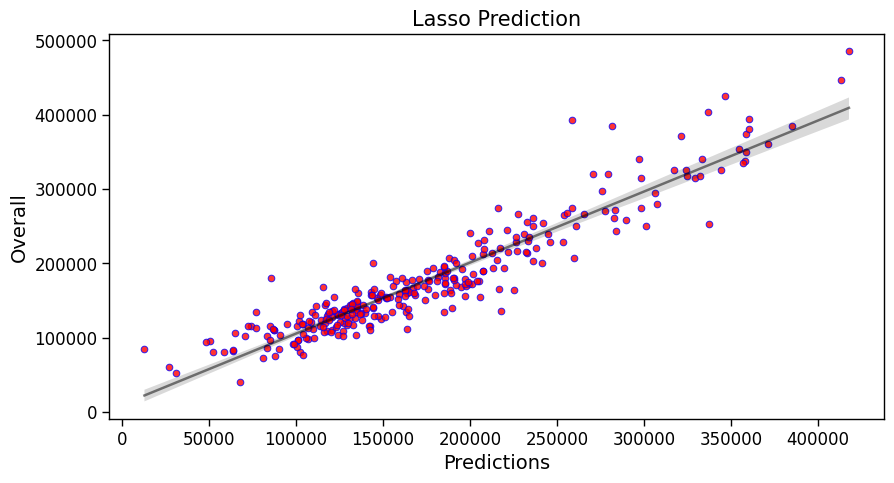

In [ ]:
start = tm.time()
results = model_run(start, Lasso(alpha=0.1), X_train, X_test, y_train, y_test, 'Lasso', 'Default', 'None')
reg_results = pd.concat([reg_results, results])

r2 score : 0.883
RMSE : 26349
MAE : 19020


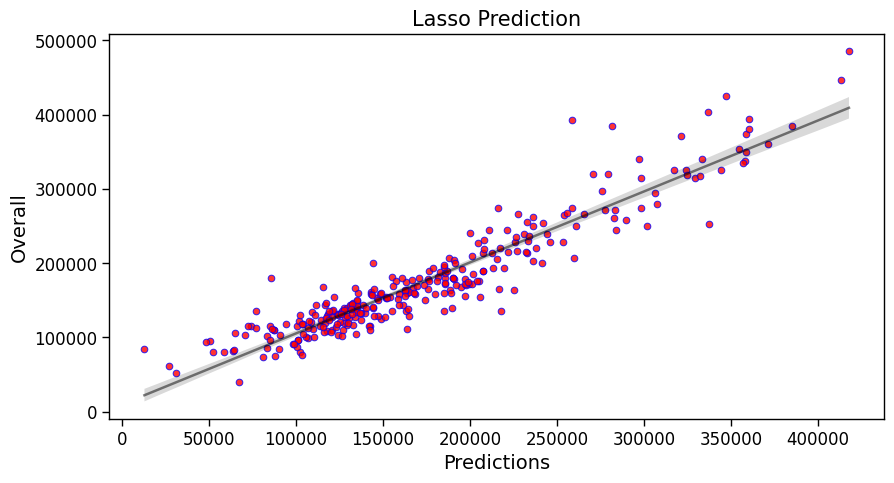

In [ ]:
start = tm.time()
results = model_run(start, Lasso(alpha=0.1), X_train_MMS, X_test_MMS, y_train, y_test, 'Lasso', 'Default', 'MinMax')
reg_results = pd.concat([reg_results, results])

r2 score : 0.883
RMSE : 26363
MAE : 19036


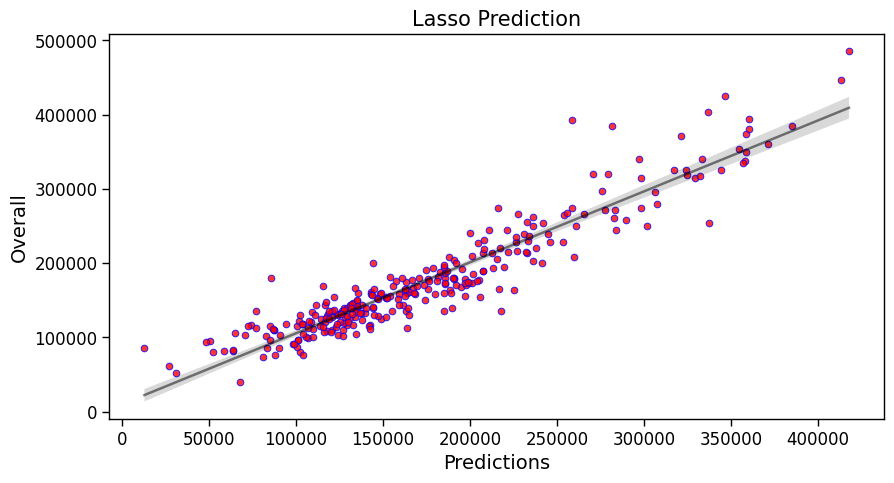

In [ ]:
start = tm.time()
results = model_run(start, Lasso(alpha=0.1), X_train_SS, X_test_SS, y_train, y_test, 'Lasso', 'Default', 'Standard')
reg_results = pd.concat([reg_results, results])

In [ ]:
reg_results

,Model,Parameters,Scaler,Time,r2,RMSE,MAE
0,Linear,Default,None,0.140,0.884,26225,18938
0,Linear,Default,MinMax,0.094,-51671001729573281792.000,553889658233911,38989406874064
0,Linear,Default,Standard,0.111,-6816372012996061298688.000,6361747944754036,505351658468521
0,Ridge,Default,None,0.028,0.885,26159,18898
0,Ridge,Default,MinMax,0.011,0.887,25882,18705
0,Ridge,Default,Standard,0.022,0.883,26379,19045
0,Ridge,Optimized,None,117.712,0.897,24711,18324
0,Ridge,Optimized,MinMax,115.945,0.899,24511,17354
0,Ridge,Optimized,Standard,115.310,0.897,24764,17436
0,Lasso,Default,None,0.305,0.883,26357,19030


### Optimized Parameters

In [ ]:
lasso_alphas = []

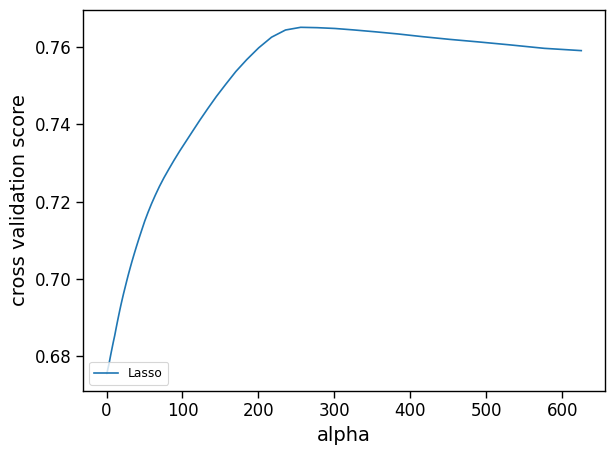

In [ ]:
scores = [cross_val_score(Lasso(alpha), X_train, y_train, cv=10).mean() for alpha in np.logspace(-1, 4, num = 100, base = 5)]
plt.plot(np.logspace(-1, 4, num = 100, base = 5), scores, label='Lasso')
plt.legend(loc='lower left')
plt.xlabel('alpha')
plt.ylabel('cross validation score')
plt.tight_layout()
plt.show()

r2 score : 0.894
RMSE : 25120
MAE : 18186


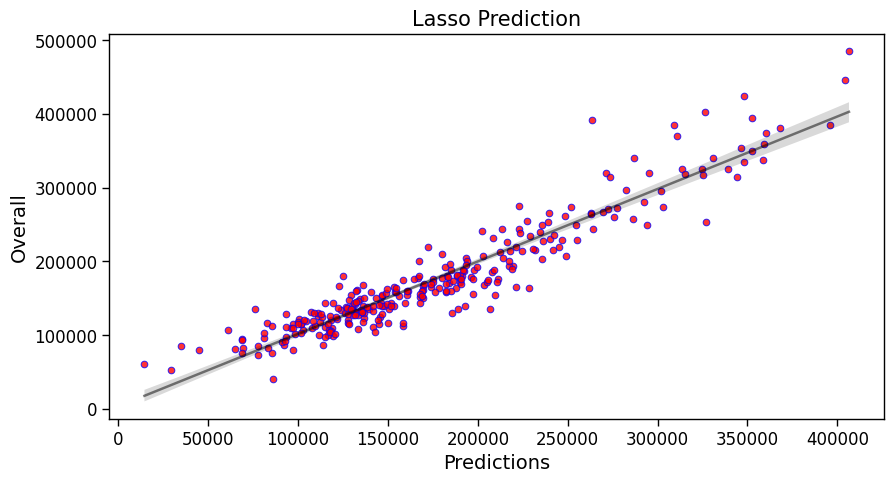

In [ ]:
start = tm.time()
lassoCV_model = LassoCV(alphas = np.logspace(-1, 4, num = 1000, base = 5), cv=10, random_state=0)
lassoCV_model.fit(X_train, y_train)

optimal_alpha = lassoCV_model.alpha_
lasso_alphas.append(['No scaler', optimal_alpha])

results = model_run(start, Lasso(alpha=optimal_alpha), X_train, X_test, y_train, y_test, 'Lasso', 'Optimized', 'None')
reg_results = pd.concat([reg_results, results])

r2 score : 0.895
RMSE : 24955
MAE : 17788


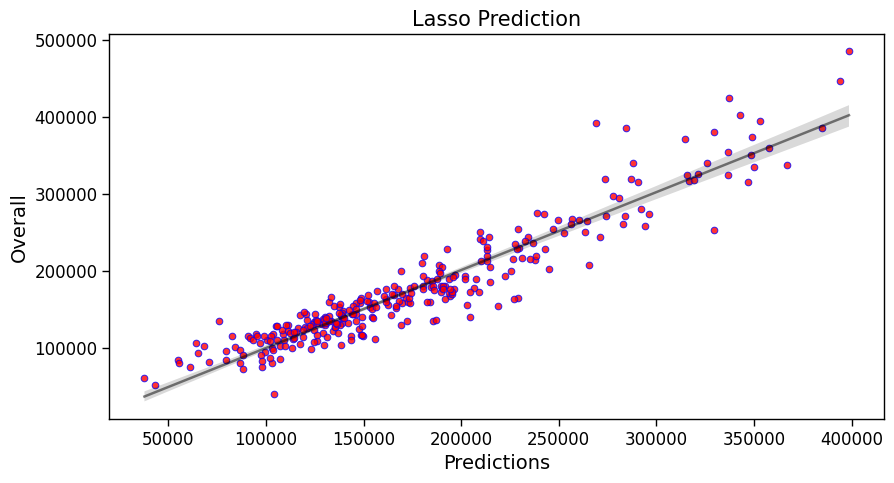

In [ ]:
start = tm.time()
lassoCV_model = LassoCV(alphas = np.logspace(-1, 4, num = 1000, base = 5), cv=10, random_state=0)
lassoCV_model.fit(X_train_MMS, y_train)

optimal_alpha = lassoCV_model.alpha_
lasso_alphas.append(['MinMax', optimal_alpha])

results = model_run(start, Lasso(alpha=optimal_alpha), X_train_MMS, X_test_MMS, y_train, y_test, 'Lasso', 'Optimized', 'MinMax')
reg_results = pd.concat([reg_results, results])

r2 score : 0.898
RMSE : 24597
MAE : 17540


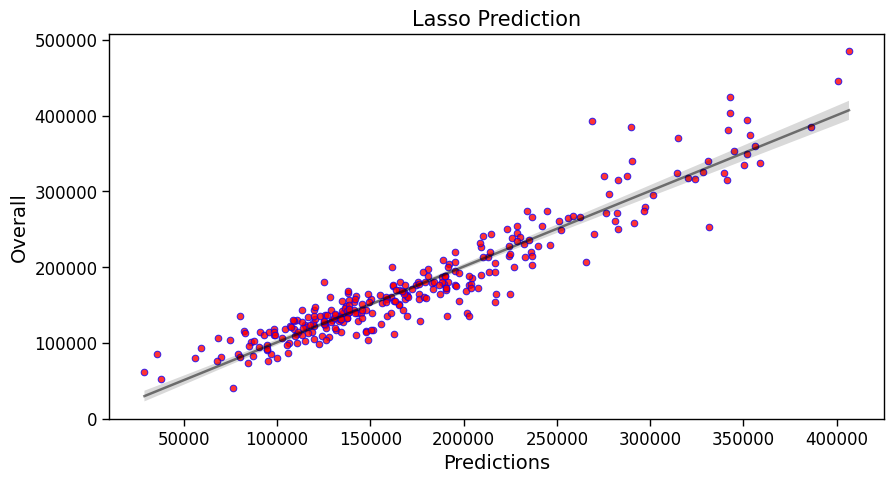

In [ ]:
start = tm.time()
lassoCV_model = LassoCV(alphas = np.logspace(-1, 4, num = 1000, base = 5), cv=10, random_state=0)
lassoCV_model.fit(X_train_SS, y_train)

optimal_alpha = lassoCV_model.alpha_
lasso_alphas.append(['Standard', optimal_alpha])

results = model_run(start, Lasso(alpha=optimal_alpha), X_train_SS, X_test_SS, y_train, y_test, 'Lasso', 'Optimized', 'Standard')
reg_results = pd.concat([reg_results, results])

In [ ]:
lasso_alphas

[['No scaler', 243.5416578411585],
 ['MinMax', 235.81958164239074],
 ['Standard', 625.0]]

In [ ]:
reg_results

,Model,Parameters,Scaler,Time,r2,RMSE,MAE
0,Linear,Default,None,0.140,0.884,26225,18938
0,Linear,Default,MinMax,0.094,-51671001729573281792.000,553889658233911,38989406874064
0,Linear,Default,Standard,0.111,-6816372012996061298688.000,6361747944754036,505351658468521
0,Ridge,Default,None,0.028,0.885,26159,18898
0,Ridge,Default,MinMax,0.011,0.887,25882,18705
0,Ridge,Default,Standard,0.022,0.883,26379,19045
0,Ridge,Optimized,None,117.712,0.897,24711,18324
0,Ridge,Optimized,MinMax,115.945,0.899,24511,17354
0,Ridge,Optimized,Standard,115.310,0.897,24764,17436
0,Lasso,Default,None,0.305,0.883,26357,19030


## Polynomial Regression

### Default Parameters

In [ ]:
polynomial_features = PolynomialFeatures()

# Creating copies of all dfs
X_train_copy_p = X_train.copy()
X_test_copy_p = X_test.copy()
X_train_MMS_copy_p = X_train_MMS.copy()
X_test_MMS_copy_p = X_test_MMS.copy()
X_train_SS_copy_p = X_train_SS.copy()
X_test_SS_copy_p = X_test_SS.copy()

X_train_poly = polynomial_features.fit_transform(X_train_copy_p)
X_test_poly  = polynomial_features.transform(X_test_copy_p)
X_train_poly_MMS = polynomial_features.fit_transform(X_train_MMS_copy_p)
X_test_poly_MMS  = polynomial_features.transform(X_test_MMS_copy_p)
X_train_poly_SS = polynomial_features.fit_transform(X_train_SS_copy_p)
X_test_poly_SS  = polynomial_features.transform(X_test_SS_copy_p)

r2 score : -31.853
RMSE : 441658
MAE : 126079


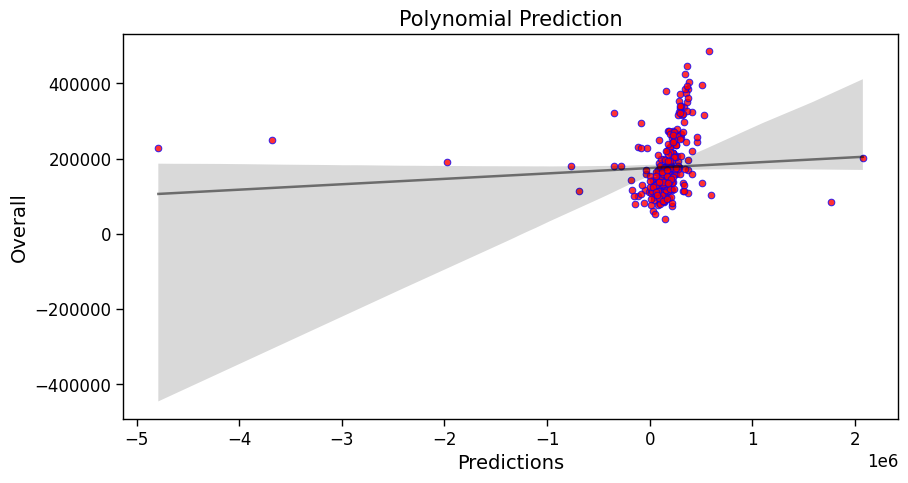

In [ ]:
start = tm.time()
results = model_run(start, LinearRegression(), X_train_poly, X_test_poly, y_train, y_test, 'Polynomial', 'Default', 'None')
reg_results = pd.concat([reg_results, results])

r2 score : 0.782
RMSE : 35986
MAE : 26234


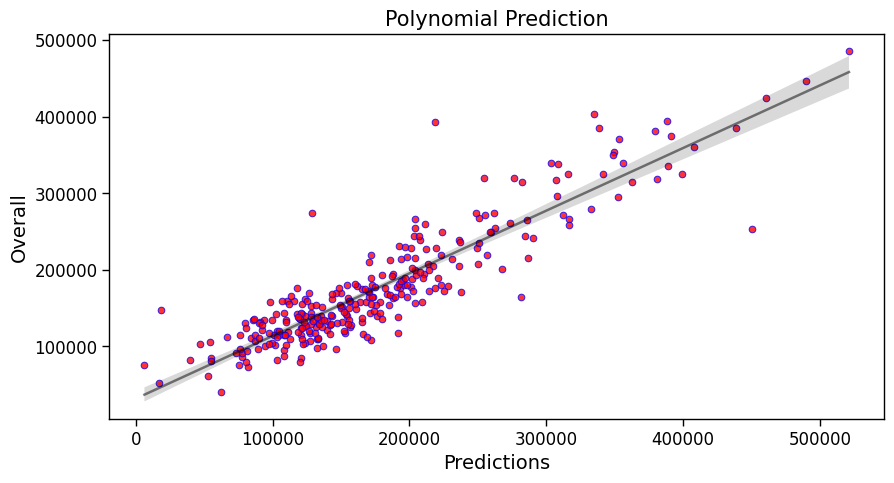

In [ ]:
start = tm.time()
results = model_run(start, LinearRegression(), X_train_poly_MMS, X_test_poly_MMS, y_train, y_test, 'Polynomial', 'Default', 'MinMax')
reg_results = pd.concat([reg_results, results])

r2 score : 0.746
RMSE : 38851
MAE : 25539


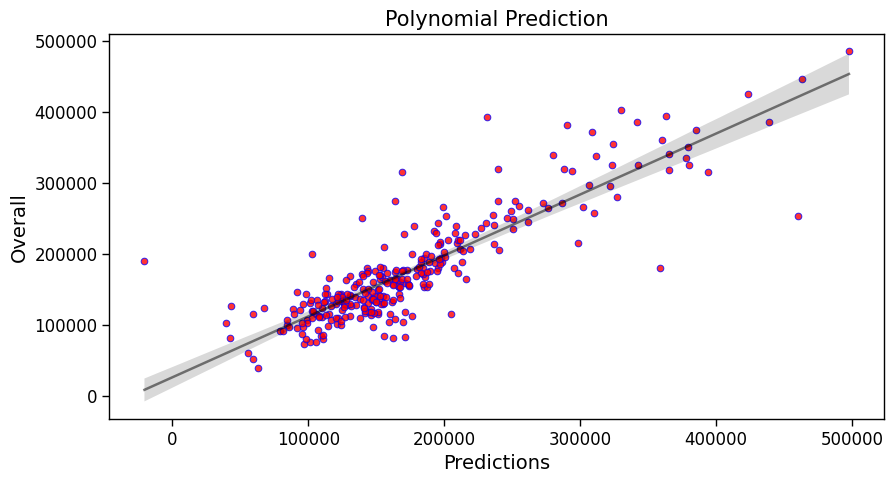

In [ ]:
start = tm.time()
results = model_run(start, LinearRegression(), X_train_poly_SS, X_test_poly_SS, y_train, y_test, 'Polynomial', 'Default', 'Standard')
reg_results = pd.concat([reg_results, results])

In [ ]:
reg_results

,Model,Parameters,Scaler,Time,r2,RMSE,MAE
0,Linear,Default,None,0.140,0.884,26225,18938
0,Linear,Default,MinMax,0.094,-51671001729573281792.000,553889658233911,38989406874064
0,Linear,Default,Standard,0.111,-6816372012996061298688.000,6361747944754036,505351658468521
0,Ridge,Default,None,0.028,0.885,26159,18898
0,Ridge,Default,MinMax,0.011,0.887,25882,18705
0,Ridge,Default,Standard,0.022,0.883,26379,19045
0,Ridge,Optimized,None,117.712,0.897,24711,18324
0,Ridge,Optimized,MinMax,115.945,0.899,24511,17354
0,Ridge,Optimized,Standard,115.310,0.897,24764,17436
0,Lasso,Default,None,0.305,0.883,26357,19030


### Optimized Parameters

In [ ]:
def opti_poly(n_degrees, X_train, X_test, y_train, y_test):
    tune_results = pd.DataFrame([])
    X_train_copy_p = X_train.copy()
    X_test_copy_p = X_test.copy()

    for param in np.arange(1,n_degrees+1,1):
        try:
            polynomial_features= PolynomialFeatures(degree = param)
            X_train_poly = polynomial_features.fit_transform(X_train_copy_p)
            X_test_poly  = polynomial_features.transform(X_test_copy_p)

            alg_model = LinearRegression()
            alg_model.fit(X_train_poly, y_train)
            y_pred = alg_model.predict(X_test_poly)
            total = tm.time() - start
            tune_result = pd.DataFrame(pd.json_normalize({'Parameter': param,
                                                        'r2':   np.round(r2_score(y_test, y_pred),3),
                                                        'RMSE': int(np.sqrt(mean_squared_error(y_test, y_pred))),
                                                        'MAE':  int(mean_absolute_error(y_test, y_pred))}))
            tune_results = pd.concat([tune_results, tune_result])
        except Exception as errorr:
            print(f'For degree = {param} : {errorr}')

    t_degree = tune_results.sort_values(by = ['r2'], ascending = False)['Parameter'].iloc[0]

    return t_degree, tune_results

def poly_fit(t_degree, X_train, X_test):
    X_train_copy_p = X_train.copy()
    X_test_copy_p = X_test.copy()
    polynomial_features= PolynomialFeatures(degree = t_degree)
    X_train_poly = polynomial_features.fit_transform(X_train_copy_p)
    X_test_poly  = polynomial_features.transform(X_test_copy_p)
    return X_train_poly, X_test_poly

For degree = 3 : Unable to allocate 9.02 GiB for an array with shape (1166, 1038220) and data type float64
For degree = 4 : Unable to allocate 419. GiB for an array with shape (1166, 48277230) and data type float64
r2 score : 0.884
RMSE : 26225
MAE : 18938


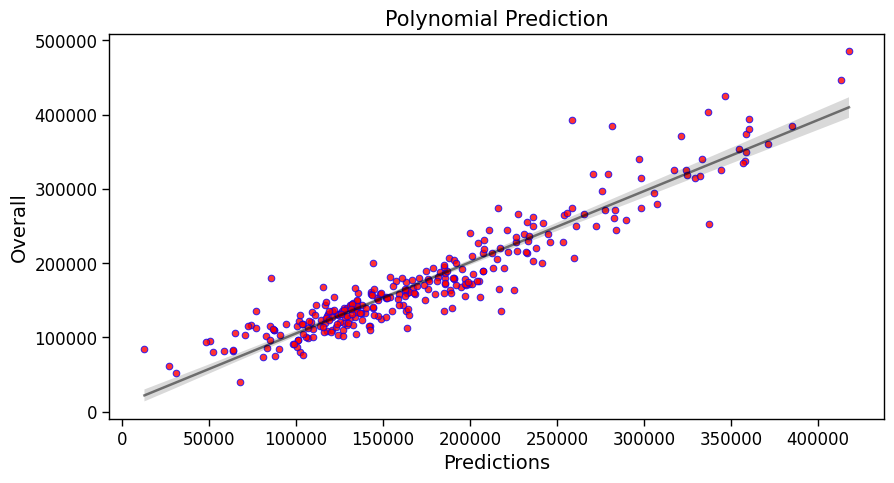

   Parameter      r2    RMSE     MAE
0          1   0.884   26225   18938
0          2 -31.853  441658  126079


In [ ]:
start = tm.time()
t_degree, tune_results = opti_poly(4, X_train, X_test, y_train, y_test)
X_train_poly, X_test_poly = poly_fit(t_degree, X_train, X_test)
results = model_run(start, LinearRegression(), X_train_poly, X_test_poly, y_train, y_test, 'Polynomial', 'Optimized', 'None')
reg_results = pd.concat([reg_results, results])
print(tune_results)

For degree = 3 : Unable to allocate 9.02 GiB for an array with shape (1166, 1038220) and data type float64
For degree = 4 : Unable to allocate 419. GiB for an array with shape (1166, 48277230) and data type float64
For degree = 5 : Unable to allocate 15.3 TiB for an array with shape (1166, 1805568402) and data type float64
r2 score : 0.782
RMSE : 35986
MAE : 26234


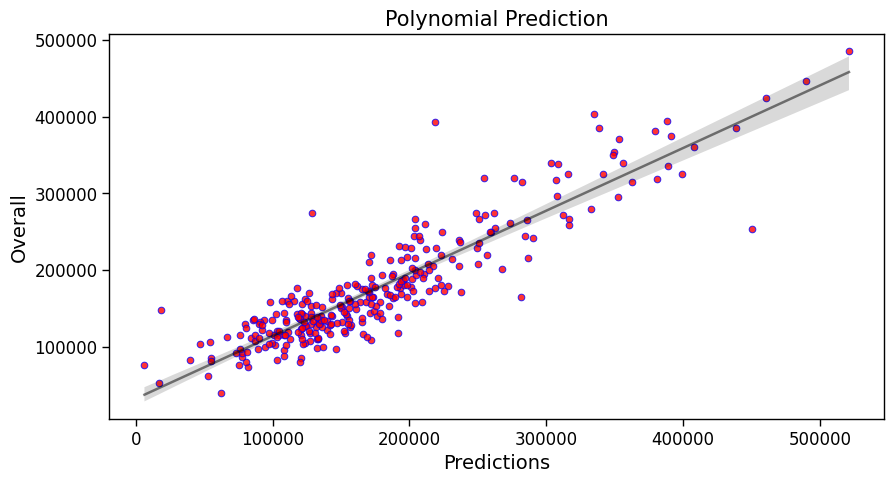

   Parameter                         r2             RMSE             MAE
0          1 -155082568130194636800.000  959580265879281  57384052166965
0          2                      0.782            35986           26234


In [ ]:
start = tm.time()
t_degree, tune_results = opti_poly(5, X_train_MMS, X_test_MMS, y_train, y_test)
X_train_poly, X_test_poly = poly_fit(t_degree, X_train_MMS, X_test_MMS)
results = model_run(start, LinearRegression(), X_train_poly, X_test_poly, y_train, y_test, 'Polynomial', 'Optimized', 'MinMax')
reg_results = pd.concat([reg_results, results])
print(tune_results)

For degree = 3 : Unable to allocate 9.02 GiB for an array with shape (1166, 1038220) and data type float64
For degree = 4 : Unable to allocate 419. GiB for an array with shape (1166, 48277230) and data type float64
r2 score : 0.782
RMSE : 35986
MAE : 26234


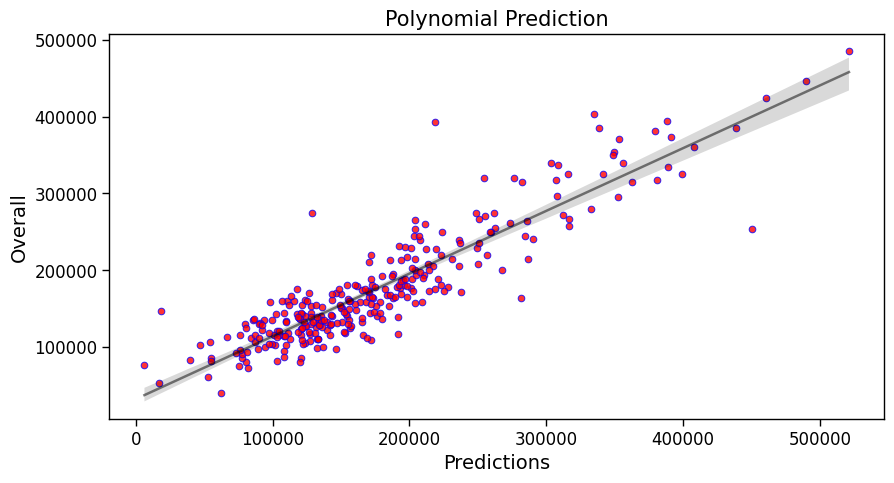

   Parameter                         r2              RMSE             MAE
0          1 -326801811032815435776.000  1392970897779881  87542926857722
0          2                      0.746             38851           25539


In [ ]:
start = tm.time()
t_degree, tune_results = opti_poly(4, X_train_SS, X_test_SS, y_train, y_test)
X_train_poly, X_test_poly = poly_fit(t_degree, X_train_MMS, X_test_MMS)
results = model_run(start, LinearRegression(), X_train_poly, X_test_poly, y_train, y_test, 'Polynomial', 'Optimized', 'Standard')
reg_results = pd.concat([reg_results, results])
print(tune_results)

## Random Forest

### Default Parameters

r2 score : 0.906
RMSE : 23657
MAE : 16641


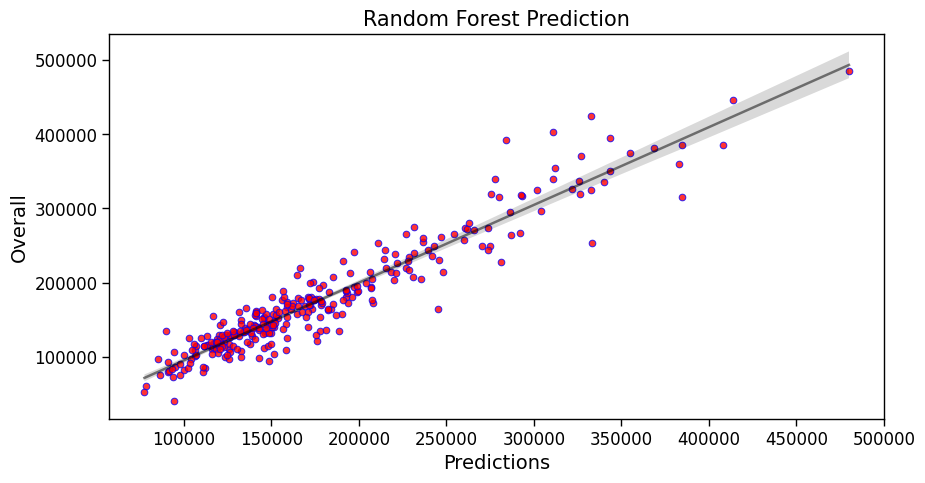

In [ ]:
start = tm.time()
results = model_run(start, RandomForestRegressor(random_state=0), X_train, X_test, y_train, y_test, 'Random Forest', 'Default', 'None')
reg_results = pd.concat([reg_results, results])

r2 score : 0.906
RMSE : 23656
MAE : 16662


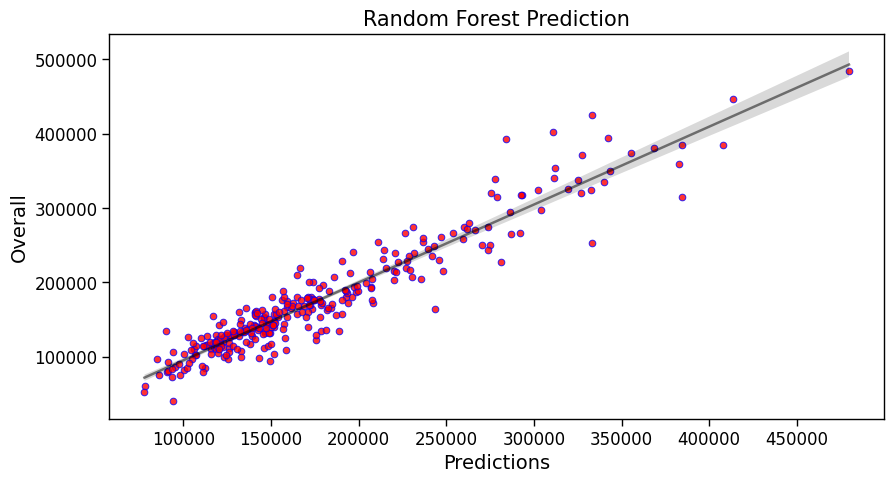

In [ ]:
start = tm.time()
results = model_run(start, RandomForestRegressor(random_state=0), X_train_MMS, X_test_MMS, y_train, y_test, 'Random Forest', 'Default', 'MinMax')
reg_results = pd.concat([reg_results, results])

r2 score : 0.906
RMSE : 23632
MAE : 16619


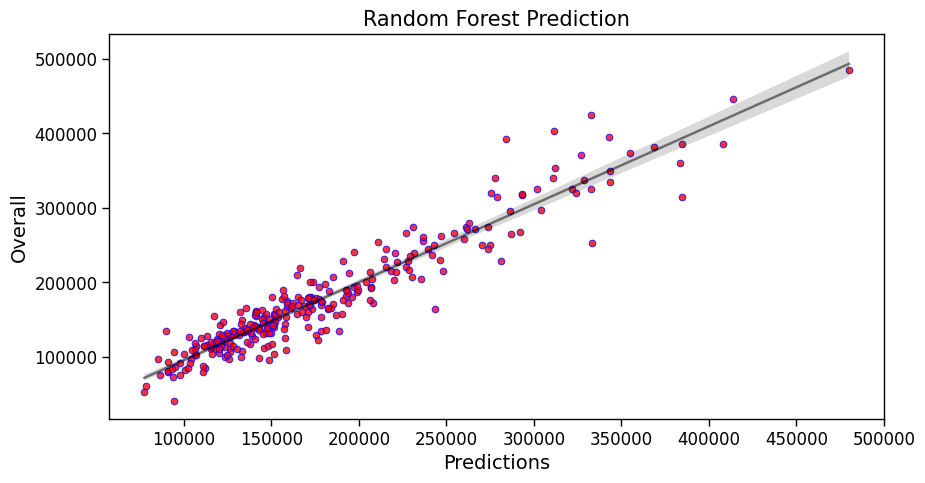

In [ ]:
start = tm.time()
results = model_run(start, RandomForestRegressor(random_state=0), X_train_SS, X_test_SS, y_train, y_test, 'Random Forest', 'Default', 'Standard')
reg_results = pd.concat([reg_results, results])

In [ ]:
reg_results

,Model,Parameters,Scaler,Time,r2,RMSE,MAE
0,Linear,Default,None,0.140,0.884,26225,18938
0,Linear,Default,MinMax,0.094,-51671001729573281792.000,553889658233911,38989406874064
0,Linear,Default,Standard,0.111,-6816372012996061298688.000,6361747944754036,505351658468521
0,Ridge,Default,None,0.028,0.885,26159,18898
0,Ridge,Default,MinMax,0.011,0.887,25882,18705
0,Ridge,Default,Standard,0.022,0.883,26379,19045
0,Ridge,Optimized,None,117.712,0.897,24711,18324
0,Ridge,Optimized,MinMax,115.945,0.899,24511,17354
0,Ridge,Optimized,Standard,115.310,0.897,24764,17436
0,Lasso,Default,None,0.305,0.883,26357,19030


### Optimized Parameters

In [ ]:
rf_best_params = []

random_grid = {'n_estimators': [int(x) for x in np.linspace(10,200,10)],
            'max_depth': [int(x) for x in np.linspace(10,100,10)],
            'min_samples_split': [2,3,4,5,10],
            'min_samples_leaf':  [1,2,4,10,15,20]}


def rf_optimize(random_grid, n_iters, X_train, y_train, scaler):
    rf_random = RandomizedSearchCV(estimator = RandomForestRegressor(),
                                param_distributions = random_grid,
                                n_iter=n_iters,
                                cv = 5,
                                n_jobs=-1)

    rf_random.fit(X_train,y_train)
    rf_best_params.append([scaler, rf_random.best_params_])
    return rf_random

# Save and plot all the important features
def save_feature_importance(model_opt, feature_importances_all):
    feature_importances = model_opt.feature_importances_
    feature_importances_all.append(feature_importances)
    feature_names = X_train.columns
    sorted_idx = np.argsort(feature_importances)[::-1]
    top_feature_indices = sorted_idx[:10]
    top_feature_names = feature_names[top_feature_indices]
    top_feature_importances = feature_importances[top_feature_indices]
    plt.figure(figsize=(10, 6))
    plt.bar(range(len(top_feature_importances)), top_feature_importances)
    plt.xticks(range(len(top_feature_importances)), top_feature_names, rotation=45)
    plt.xlabel('Feature')
    plt.ylabel('Importance')
    plt.title('Top 10 Feature Importance - Best Model (Randomized Search)')
    plt.show()

r2 score : 0.906
RMSE : 23659
MAE : 16514


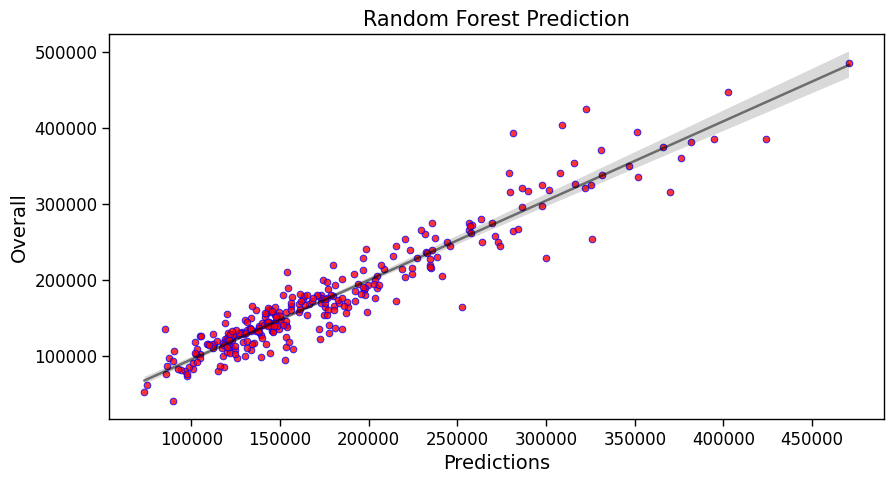

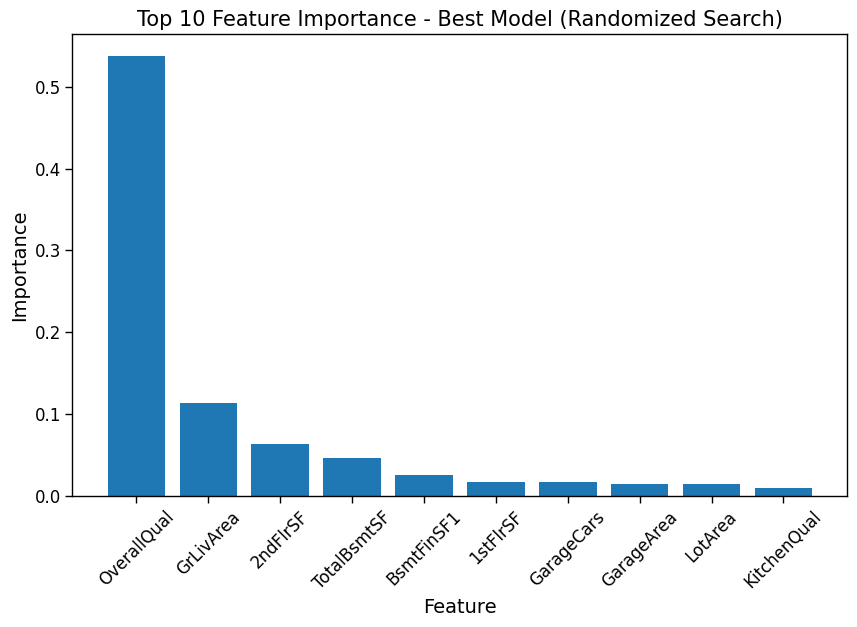

In [ ]:
start = tm.time()
rf_random = rf_optimize(random_grid, n_iters, X_train, y_train, 'None')

results = model_run(start, rf_random.best_estimator_, X_train, X_test, y_train, y_test, 'Random Forest', 'Optimized', 'None')
reg_results = pd.concat([reg_results, results])

save_feature_importance(rf_random.best_estimator_, feature_importances_all)

r2 score : 0.913
RMSE : 22730
MAE : 16013


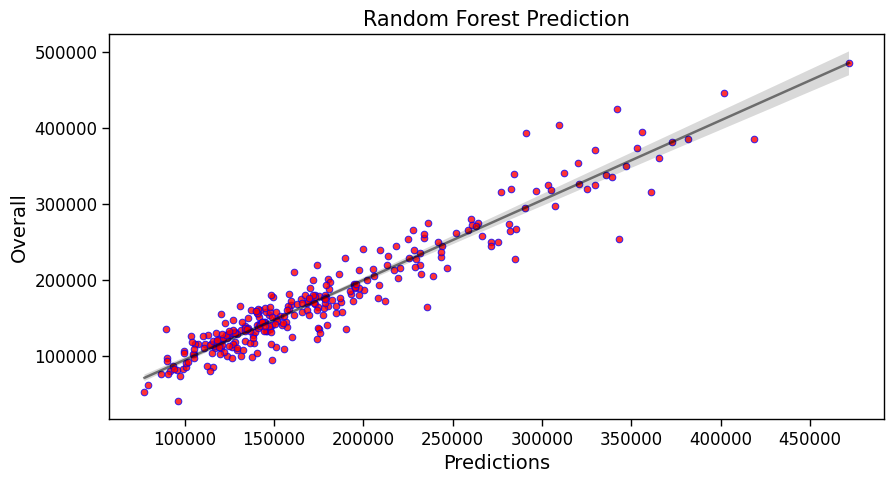

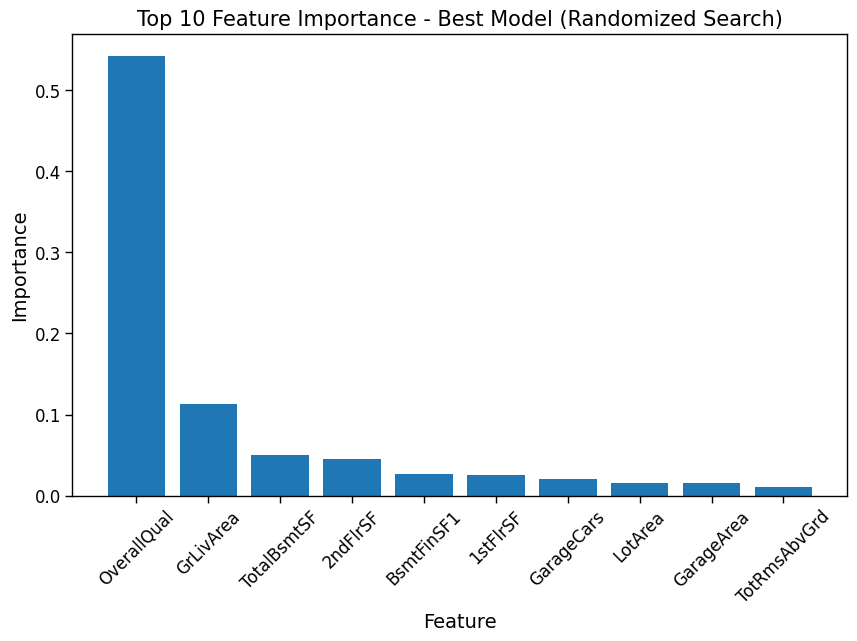

In [ ]:
start = tm.time()
rf_random = rf_optimize(random_grid, n_iters, X_train_MMS, y_train, 'MinMax')

results = model_run(start, rf_random.best_estimator_, X_train_MMS, X_test_MMS, y_train, y_test, 'Random Forest', 'Optimized', 'MinMax')
reg_results = pd.concat([reg_results, results])

save_feature_importance(rf_random.best_estimator_, feature_importances_all)

r2 score : 0.906
RMSE : 23575
MAE : 16502


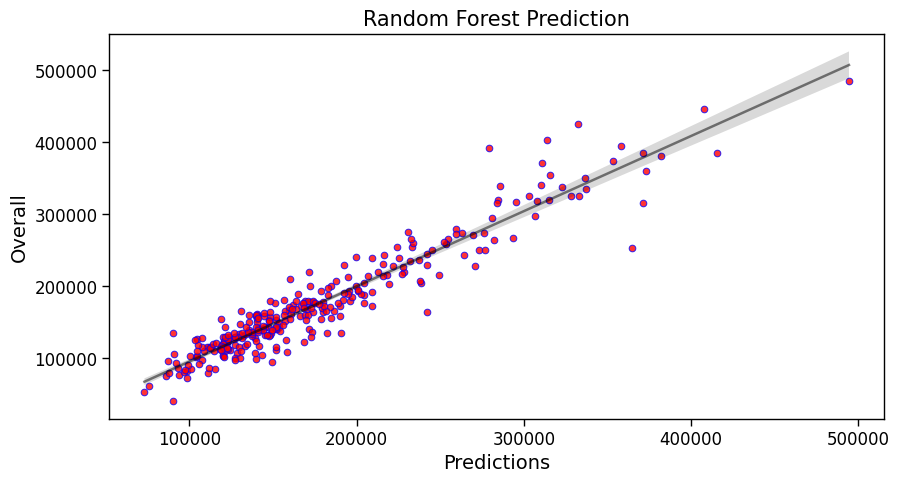

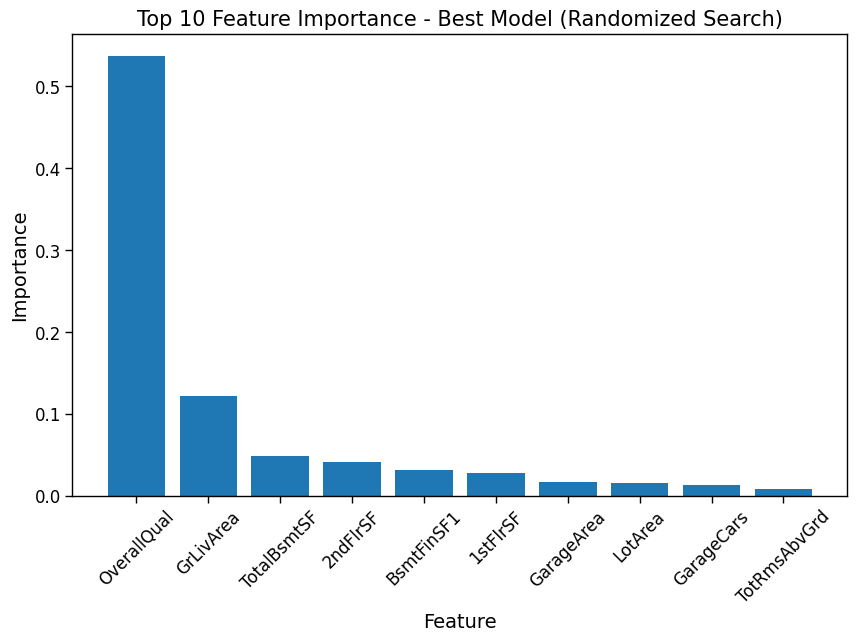

In [ ]:
start = tm.time()
rf_random = rf_optimize(random_grid, n_iters, X_train_SS, y_train, 'Standard')

results = model_run(start, rf_random.best_estimator_, X_train_SS, X_test_SS, y_train, y_test, 'Random Forest', 'Optimized', 'Standard')
reg_results = pd.concat([reg_results, results])

save_feature_importance(rf_random.best_estimator_, feature_importances_all)

In [ ]:
rf_best_params

[['None',
  {'n_estimators': 52,
   'min_samples_split': 3,
   'min_samples_leaf': 1,
   'max_depth': 80}],
 ['MinMax',
  {'n_estimators': 157,
   'min_samples_split': 4,
   'min_samples_leaf': 1,
   'max_depth': 20}],
 ['Standard',
  {'n_estimators': 136,
   'min_samples_split': 2,
   'min_samples_leaf': 1,
   'max_depth': 80}]]

In [ ]:
reg_results

,Model,Parameters,Scaler,Time,r2,RMSE,MAE
0,Linear,Default,None,0.140,0.884,26225,18938
0,Linear,Default,MinMax,0.094,-51671001729573281792.000,553889658233911,38989406874064
0,Linear,Default,Standard,0.111,-6816372012996061298688.000,6361747944754036,505351658468521
0,Ridge,Default,None,0.028,0.885,26159,18898
0,Ridge,Default,MinMax,0.011,0.887,25882,18705
0,Ridge,Default,Standard,0.022,0.883,26379,19045
0,Ridge,Optimized,None,117.712,0.897,24711,18324
0,Ridge,Optimized,MinMax,115.945,0.899,24511,17354
0,Ridge,Optimized,Standard,115.310,0.897,24764,17436
0,Lasso,Default,None,0.305,0.883,26357,19030


## Gradient Boosting

### Defualt Parameters

r2 score : 0.916
RMSE : 22382
MAE : 15776


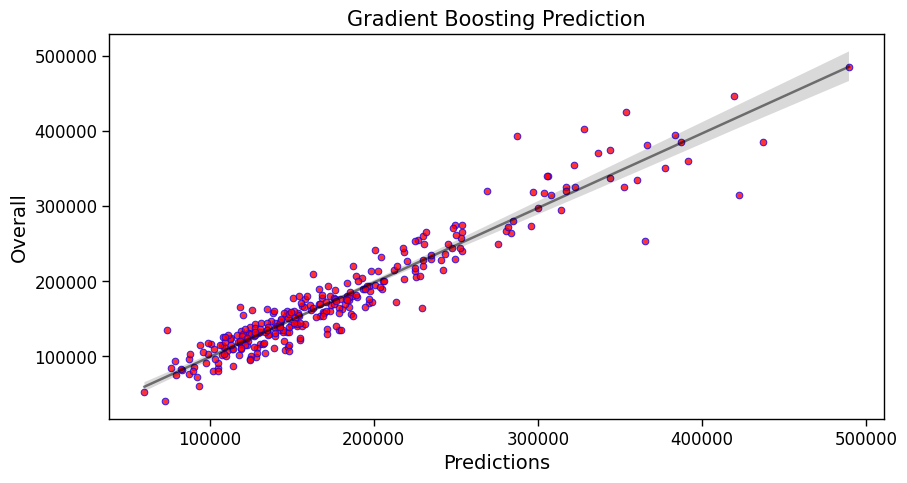

In [ ]:
start = tm.time()
results = model_run(start, GradientBoostingRegressor(random_state=0), X_train, X_test, y_train, y_test, 'Gradient Boosting', 'Default', 'None')
reg_results = pd.concat([reg_results, results])

r2 score : 0.916
RMSE : 22382
MAE : 15776


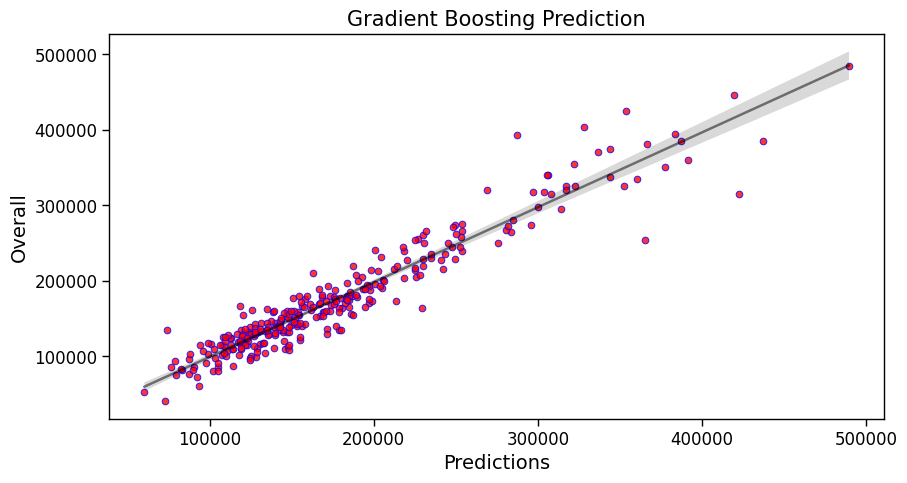

In [ ]:
start = tm.time()
results = model_run(start, GradientBoostingRegressor(random_state=0), X_train_MMS, X_test_MMS, y_train, y_test, 'Gradient Boosting', 'Default', 'MinMax')
reg_results = pd.concat([reg_results, results])

r2 score : 0.916
RMSE : 22382
MAE : 15775


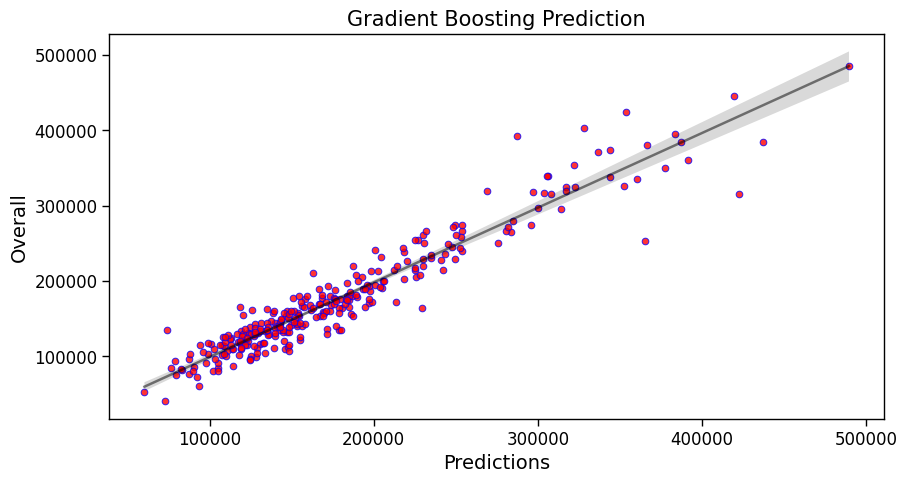

In [ ]:
start = tm.time()
results = model_run(start, GradientBoostingRegressor(random_state=0), X_train_SS, X_test_SS, y_train, y_test, 'Gradient Boosting', 'Default', 'Standard')
reg_results = pd.concat([reg_results, results])

In [ ]:
reg_results

,Model,Parameters,Scaler,Time,r2,RMSE,MAE
0,Linear,Default,None,0.140,0.884,26225,18938
0,Linear,Default,MinMax,0.094,-51671001729573281792.000,553889658233911,38989406874064
0,Linear,Default,Standard,0.111,-6816372012996061298688.000,6361747944754036,505351658468521
0,Ridge,Default,None,0.028,0.885,26159,18898
0,Ridge,Default,MinMax,0.011,0.887,25882,18705
0,Ridge,Default,Standard,0.022,0.883,26379,19045
0,Ridge,Optimized,None,117.712,0.897,24711,18324
0,Ridge,Optimized,MinMax,115.945,0.899,24511,17354
0,Ridge,Optimized,Standard,115.310,0.897,24764,17436
0,Lasso,Default,None,0.305,0.883,26357,19030


### Optimized Parameters

In [ ]:
GB_best_params = []

random_grid = {
            "n_estimators": [3, 10, 30, 100, 300, 1000],
            "max_depth": [2, 3, 10, 20, 50, 100],
            "learning_rate": loguniform(0.01, 1),}

n_iters = 20

def GB_optimize(random_grid, n_iters, X_train, y_train, scaler):
    GB_random = RandomizedSearchCV(estimator = GradientBoostingRegressor(),
                                param_distributions=random_grid,
                                scoring="neg_mean_absolute_error",
                                n_iter=n_iters,
                                n_jobs=-1)

    GB_random.fit(X_train,y_train)
    GB_best_params.append([scaler, GB_random.best_params_])
    return GB_random

r2 score : 0.915
RMSE : 22464
MAE : 15469


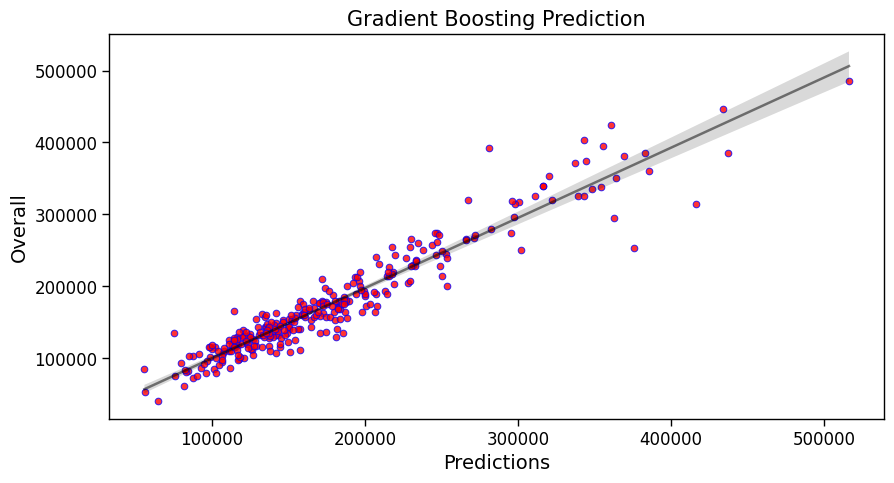

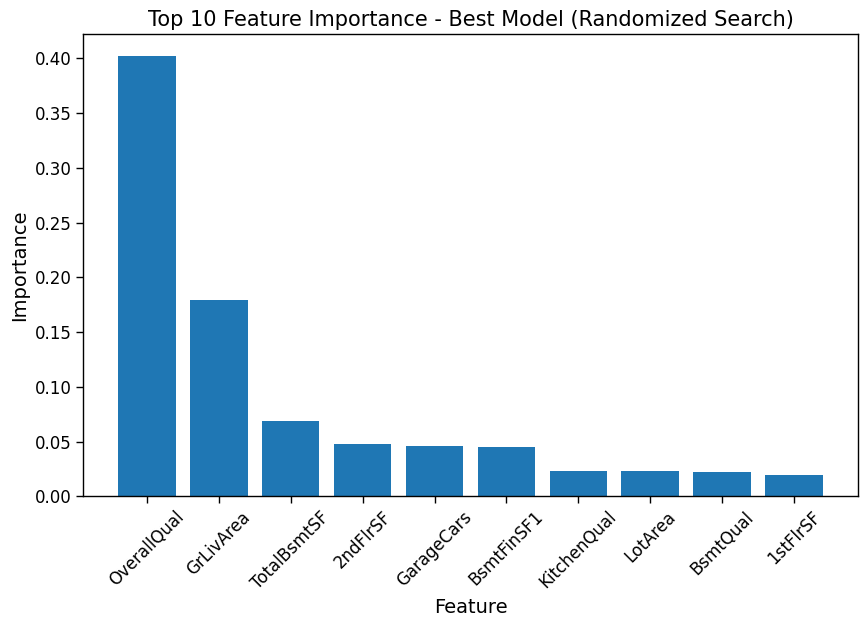

In [ ]:
start = tm.time()
GB_random = GB_optimize(random_grid, n_iters, X_train, y_train, 'None')

results = model_run(start, GB_random.best_estimator_, X_train, X_test, y_train, y_test, 'Gradient Boosting', 'Optimized', 'None')
reg_results = pd.concat([reg_results, results])

save_feature_importance(GB_random.best_estimator_, feature_importances_all)

r2 score : 0.918
RMSE : 22098
MAE : 15286


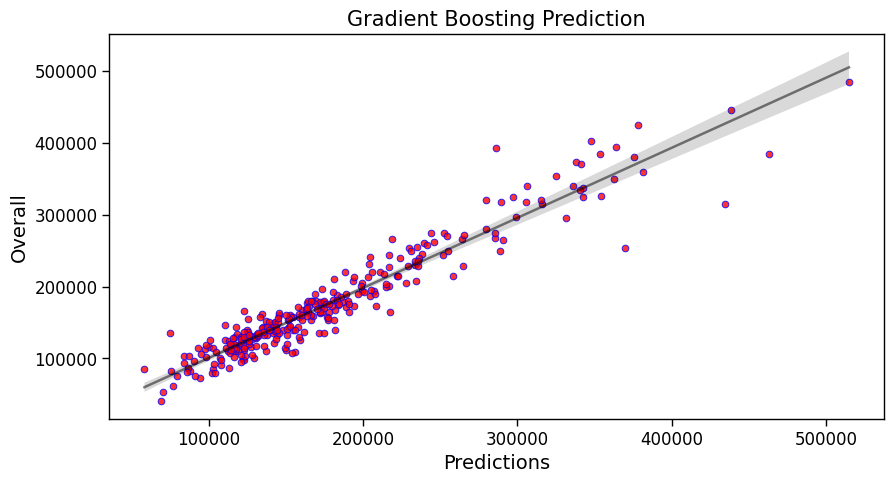

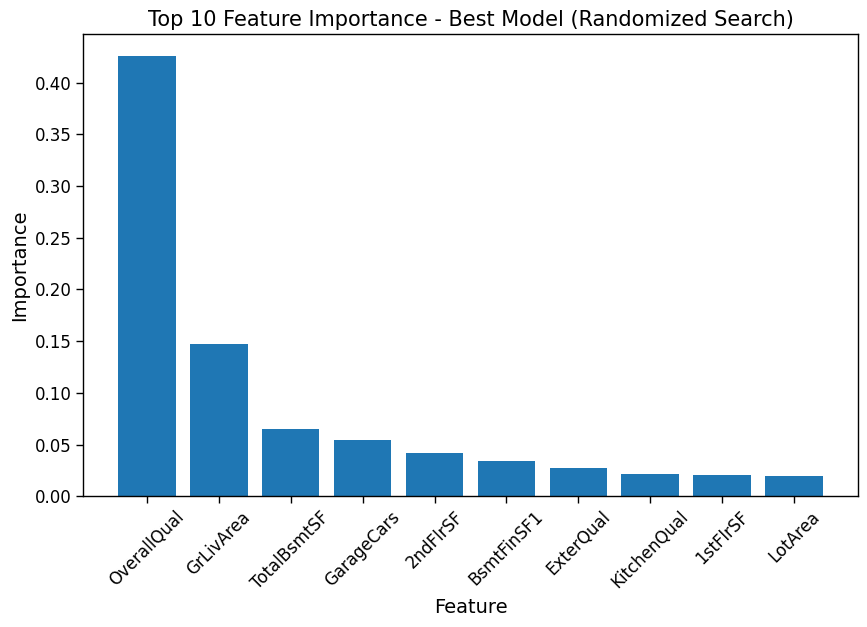

In [ ]:
start = tm.time()
GB_random = GB_optimize(random_grid, n_iters, X_train_MMS, y_train, 'MinMax')

results = model_run(start, GB_random.best_estimator_, X_train_MMS, X_test_MMS, y_train, y_test, 'Gradient Boosting', 'Optimized', 'MinMax')
reg_results = pd.concat([reg_results, results])

save_feature_importance(GB_random.best_estimator_, feature_importances_all)

r2 score : 0.908
RMSE : 23418
MAE : 15966


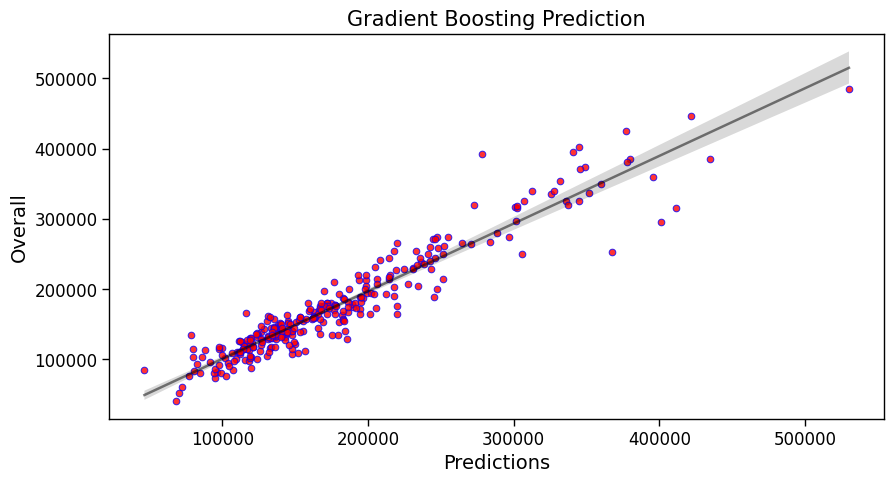

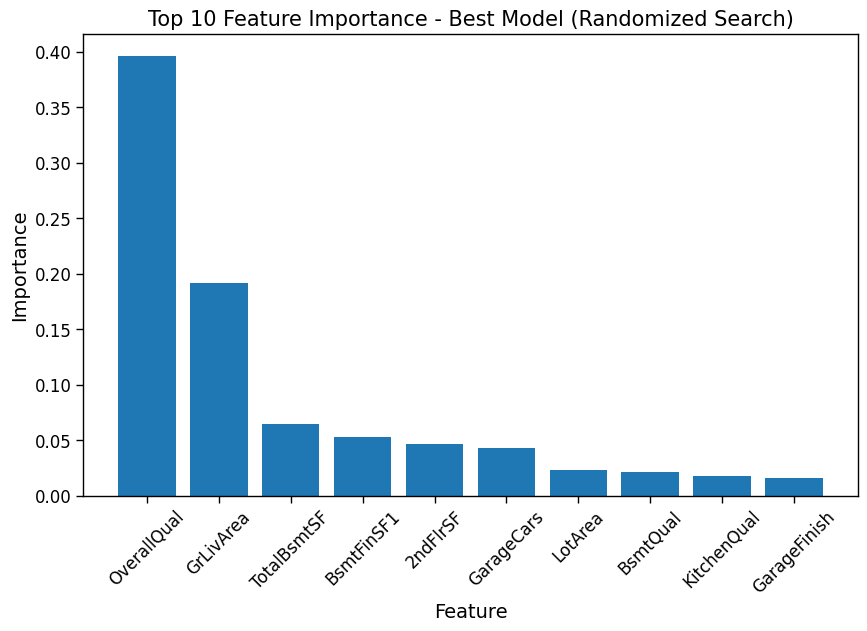

In [ ]:
start = tm.time()
GB_random = GB_optimize(random_grid, n_iters, X_train_SS, y_train, 'Standard')

results = model_run(start, GB_random.best_estimator_, X_train_SS, X_test_SS, y_train, y_test, 'Gradient Boosting', 'Optimized', 'Standard')
reg_results = pd.concat([reg_results, results])

save_feature_importance(GB_random.best_estimator_, feature_importances_all)

In [ ]:
GB_best_params

[['None',
  {'learning_rate': 0.04022477750109866,
   'max_depth': 2,
   'n_estimators': 1000}],
 ['MinMax',
  {'learning_rate': 0.08322498142440377,
   'max_depth': 3,
   'n_estimators': 1000}],
 ['Standard',
  {'learning_rate': 0.10043116423274853,
   'max_depth': 2,
   'n_estimators': 1000}]]

## Histogram Gradient Boosting

### Default Parameters

  File "c:\Users\debbi\AppData\Local\Programs\Python\Python312\Lib\site-packages\joblib\externals\loky\backend\context.py", line 282, in _count_physical_cores
    raise ValueError(f"found {cpu_count_physical} physical cores < 1")


r2 score : 0.908
RMSE : 23409
MAE : 16443


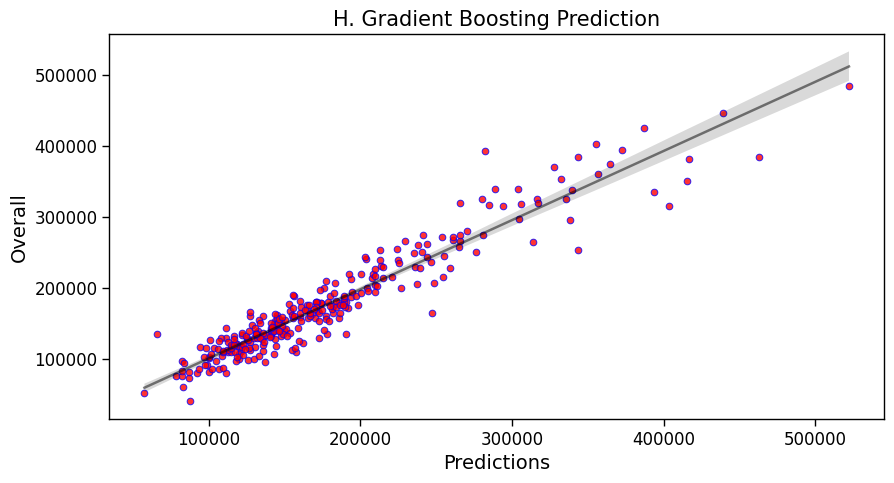

In [ ]:
start = tm.time()
results = model_run(start, HistGradientBoostingRegressor(random_state=0), X_train, X_test, y_train, y_test, 'H. Gradient Boosting', 'Default', 'None')
reg_results = pd.concat([reg_results, results])

r2 score : 0.908
RMSE : 23417
MAE : 16461


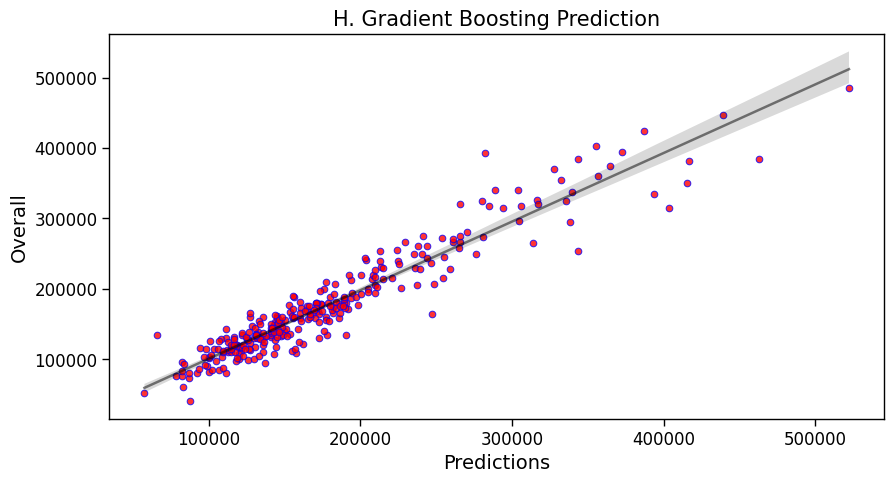

In [ ]:
start = tm.time()
results = model_run(start, HistGradientBoostingRegressor(random_state=0), X_train_MMS, X_test_MMS, y_train, y_test, 'H. Gradient Boosting', 'Default', 'MinMax')
reg_results = pd.concat([reg_results, results])

r2 score : 0.908
RMSE : 23409
MAE : 16444


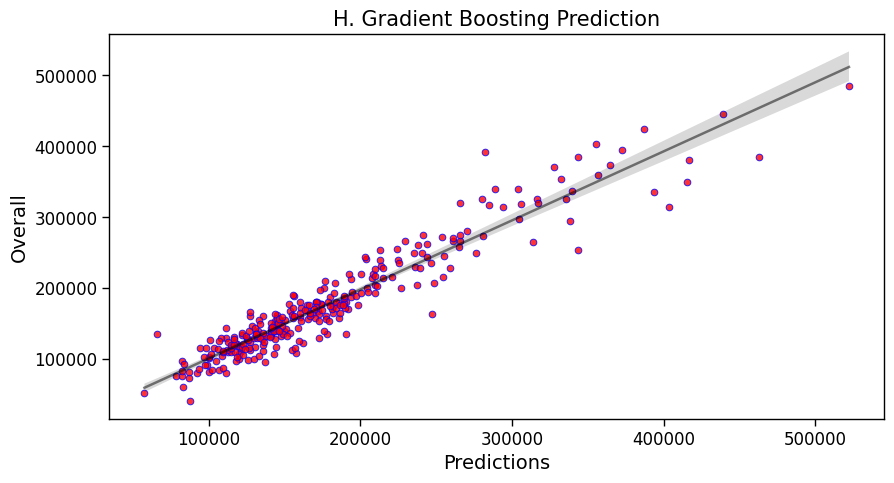

In [ ]:
start = tm.time()
results = model_run(start, HistGradientBoostingRegressor(random_state=0), X_train_SS, X_test_SS, y_train, y_test, 'H. Gradient Boosting', 'Default', 'Standard')
reg_results = pd.concat([reg_results, results])

### Optimized Parameters

In [ ]:
HGB_best_params = []

random_grid = {
            "max_iter": [3, 10, 30, 100, 300, 1000],
            "max_leaf_nodes": [2, 5, 10, 20, 50, 100],
            "learning_rate": loguniform(0.01, 1),}

n_iters = 15

def HGB_optimize(random_grid, n_iters, X_train, y_train, scaler):
    HGB_random = RandomizedSearchCV(estimator = HistGradientBoostingRegressor(),
                                param_distributions=random_grid,
                                scoring="neg_mean_absolute_error",
                                n_iter=n_iters,
                                n_jobs=-1)

    HGB_random.fit(X_train,y_train)
    HGB_best_params.append([scaler, HGB_random.best_params_])
    return HGB_random

r2 score : 0.905
RMSE : 23728
MAE : 16368


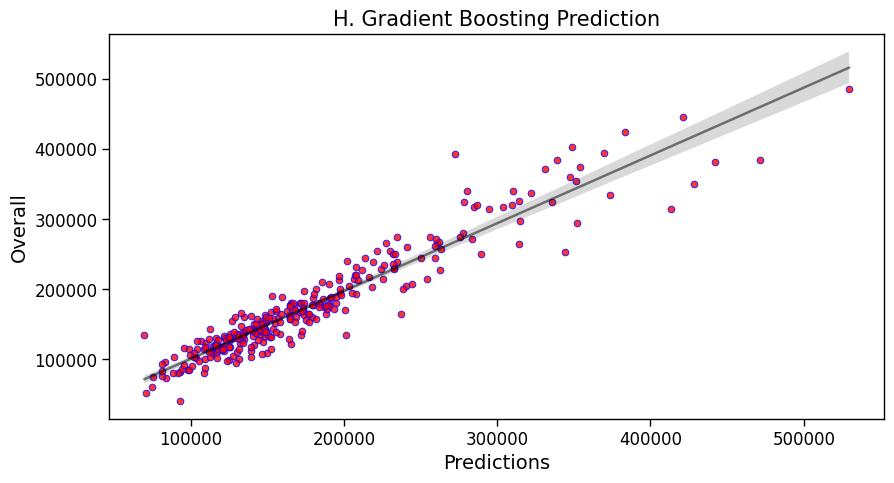

In [ ]:
start = tm.time()
HGB_random = HGB_optimize(random_grid, n_iters, X_train, y_train, 'None')

results = model_run(start, HGB_random.best_estimator_, X_train, X_test, y_train, y_test, 'H. Gradient Boosting', 'Optimized', 'None')
reg_results = pd.concat([reg_results, results])

r2 score : 0.913
RMSE : 22704
MAE : 15820


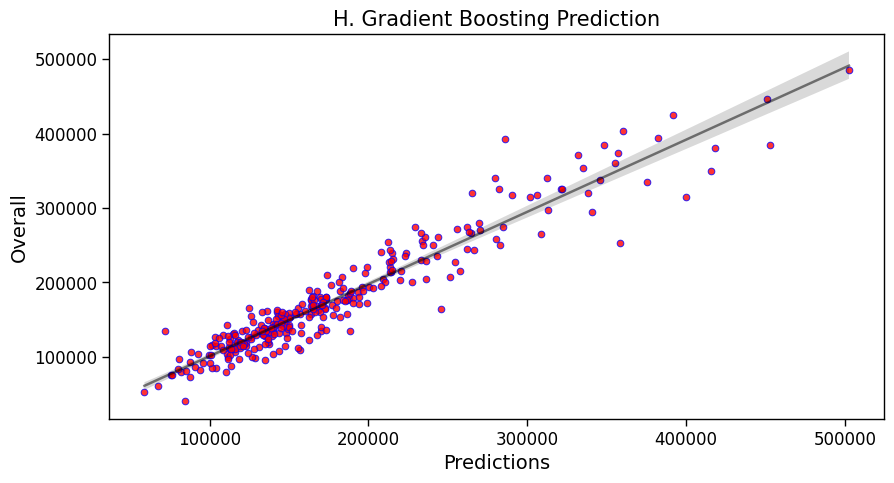

In [ ]:
start = tm.time()
HGB_random = HGB_optimize(random_grid, n_iters, X_train_MMS, y_train, 'MinMax')

results = model_run(start, HGB_random.best_estimator_, X_train_MMS, X_test_MMS, y_train, y_test, 'H. Gradient Boosting', 'Optimized', 'MinMax')
reg_results = pd.concat([reg_results, results])

r2 score : 0.902
RMSE : 24087
MAE : 16510


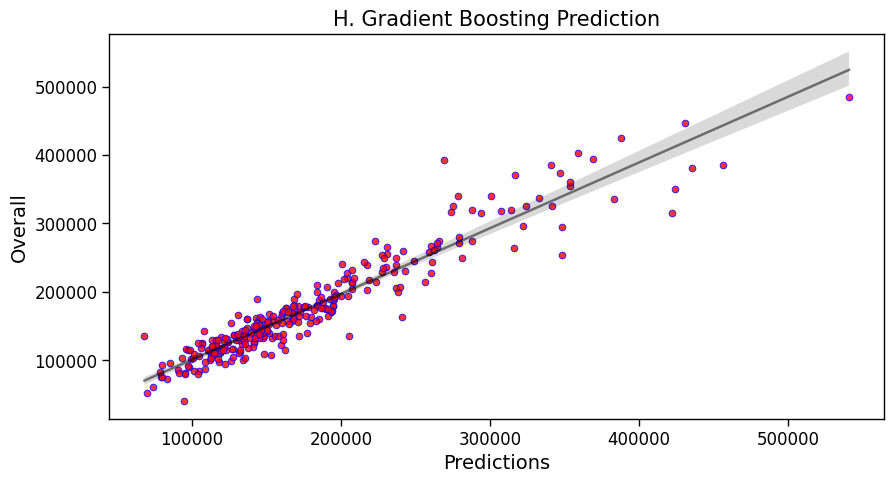

In [ ]:
start = tm.time()
HGB_random = HGB_optimize(random_grid, n_iters, X_train_SS, y_train, 'Standard')

results = model_run(start, HGB_random.best_estimator_, X_train_SS, X_test_SS, y_train, y_test, 'H. Gradient Boosting', 'Optimized', 'Standard')
reg_results = pd.concat([reg_results, results])

In [ ]:
HGB_best_params

[['None',
  {'learning_rate': 0.01692102276286968,
   'max_iter': 1000,
   'max_leaf_nodes': 20}],
 ['MinMax',
  {'learning_rate': 0.026256316282436243,
   'max_iter': 300,
   'max_leaf_nodes': 50}],
 ['Standard',
  {'learning_rate': 0.05780896903465265,
   'max_iter': 1000,
   'max_leaf_nodes': 20}]]

## CatBoost

### Default Parameters

r2 score : 0.924
RMSE : 21279
MAE : 14534


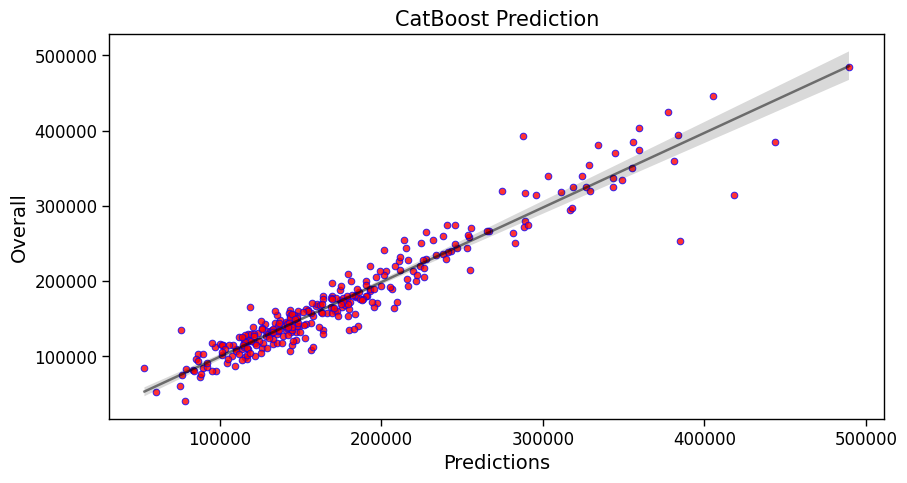

In [ ]:
start = tm.time()
results = model_run(start, CatBoostRegressor(random_state=0, verbose = False), X_train, X_test, y_train, y_test, 'CatBoost', 'Default', 'None')
reg_results = pd.concat([reg_results, results])

r2 score : 0.924
RMSE : 21282
MAE : 14539


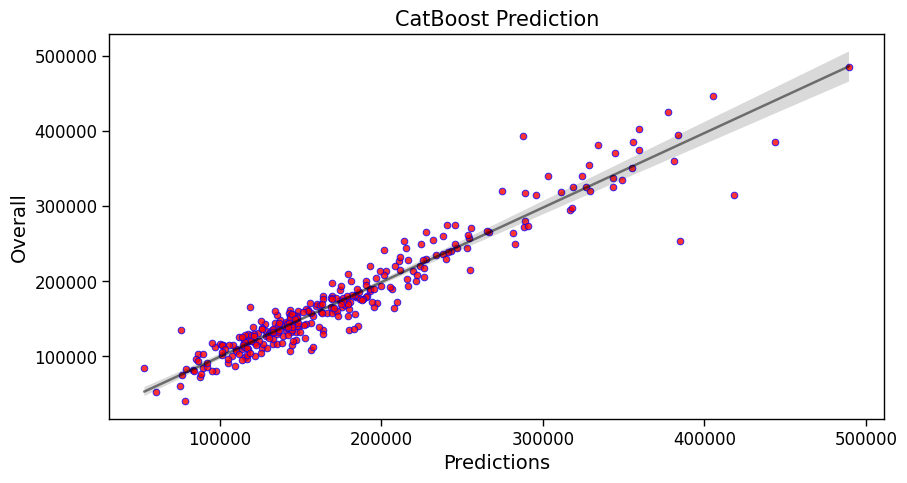

In [ ]:
start = tm.time()
results = model_run(start, CatBoostRegressor(random_state=0, verbose = False), X_train_MMS, X_test_MMS, y_train, y_test, 'CatBoost', 'Default', 'MinMax')
reg_results = pd.concat([reg_results, results])

r2 score : 0.924
RMSE : 21274
MAE : 14527


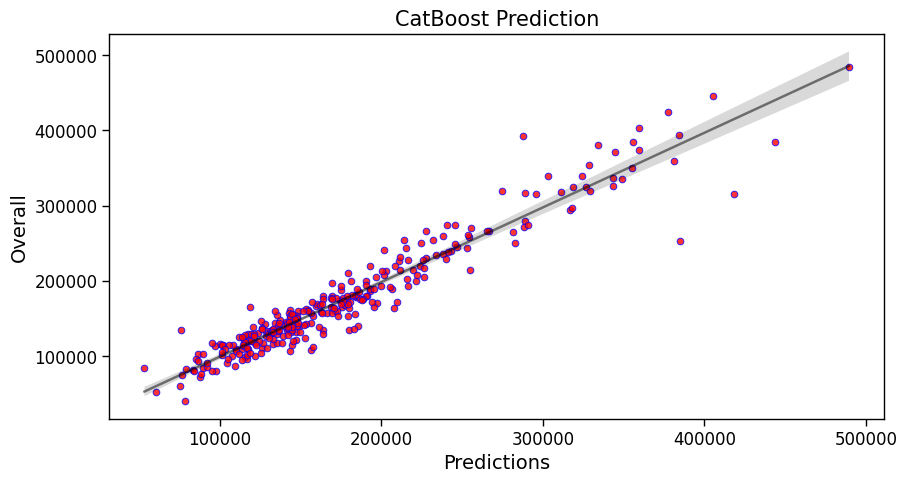

In [ ]:
start = tm.time()
results = model_run(start, CatBoostRegressor(random_state=0, verbose = False), X_train_SS, X_test_SS, y_train, y_test, 'CatBoost', 'Default', 'Standard')
reg_results = pd.concat([reg_results, results])

### Optimized Parameters

In [ ]:
CB_best_params = []

random_grid = {'learning_rate': [0.03, 0.1], 'depth': [4, 6, 10], 'l2_leaf_reg': [1, 3, 5, 7, 9]}
n_iters = 5


# CatBoost has its own randomized and grid search for tuning
# and it works better compared to RandomizedSearchCV
def CB_optimize(random_grid, n_iters, X_train, y_train):
    model = CatBoostRegressor(verbose = False)

    randomized_search_result = model.randomized_search(random_grid, X = X_train, y = y_train, n_iter = n_iters, verbose = False)

    return model

def plot_shap(model):
    explainer = shap.TreeExplainer(model)
    shap_values = explainer(X_train)
    shap.plots.beeswarm(shap_values)


bestTest = 32992.257
bestIteration = 73


bestTest = 32948.0608
bestIteration = 69


bestTest = 32733.15838
bestIteration = 963


bestTest = 32560.37373
bestIteration = 996


bestTest = 33063.88344
bestIteration = 995

Training on fold [0/3]

bestTest = 29452.27004
bestIteration = 999

Training on fold [1/3]

bestTest = 24359.88673
bestIteration = 998

Training on fold [2/3]

bestTest = 30397.27597
bestIteration = 999

r2 score : 0.925
RMSE : 21110
MAE : 15088


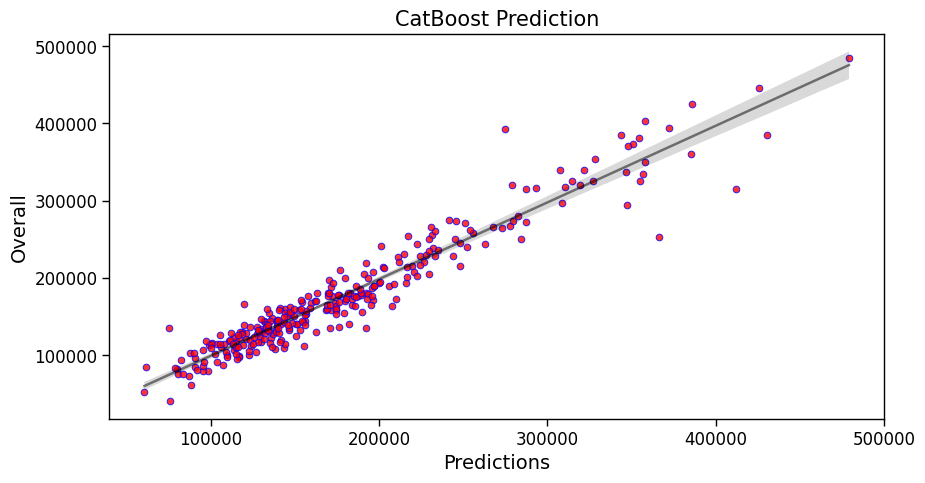

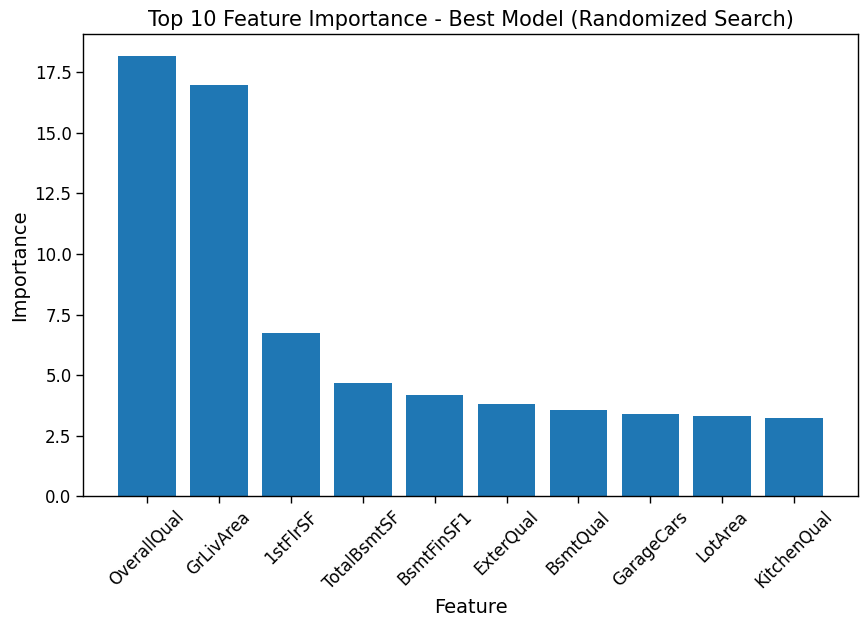

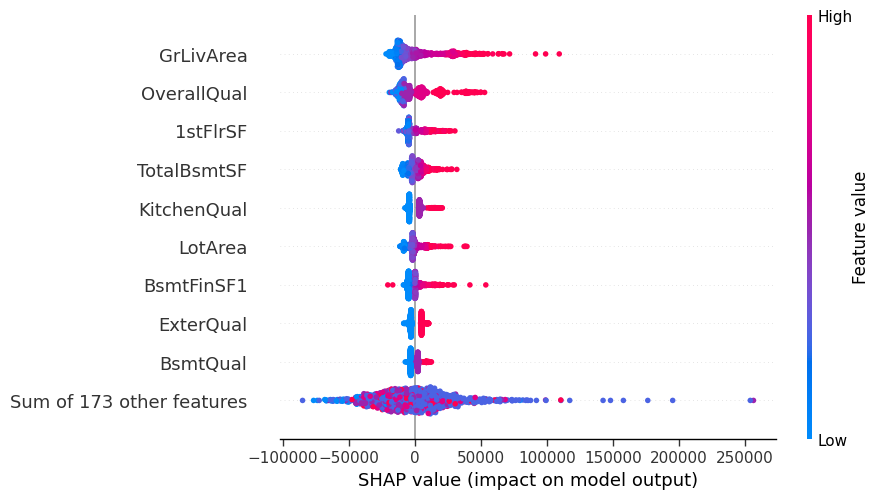

In [ ]:
start = tm.time()
CB_random = CB_optimize(random_grid, n_iters, X_train, y_train)

results = model_run(start, CB_random, X_train, X_test, y_train, y_test, 'CatBoost', 'Optimized', 'None')
reg_results = pd.concat([reg_results, results])
save_feature_importance(CB_random, feature_importances_all)

plot_shap(CB_random)


bestTest = 32992.257
bestIteration = 73


bestTest = 32948.0608
bestIteration = 69


bestTest = 32733.15838
bestIteration = 963


bestTest = 32560.37373
bestIteration = 996


bestTest = 33063.88344
bestIteration = 995

Training on fold [0/3]

bestTest = 29454.72571
bestIteration = 999

Training on fold [1/3]

bestTest = 24356.69184
bestIteration = 998

Training on fold [2/3]

bestTest = 30411.14266
bestIteration = 999

r2 score : 0.925
RMSE : 21110
MAE : 15088


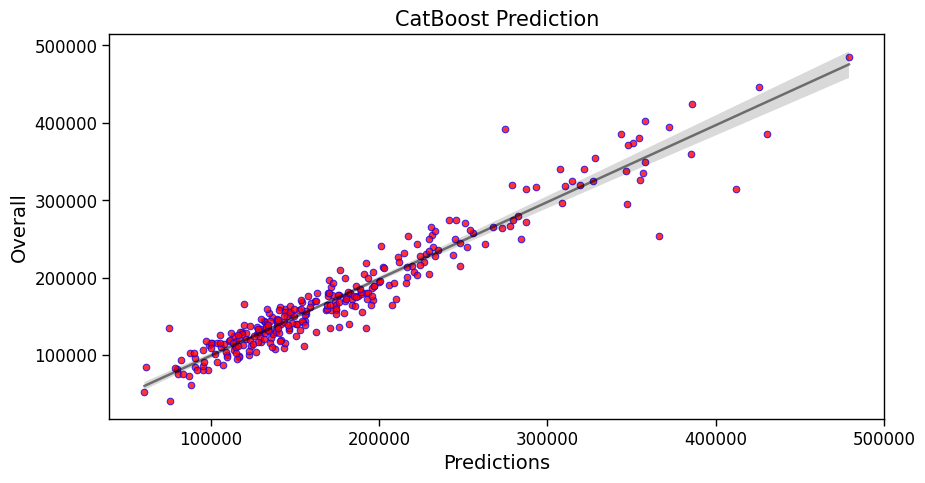

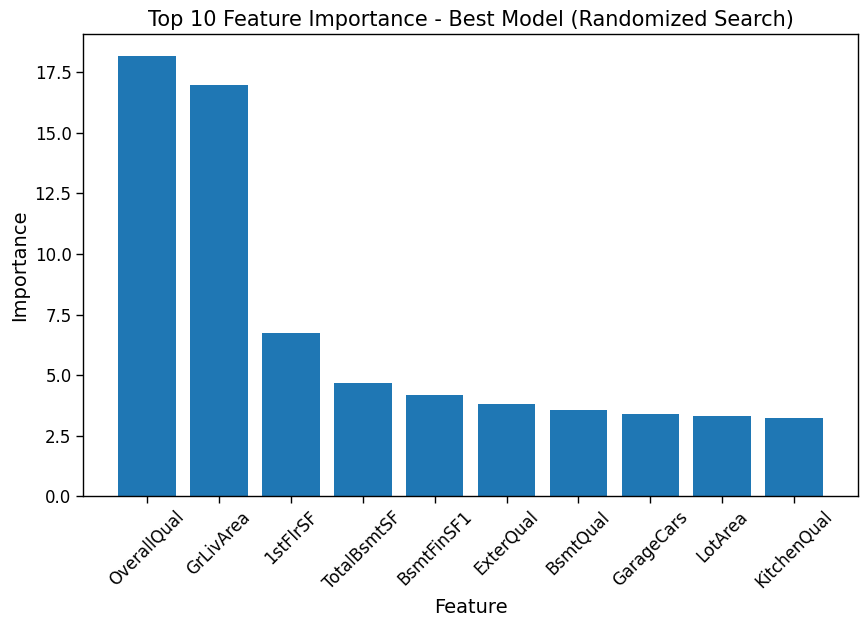

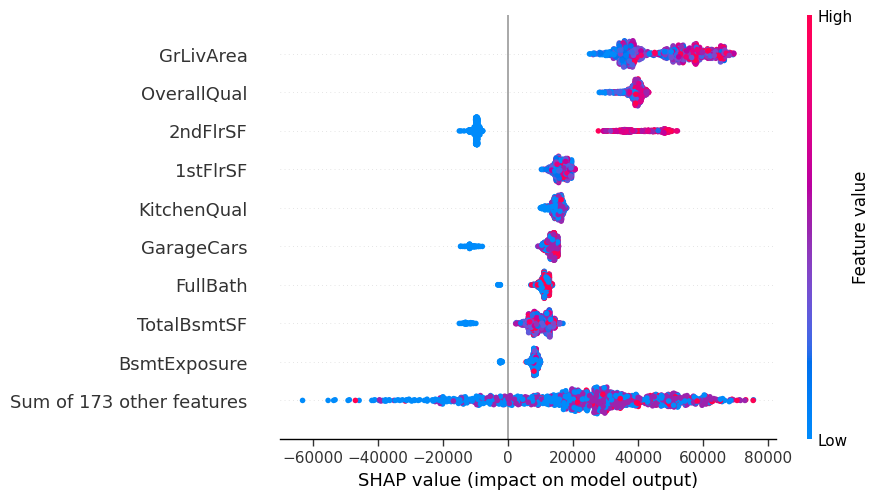

In [ ]:
start = tm.time()
CB_random = CB_optimize(random_grid, n_iters, X_train_MMS, y_train)

results = model_run(start, CB_random, X_train_MMS, X_test_MMS, y_train, y_test, 'CatBoost', 'Optimized', 'MinMax')
reg_results = pd.concat([reg_results, results])
save_feature_importance(CB_random, feature_importances_all)

plot_shap(CB_random)


bestTest = 32992.257
bestIteration = 73


bestTest = 32948.0608
bestIteration = 69


bestTest = 32733.15838
bestIteration = 963


bestTest = 32560.37373
bestIteration = 996


bestTest = 33063.88344
bestIteration = 995

Training on fold [0/3]

bestTest = 29451.55039
bestIteration = 999

Training on fold [1/3]

bestTest = 24358.74175
bestIteration = 998

Training on fold [2/3]

bestTest = 30397.20682
bestIteration = 999

r2 score : 0.006
RMSE : 76808
MAE : 66173


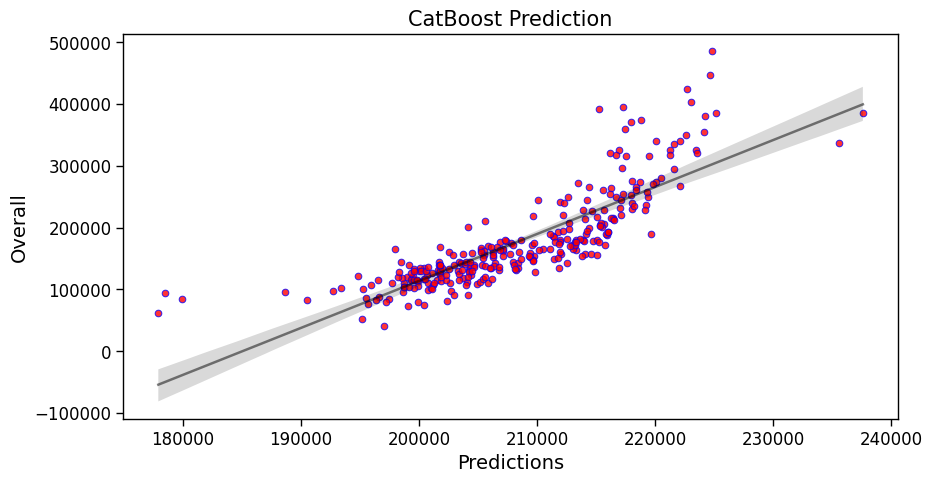

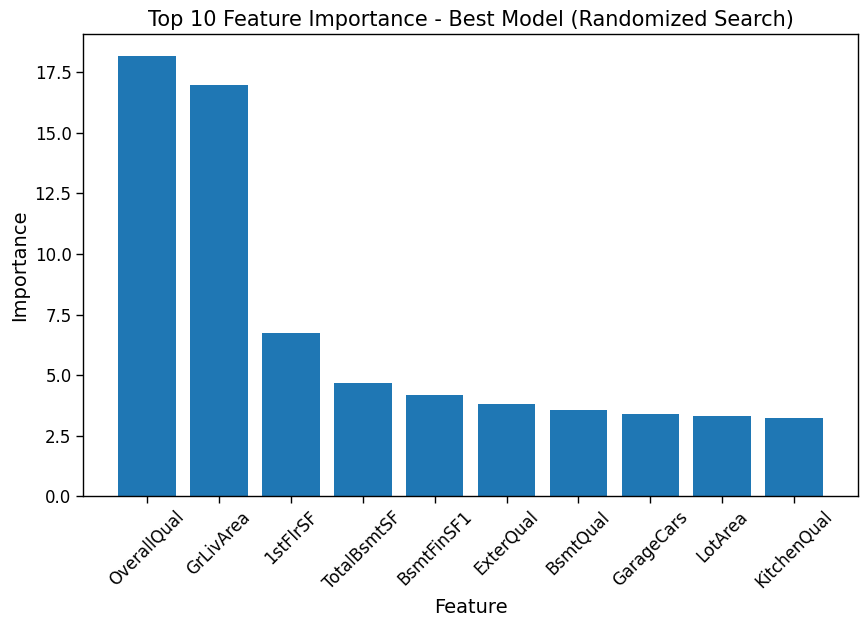

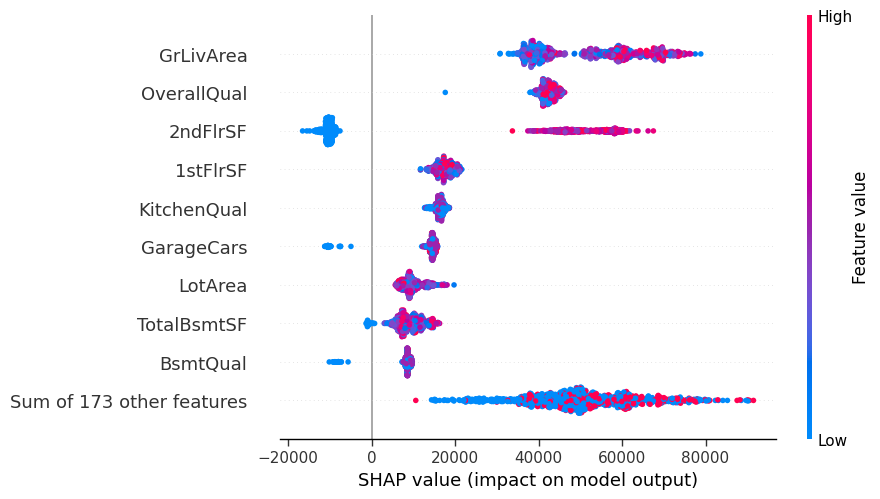

In [ ]:
start = tm.time()
CB_random = CB_optimize(random_grid, n_iters, X_train_SS, y_train)

results = model_run(start, CB_random, X_train_SS, X_test_MMS, y_train, y_test, 'CatBoost', 'Optimized', 'Standard')
reg_results = pd.concat([reg_results, results])
save_feature_importance(CB_random, feature_importances_all)

plot_shap(CB_random)

# First Pass Results

## Model Comparison

In [ ]:
reg_results

,Model,Parameters,Scaler,Time,r2,RMSE,MAE
0,Linear,Default,None,0.140,0.884,26225,18938
0,Linear,Default,MinMax,0.094,-51671001729573281792.000,553889658233911,38989406874064
0,Linear,Default,Standard,0.111,-6816372012996061298688.000,6361747944754036,505351658468521
0,Ridge,Default,None,0.028,0.885,26159,18898
0,Ridge,Default,MinMax,0.011,0.887,25882,18705
0,Ridge,Default,Standard,0.022,0.883,26379,19045
0,Ridge,Optimized,None,117.712,0.897,24711,18324
0,Ridge,Optimized,MinMax,115.945,0.899,24511,17354
0,Ridge,Optimized,Standard,115.310,0.897,24764,17436
0,Lasso,Default,None,0.305,0.883,26357,19030


### Top 10 Models

In [ ]:
reg_results.sort_values(by=['r2'], ascending = False)[:10]

,Model,Parameters,Scaler,Time,r2,RMSE,MAE
0,CatBoost,Optimized,MinMax,35.476,0.925,21110,15088
0,CatBoost,Optimized,None,35.485,0.925,21110,15088
0,CatBoost,Default,MinMax,4.458,0.924,21282,14539
0,CatBoost,Default,Standard,4.475,0.924,21274,14527
0,CatBoost,Default,None,4.837,0.924,21279,14534
0,Gradient Boosting,Optimized,MinMax,67.745,0.918,22098,15286
0,Gradient Boosting,Default,Standard,0.734,0.916,22382,15775
0,Gradient Boosting,Default,MinMax,0.844,0.916,22382,15776
0,Gradient Boosting,Default,None,0.769,0.916,22382,15776
0,Gradient Boosting,Optimized,None,110.697,0.915,22464,15469


In [ ]:
reg_results.sort_values(by=['RMSE'], ascending = True)[:10]

,Model,Parameters,Scaler,Time,r2,RMSE,MAE
0,CatBoost,Optimized,None,35.485,0.925,21110,15088
0,CatBoost,Optimized,MinMax,35.476,0.925,21110,15088
0,CatBoost,Default,Standard,4.475,0.924,21274,14527
0,CatBoost,Default,None,4.837,0.924,21279,14534
0,CatBoost,Default,MinMax,4.458,0.924,21282,14539
0,Gradient Boosting,Optimized,MinMax,67.745,0.918,22098,15286
0,Gradient Boosting,Default,MinMax,0.844,0.916,22382,15776
0,Gradient Boosting,Default,None,0.769,0.916,22382,15776
0,Gradient Boosting,Default,Standard,0.734,0.916,22382,15775
0,Gradient Boosting,Optimized,None,110.697,0.915,22464,15469


In [ ]:
reg_results.sort_values(by=['MAE'], ascending = True)[:10]

,Model,Parameters,Scaler,Time,r2,RMSE,MAE
0,CatBoost,Default,Standard,4.475,0.924,21274,14527
0,CatBoost,Default,None,4.837,0.924,21279,14534
0,CatBoost,Default,MinMax,4.458,0.924,21282,14539
0,CatBoost,Optimized,None,35.485,0.925,21110,15088
0,CatBoost,Optimized,MinMax,35.476,0.925,21110,15088
0,Gradient Boosting,Optimized,MinMax,67.745,0.918,22098,15286
0,Gradient Boosting,Optimized,None,110.697,0.915,22464,15469
0,Gradient Boosting,Default,Standard,0.734,0.916,22382,15775
0,Gradient Boosting,Default,MinMax,0.844,0.916,22382,15776
0,Gradient Boosting,Default,None,0.769,0.916,22382,15776


### Bottom 10 Models

In [ ]:
reg_results = reg_results[(reg_results['r2'] > 0)]

In [ ]:
reg_results.sort_values(by=['r2'], ascending = True)[:10]

,Model,Parameters,Scaler,Time,r2,RMSE,MAE
0,CatBoost,Optimized,Standard,37.744,0.006,76808,66173
0,Polynomial,Default,Standard,7.076,0.746,38851,25539
0,Polynomial,Optimized,Standard,18.195,0.782,35986,26234
0,Polynomial,Optimized,MinMax,15.424,0.782,35986,26234
0,Polynomial,Default,MinMax,7.520,0.782,35986,26234
0,Ridge,Default,Standard,0.022,0.883,26379,19045
0,Lasso,Default,None,0.305,0.883,26357,19030
0,Lasso,Default,MinMax,0.264,0.883,26349,19020
0,Lasso,Default,Standard,0.351,0.883,26363,19036
0,Polynomial,Optimized,None,8.595,0.884,26225,18938


In [ ]:
reg_results.sort_values(by=['RMSE'], ascending = False)[:10]

,Model,Parameters,Scaler,Time,r2,RMSE,MAE
0,CatBoost,Optimized,Standard,37.744,0.006,76808,66173
0,Polynomial,Default,Standard,7.076,0.746,38851,25539
0,Polynomial,Default,MinMax,7.520,0.782,35986,26234
0,Polynomial,Optimized,Standard,18.195,0.782,35986,26234
0,Polynomial,Optimized,MinMax,15.424,0.782,35986,26234
0,Ridge,Default,Standard,0.022,0.883,26379,19045
0,Lasso,Default,Standard,0.351,0.883,26363,19036
0,Lasso,Default,None,0.305,0.883,26357,19030
0,Lasso,Default,MinMax,0.264,0.883,26349,19020
0,Polynomial,Optimized,None,8.595,0.884,26225,18938


In [ ]:
reg_results.sort_values(by=['RMSE'], ascending = False)[:10]

,Model,Parameters,Scaler,Time,r2,RMSE,MAE
0,CatBoost,Optimized,Standard,37.744,0.006,76808,66173
0,Polynomial,Default,Standard,7.076,0.746,38851,25539
0,Polynomial,Default,MinMax,7.520,0.782,35986,26234
0,Polynomial,Optimized,Standard,18.195,0.782,35986,26234
0,Polynomial,Optimized,MinMax,15.424,0.782,35986,26234
0,Ridge,Default,Standard,0.022,0.883,26379,19045
0,Lasso,Default,Standard,0.351,0.883,26363,19036
0,Lasso,Default,None,0.305,0.883,26357,19030
0,Lasso,Default,MinMax,0.264,0.883,26349,19020
0,Polynomial,Optimized,None,8.595,0.884,26225,18938


### Model Comparison - Plots

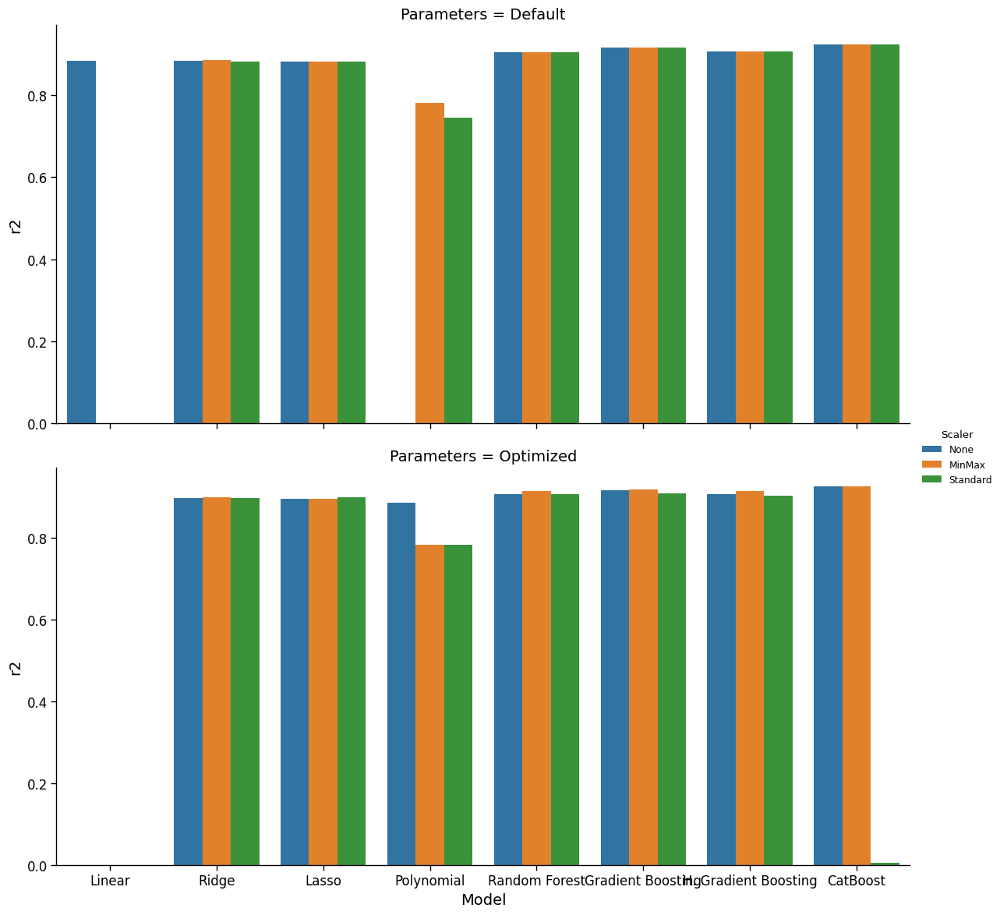

In [ ]:
sns.catplot(data=reg_results, x="Model", y="r2", hue="Scaler", kind="bar", row = 'Parameters', height = 6, aspect = 2)

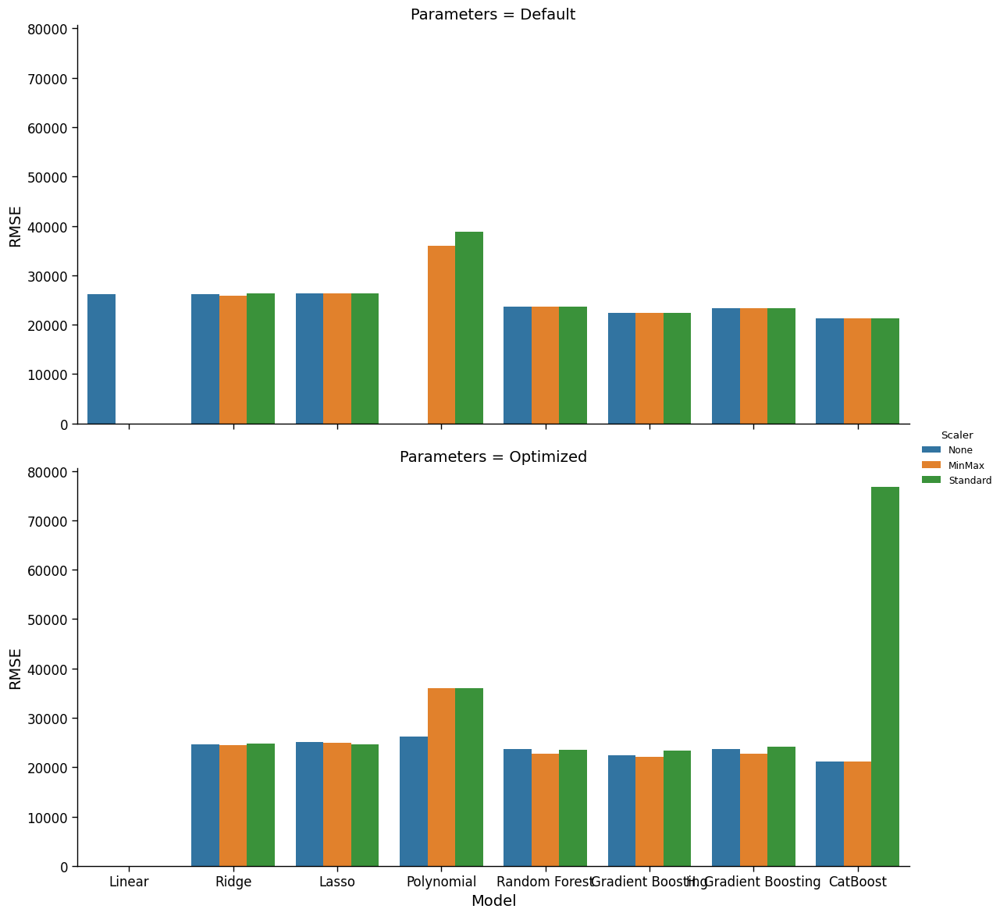

In [ ]:
sns.catplot(data=reg_results, x="Model", y="RMSE", hue="Scaler", kind="bar", row = 'Parameters', height = 6, aspect = 2)

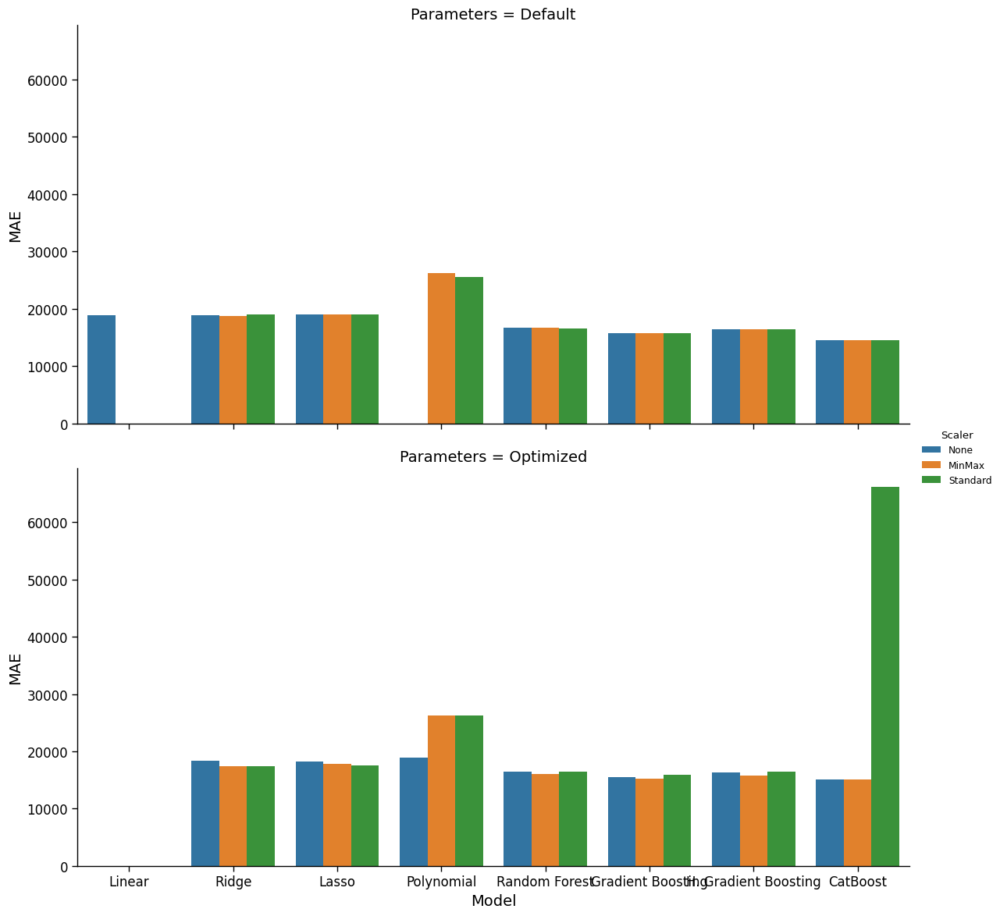

In [ ]:
sns.catplot(data=reg_results, x="Model", y="MAE", hue="Scaler", kind="bar", row = 'Parameters', height = 6, aspect = 2)

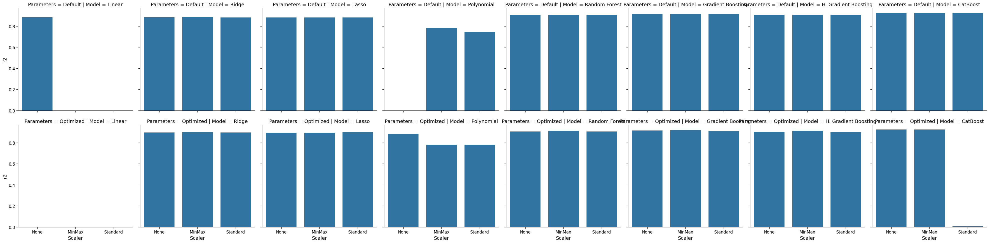

In [ ]:
sns.catplot(reg_results, kind="bar", x = "Scaler", y = "r2", col = 'Model', row = 'Parameters')

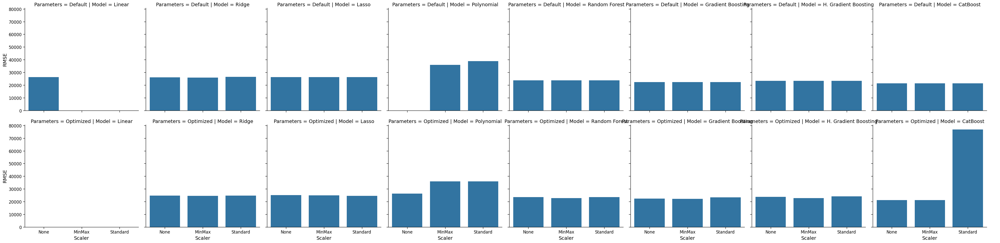

In [ ]:
sns.catplot(reg_results, kind="bar", x = "Scaler", y = "RMSE", col = 'Model', row = 'Parameters')

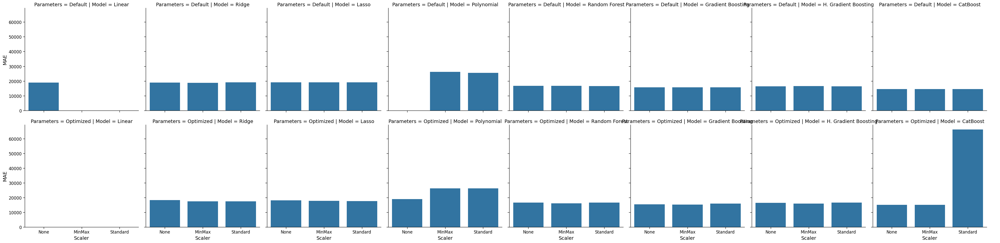

In [ ]:
sns.catplot(reg_results, kind="bar", x = "Scaler", y = "MAE", col = 'Model', row = 'Parameters')

## Optimization Comparison

### Ridge - Lasso

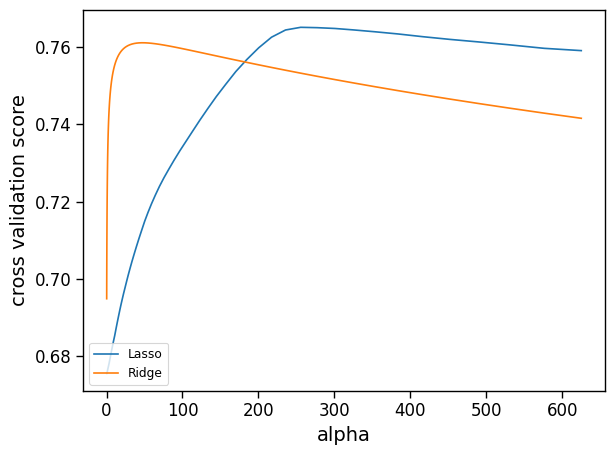

In [ ]:
for Model in [Lasso, Ridge]:
    scores = [cross_val_score(Model(alpha), X_train, y_train, cv=10).mean() for alpha in np.logspace(-1, 4, num = 100, base = 5)]
    plt.plot(np.logspace(-1, 4, num = 100, base = 5), scores, label = Model.__name__)
plt.legend(loc='lower left')
plt.xlabel('alpha')
plt.ylabel('cross validation score')
plt.tight_layout()
plt.show()

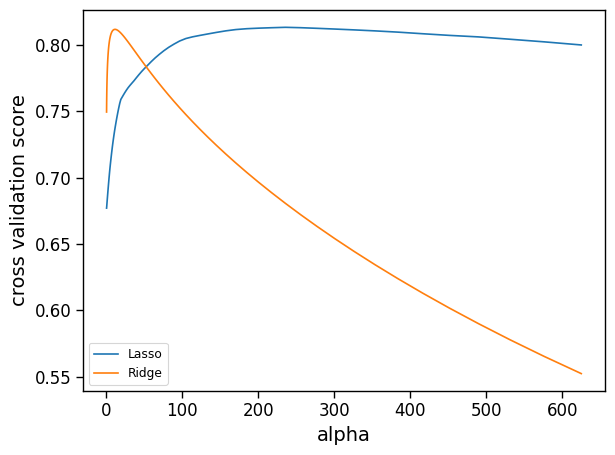

In [ ]:
for Model in [Lasso, Ridge]:
    scores = [cross_val_score(Model(alpha), X_train_MMS, y_train, cv=10).mean() for alpha in np.logspace(-1, 4, num = 100, base = 5)]
    plt.plot(np.logspace(-1, 4, num = 100, base = 5), scores, label = Model.__name__)
plt.legend(loc='lower left')
plt.xlabel('alpha')
plt.ylabel('cross validation score')
plt.tight_layout()
plt.show()

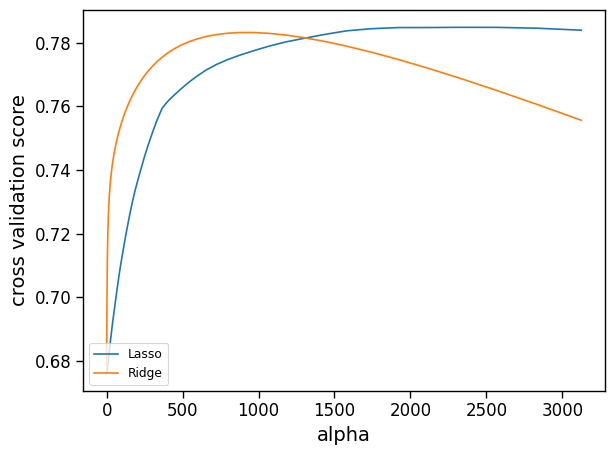

In [ ]:
for Model in [Lasso, Ridge]:
    scores = [cross_val_score(Model(alpha), X_train_SS, y_train, cv=10).mean() for alpha in np.logspace(-1, 5, num = 100, base = 5)]
    plt.plot(np.logspace(-1, 5, num = 100, base = 5), scores, label = Model.__name__)
plt.legend(loc='lower left')
plt.xlabel('alpha')
plt.ylabel('cross validation score')
plt.tight_layout()
plt.show()

In [ ]:
reg_results[(reg_results['Model'] == 'Ridge')].sort_values(by=['r2'], ascending = False)

,Model,Parameters,Scaler,Time,r2,RMSE,MAE
0,Ridge,Optimized,MinMax,115.945,0.899,24511,17354
0,Ridge,Optimized,None,117.712,0.897,24711,18324
0,Ridge,Optimized,Standard,115.310,0.897,24764,17436
0,Ridge,Default,MinMax,0.011,0.887,25882,18705
0,Ridge,Default,None,0.028,0.885,26159,18898
0,Ridge,Default,Standard,0.022,0.883,26379,19045


### Random Forrest

In [ ]:
for scaler in rf_best_params:
    print(f'{scaler[0]} : {scaler[1]}')

None : {'n_estimators': 52, 'min_samples_split': 3, 'min_samples_leaf': 1, 'max_depth': 80}
MinMax : {'n_estimators': 157, 'min_samples_split': 4, 'min_samples_leaf': 1, 'max_depth': 20}
Standard : {'n_estimators': 136, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_depth': 80}


In [ ]:
reg_results[(reg_results['Model'] == 'Random Forest')].sort_values(by=['r2'], ascending = False)

,Model,Parameters,Scaler,Time,r2,RMSE,MAE
0,Random Forest,Optimized,MinMax,55.594,0.913,22730,16013
0,Random Forest,Default,None,2.351,0.906,23657,16641
0,Random Forest,Default,MinMax,2.328,0.906,23656,16662
0,Random Forest,Default,Standard,2.213,0.906,23632,16619
0,Random Forest,Optimized,None,63.712,0.906,23659,16514
0,Random Forest,Optimized,Standard,65.383,0.906,23575,16502


### Gradient Boosting

In [ ]:
for scaler in GB_best_params:
    print(f'{scaler[0]} : {scaler[1]}')

None : {'learning_rate': 0.04022477750109866, 'max_depth': 2, 'n_estimators': 1000}
MinMax : {'learning_rate': 0.08322498142440377, 'max_depth': 3, 'n_estimators': 1000}
Standard : {'learning_rate': 0.10043116423274853, 'max_depth': 2, 'n_estimators': 1000}


In [ ]:
reg_results[(reg_results['Model'] == 'Gradient Boosting')].sort_values(by=['r2'], ascending = False)

,Model,Parameters,Scaler,Time,r2,RMSE,MAE
0,Gradient Boosting,Optimized,MinMax,67.745,0.918,22098,15286
0,Gradient Boosting,Default,None,0.769,0.916,22382,15776
0,Gradient Boosting,Default,MinMax,0.844,0.916,22382,15776
0,Gradient Boosting,Default,Standard,0.734,0.916,22382,15775
0,Gradient Boosting,Optimized,None,110.697,0.915,22464,15469
0,Gradient Boosting,Optimized,Standard,77.144,0.908,23418,15966


In [ ]:
for scaler in HGB_best_params:
    print(f'{scaler[0]} : {scaler[1]}')

None : {'learning_rate': 0.01692102276286968, 'max_iter': 1000, 'max_leaf_nodes': 20}
MinMax : {'learning_rate': 0.026256316282436243, 'max_iter': 300, 'max_leaf_nodes': 50}
Standard : {'learning_rate': 0.05780896903465265, 'max_iter': 1000, 'max_leaf_nodes': 20}


In [ ]:
reg_results[(reg_results['Model'] == 'H. Gradient Boosting')].sort_values(by=['r2'], ascending = False)

,Model,Parameters,Scaler,Time,r2,RMSE,MAE
0,H. Gradient Boosting,Optimized,MinMax,158.755,0.913,22704,15820
0,H. Gradient Boosting,Default,None,0.920,0.908,23409,16443
0,H. Gradient Boosting,Default,MinMax,1.116,0.908,23417,16461
0,H. Gradient Boosting,Default,Standard,0.645,0.908,23409,16444
0,H. Gradient Boosting,Optimized,None,177.651,0.905,23728,16368
0,H. Gradient Boosting,Optimized,Standard,267.482,0.902,24087,16510


## Feature Comparison

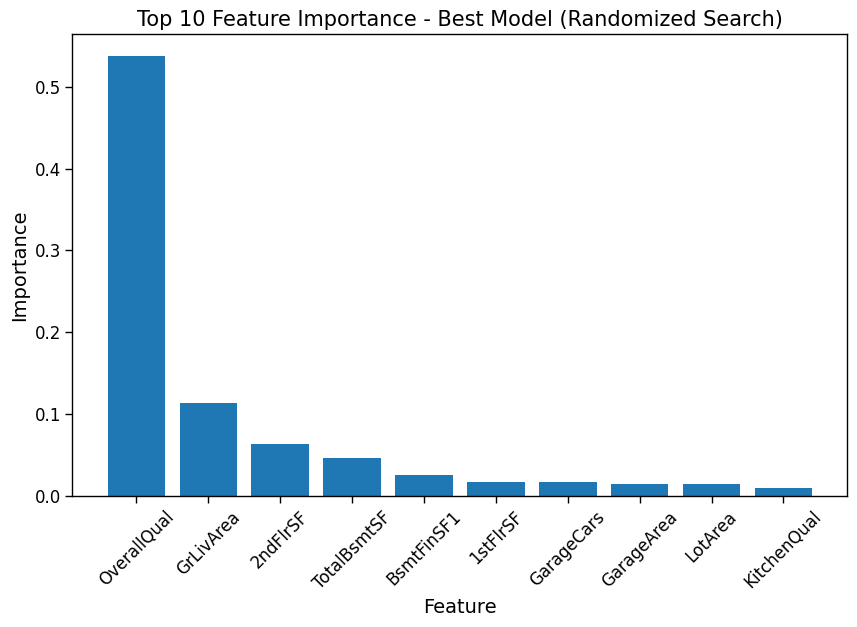

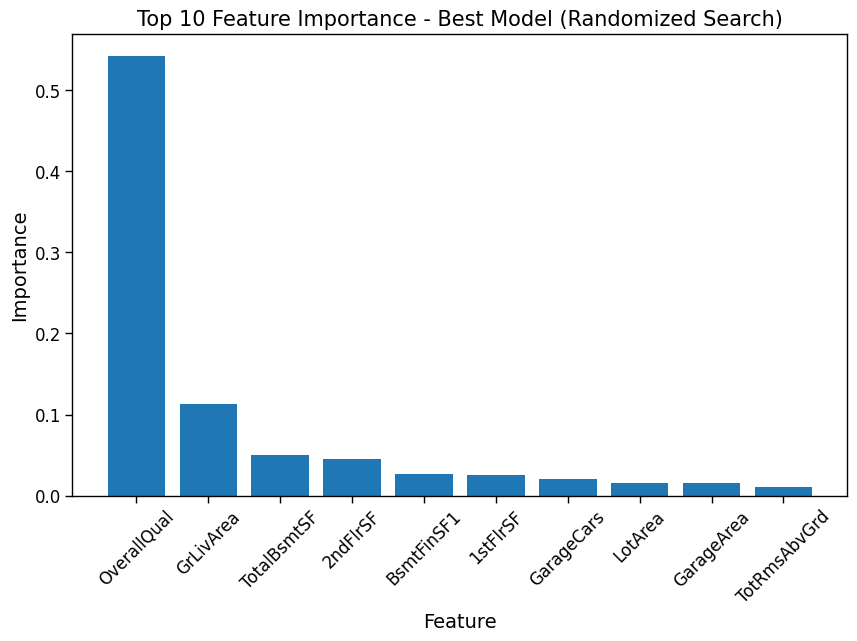

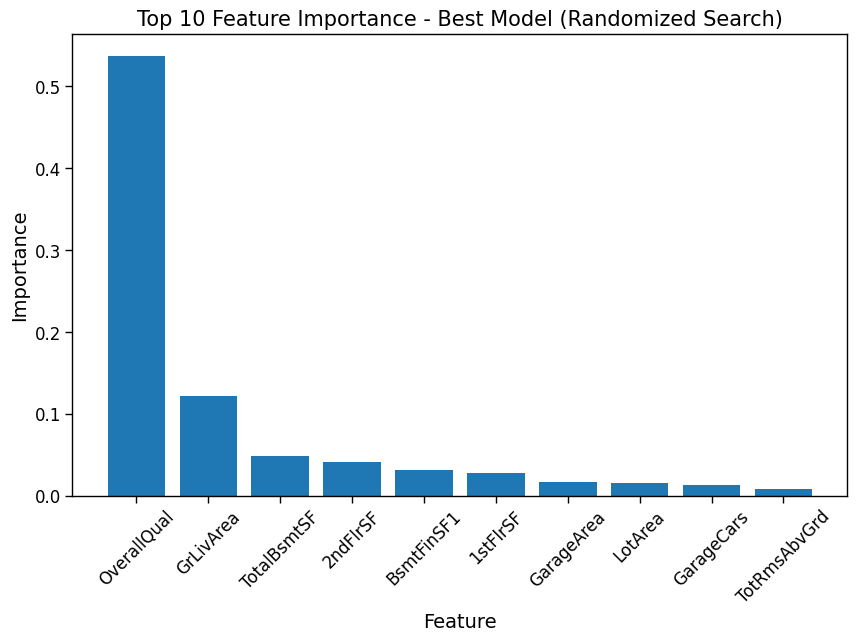

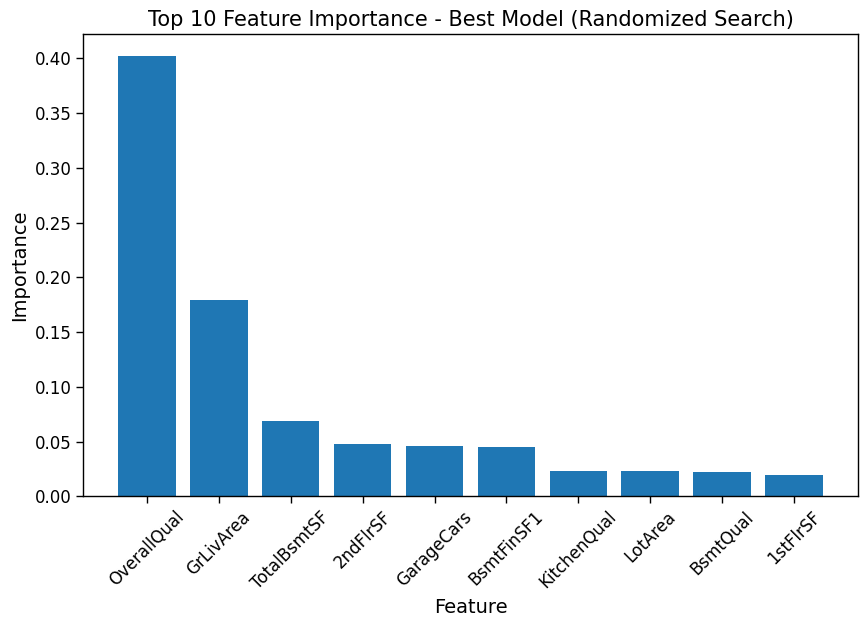

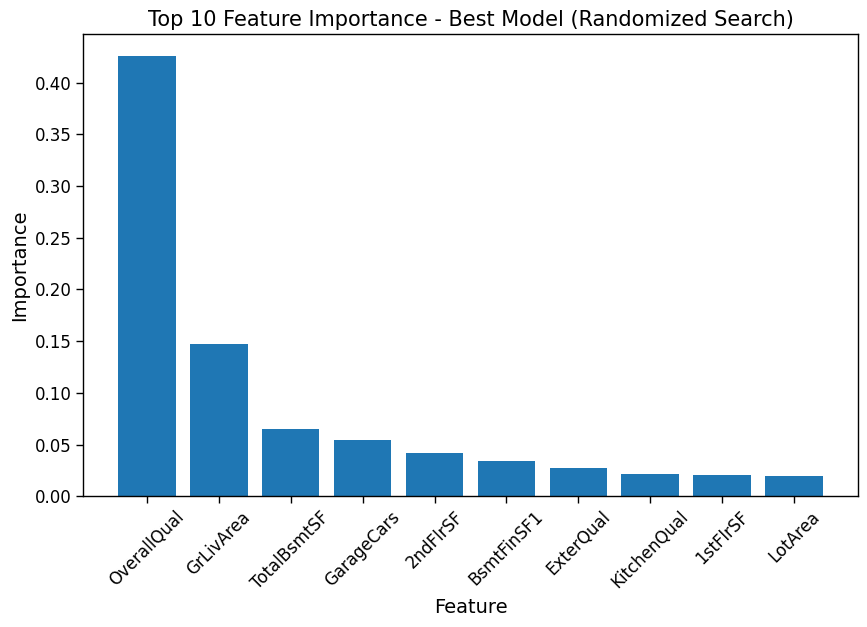

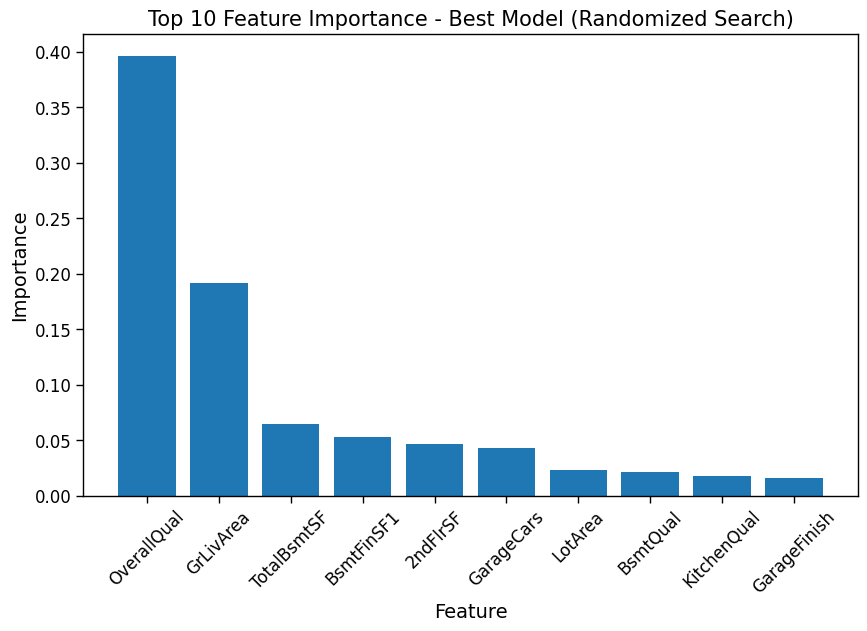

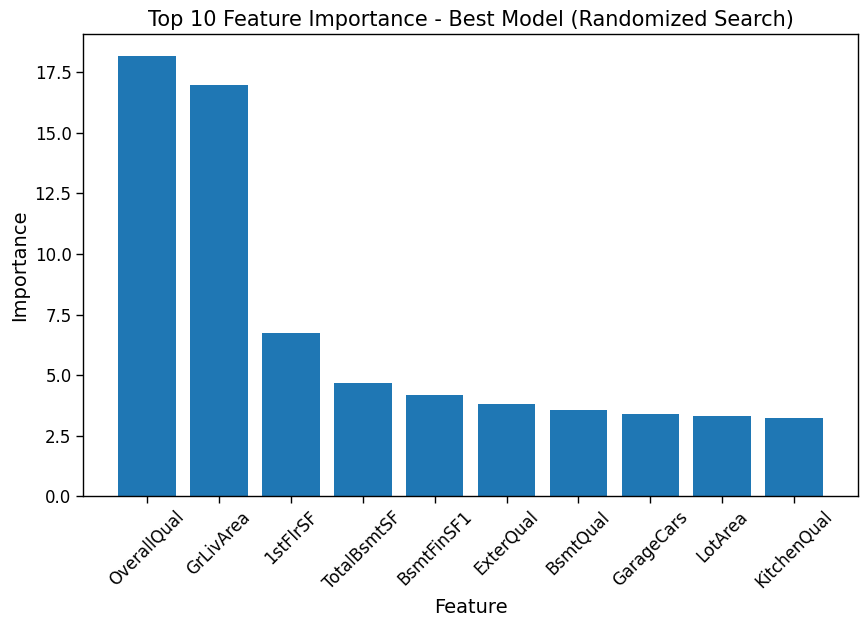

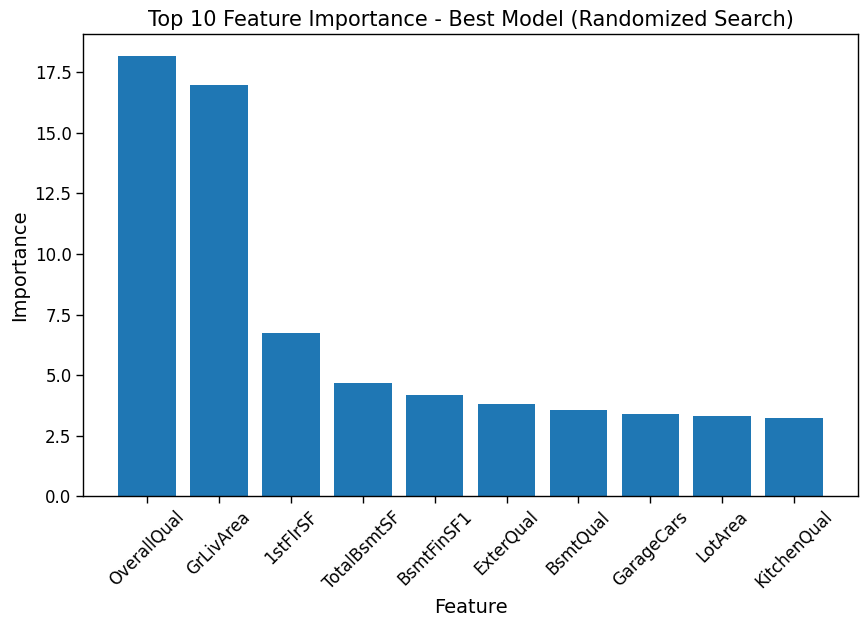

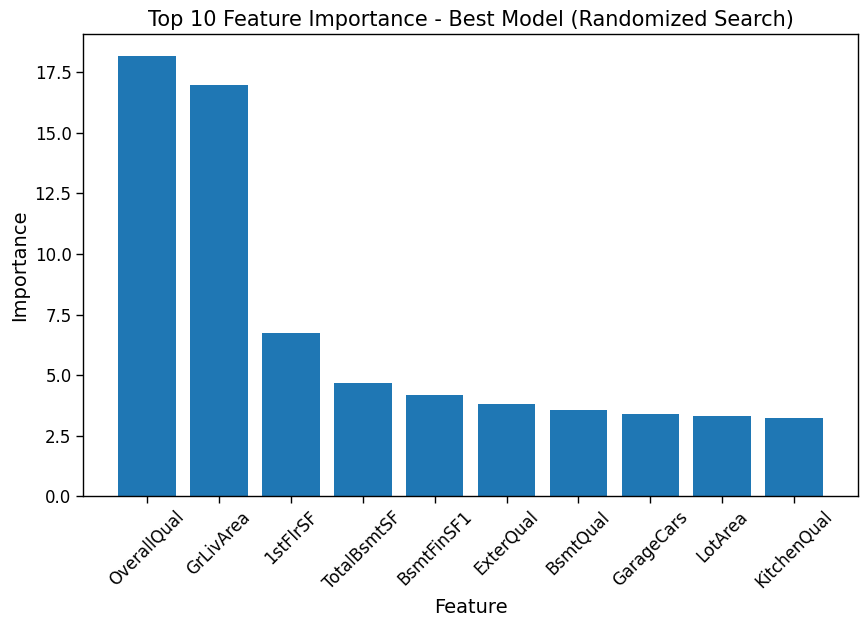

In [ ]:
feature_names = X_train.columns
for feature_importance in feature_importances_all:
    sorted_idx = np.argsort(feature_importance)[::-1]
    top_feature_indices = sorted_idx[:10]
    top_feature_names = feature_names[top_feature_indices]
    top_feature_importances = feature_importance[top_feature_indices]
    plt.figure(figsize=(10, 6))
    plt.bar(range(len(top_feature_importances)), top_feature_importances)
    plt.xticks(range(len(top_feature_importances)), top_feature_names, rotation=45)
    plt.xlabel('Feature')
    plt.ylabel('Importance')
    plt.title('Top 10 Feature Importance - Best Model (Randomized Search)')
    plt.show()

In [ ]:
for feature_importance in feature_importances_all[1:]:
    feature_importance_total = feature_importances_all[0]+feature_importance

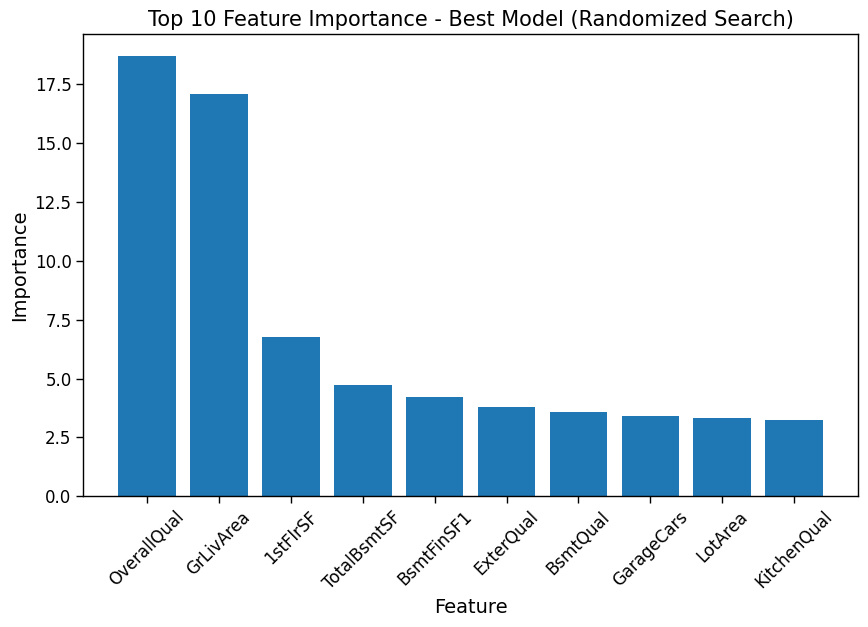

In [ ]:
sorted_idx = np.argsort(feature_importance_total)[::-1]
top_feature_indices = sorted_idx[:10]
top_feature_names = feature_names[top_feature_indices]
top_feature_importances = feature_importance_total[top_feature_indices]
plt.figure(figsize=(10, 6))
plt.bar(range(len(top_feature_importances)), top_feature_importances)
plt.xticks(range(len(top_feature_importances)), top_feature_names, rotation=45)
plt.xlabel('Feature')
plt.ylabel('Importance')
plt.title('Top 10 Feature Importance - Best Model (Randomized Search)')
plt.show()

# Second Pass - Top Features Analysis - Regression Models

## Regression Models - Top 10 Features

In [ ]:
feature_importances_all_10 = []

X_train_copy = X_train.copy()
X_test_copy = X_test.copy()
X_train_MMS_copy = X_train_MMS.copy()
X_test_MMS_copy = X_test_MMS.copy()
X_train_SS_copy = X_train_SS.copy()
X_test_SS_copy = X_test_SS.copy()

X_train = X_train[top_feature_names]
X_test = X_test[top_feature_names]
X_train_MMS = X_train_MMS[top_feature_names]
X_test_MMS = X_test_MMS[top_feature_names]
X_train_SS = X_train_SS[top_feature_names]
X_test_SS = X_test_SS[top_feature_names]

In [ ]:
reg_results_2 = pd.DataFrame([])

### Linear Regression

r2 score : 0.86
RMSE : 28805
MAE : 22154


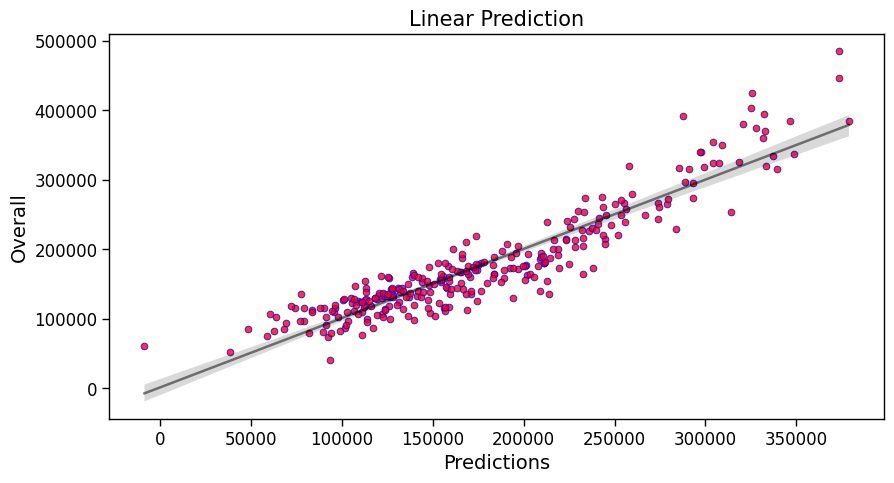

r2 score : 0.86
RMSE : 28805
MAE : 22154


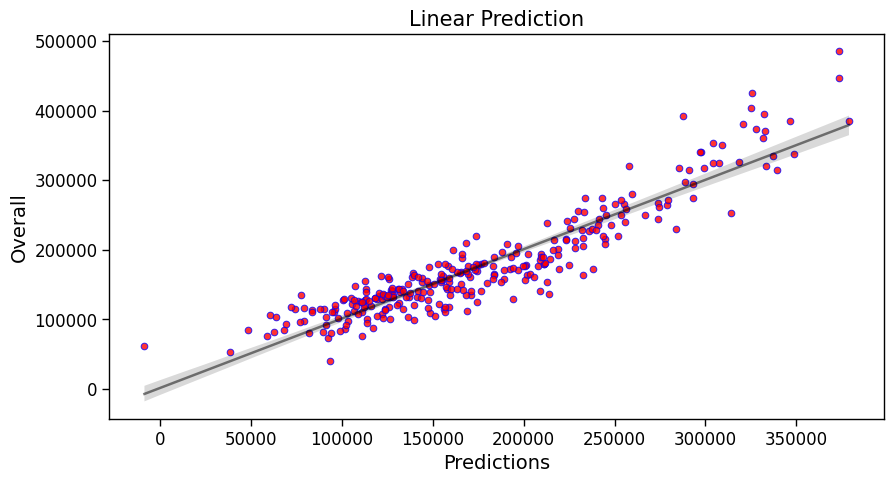

r2 score : 0.86
RMSE : 28805
MAE : 22154


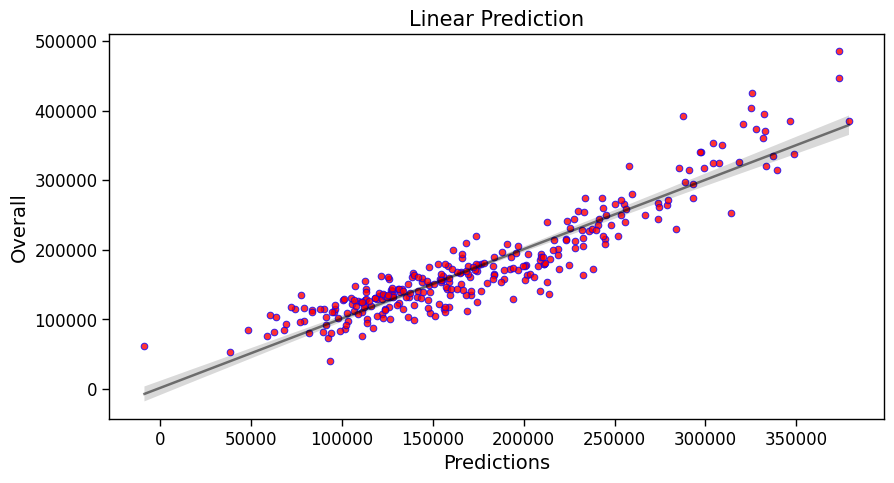

In [ ]:
start = tm.time()
results = model_run(start, LinearRegression(), X_train, X_test, y_train, y_test, 'Linear', 'Default', 'None')
reg_results_2 = pd.concat([reg_results_2, results])
start = tm.time()
results = model_run(start, LinearRegression(), X_train_MMS, X_test_MMS, y_train, y_test, 'Linear', 'Default', 'MinMax')
reg_results_2 = pd.concat([reg_results_2, results])
start = tm.time()
results = model_run(start, LinearRegression(), X_train_SS, X_test_SS, y_train, y_test, 'Linear', 'Default', 'Standard')
reg_results_2 = pd.concat([reg_results_2, results])

### Ridge Regression

r2 score : 0.86
RMSE : 28805
MAE : 22153


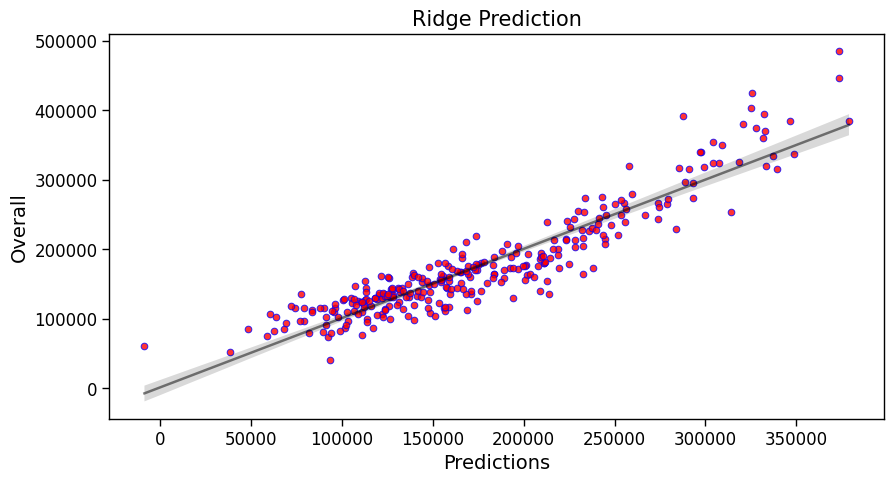

r2 score : 0.861
RMSE : 28774
MAE : 22117


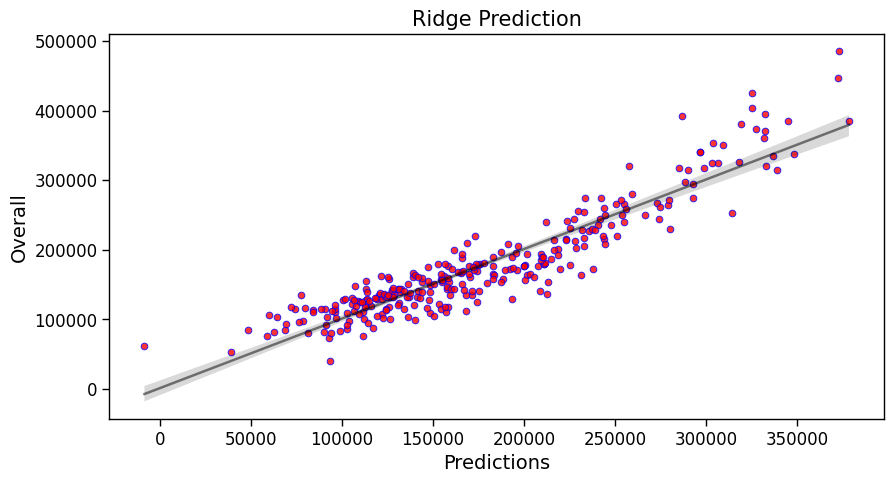

r2 score : 0.86
RMSE : 28805
MAE : 22154


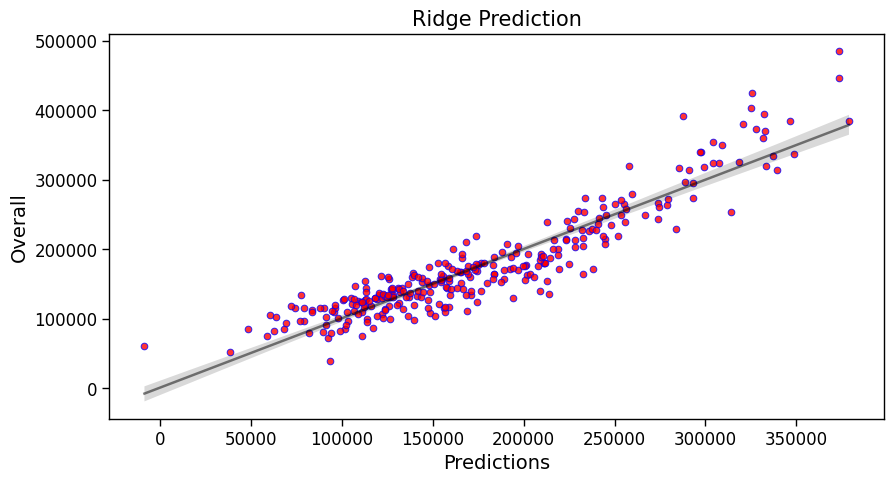

r2 score : 0.861
RMSE : 28749
MAE : 22058


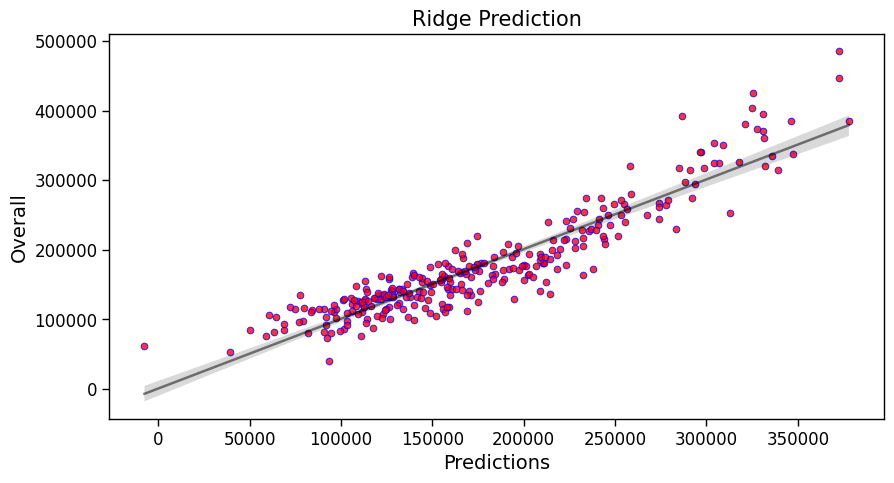

r2 score : 0.854
RMSE : 29454
MAE : 22077


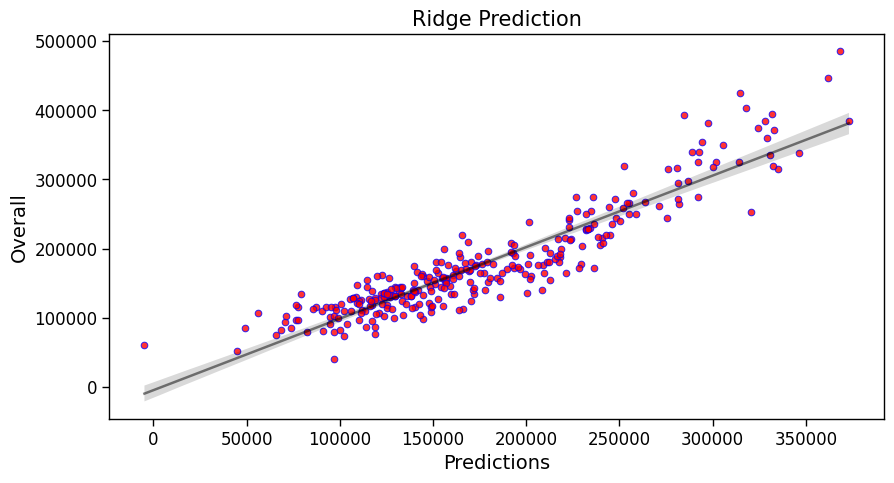

r2 score : 0.857
RMSE : 29184
MAE : 21721


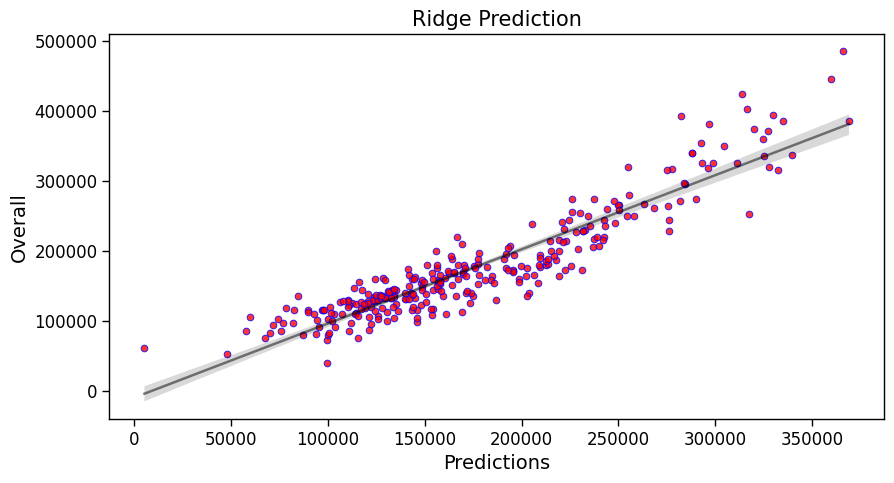

In [ ]:
start = tm.time()
results = model_run(start, Ridge(alpha=0.1), X_train, X_test, y_train, y_test, 'Ridge', 'Default', 'None')
reg_results_2 = pd.concat([reg_results_2, results])
start = tm.time()
results = model_run(start, Ridge(alpha=0.1), X_train_MMS, X_test_MMS, y_train, y_test, 'Ridge', 'Default', 'MinMax')
reg_results_2 = pd.concat([reg_results_2, results])
start = tm.time()
results = model_run(start, Ridge(alpha=0.1), X_train_SS, X_test_SS, y_train, y_test, 'Ridge', 'Default', 'Standard')
reg_results_2 = pd.concat([reg_results_2, results])

start = tm.time()
ridgeCV_model = RidgeCV(alphas=np.logspace(-1, 4, num = 1000, base = 5), scoring='r2', cv=10)
ridgeCV_model.fit(X_train, y_train)

optimal_alpha = ridgeCV_model.alpha_
ridge_alphas.append(['No scaler', optimal_alpha])

results = model_run(start, Ridge(alpha=optimal_alpha), X_train, X_test, y_train, y_test, 'Ridge', 'Optimized', 'None')
reg_results_2 = pd.concat([reg_results_2, results])

start = tm.time()
ridgeCV_model = RidgeCV(alphas = np.logspace(-1, 4, num = 1000, base = 5), scoring='r2', cv=10)
ridgeCV_model.fit(X_train_MMS, y_train)

optimal_alpha = ridgeCV_model.alpha_
ridge_alphas.append(['MinMax', optimal_alpha])

results = model_run(start, Ridge(alpha=optimal_alpha), X_train_MMS, X_test_MMS, y_train, y_test, 'Ridge', 'Optimized', 'MinMax')
reg_results_2 = pd.concat([reg_results_2, results])

start = tm.time()
ridgeCV_model = RidgeCV(alphas = np.logspace(-1, 4, num = 1000, base = 5), scoring='r2', cv=10)
ridgeCV_model.fit(X_train_SS, y_train)

optimal_alpha = ridgeCV_model.alpha_
ridge_alphas.append(['Standard', optimal_alpha])

results = model_run(start, Ridge(alpha=optimal_alpha), X_train_SS, X_test_SS, y_train, y_test, 'Ridge', 'Optimized', 'Standard')
reg_results_2 = pd.concat([reg_results_2, results])

### Lasso Regression

r2 score : 0.86
RMSE : 28805
MAE : 22154


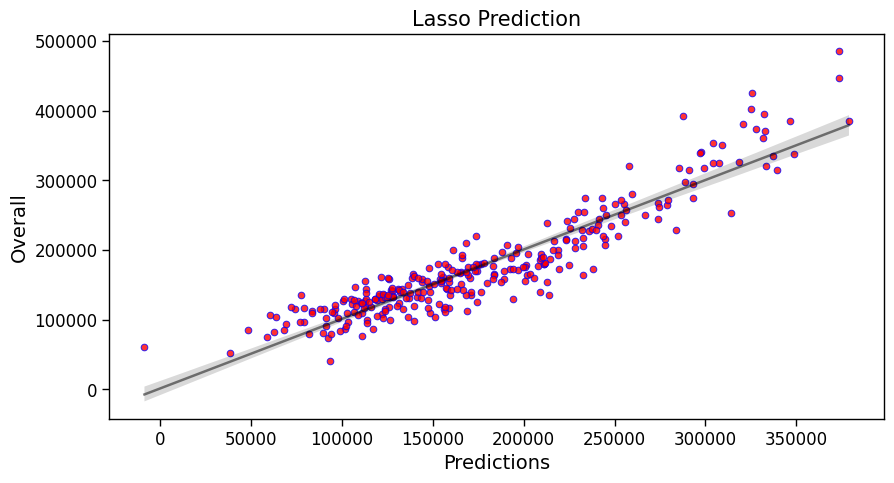

r2 score : 0.86
RMSE : 28804
MAE : 22153


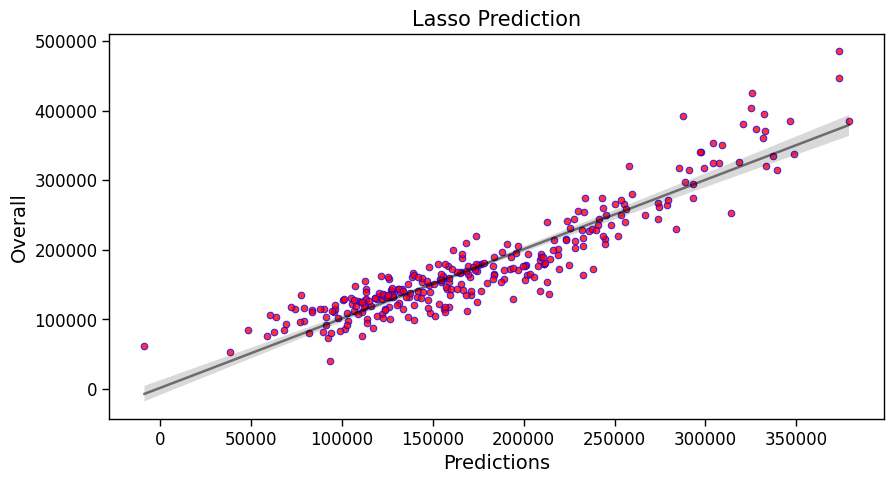

r2 score : 0.86
RMSE : 28805
MAE : 22154


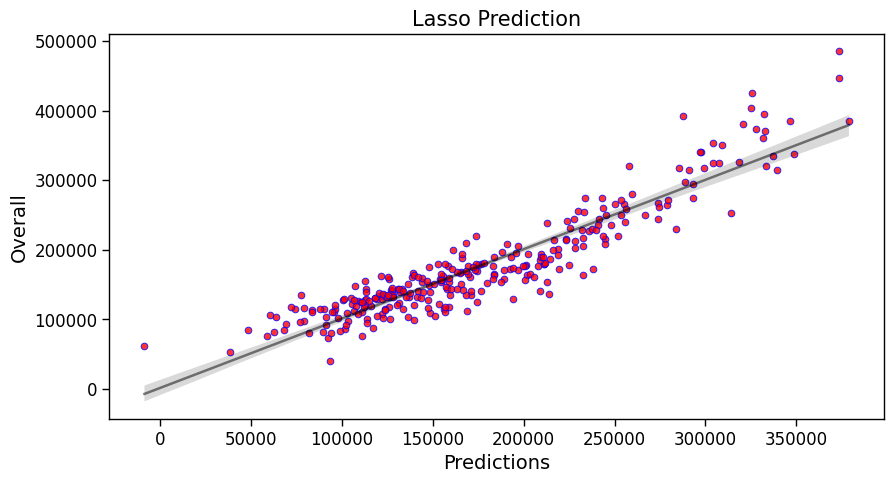

r2 score : 0.86
RMSE : 28805
MAE : 22154


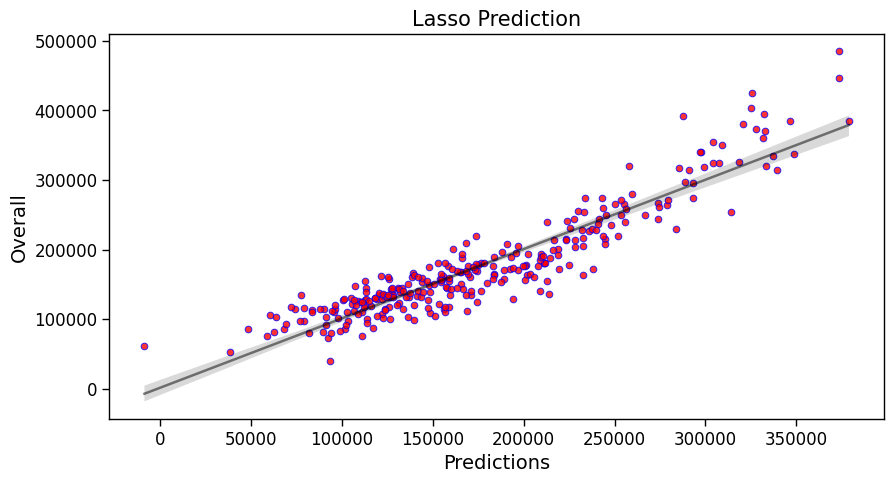

r2 score : 0.861
RMSE : 28703
MAE : 21950


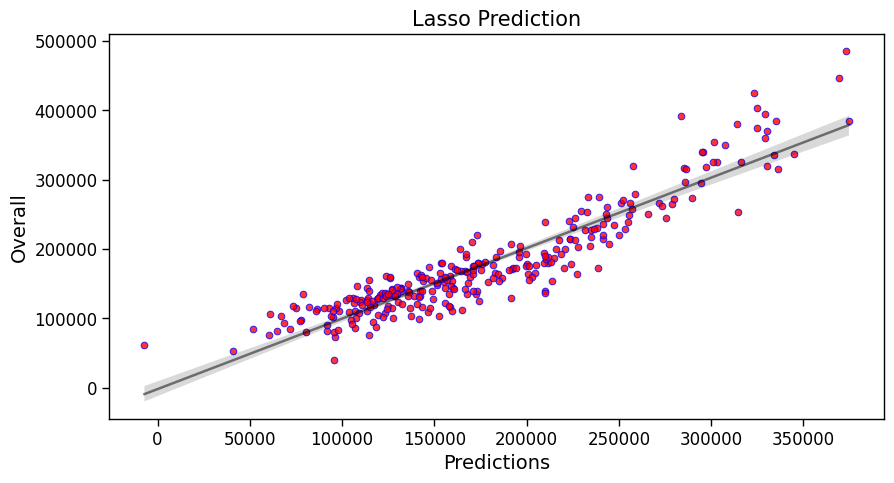

r2 score : 0.862
RMSE : 28648
MAE : 21902


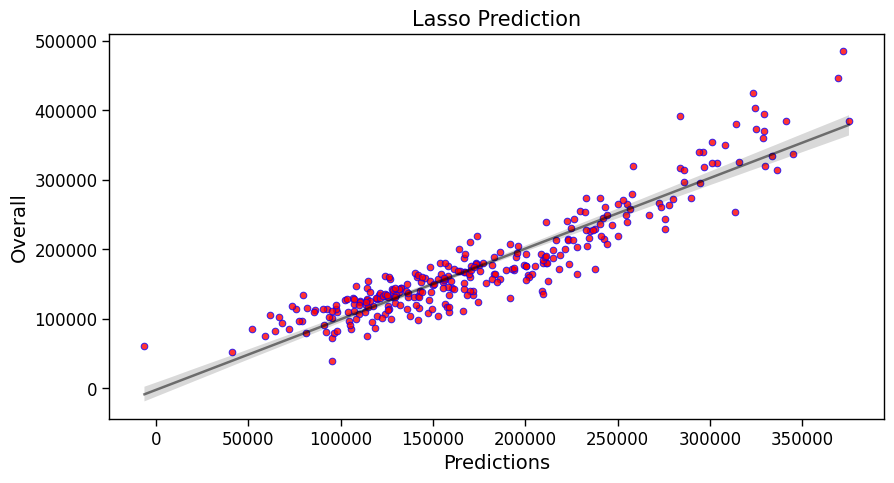

In [ ]:
start = tm.time()
results = model_run(start, Lasso(alpha=0.1), X_train, X_test, y_train, y_test, 'Lasso', 'Default', 'None')
reg_results_2 = pd.concat([reg_results_2, results])
start = tm.time()
results = model_run(start, Lasso(alpha=0.1), X_train_MMS, X_test_MMS, y_train, y_test, 'Lasso', 'Default', 'MinMax')
reg_results_2 = pd.concat([reg_results_2, results])
start = tm.time()
results = model_run(start, Lasso(alpha=0.1), X_train_SS, X_test_SS, y_train, y_test, 'Lasso', 'Default', 'Standard')
reg_results_2 = pd.concat([reg_results_2, results])

start = tm.time()
lassoCV_model = LassoCV(alphas = np.logspace(-1, 4, num = 1000, base = 5), cv=10, random_state=0)
lassoCV_model.fit(X_train, y_train)

optimal_alpha = lassoCV_model.alpha_
lasso_alphas.append(['No scaler', optimal_alpha])

results = model_run(start, Lasso(alpha=optimal_alpha), X_train, X_test, y_train, y_test, 'Lasso', 'Optimized', 'None')
reg_results_2 = pd.concat([reg_results_2, results])

start = tm.time()
lassoCV_model = LassoCV(alphas = np.logspace(-1, 4, num = 1000, base = 5), cv=10, random_state=0)
lassoCV_model.fit(X_train_MMS, y_train)

optimal_alpha = lassoCV_model.alpha_
lasso_alphas.append(['MinMax', optimal_alpha])

results = model_run(start, Lasso(alpha=optimal_alpha), X_train_MMS, X_test_MMS, y_train, y_test, 'Lasso', 'Optimized', 'MinMax')
reg_results_2 = pd.concat([reg_results_2, results])

start = tm.time()
lassoCV_model = LassoCV(alphas = np.logspace(-1, 4, num = 1000, base = 5), cv=10, random_state=0)
lassoCV_model.fit(X_train_SS, y_train)

optimal_alpha = lassoCV_model.alpha_
lasso_alphas.append(['Standard', optimal_alpha])

results = model_run(start, Lasso(alpha=optimal_alpha), X_train_SS, X_test_SS, y_train, y_test, 'Lasso', 'Optimized', 'Standard')
reg_results_2 = pd.concat([reg_results_2, results])

### Polynomial Regression

r2 score : 0.893
RMSE : 25234
MAE : 18731


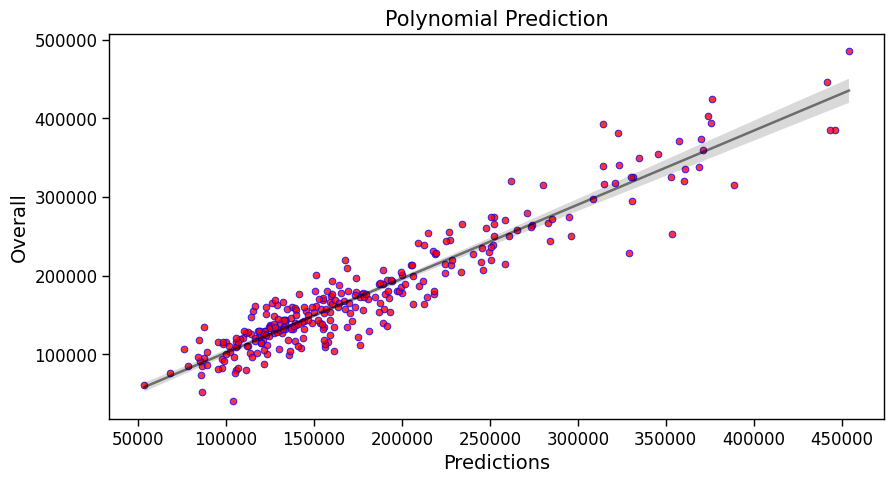

r2 score : 0.893
RMSE : 25234
MAE : 18731


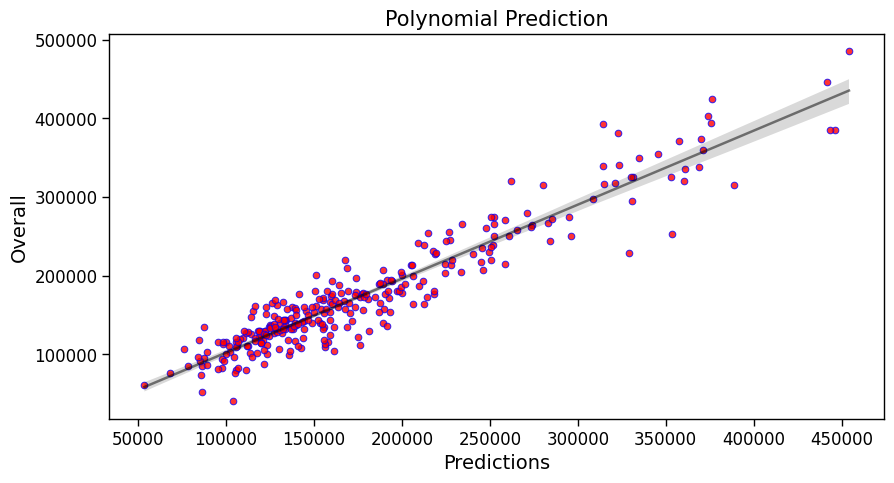

r2 score : 0.893
RMSE : 25234
MAE : 18731


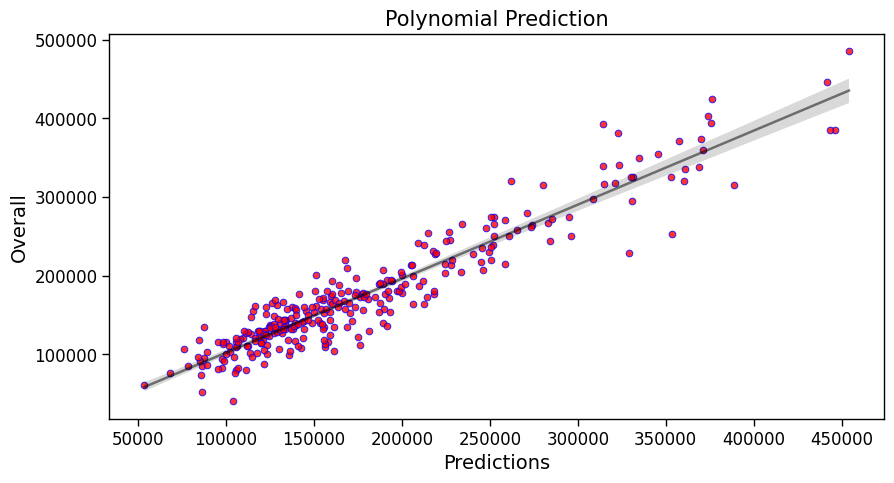

r2 score : 0.893
RMSE : 25234
MAE : 18731


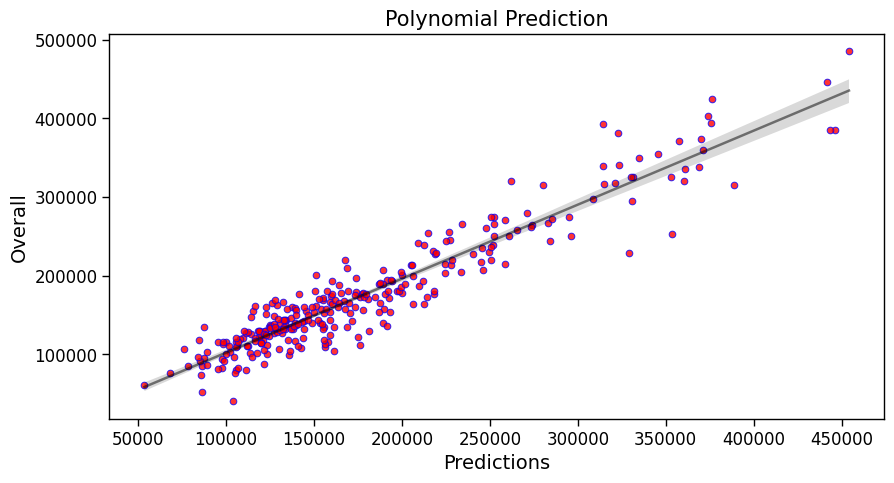

   Parameter        r2     RMSE     MAE
0          1     0.860    28805   22154
0          2     0.893    25234   18731
0          3    -0.660    99281   30216
0          4 -1096.428  2552630  193864
r2 score : 0.893
RMSE : 25234
MAE : 18731


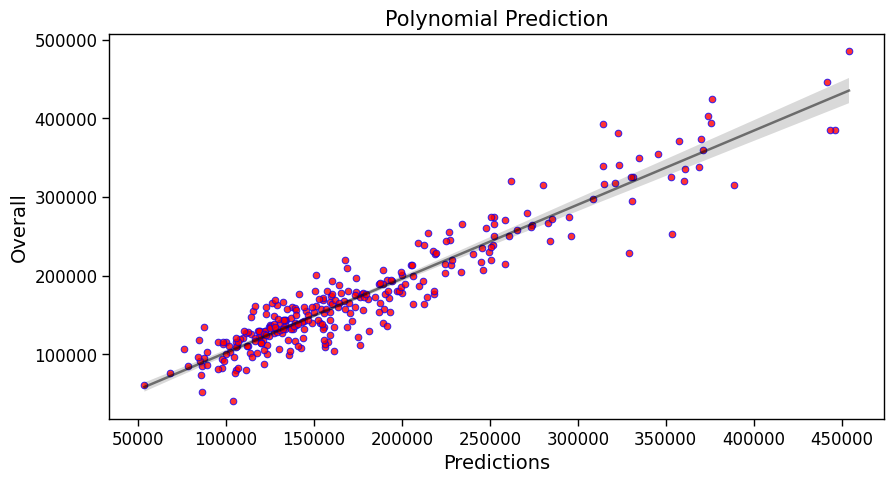

   Parameter                    r2           RMSE           MAE
0          1                 0.860          28805         22154
0          2                 0.893          25234         18731
0          3                -0.069          79664         29671
0          4 -2579273675531019.500  3913348530127  514070377462
0          5   -35036673465552.195   456101235508   58662302289
r2 score : 0.893
RMSE : 25234
MAE : 18731


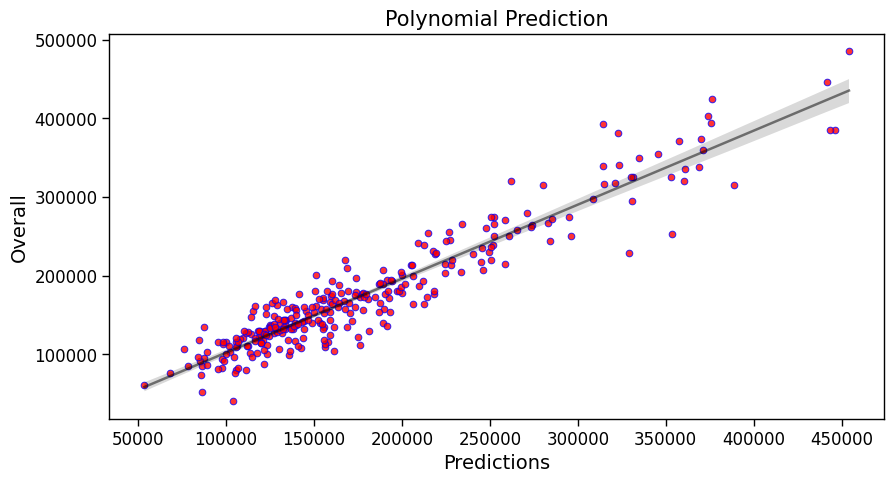

   Parameter         r2      RMSE      MAE
0          1      0.860     28805    22154
0          2      0.893     25234    18731
0          3     -0.069     79664    29671
0          4 -47342.768  16766068  4657516


In [ ]:
polynomial_features= PolynomialFeatures()

X_train_poly = polynomial_features.fit_transform(X_train)
X_test_poly  = polynomial_features.transform(X_test)
X_train_poly_MMS = polynomial_features.fit_transform(X_train_MMS)
X_test_poly_MMS  = polynomial_features.transform(X_test_MMS)
X_train_poly_SS = polynomial_features.fit_transform(X_train_SS)
X_test_poly_SS  = polynomial_features.transform(X_test_SS)

start = tm.time()
results = model_run(start, LinearRegression(), X_train_poly, X_test_poly, y_train, y_test, 'Polynomial', 'Default', 'None')
reg_results_2 = pd.concat([reg_results_2, results])
start = tm.time()
results = model_run(start, LinearRegression(), X_train_poly_MMS, X_test_poly_MMS, y_train, y_test, 'Polynomial', 'Default', 'MinMax')
reg_results_2 = pd.concat([reg_results_2, results])
start = tm.time()
results = model_run(start, LinearRegression(), X_train_poly_SS, X_test_poly_SS, y_train, y_test, 'Polynomial', 'Default', 'Standard')
reg_results_2 = pd.concat([reg_results_2, results])

start = tm.time()
t_degree, tune_results = opti_poly(4, X_train, X_test, y_train, y_test)
X_train_poly, X_test_poly = poly_fit(t_degree, X_train, X_test)
results = model_run(start, LinearRegression(), X_train_poly, X_test_poly, y_train, y_test, 'Polynomial', 'Optimized', 'None')
reg_results = pd.concat([reg_results, results])
print(tune_results)
start = tm.time()
t_degree, tune_results = opti_poly(5, X_train_MMS, X_test_MMS, y_train, y_test)
X_train_poly, X_test_poly = poly_fit(t_degree, X_train_MMS, X_test_MMS)
results = model_run(start, LinearRegression(), X_train_poly, X_test_poly, y_train, y_test, 'Polynomial', 'Optimized', 'MinMax')
reg_results = pd.concat([reg_results, results])
print(tune_results)
start = tm.time()
t_degree, tune_results = opti_poly(4, X_train_SS, X_test_SS, y_train, y_test)
X_train_poly, X_test_poly = poly_fit(t_degree, X_train_MMS, X_test_MMS)
results = model_run(start, LinearRegression(), X_train_poly, X_test_poly, y_train, y_test, 'Polynomial', 'Optimized', 'Standard')
reg_results = pd.concat([reg_results, results])
print(tune_results)

### Random Forest

r2 score : 0.883
RMSE : 26309
MAE : 19065


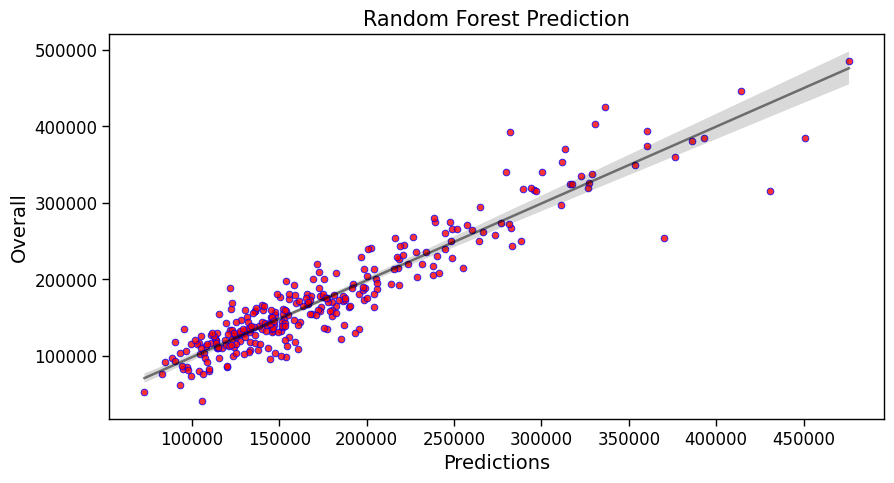

r2 score : 0.883
RMSE : 26323
MAE : 19062


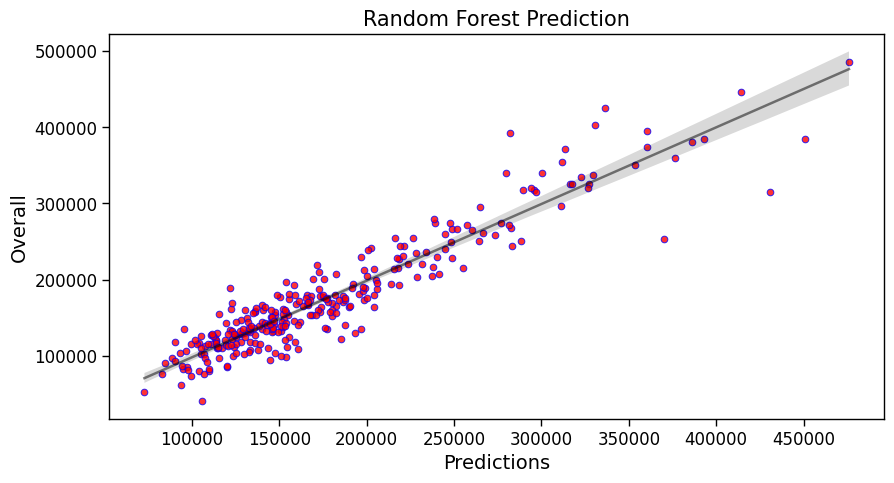

r2 score : 0.883
RMSE : 26331
MAE : 19079


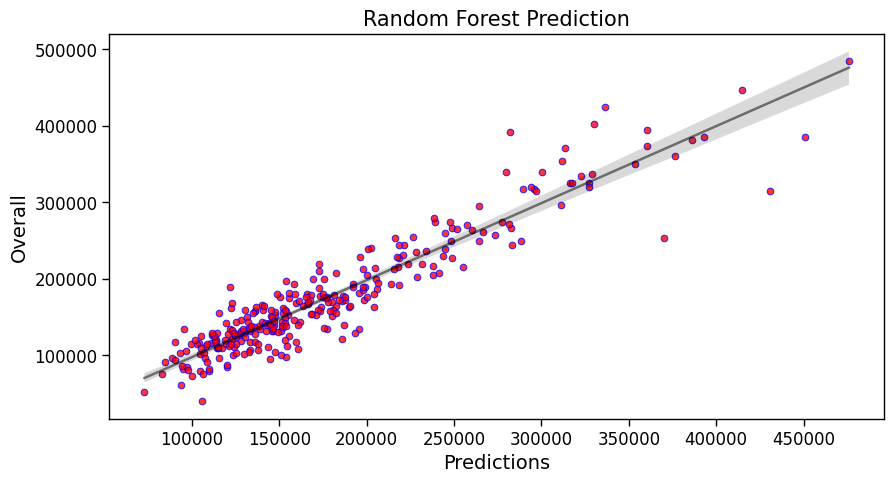

r2 score : 0.879
RMSE : 26843
MAE : 19527


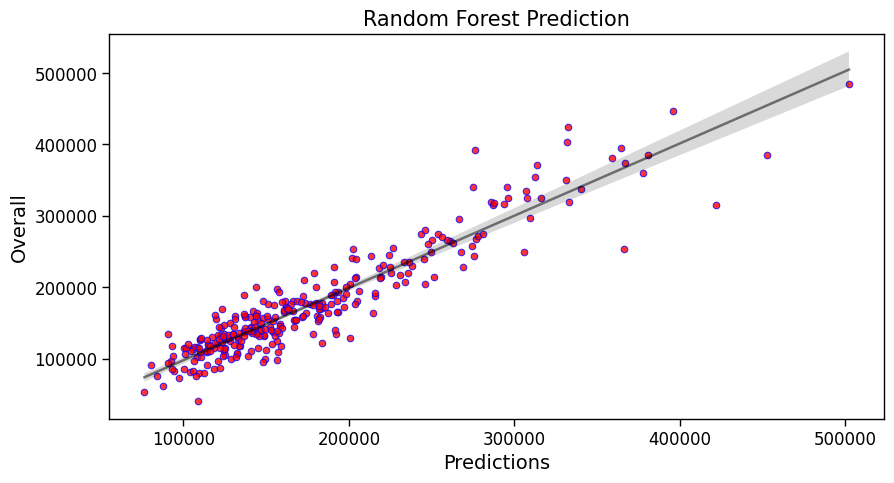

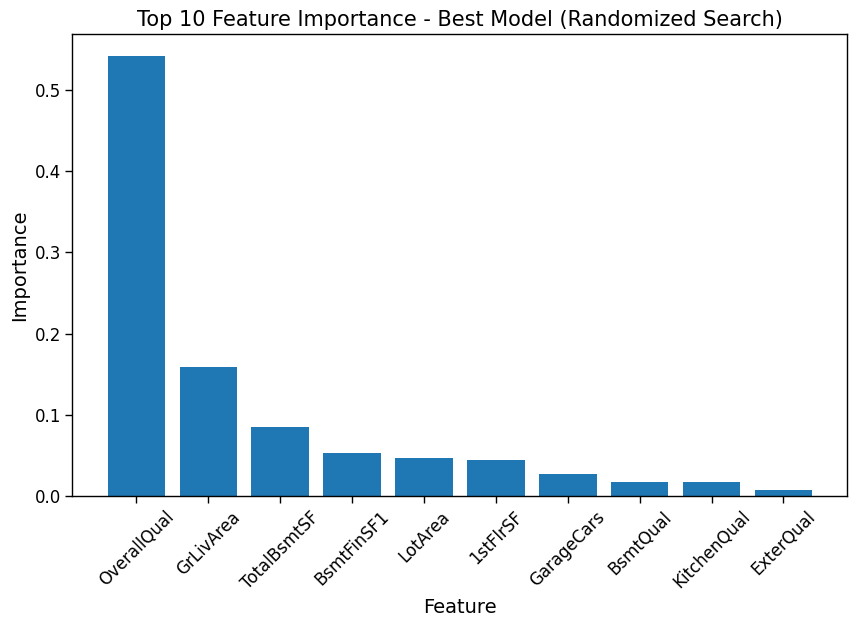

r2 score : 0.882
RMSE : 26517
MAE : 19050


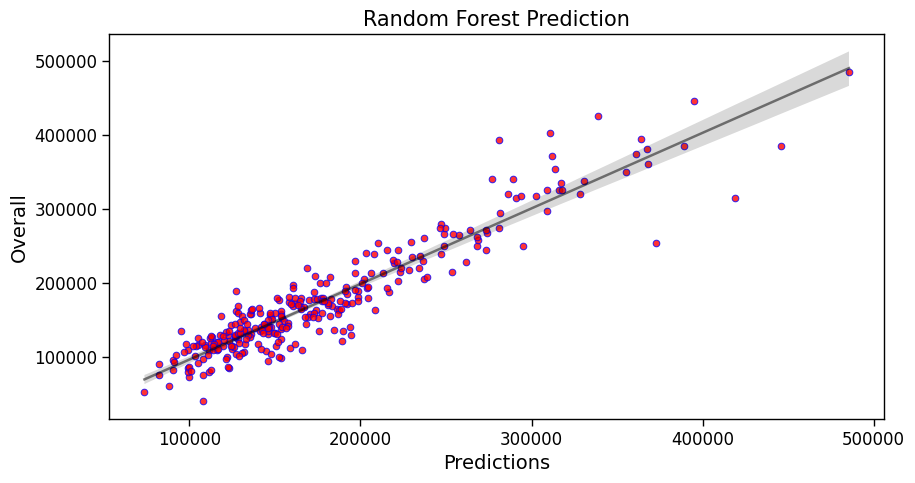

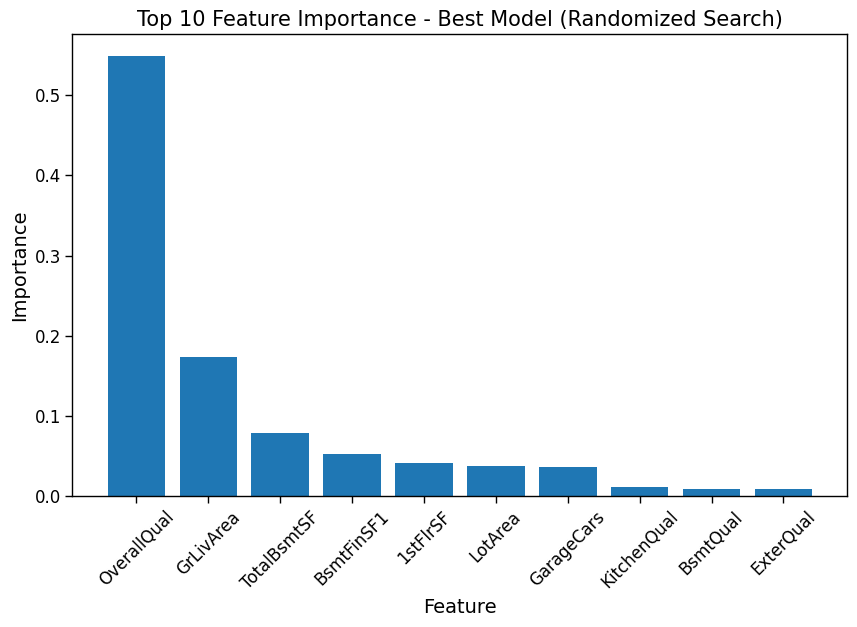

r2 score : 0.885
RMSE : 26169
MAE : 18833


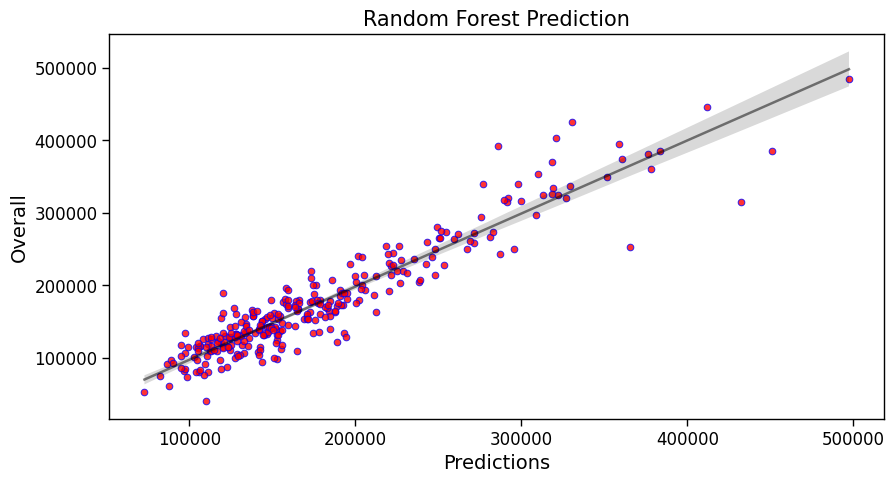

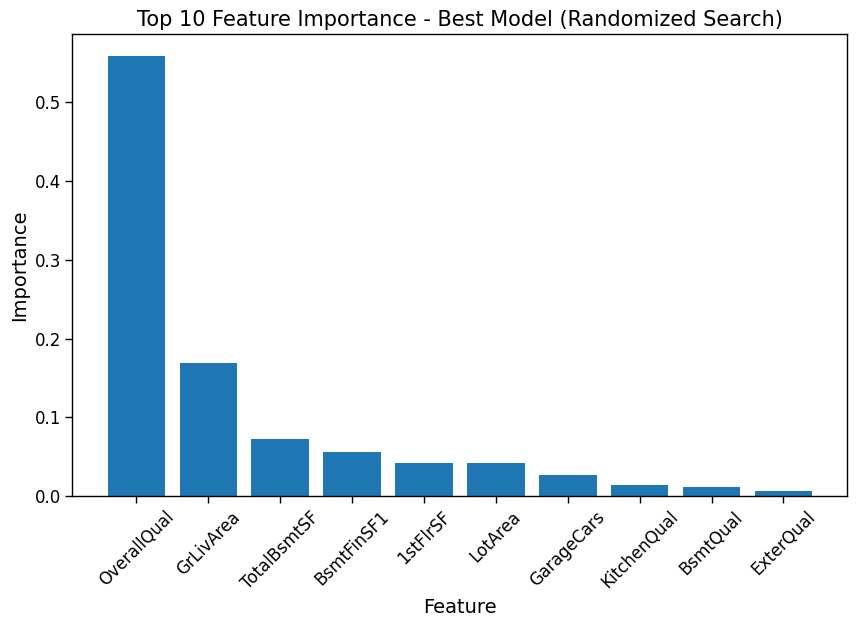

In [ ]:
start = tm.time()
results = model_run(start, RandomForestRegressor(random_state=0), X_train, X_test, y_train, y_test, 'Random Forest', 'Default', 'None')
reg_results_2 = pd.concat([reg_results_2, results])
start = tm.time()
results = model_run(start, RandomForestRegressor(random_state=0), X_train_MMS, X_test_MMS, y_train, y_test, 'Random Forest', 'Default', 'MinMax')
reg_results_2 = pd.concat([reg_results_2, results])
start = tm.time()
results = model_run(start, RandomForestRegressor(random_state=0), X_train_SS, X_test_SS, y_train, y_test, 'Random Forest', 'Default', 'Standard')
reg_results_2 = pd.concat([reg_results_2, results])

rf_best_params = []

random_grid = {'n_estimators': [int(x) for x in np.linspace(10,200,10)],
            'max_depth': [int(x) for x in np.linspace(10,100,10)],
            'min_samples_split': [2,3,4,5,10],
            'min_samples_leaf':  [1,2,4,10,15,20]}

n_iters = 60

start = tm.time()
rf_random = rf_optimize(random_grid, n_iters, X_train, y_train, 'None')

results = model_run(start, rf_random.best_estimator_, X_train, X_test, y_train, y_test, 'Random Forest', 'Optimized', 'None')
reg_results_2 = pd.concat([reg_results_2, results])

save_feature_importance(rf_random.best_estimator_, feature_importances_all_10)

start = tm.time()
rf_random = rf_optimize(random_grid, n_iters, X_train_MMS, y_train, 'MinMax')

results = model_run(start, rf_random.best_estimator_, X_train_MMS, X_test_MMS, y_train, y_test, 'Random Forest', 'Optimized', 'MinMax')
reg_results_2 = pd.concat([reg_results_2, results])

save_feature_importance(rf_random.best_estimator_, feature_importances_all_10)

start = tm.time()
rf_random = rf_optimize(random_grid, n_iters, X_train_SS, y_train, 'Standard')

results = model_run(start, rf_random.best_estimator_, X_train_SS, X_test_SS, y_train, y_test, 'Random Forest', 'Optimized', 'Standard')
reg_results_2 = pd.concat([reg_results_2, results])

save_feature_importance(rf_random.best_estimator_, feature_importances_all_10)

### Gradient Boosting

r2 score : 0.896
RMSE : 24848
MAE : 18154


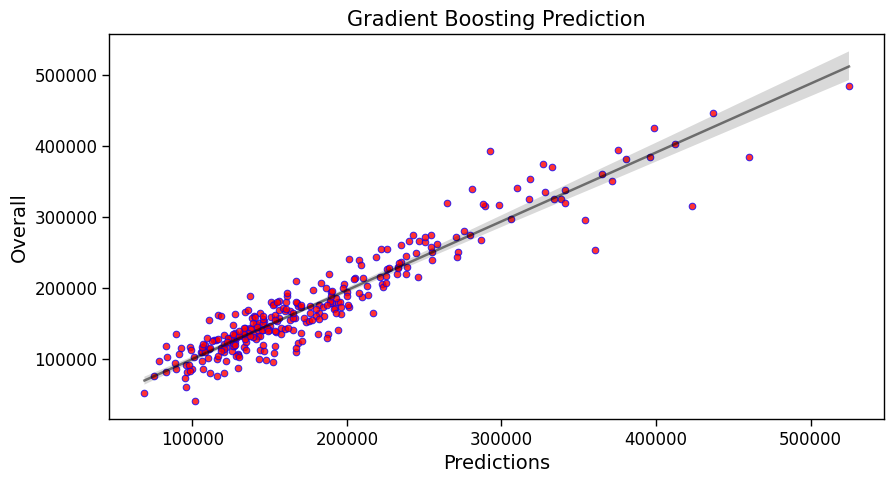

r2 score : 0.896
RMSE : 24865
MAE : 18177


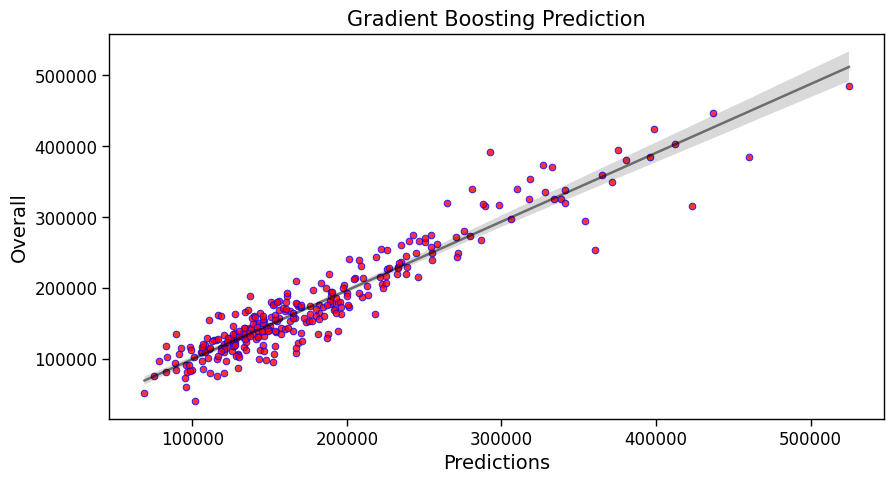

r2 score : 0.896
RMSE : 24848
MAE : 18154


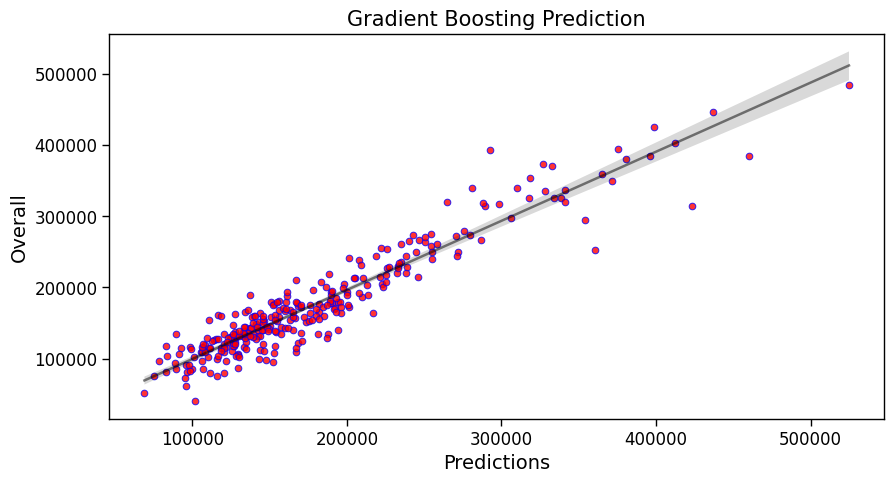

r2 score : 0.881
RMSE : 26526
MAE : 18770


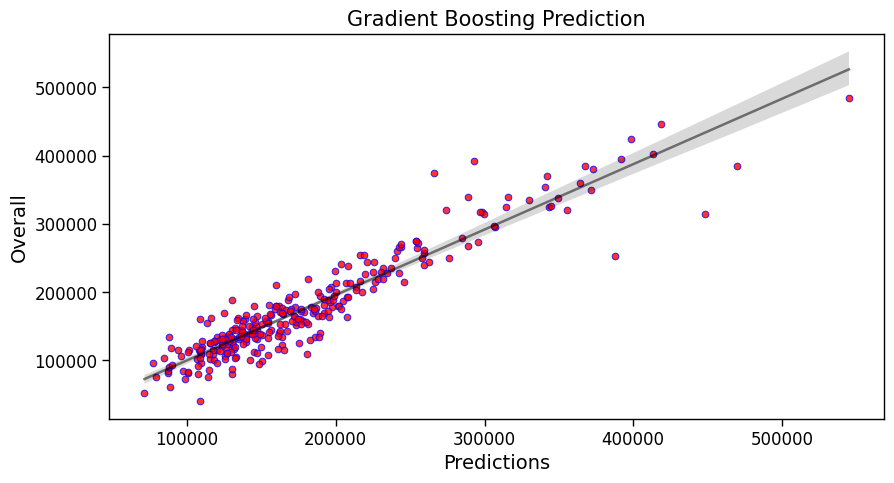

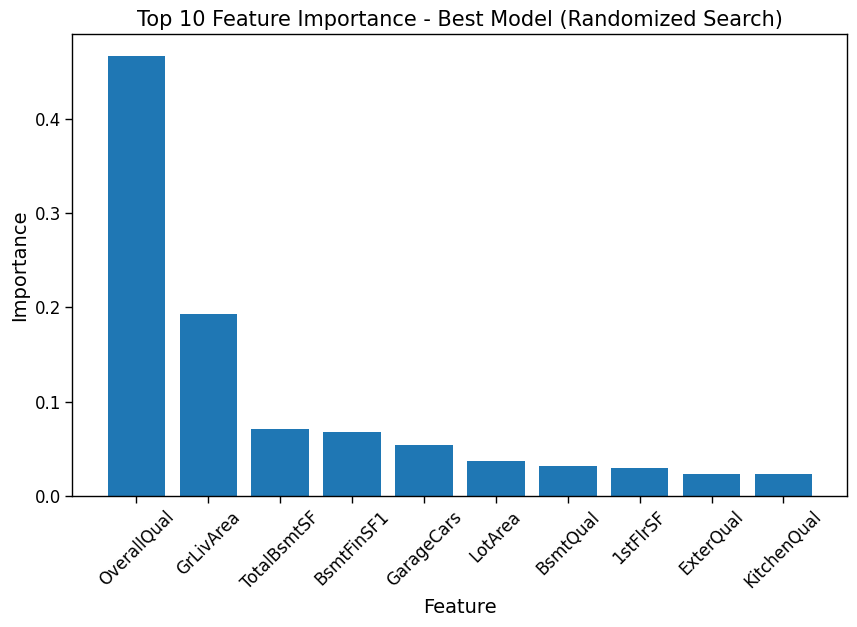

r2 score : 0.892
RMSE : 25305
MAE : 18150


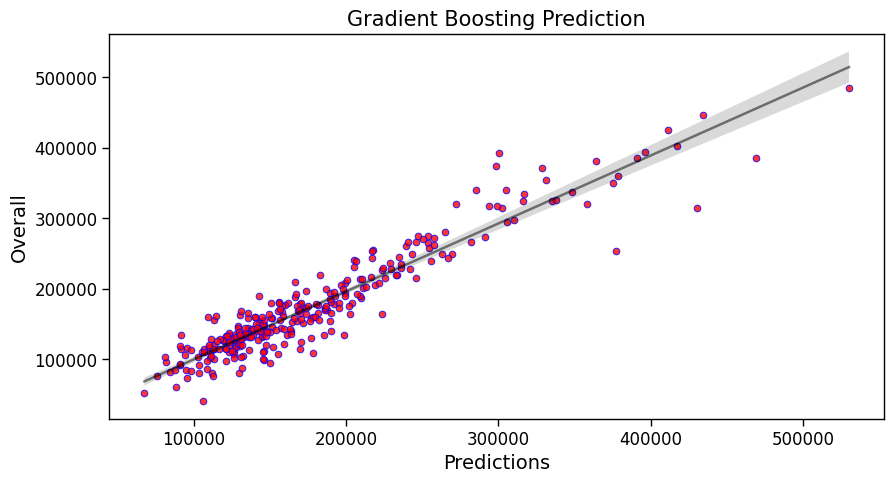

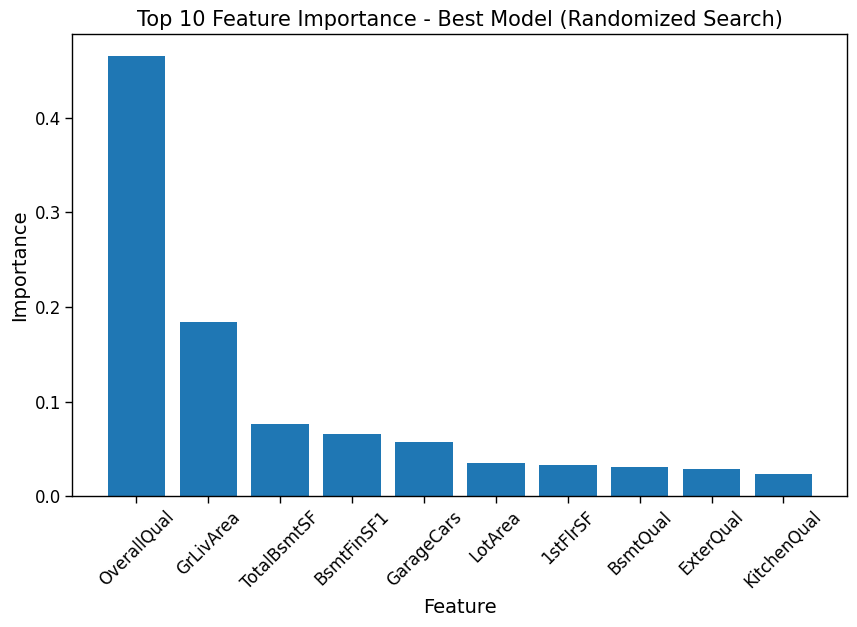

r2 score : 0.897
RMSE : 24742
MAE : 18094


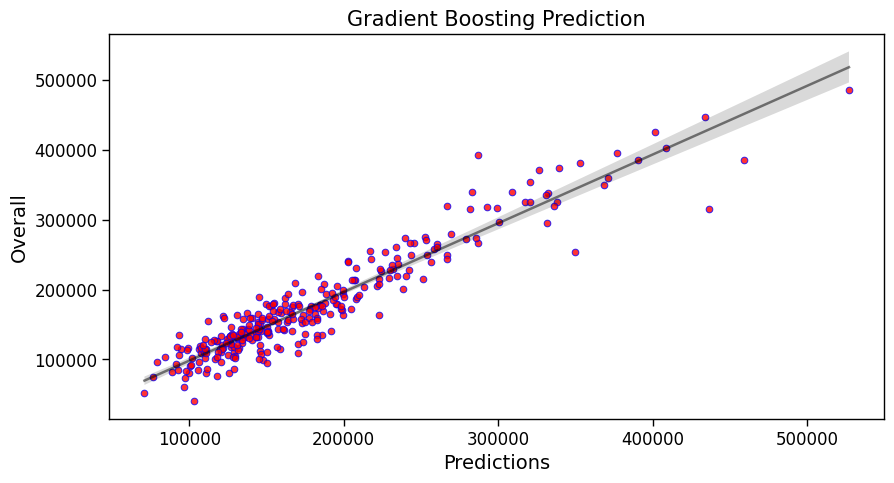

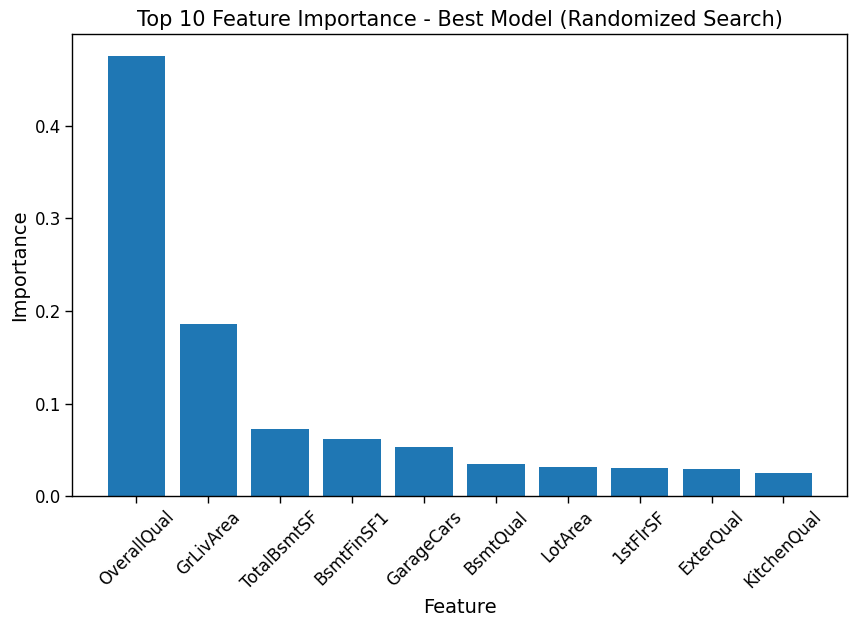

In [ ]:
start = tm.time()
results = model_run(start, GradientBoostingRegressor(random_state=0), X_train, X_test, y_train, y_test, 'Gradient Boosting', 'Default', 'None')
reg_results_2 = pd.concat([reg_results_2, results])
start = tm.time()
results = model_run(start, GradientBoostingRegressor(random_state=0), X_train_MMS, X_test_MMS, y_train, y_test, 'Gradient Boosting', 'Default', 'MinMax')
reg_results_2 = pd.concat([reg_results_2, results])
start = tm.time()
results = model_run(start, GradientBoostingRegressor(random_state=0), X_train_SS, X_test_SS, y_train, y_test, 'Gradient Boosting', 'Default', 'Standard')
reg_results_2 = pd.concat([reg_results_2, results])

GB_best_params = []

random_grid = {
            "n_estimators": [3, 10, 30, 100, 300, 1000],
            "max_depth": [2, 3, 10, 20, 50, 100],
            "learning_rate": loguniform(0.01, 1),}


start = tm.time()
GB_random = GB_optimize(random_grid, n_iters, X_train, y_train, 'None')

results = model_run(start, GB_random.best_estimator_, X_train, X_test, y_train, y_test, 'Gradient Boosting', 'Optimized', 'None')
reg_results_2 = pd.concat([reg_results_2, results])
save_feature_importance(GB_random.best_estimator_, feature_importances_all_10)

start = tm.time()
GB_random = GB_optimize(random_grid, n_iters, X_train_MMS, y_train, 'MinMax')

results = model_run(start, GB_random.best_estimator_, X_train_MMS, X_test_MMS, y_train, y_test, 'Gradient Boosting', 'Optimized', 'MinMax')
reg_results_2 = pd.concat([reg_results_2, results])
save_feature_importance(GB_random.best_estimator_, feature_importances_all_10)

start = tm.time()
GB_random = GB_optimize(random_grid, n_iters, X_train_SS, y_train, 'Standard')

results = model_run(start, GB_random.best_estimator_, X_train_SS, X_test_SS, y_train, y_test, 'Gradient Boosting', 'Optimized', 'Standard')
reg_results_2 = pd.concat([reg_results_2, results])
save_feature_importance(GB_random.best_estimator_, feature_importances_all_10)

### Histogram Gradient Boosting

r2 score : 0.892
RMSE : 25375
MAE : 17960


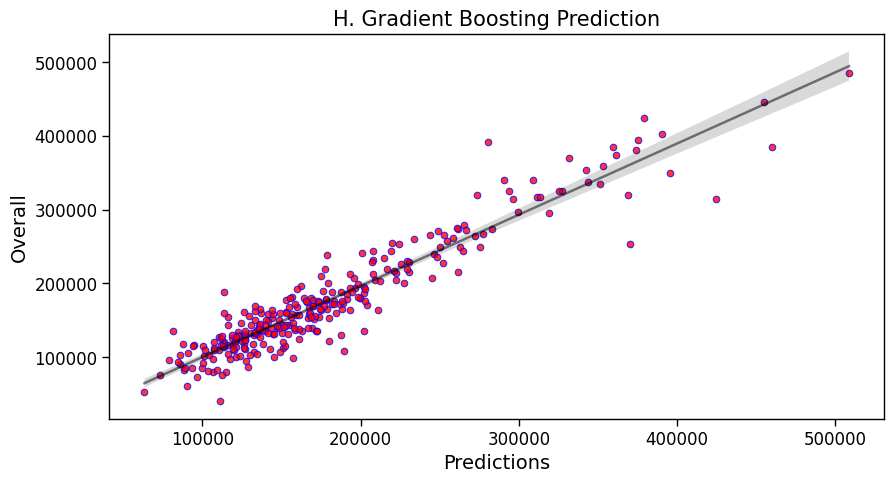

r2 score : 0.892
RMSE : 25381
MAE : 17976


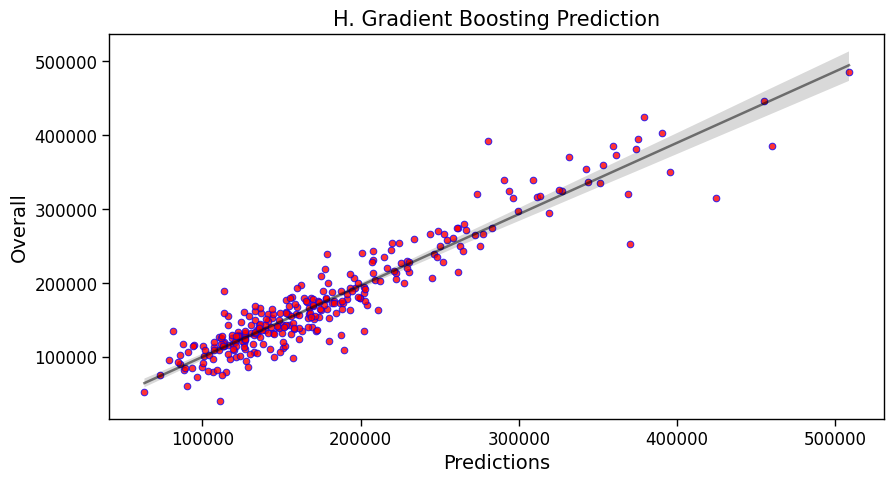

r2 score : 0.892
RMSE : 25376
MAE : 17961


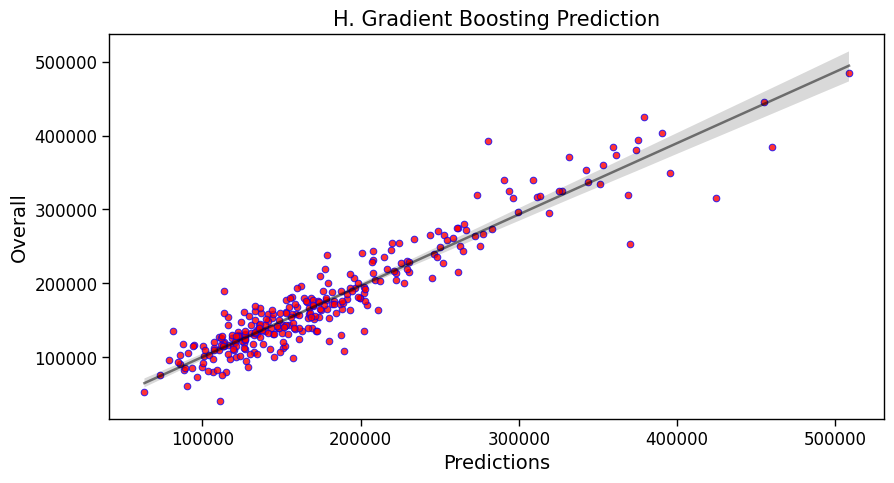

r2 score : 0.893
RMSE : 25235
MAE : 18196


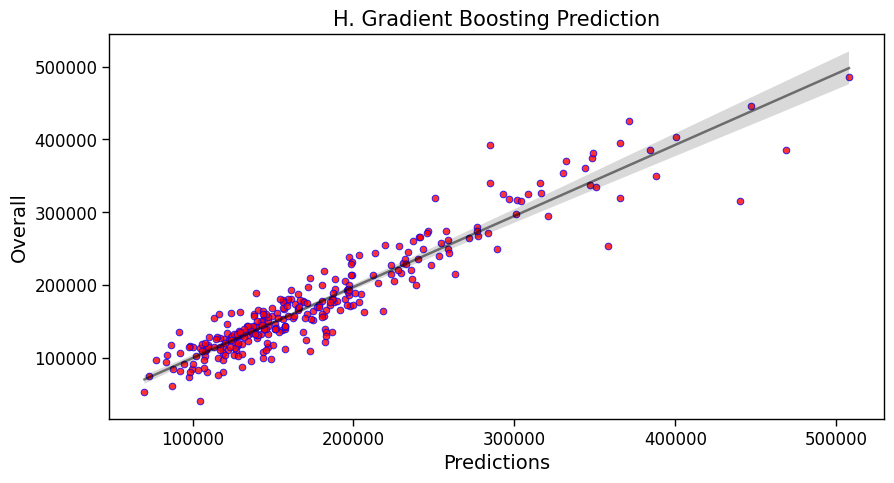

r2 score : 0.889
RMSE : 25675
MAE : 18432


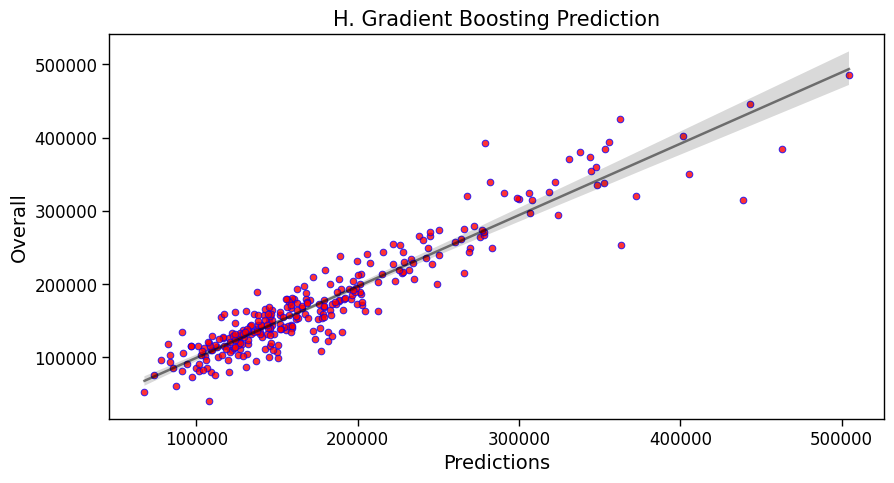

r2 score : 0.879
RMSE : 26846
MAE : 19916


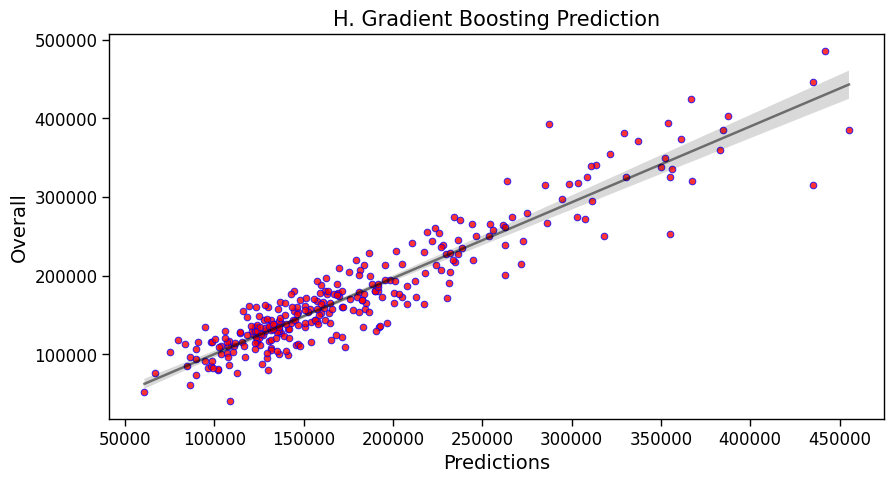

In [ ]:
start = tm.time()
results = model_run(start, HistGradientBoostingRegressor(random_state=0), X_train, X_test, y_train, y_test, 'H. Gradient Boosting', 'Default', 'None')
reg_results_2 = pd.concat([reg_results_2, results])
start = tm.time()
results = model_run(start, HistGradientBoostingRegressor(random_state=0), X_train_MMS, X_test_MMS, y_train, y_test, 'H. Gradient Boosting', 'Default', 'MinMax')
reg_results_2 = pd.concat([reg_results_2, results])
start = tm.time()
results = model_run(start, HistGradientBoostingRegressor(random_state=0), X_train_SS, X_test_SS, y_train, y_test, 'H. Gradient Boosting', 'Default', 'Standard')
reg_results_2 = pd.concat([reg_results_2, results])

HGB_best_params = []

random_grid = {
            "max_iter": [3, 10, 30, 100, 300, 1000],
            "max_leaf_nodes": [2, 5, 10, 20, 50, 100],
            "learning_rate": loguniform(0.01, 1),}

n_iters = 15

start = tm.time()
HGB_random = HGB_optimize(random_grid, n_iters, X_train, y_train, 'None')

results = model_run(start, HGB_random.best_estimator_, X_train, X_test, y_train, y_test, 'H. Gradient Boosting', 'Optimized', 'None')
reg_results_2 = pd.concat([reg_results_2, results])

start = tm.time()
HGB_random = HGB_optimize(random_grid, n_iters, X_train_MMS, y_train, 'MinMax')

results = model_run(start, HGB_random.best_estimator_, X_train_MMS, X_test_MMS, y_train, y_test, 'H. Gradient Boosting', 'Optimized', 'MinMax')
reg_results_2 = pd.concat([reg_results_2, results])

start = tm.time()
HGB_random = HGB_optimize(random_grid, n_iters, X_train_SS, y_train, 'Standard')

results = model_run(start, HGB_random.best_estimator_, X_train_SS, X_test_SS, y_train, y_test, 'H. Gradient Boosting', 'Optimized', 'Standard')
reg_results_2 = pd.concat([reg_results_2, results])

### CatBoost

r2 score : 0.885
RMSE : 26149
MAE : 18320


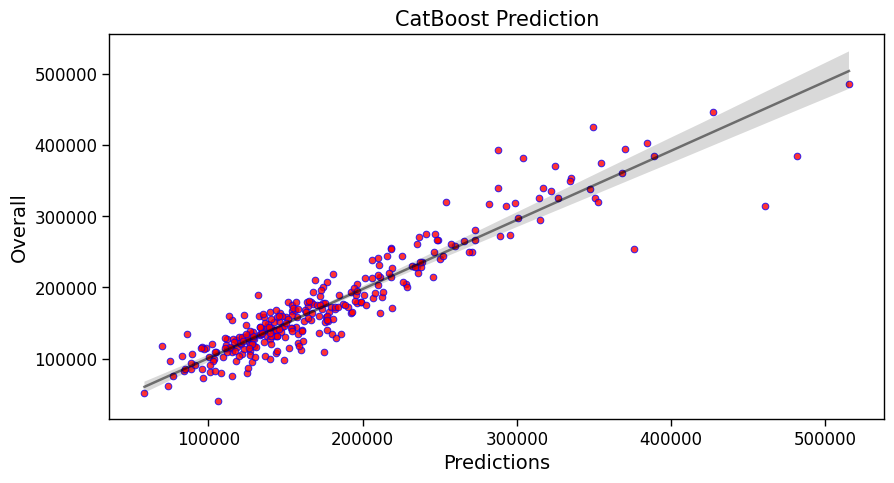

r2 score : 0.885
RMSE : 26144
MAE : 18318


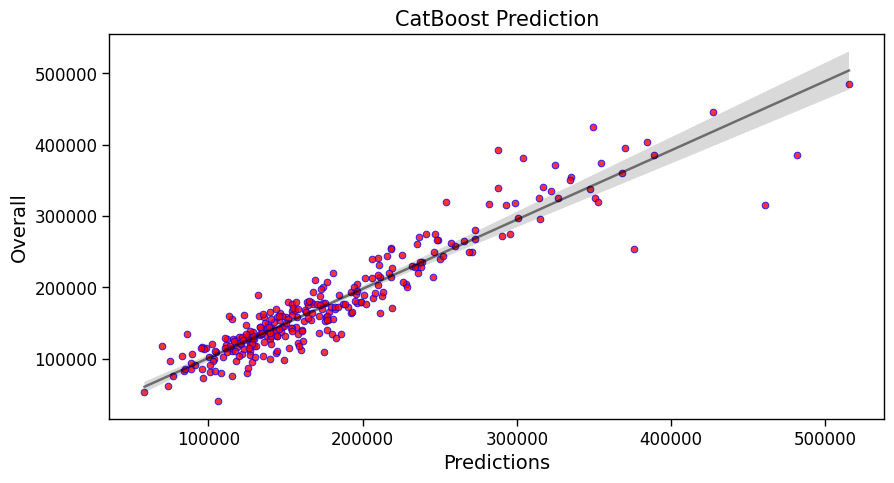

r2 score : 0.885
RMSE : 26131
MAE : 18289


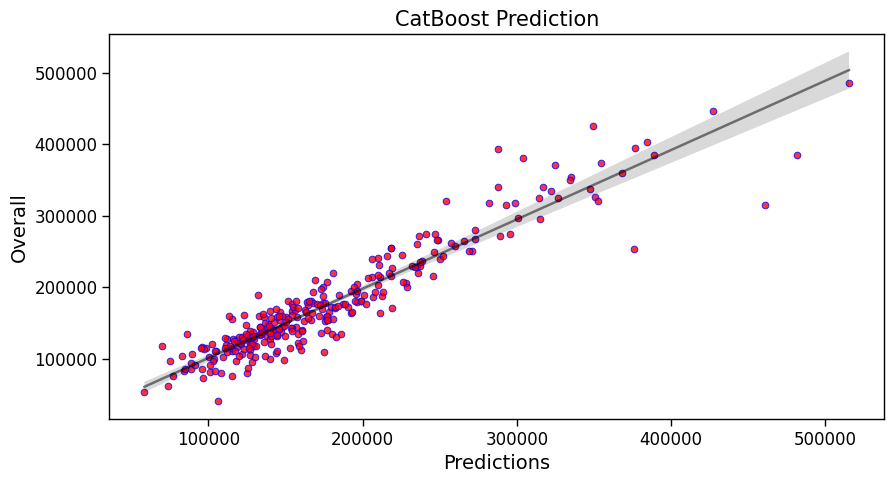


bestTest = 30558.02492
bestIteration = 277


bestTest = 30373.85489
bestIteration = 365


bestTest = 32839.48527
bestIteration = 731


bestTest = 32607.70098
bestIteration = 151


bestTest = 32997.20347
bestIteration = 37

Training on fold [0/3]

bestTest = 27607.18756
bestIteration = 296

Training on fold [1/3]

bestTest = 26399.61871
bestIteration = 179

Training on fold [2/3]

bestTest = 31577.35068
bestIteration = 646

r2 score : 0.885
RMSE : 26144
MAE : 18402


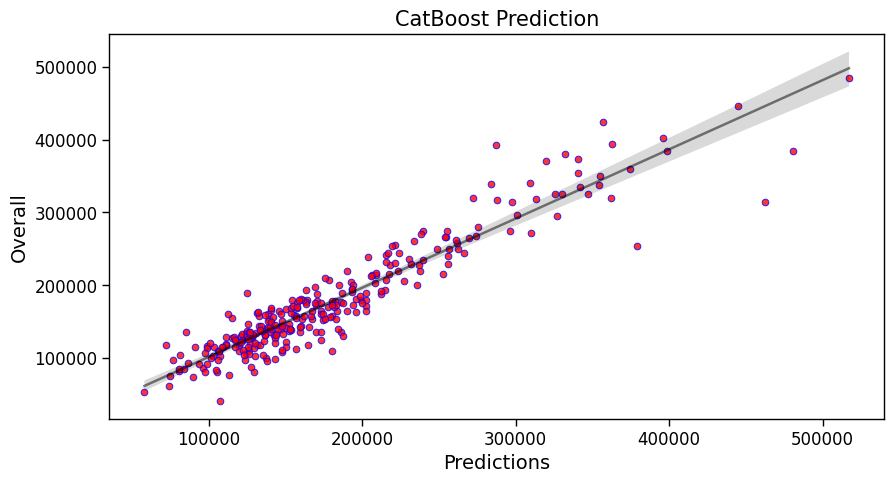

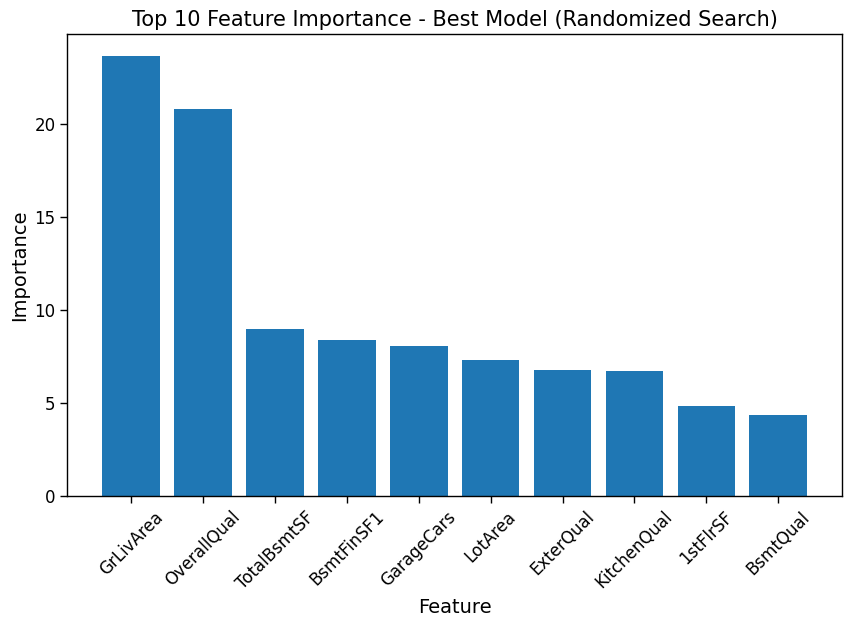

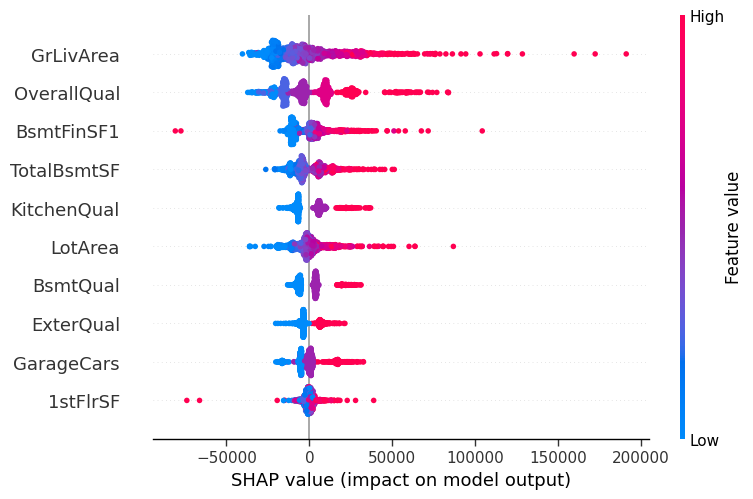


bestTest = 30558.02492
bestIteration = 277


bestTest = 30373.85489
bestIteration = 365


bestTest = 32839.48527
bestIteration = 731


bestTest = 32607.70098
bestIteration = 151


bestTest = 32997.20347
bestIteration = 37

Training on fold [0/3]

bestTest = 27606.87043
bestIteration = 296

Training on fold [1/3]

bestTest = 26399.61871
bestIteration = 179

Training on fold [2/3]

bestTest = 31581.44002
bestIteration = 646

r2 score : 0.885
RMSE : 26141
MAE : 18399


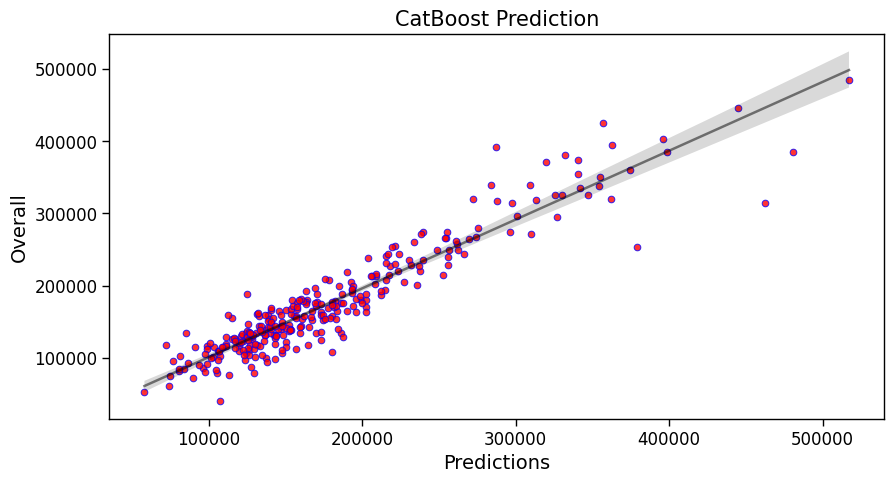

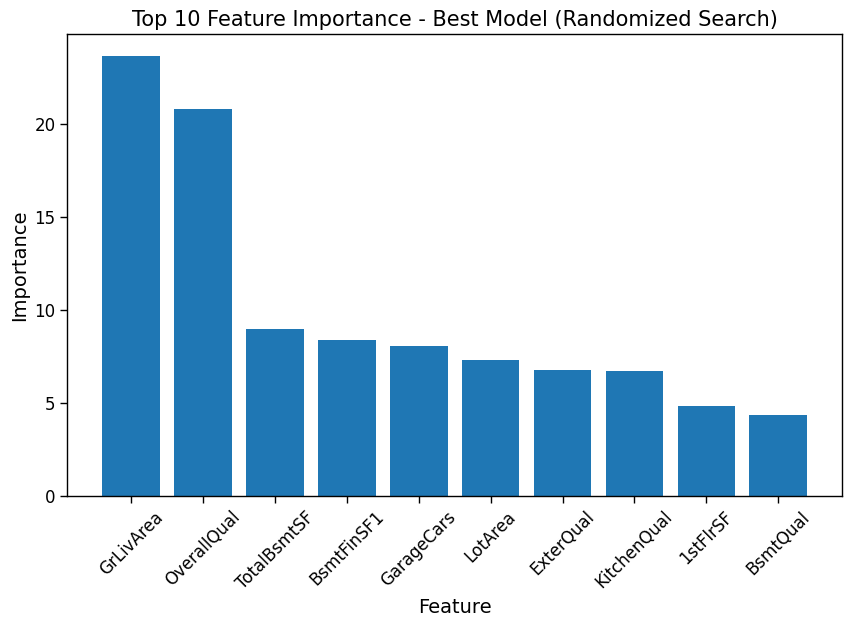

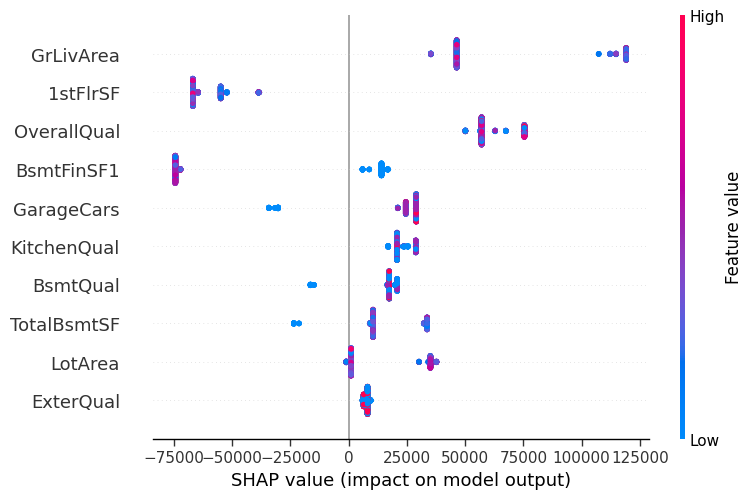


bestTest = 30558.02492
bestIteration = 277


bestTest = 30373.85489
bestIteration = 365


bestTest = 32839.48527
bestIteration = 731


bestTest = 32607.70098
bestIteration = 151


bestTest = 32997.20347
bestIteration = 37

Training on fold [0/3]

bestTest = 27607.18756
bestIteration = 296

Training on fold [1/3]

bestTest = 26404.94163
bestIteration = 179

Training on fold [2/3]

bestTest = 31578.76403
bestIteration = 646

r2 score : -0.087
RMSE : 80353
MAE : 69322


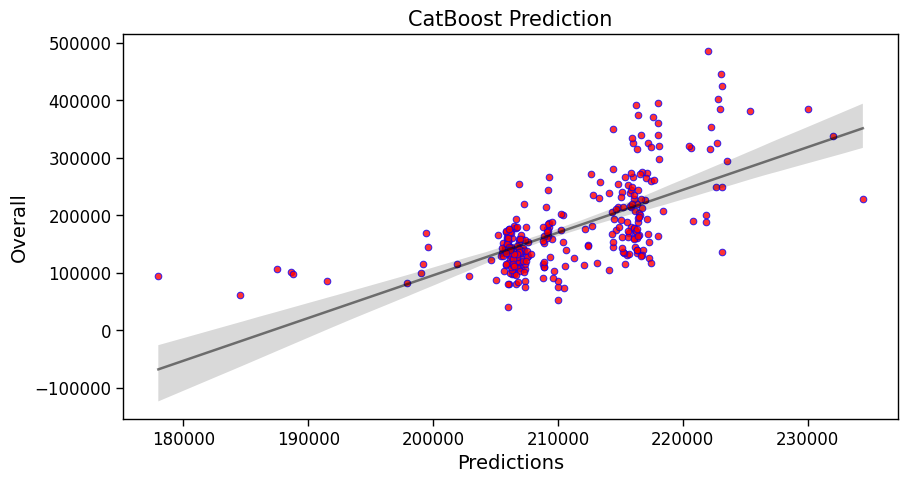

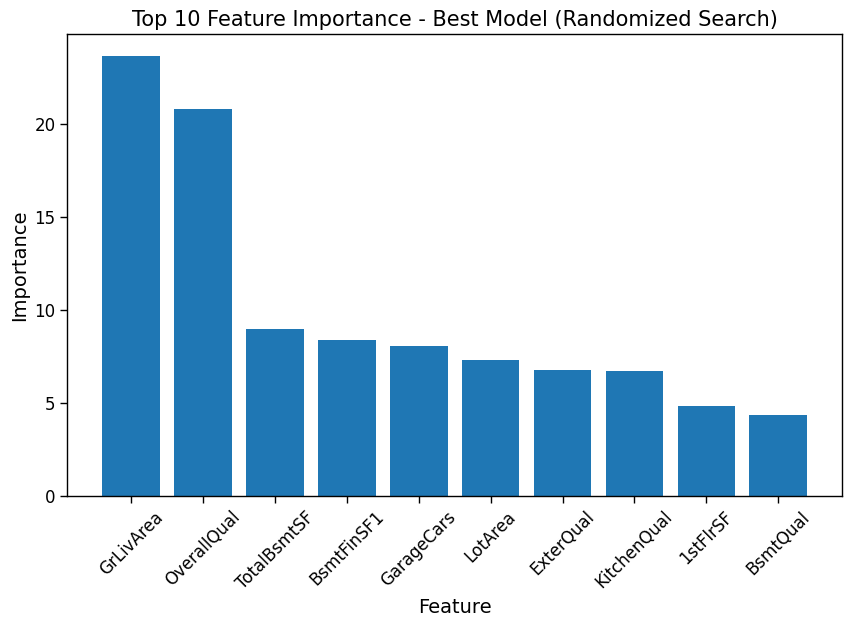

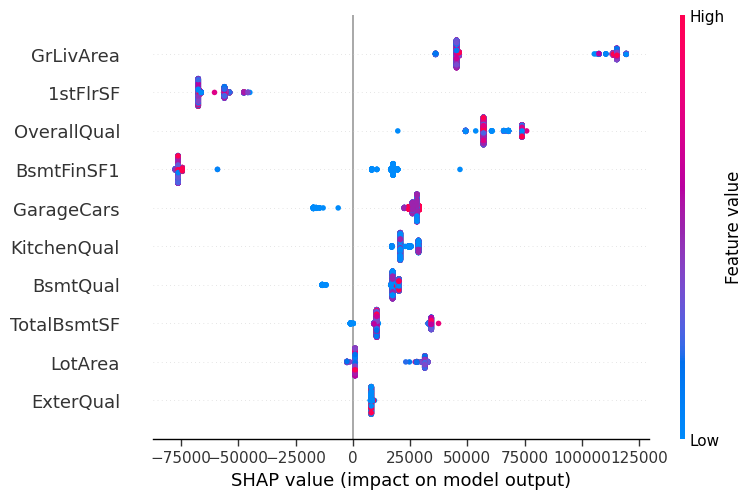

In [ ]:
start = tm.time()
results = model_run(start, CatBoostRegressor(random_state=0, verbose = False), X_train, X_test, y_train, y_test, 'CatBoost', 'Default', 'None')
reg_results_2 = pd.concat([reg_results_2, results])
start = tm.time()
results = model_run(start, CatBoostRegressor(random_state=0, verbose = False), X_train_MMS, X_test_MMS, y_train, y_test, 'CatBoost', 'Default', 'MinMax')
reg_results_2 = pd.concat([reg_results_2, results])
start = tm.time()
results = model_run(start, CatBoostRegressor(random_state=0, verbose = False), X_train_SS, X_test_SS, y_train, y_test, 'CatBoost', 'Default', 'Standard')
reg_results_2 = pd.concat([reg_results_2, results])


CB_best_params = []

random_grid = {'learning_rate': [0.03, 0.1], 'depth': [4, 6, 10], 'l2_leaf_reg': [1, 3, 5, 7, 9]}
n_iters = 5

start = tm.time()
CB_random = CB_optimize(random_grid, n_iters, X_train, y_train)

results = model_run(start, CB_random, X_train, X_test, y_train, y_test, 'CatBoost', 'Optimized', 'None')
reg_results_2 = pd.concat([reg_results_2, results])
save_feature_importance(CB_random, feature_importances_all)

plot_shap(CB_random)

start = tm.time()
CB_random = CB_optimize(random_grid, n_iters, X_train_MMS, y_train)

results = model_run(start, CB_random, X_train_MMS, X_test_MMS, y_train, y_test, 'CatBoost', 'Optimized', 'MinMax')
reg_results_2 = pd.concat([reg_results_2, results])
save_feature_importance(CB_random, feature_importances_all)

plot_shap(CB_random)

start = tm.time()
CB_random = CB_optimize(random_grid, n_iters, X_train_SS, y_train)

results = model_run(start, CB_random, X_train_SS, X_test_MMS, y_train, y_test, 'CatBoost', 'Optimized', 'Standard')
reg_results_2 = pd.concat([reg_results_2, results])
save_feature_importance(CB_random, feature_importances_all)

plot_shap(CB_random)

# Second Pass Results

## Top Features Analysis

In [ ]:
reg_results_10.sort_values(by=['r2'], ascending = False)[:10]

,Model,Parameters,Scaler,Time,r2,RMSE,MAE
0,Gradient Boosting,Optimized,Standard,44.325,0.897,24742,18094
0,Gradient Boosting,Default,Standard,0.190,0.896,24848,18154
0,Gradient Boosting,Default,MinMax,0.205,0.896,24865,18177
0,Gradient Boosting,Default,None,0.251,0.896,24848,18154
0,H. Gradient Boosting,Optimized,None,4.071,0.893,25235,18196
0,Polynomial,Default,Standard,0.019,0.893,25234,18731
0,Polynomial,Default,MinMax,0.021,0.893,25234,18731
0,Polynomial,Default,None,0.021,0.893,25234,18731
0,H. Gradient Boosting,Default,Standard,0.503,0.892,25376,17961
0,Gradient Boosting,Optimized,MinMax,37.594,0.892,25305,18150


In [ ]:
reg_results_30.sort_values(by=['r2'], ascending = False)[:10]

,Model,Parameters,Scaler,Time,r2,RMSE,MAE
0,CatBoost,Optimized,MinMax,20.425,0.918,22124,15449
0,CatBoost,Optimized,None,20.086,0.918,22122,15448
0,CatBoost,Default,Standard,2.475,0.917,22176,15298
0,CatBoost,Default,MinMax,2.340,0.917,22166,15299
0,CatBoost,Default,None,2.752,0.917,22169,15302
0,Gradient Boosting,Default,Standard,0.342,0.914,22655,16132
0,Gradient Boosting,Default,MinMax,0.358,0.914,22660,16141
0,Gradient Boosting,Default,None,0.398,0.914,22660,16141
0,Gradient Boosting,Optimized,Standard,90.873,0.914,22579,16189
0,Gradient Boosting,Optimized,MinMax,118.249,0.912,22826,16007


In [ ]:
reg_results_2.sort_values(by=['r2'], ascending = False)[:10]

,Model,Parameters,Scaler,Time,r2,RMSE,MAE
0,CatBoost,Default,Standard,3.249,0.928,20639,14253
0,CatBoost,Default,MinMax,3.137,0.928,20629,14246
0,CatBoost,Default,None,4.204,0.928,20629,14245
0,CatBoost,Optimized,MinMax,27.116,0.924,21197,14891
0,CatBoost,Optimized,None,28.246,0.924,21197,14891
0,Gradient Boosting,Optimized,MinMax,99.140,0.919,21983,15645
0,Gradient Boosting,Optimized,None,101.405,0.917,22226,15691
0,Gradient Boosting,Default,Standard,0.513,0.916,22315,15632
0,Gradient Boosting,Default,MinMax,0.474,0.916,22297,15632
0,Gradient Boosting,Default,None,0.500,0.916,22293,15628


In [ ]:
reg_results.sort_values(by=['r2'], ascending = False)[:10]

,Model,Parameters,Scaler,Time,r2,RMSE,MAE
0,CatBoost,Optimized,None,35.485,0.925,21110,15088
0,CatBoost,Optimized,MinMax,35.476,0.925,21110,15088
0,CatBoost,Default,None,4.837,0.924,21279,14534
0,CatBoost,Default,MinMax,4.458,0.924,21282,14539
0,CatBoost,Default,Standard,4.475,0.924,21274,14527
0,Gradient Boosting,Optimized,MinMax,67.745,0.918,22098,15286
0,Gradient Boosting,Default,None,0.769,0.916,22382,15776
0,Gradient Boosting,Default,MinMax,0.844,0.916,22382,15776
0,Gradient Boosting,Default,Standard,0.734,0.916,22382,15775
0,Gradient Boosting,Optimized,None,110.697,0.915,22464,15469


In [ ]:
r2_mean = np.round(reg_results.sort_values(by=['r2'], ascending = False)[:10]['r2'].mean(), 3)
r2_mean_50 = np.round(reg_results_2.sort_values(by=['r2'], ascending = False)[:10]['r2'].mean(), 3)
RMSE_mean = int(reg_results.sort_values(by=['RMSE'], ascending = True)[:10]['RMSE'].mean())
RMSE_mean_50 = int(reg_results_2.sort_values(by=['RMSE'], ascending = True)[:10]['RMSE'].mean())
MAE_mean = int(reg_results.sort_values(by=['MAE'], ascending = True)[:10]['MAE'].mean())
MAE_mean_50 = int(reg_results_2.sort_values(by=['MAE'], ascending = True)[:10]['MAE'].mean())
r2_mean_30 = np.round(reg_results_30.sort_values(by=['r2'], ascending = False)[:10]['r2'].mean(), 3)
r2_mean_10 = np.round(reg_results_10.sort_values(by=['r2'], ascending = False)[:10]['r2'].mean(), 3)
RMSE_mean_30 = int(reg_results_30.sort_values(by=['RMSE'], ascending = True)[:10]['RMSE'].mean())
RMSE_mean_10 = int(reg_results_10.sort_values(by=['RMSE'], ascending = True)[:10]['RMSE'].mean())
MAE_mean_30 = int(reg_results_30.sort_values(by=['MAE'], ascending = True)[:10]['MAE'].mean())
MAE_mean_10 = int(reg_results_10.sort_values(by=['MAE'], ascending = True)[:10]['MAE'].mean())
time_mean = np.round(reg_results['Time'].mean(), 3)
time_mean_10 = np.round(reg_results_10['Time'].mean(), 3)
time_mean_30 = np.round(reg_results_30['Time'].mean(), 3)
time_mean_50 = np.round(reg_results_2['Time'].mean(), 3)

In [ ]:
print(f'Coefficient of Determination \n{"-"*100}\nAll features : {r2_mean}\nTop 50 Features : {r2_mean_50}\nTop 30 Features : {r2_mean_30}\nTop 10 Features : {r2_mean_10}\n')
print(f'RMSE \n{"-"*100}\nAll features : {RMSE_mean}\nTop 50 Features : {RMSE_mean_50}\nTop 30 Features : {RMSE_mean_30}\nTop 10 Features : {RMSE_mean_10}\n')
print(f'MAE \n{"-"*100}\nAll features : {MAE_mean}\nTop 50 Features : {MAE_mean_50}\nTop 30 Features : {MAE_mean_30}\nTop 10 Features : {MAE_mean_10}\n')
print(f'Proccessing Time \n{"-"*100}\nAll features : {time_mean}\nTop 50 Features : {time_mean_50}\nTop 30 Features : {time_mean_30}\nTop 10 Features : {time_mean_10}\n')

Coefficient of Determination 
----------------------------------------------------------------------------------------------------
All features : 0.92
Top 50 Features : 0.922
Top 30 Features : 0.916
Top 10 Features : 0.894

RMSE 
----------------------------------------------------------------------------------------------------
All features : 21776
Top 50 Features : 21540
Top 30 Features : 22413
Top 10 Features : 25092

MAE 
----------------------------------------------------------------------------------------------------
All features : 15185
Top 50 Features : 15075
Top 30 Features : 15740
Top 10 Features : 18111

Proccessing Time 
----------------------------------------------------------------------------------------------------
All features : 37.799
Top 50 Features : 16.565
Top 30 Features : 15.039
Top 10 Features : 8.911



In [ ]:
feature_analysis = pd.DataFrame({'Number of Features': [X_train_copy.shape[1], 50, 30, 10],
                                 'r2': [r2_mean, r2_mean_50, r2_mean_30, r2_mean_10],
                                 'RMSE': [RMSE_mean, RMSE_mean_50, RMSE_mean_30, RMSE_mean_10],
                                 'MAE': [MAE_mean, MAE_mean_50, MAE_mean_30, MAE_mean_10],
                                 'Proccessing Time': [time_mean, time_mean_50, time_mean_30, time_mean_10]})

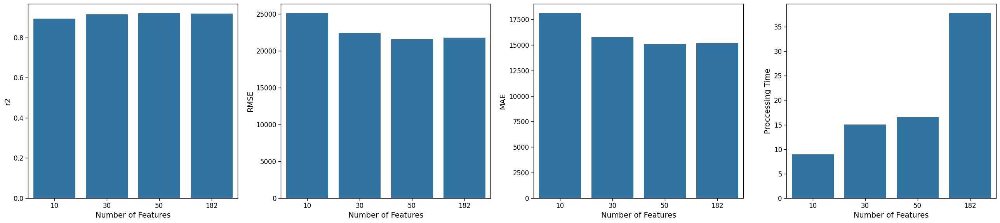

In [ ]:
fig, axs = plt.subplots (1, 4, figsize=(26, 6))
sns.barplot(data = feature_analysis, x = "Number of Features", y= "r2", ax=axs[0])
sns.barplot(data = feature_analysis, x = "Number of Features", y= "RMSE", ax=axs[1])
sns.barplot(data = feature_analysis, x = "Number of Features", y= "MAE", ax=axs[2])
sns.barplot(data = feature_analysis, x = "Number of Features", y= "Proccessing Time", ax=axs[3])
plt.tight_layout()
plt.show()

## Performance Results

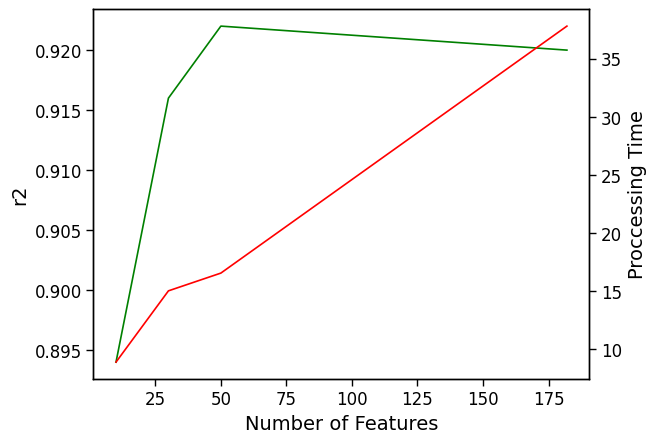

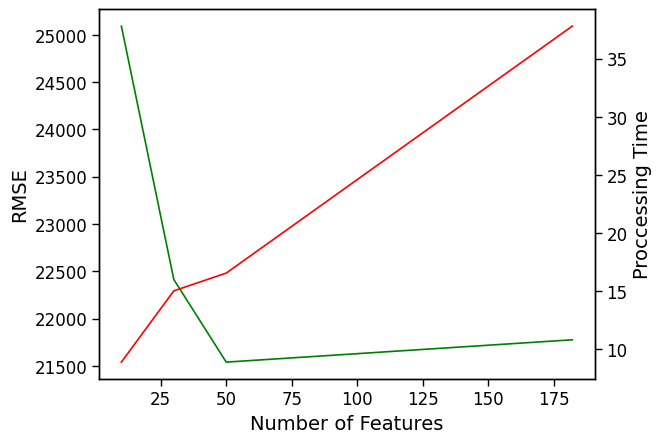

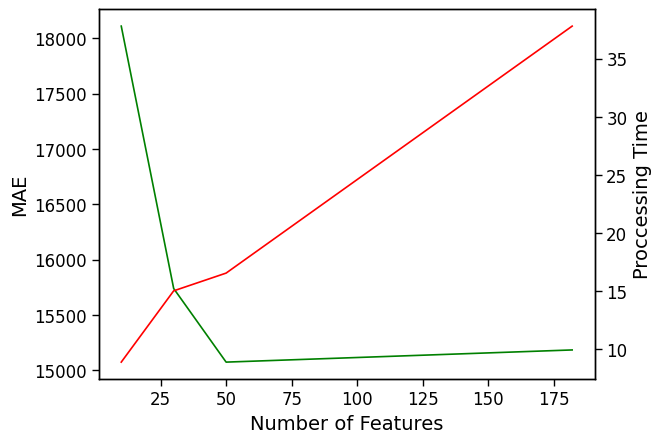

In [ ]:
sns.lineplot(data = feature_analysis, x = 'Number of Features', y = 'r2', color = 'g')
sns.lineplot(data = feature_analysis, x = 'Number of Features', y = 'Proccessing Time', ax = plt.twinx(), color = 'r')
plt.show()
sns.lineplot(data = feature_analysis, x = 'Number of Features', y = 'RMSE', color = 'g')
sns.lineplot(data = feature_analysis, x = 'Number of Features', y = 'Proccessing Time', ax = plt.twinx(), color = 'r')
plt.show()
sns.lineplot(data = feature_analysis, x = 'Number of Features', y = 'MAE', color = 'g')
sns.lineplot(data = feature_analysis, x = 'Number of Features', y = 'Proccessing Time', ax = plt.twinx(), color = 'r')
plt.show()

   Number of Features    r2      RMSE       MAE  Proccessing Time
0                  10 0.882 26509.667 19136.667            20.831
0                  30 0.902 24175.000 17179.000            32.693
0                  50 0.909 23296.333 16413.000            39.423
0                 182 0.908 23321.333 16343.000            61.563


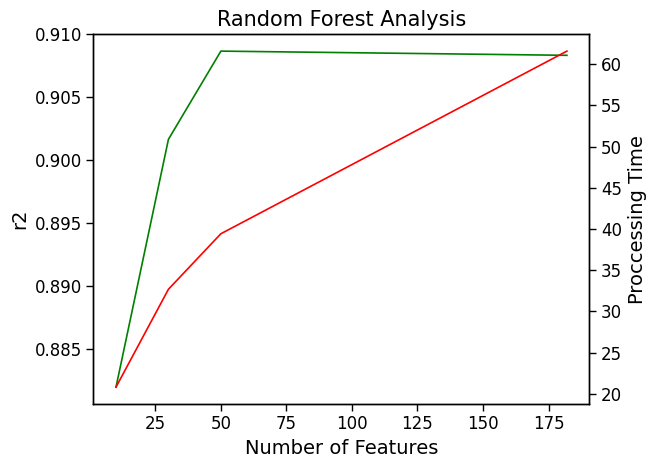

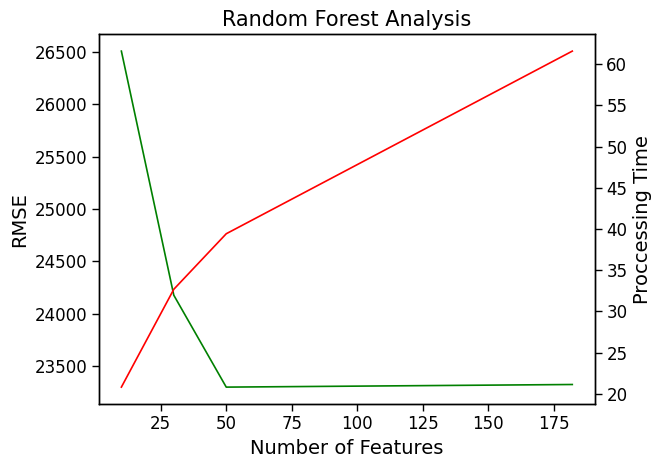

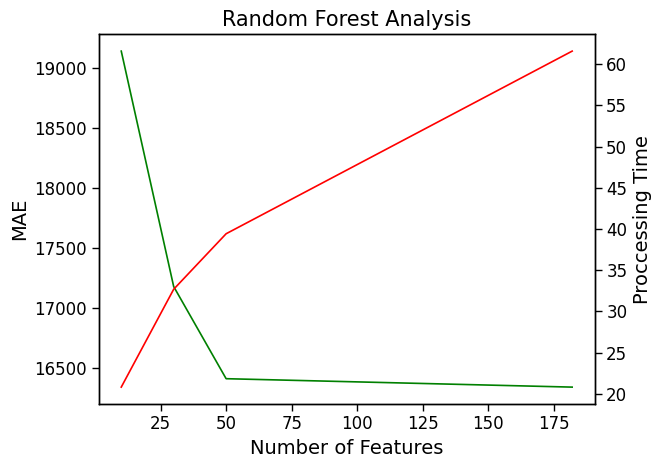

   Number of Features    r2      RMSE       MAE  Proccessing Time
0                  10 0.890 25524.333 18338.000            47.218
0                  30 0.912 22880.000 16143.000            95.585
0                  50 0.916 22404.000 15837.667            93.235
0                 182 0.914 22660.000 15573.667            85.195


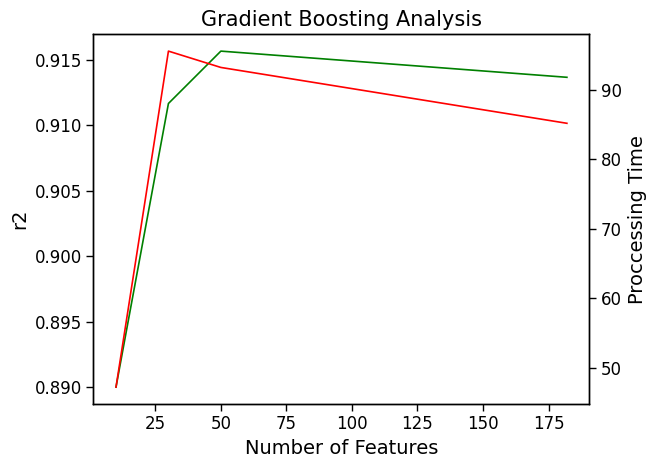

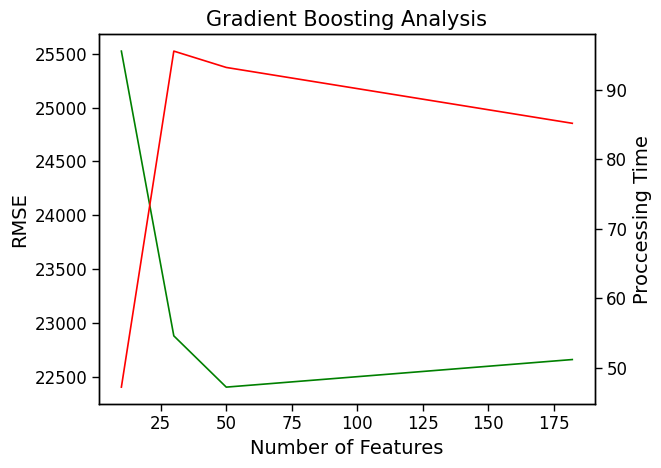

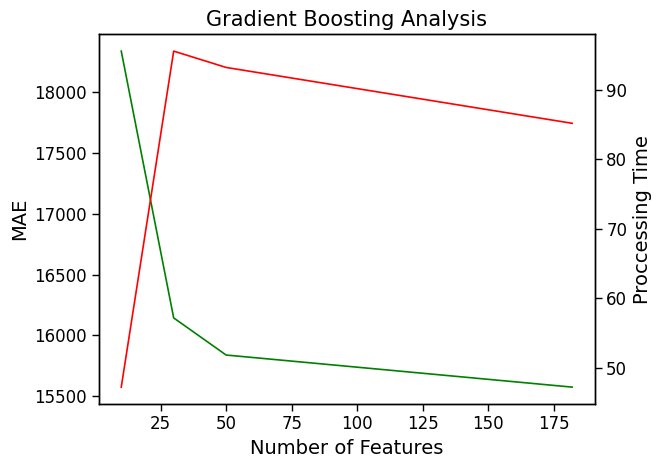

   Number of Features    r2      RMSE       MAE  Proccessing Time
0                  10 0.887 25918.667 18848.000             6.731
0                  30 0.909 23327.000 16573.333            15.836
0                  50 0.907 23542.000 16220.333            16.077
0                 182 0.907 23506.333 16232.667           201.296


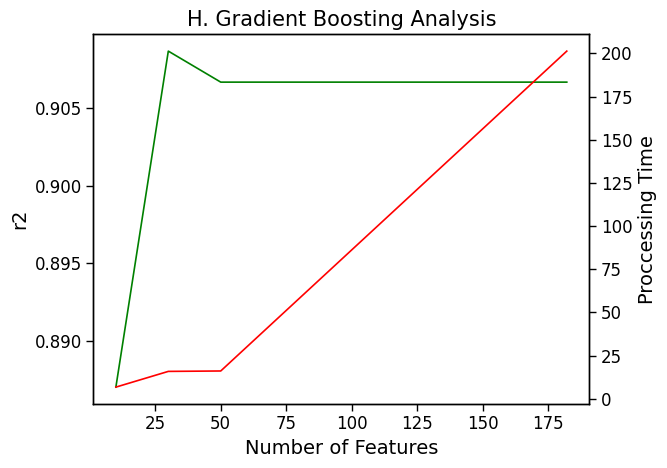

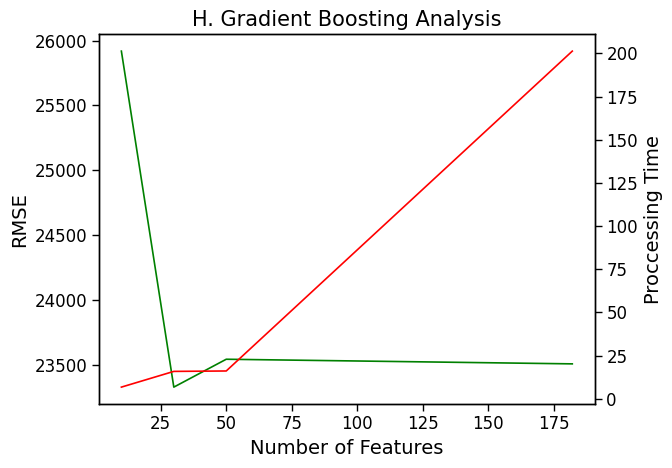

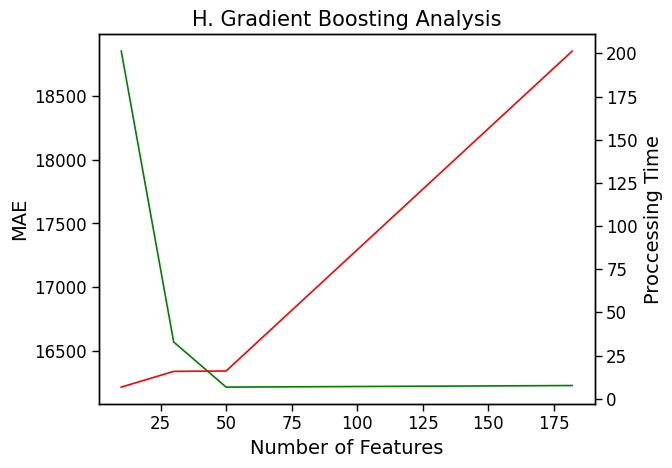

   Number of Features    r2      RMSE       MAE  Proccessing Time
0                  10 0.561 44212.667 35374.333            11.182
0                  30 0.596 41029.667 33187.667            19.911
0                  50 0.611 39991.333 32422.333            27.178
0                 182 0.619 39676.000 32116.333            36.235


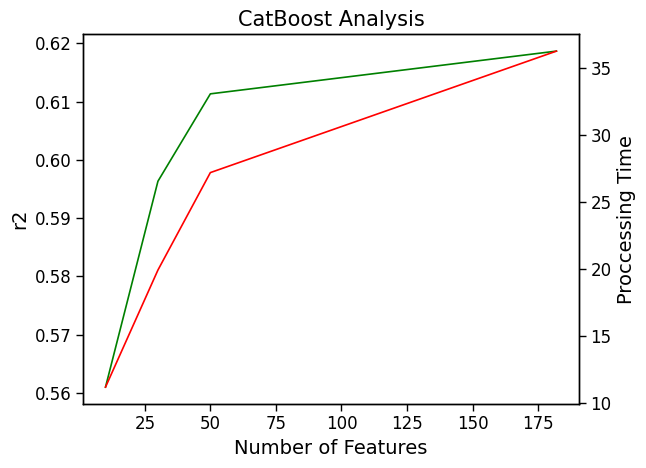

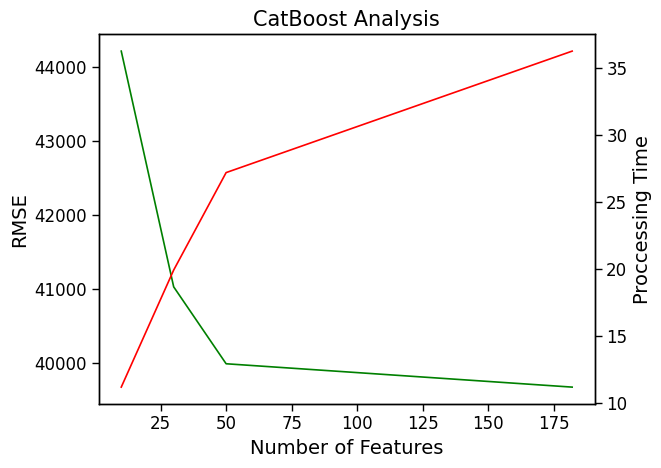

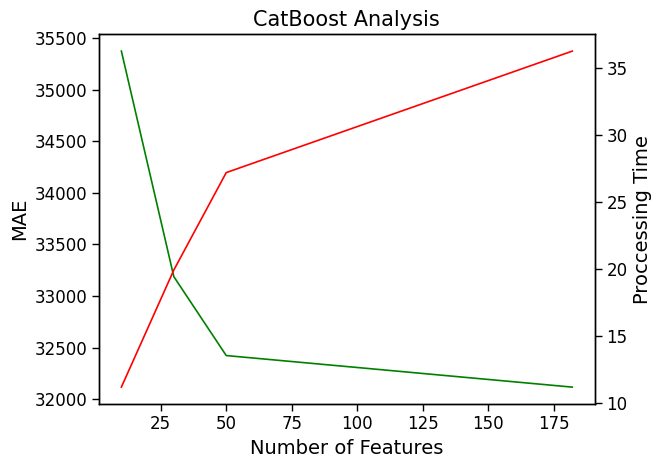

In [ ]:
for model in ['Random Forest', 'Gradient Boosting', 'H. Gradient Boosting', 'CatBoost']:
    feature_analysis_2 = pd.DataFrame([])
    for results, n in zip([reg_results_10, reg_results_30, reg_results_2, reg_results], [10, 30, 50, X_train_copy.shape[1]]):
        feature_analysis_temp = pd.DataFrame(pd.json_normalize({'Number of Features': n,
                                            'r2': results[(results['Model'] == model) & (results['Parameters'] == 'Optimized')]['r2'].mean(),
                                            'RMSE': results[(results['Model'] == model) & (results['Parameters'] == 'Optimized')]['RMSE'].mean(),
                                            'MAE': results[(results['Model'] == model) & (results['Parameters'] == 'Optimized')]['MAE'].mean(),
                                            'Proccessing Time': results[(results['Model'] == model) & (results['Parameters'] == 'Optimized')]['Time'].mean()}))

        feature_analysis_2 = pd.concat([feature_analysis_2, feature_analysis_temp])
    print(feature_analysis_2)


    plt.title(f'{model} Analysis')
    sns.lineplot(data = feature_analysis_2, x = 'Number of Features', y = 'r2', color = 'g')
    sns.lineplot(data = feature_analysis_2, x = 'Number of Features', y = 'Proccessing Time', color = 'r', ax = plt.twinx())
    plt.show()
    plt.title(f'{model} Analysis')
    sns.lineplot(data = feature_analysis_2, x = 'Number of Features', y = 'RMSE', color = 'g')
    sns.lineplot(data = feature_analysis_2, x = 'Number of Features', y = 'Proccessing Time', color = 'r', ax = plt.twinx())
    plt.show()
    plt.title(f'{model} Analysis')
    sns.lineplot(data = feature_analysis_2, x = 'Number of Features', y = 'MAE', color = 'g')
    sns.lineplot(data = feature_analysis_2, x = 'Number of Features', y = 'Proccessing Time', color = 'r', ax = plt.twinx())
    plt.show()

In [ ]:
RF_results = pd.DataFrame([])

for feature_n in np.arange(2, X_train_SS_copy.shape[1]):
    top_feature_indices = sorted_idx[:feature_n]
    top_feature_names = feature_names[top_feature_indices]
    X_train_SS = X_train_SS_copy.copy()
    X_test_SS = X_test_SS_copy.copy()
    X_train_SS = X_train_SS[top_feature_names]
    X_test_SS = X_test_SS[top_feature_names]

    start = tm.time()
    alg_model = RandomForestRegressor(random_state=0)
    alg_model.fit(X_train_SS, y_train)
    y_pred = alg_model.predict(X_test_SS)
    total = tm.time() - start
    model_results = pd.DataFrame(pd.json_normalize({'Number of Features': feature_n,
                                'r2':   np.round(r2_score(y_test, y_pred),3),
                                'RMSE': int(np.sqrt(mean_squared_error(y_test, y_pred))),
                                'MAE':  int(mean_absolute_error(y_test, y_pred)),
                                'Proccessing Time': total}))

    RF_results = pd.concat([RF_results, model_results])

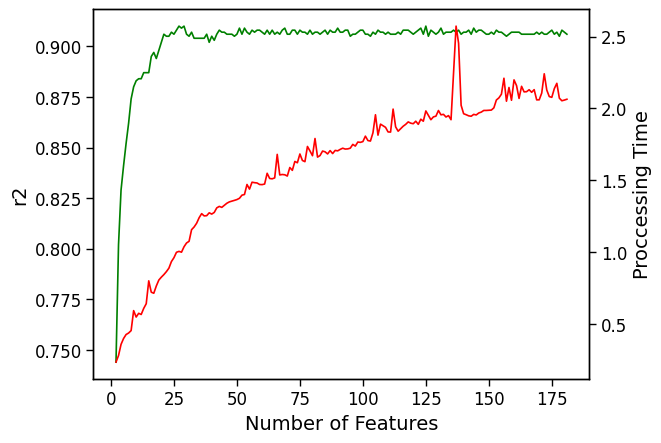

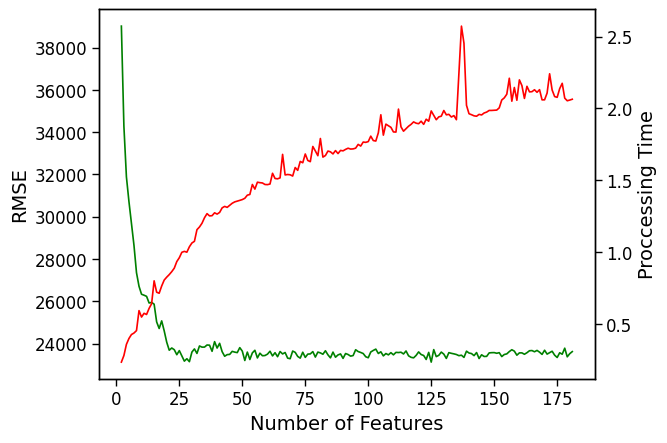

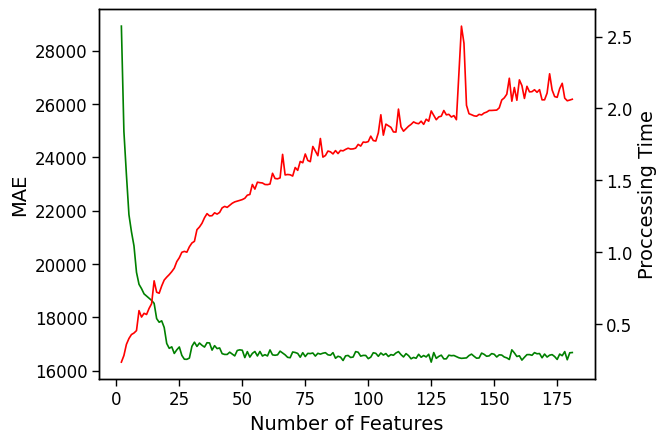

In [ ]:
sns.lineplot(data = RF_results, x = 'Number of Features', y = 'r2', color = 'g')
sns.lineplot(data = RF_results, x = 'Number of Features', y = 'Proccessing Time', ax = plt.twinx(), color = 'r')
plt.show()
sns.lineplot(data = RF_results, x = 'Number of Features', y = 'RMSE', color = 'g')
sns.lineplot(data = RF_results, x = 'Number of Features', y = 'Proccessing Time', ax = plt.twinx(), color = 'r')
plt.show()
sns.lineplot(data = RF_results, x = 'Number of Features', y = 'MAE', color = 'g')
sns.lineplot(data = RF_results, x = 'Number of Features', y = 'Proccessing Time', ax = plt.twinx(), color = 'r')
plt.show()

In [ ]:
GB_results = pd.DataFrame([])

for feature_n in np.arange(2, X_train_SS_copy.shape[1]):
    top_feature_indices = sorted_idx[:feature_n]
    top_feature_names = feature_names[top_feature_indices]
    X_train_SS = X_train_SS_copy.copy()
    X_test_SS = X_test_SS_copy.copy()
    X_train_SS = X_train_SS[top_feature_names]
    X_test_SS = X_test_SS[top_feature_names]

    start = tm.time()
    alg_model = GradientBoostingRegressor(random_state=0)
    alg_model.fit(X_train_SS, y_train)
    y_pred = alg_model.predict(X_test_SS)
    total = tm.time() - start
    model_results = pd.DataFrame(pd.json_normalize({'Number of Features': feature_n,
                                'r2':   np.round(r2_score(y_test, y_pred),3),
                                'RMSE': int(np.sqrt(mean_squared_error(y_test, y_pred))),
                                'MAE':  int(mean_absolute_error(y_test, y_pred)),
                                'Proccessing Time': total}))

    GB_results = pd.concat([GB_results, model_results])

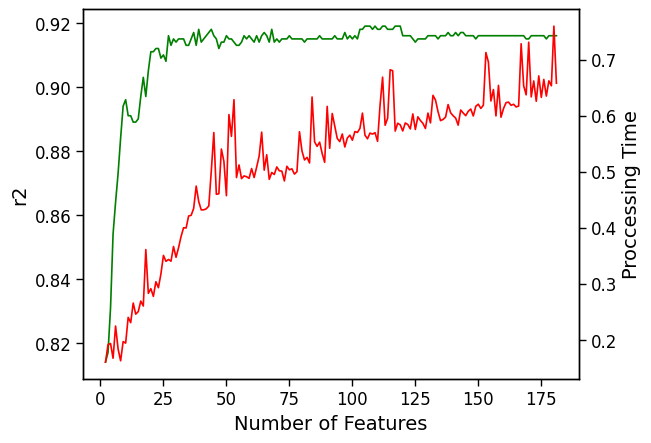

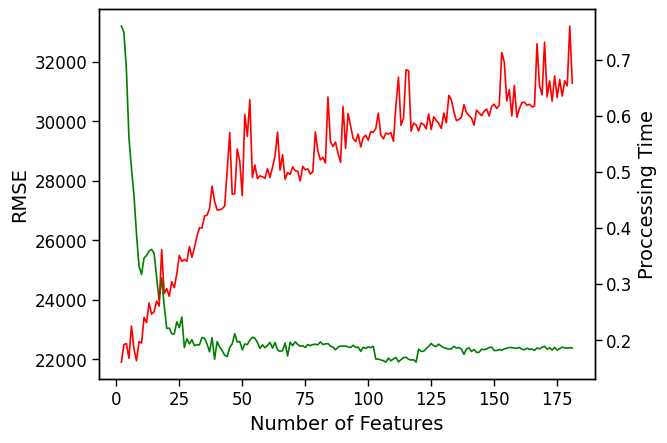

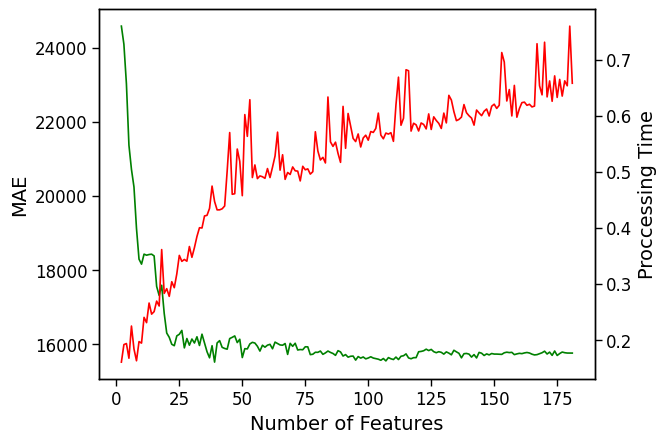

In [ ]:
sns.lineplot(data = GB_results, x = 'Number of Features', y = 'r2', color = 'g')
sns.lineplot(data = GB_results, x = 'Number of Features', y = 'Proccessing Time', ax = plt.twinx(), color = 'r')
plt.show()
sns.lineplot(data = GB_results, x = 'Number of Features', y = 'RMSE', color = 'g')
sns.lineplot(data = GB_results, x = 'Number of Features', y = 'Proccessing Time', ax = plt.twinx(), color = 'r')
plt.show()
sns.lineplot(data = GB_results, x = 'Number of Features', y = 'MAE', color = 'g')
sns.lineplot(data = GB_results, x = 'Number of Features', y = 'Proccessing Time', ax = plt.twinx(), color = 'r')
plt.show()

In [ ]:
HGB_results = pd.DataFrame([])

for feature_n in np.arange(2, X_train_SS_copy.shape[1]):
    top_feature_indices = sorted_idx[:feature_n]
    top_feature_names = feature_names[top_feature_indices]
    X_train_SS = X_train_SS_copy.copy()
    X_test_SS = X_test_SS_copy.copy()
    X_train_SS = X_train_SS[top_feature_names]
    X_test_SS = X_test_SS[top_feature_names]

    start = tm.time()
    alg_model = HistGradientBoostingRegressor(random_state=0)
    alg_model.fit(X_train_SS, y_train)
    y_pred = alg_model.predict(X_test_SS)
    total = tm.time() - start
    model_results = pd.DataFrame(pd.json_normalize({'Number of Features': feature_n,
                                'r2':   np.round(r2_score(y_test, y_pred),3),
                                'RMSE': int(np.sqrt(mean_squared_error(y_test, y_pred))),
                                'MAE':  int(mean_absolute_error(y_test, y_pred)),
                                'Proccessing Time': total}))

    HGB_results = pd.concat([HGB_results, model_results])

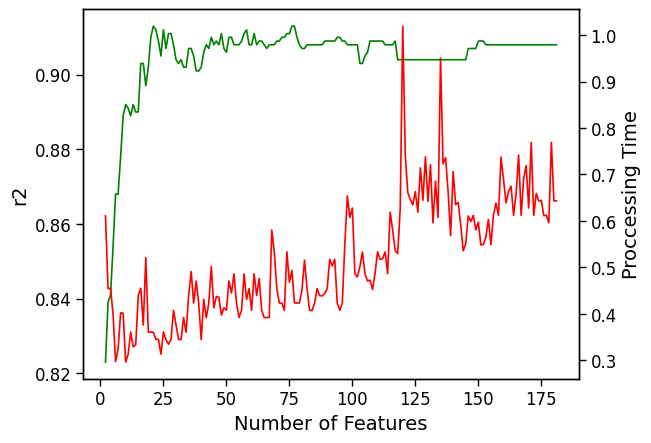

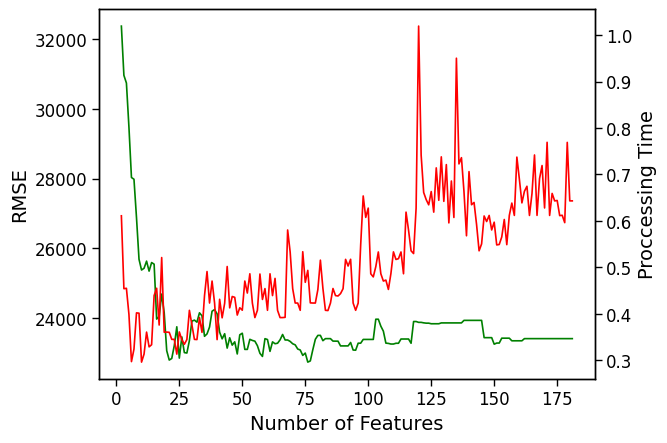

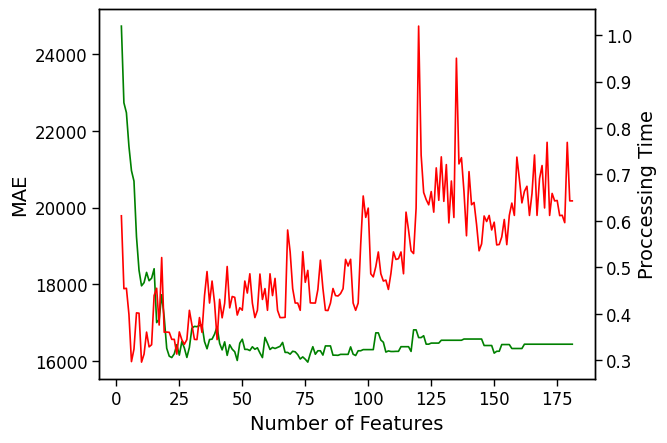

In [ ]:
sns.lineplot(data = HGB_results, x = 'Number of Features', y = 'r2', color = 'g')
sns.lineplot(data = HGB_results, x = 'Number of Features', y = 'Proccessing Time', ax = plt.twinx(), color = 'r')
plt.show()
sns.lineplot(data = HGB_results, x = 'Number of Features', y = 'RMSE', color = 'g')
sns.lineplot(data = HGB_results, x = 'Number of Features', y = 'Proccessing Time', ax = plt.twinx(), color = 'r')
plt.show()
sns.lineplot(data = HGB_results, x = 'Number of Features', y = 'MAE', color = 'g')
sns.lineplot(data = HGB_results, x = 'Number of Features', y = 'Proccessing Time', ax = plt.twinx(), color = 'r')
plt.show()

In [ ]:
CB_results = pd.DataFrame([])

for feature_n in np.arange(2, X_train_SS_copy.shape[1]):
    top_feature_indices = sorted_idx[:feature_n]
    top_feature_names = feature_names[top_feature_indices]
    X_train_SS = X_train_SS_copy.copy()
    X_test_SS = X_test_SS_copy.copy()
    X_train_SS = X_train_SS[top_feature_names]
    X_test_SS = X_test_SS[top_feature_names]

    start = tm.time()
    alg_model = CatBoostRegressor(random_state=0, verbose = False, iterations = 200)
    alg_model.fit(X_train_SS, y_train)
    y_pred = alg_model.predict(X_test_SS)
    total = tm.time() - start
    model_results = pd.DataFrame(pd.json_normalize({'Number of Features': feature_n,
                                'r2':   np.round(r2_score(y_test, y_pred),3),
                                'RMSE': int(np.sqrt(mean_squared_error(y_test, y_pred))),
                                'MAE':  int(mean_absolute_error(y_test, y_pred)),
                                'Proccessing Time': total}))

    CB_results = pd.concat([CB_results, model_results])

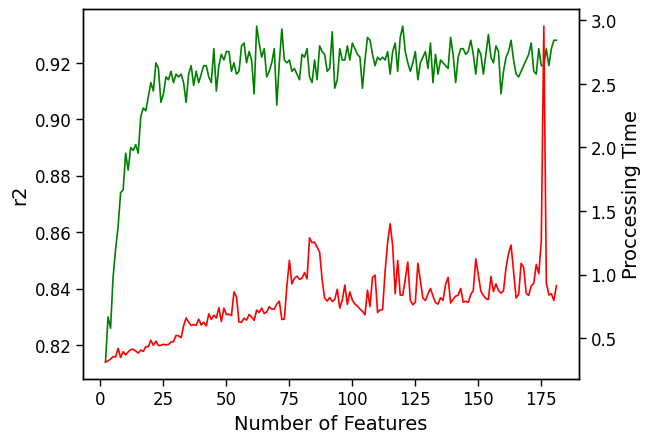

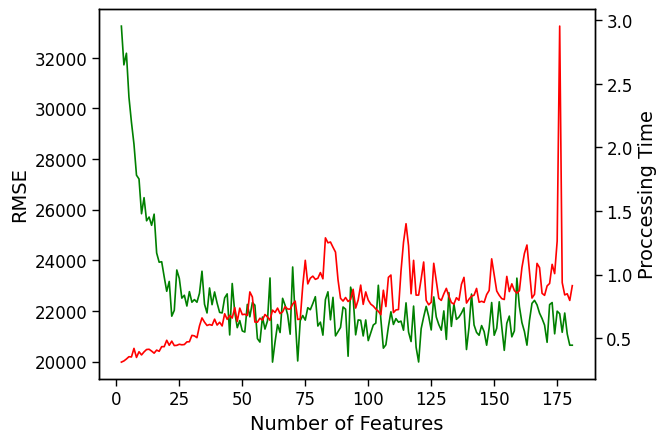

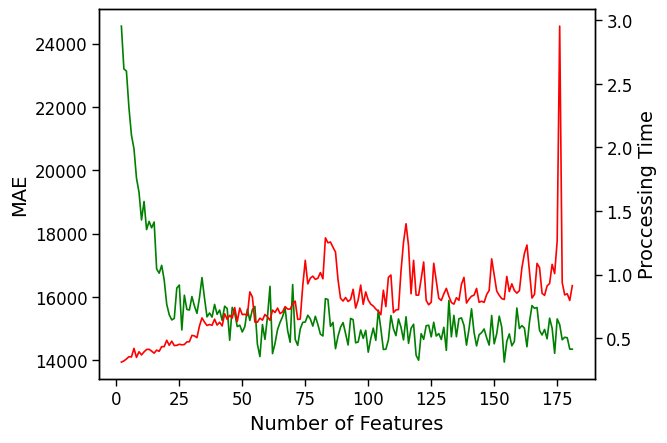

In [ ]:
sns.lineplot(data = CB_results, x = 'Number of Features', y = 'r2', color = 'g')
sns.lineplot(data = CB_results, x = 'Number of Features', y = 'Proccessing Time', ax = plt.twinx(), color = 'r')
plt.show()
sns.lineplot(data = CB_results, x = 'Number of Features', y = 'RMSE', color = 'g')
sns.lineplot(data = CB_results, x = 'Number of Features', y = 'Proccessing Time', ax = plt.twinx(), color = 'r')
plt.show()
sns.lineplot(data = CB_results, x = 'Number of Features', y = 'MAE', color = 'g')
sns.lineplot(data = CB_results, x = 'Number of Features', y = 'Proccessing Time', ax = plt.twinx(), color = 'r')
plt.show()

In [ ]:
print(f'Default Parameters and Random State 0.\n{"-"*100}')
for results, model in zip([RF_results, GB_results, HGB_results, CB_results], ['Random Forest', 'Gradient Boosting', 'H. Gradient Boosting', 'CatBoost']):
    RMSE = results.sort_values(by=['RMSE'], ascending = True)[:1][['Number of Features', 'Proccessing Time']]
    MAE = results.sort_values(by=['MAE'], ascending = True)[:1][['Number of Features', 'Proccessing Time']]
    r2 = results.sort_values(by=['r2'], ascending = False)[:1][['Number of Features', 'Proccessing Time']]
    print(f'{model}\n{"-"*100}\nOptimal Number of Features for:\n\nRMSE of {int(results.sort_values(by=["RMSE"], ascending = True)[:1]["RMSE"])}: {RMSE["Number of Features"][0]} Features --- Proccessing Time: {np.round(RMSE["Proccessing Time"][0], 3)} s\nMAE of {int(results.sort_values(by=["MAE"], ascending = True)[:1]["MAE"])}: {MAE["Number of Features"][0]} Features --- Proccessing Time: {np.round(MAE["Proccessing Time"][0], 3)} s\nr2 of {np.round(results.sort_values(by=["r2"], ascending = False)[:1]["r2"][0], 3)}: {r2["Number of Features"][0]} Features --- Proccessing Time: {np.round(r2["Proccessing Time"][0], 3)} s\n{"-"*100}\n')

Default Parameters and Random State 0.
----------------------------------------------------------------------------------------------------
Random Forest
----------------------------------------------------------------------------------------------------
Optimal Number of Features for:

RMSE of 23119: 125 Features --- Proccessing Time: 1.983 s
MAE of 16325: 125 Features --- Proccessing Time: 1.983 s
r2 of 0.91: 29 Features --- Proccessing Time: 1.039 s
----------------------------------------------------------------------------------------------------

Gradient Boosting
----------------------------------------------------------------------------------------------------
Optimal Number of Features for:

RMSE of 21903: 107 Features --- Proccessing Time: 0.569 s
MAE of 15509: 39 Features --- Proccessing Time: 0.447 s
r2 of 0.919: 109 Features --- Proccessing Time: 0.57 s
----------------------------------------------------------------------------------------------------

H. Gradient Boosti

# END